## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 24-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+3_24H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 02:41:29.744203: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 24
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  24


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 24, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 24, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 24, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 24, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 24)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              25 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,394 (1.26 MB)

 Trainable params: 330,394 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:19:55 5s/step - loss: 0.3596 - mae: 0.4931

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 159ms/step - loss: 0.3485 - mae: 0.4933

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.3772 - mae: 0.5134

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.3885 - mae: 0.5184

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.4120 - mae: 0.5286

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.4244 - mae: 0.5327

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.4332 - mae: 0.5342

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.4392 - mae: 0.5340

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.4397 - mae: 0.5305

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.4418 - mae: 0.5289

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.4416 - mae: 0.5264

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.4400 - mae: 0.5235

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.4378 - mae: 0.5211

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.4360 - mae: 0.5185

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.4341 - mae: 0.5160

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.4316 - mae: 0.5133

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.4290 - mae: 0.5106

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.4266 - mae: 0.5084

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.4242 - mae: 0.5062

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.4216 - mae: 0.5040

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.4193 - mae: 0.5019

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.4176 - mae: 0.5000

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.4159 - mae: 0.4981

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.4138 - mae: 0.4960

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.4121 - mae: 0.4941

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.4108 - mae: 0.4924

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.4101 - mae: 0.4910

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4094 - mae: 0.4897

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.4089 - mae: 0.4884

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.4082 - mae: 0.4872

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.4073 - mae: 0.4859

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.4063 - mae: 0.4845

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 132ms/step - loss: 0.4052 - mae: 0.4832

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.4039 - mae: 0.4817

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 132ms/step - loss: 0.4025 - mae: 0.4803

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.4012 - mae: 0.4789

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3997 - mae: 0.4775

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3981 - mae: 0.4760

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3966 - mae: 0.4746

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.3951 - mae: 0.4732

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3947 - mae: 0.4720

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3944 - mae: 0.4710

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3940 - mae: 0.4700

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3936 - mae: 0.4689

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3933 - mae: 0.4680

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.3930 - mae: 0.4671

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3926 - mae: 0.4661

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3923 - mae: 0.4653

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3918 - mae: 0.4643

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3913 - mae: 0.4634

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.3907 - mae: 0.4625

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.3902 - mae: 0.4616

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.3897 - mae: 0.4608

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.3892 - mae: 0.4599

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.3887 - mae: 0.4591

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.3881 - mae: 0.4582

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.3876 - mae: 0.4574

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3871 - mae: 0.4566

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3865 - mae: 0.4558

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3862 - mae: 0.4550

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3859 - mae: 0.4543

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3856 - mae: 0.4536

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3853 - mae: 0.4529

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3849 - mae: 0.4522

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3845 - mae: 0.4516

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3842 - mae: 0.4509

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3837 - mae: 0.4502

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.3833 - mae: 0.4496

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.3829 - mae: 0.4490

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.3825 - mae: 0.4484

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.3821 - mae: 0.4478

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.3817 - mae: 0.4473

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.3813 - mae: 0.4467

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 131ms/step - loss: 0.3809 - mae: 0.4461

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 130ms/step - loss: 0.3805 - mae: 0.4456

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.3800 - mae: 0.4450

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.3796 - mae: 0.4445

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.3791 - mae: 0.4439

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.3786 - mae: 0.4433

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.3784 - mae: 0.4429

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 130ms/step - loss: 0.3782 - mae: 0.4424

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3779 - mae: 0.4419

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3778 - mae: 0.4415

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3777 - mae: 0.4412

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3775 - mae: 0.4408

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3774 - mae: 0.4404

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3772 - mae: 0.4401

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3770 - mae: 0.4397

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 130ms/step - loss: 0.3768 - mae: 0.4394

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.3767 - mae: 0.4391

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.3765 - mae: 0.4387

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.3763 - mae: 0.4384

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.3760 - mae: 0.4381

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 130ms/step - loss: 0.3758 - mae: 0.4378

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3756 - mae: 0.4375

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3754 - mae: 0.4372

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3753 - mae: 0.4369

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3751 - mae: 0.4366

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3749 - mae: 0.4363

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3749 - mae: 0.4360

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3749 - mae: 0.4358

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3748 - mae: 0.4355

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 130ms/step - loss: 0.3747 - mae: 0.4352

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.3747 - mae: 0.4350

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.3747 - mae: 0.4348

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.3749 - mae: 0.4346

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.3750 - mae: 0.4344

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.3752 - mae: 0.4342

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 130ms/step - loss: 0.3754 - mae: 0.4340

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.3755 - mae: 0.4339

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.3757 - mae: 0.4337

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.3758 - mae: 0.4335

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.3759 - mae: 0.4334

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 129ms/step - loss: 0.3760 - mae: 0.4332

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.3761 - mae: 0.4330

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.3762 - mae: 0.4329

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 130ms/step - loss: 0.3763 - mae: 0.4327

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.3763 - mae: 0.4325

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.3763 - mae: 0.4323

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.3763 - mae: 0.4321

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.3763 - mae: 0.4319

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 130ms/step - loss: 0.3764 - mae: 0.4317

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 129ms/step - loss: 0.3764 - mae: 0.4315

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3764 - mae: 0.4314

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3764 - mae: 0.4312

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3764 - mae: 0.4310

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3763 - mae: 0.4308

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3763 - mae: 0.4306

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3763 - mae: 0.4304

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3762 - mae: 0.4302

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 129ms/step - loss: 0.3762 - mae: 0.4300

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3761 - mae: 0.4298

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3760 - mae: 0.4296

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3759 - mae: 0.4294

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3758 - mae: 0.4292

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3757 - mae: 0.4290

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3756 - mae: 0.4288

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 129ms/step - loss: 0.3755 - mae: 0.4286

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3754 - mae: 0.4284

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3754 - mae: 0.4282

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3754 - mae: 0.4281

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3754 - mae: 0.4279

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3755 - mae: 0.4278

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3755 - mae: 0.4277

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 129ms/step - loss: 0.3756 - mae: 0.4276

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3756 - mae: 0.4274

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3756 - mae: 0.4273

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3757 - mae: 0.4272

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3757 - mae: 0.4270

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3757 - mae: 0.4269

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3757 - mae: 0.4268

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3757 - mae: 0.4267

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 129ms/step - loss: 0.3756 - mae: 0.4265

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4264

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4263

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4261

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4260

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4259

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4258

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4257

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 129ms/step - loss: 0.3756 - mae: 0.4256

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3756 - mae: 0.4255

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3755 - mae: 0.4254

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3755 - mae: 0.4253

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3755 - mae: 0.4251

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3755 - mae: 0.4250

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3755 - mae: 0.4249

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 129ms/step - loss: 0.3755 - mae: 0.4248

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3754 - mae: 0.4247

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3754 - mae: 0.4246

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3753 - mae: 0.4245

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3753 - mae: 0.4244

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3752 - mae: 0.4242

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3751 - mae: 0.4241

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 129ms/step - loss: 0.3751 - mae: 0.4240

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3750 - mae: 0.4239

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3749 - mae: 0.4238

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3749 - mae: 0.4237

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3748 - mae: 0.4235

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3747 - mae: 0.4234

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3746 - mae: 0.4233

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 129ms/step - loss: 0.3746 - mae: 0.4232

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3745 - mae: 0.4230

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3744 - mae: 0.4229

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3743 - mae: 0.4228

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3742 - mae: 0.4227

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3741 - mae: 0.4226

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3740 - mae: 0.4224

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3739 - mae: 0.4223

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 129ms/step - loss: 0.3738 - mae: 0.4222

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.3737 - mae: 0.4220

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.3736 - mae: 0.4219

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.3735 - mae: 0.4218

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.3733 - mae: 0.4216

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.3732 - mae: 0.4215

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 129ms/step - loss: 0.3731 - mae: 0.4214

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3730 - mae: 0.4212

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3728 - mae: 0.4211

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3727 - mae: 0.4210

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3726 - mae: 0.4209

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3725 - mae: 0.4207

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3723 - mae: 0.4206

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3722 - mae: 0.4205

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 129ms/step - loss: 0.3721 - mae: 0.4203

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3719 - mae: 0.4202

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3718 - mae: 0.4201

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3717 - mae: 0.4200

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3715 - mae: 0.4198

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3714 - mae: 0.4197

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3713 - mae: 0.4196

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 129ms/step - loss: 0.3711 - mae: 0.4194

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.3710 - mae: 0.4193

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.3708 - mae: 0.4192

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.3707 - mae: 0.4190

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 129ms/step - loss: 0.3705 - mae: 0.4189

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.3704 - mae: 0.4188

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.3702 - mae: 0.4186

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 128ms/step - loss: 0.3701 - mae: 0.4185

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3699 - mae: 0.4184

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3698 - mae: 0.4182

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3696 - mae: 0.4181

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3694 - mae: 0.4180

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3693 - mae: 0.4178

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3691 - mae: 0.4177

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 128ms/step - loss: 0.3690 - mae: 0.4175

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3688 - mae: 0.4174

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3686 - mae: 0.4173

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3685 - mae: 0.4171

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3683 - mae: 0.4170

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3681 - mae: 0.4169

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3680 - mae: 0.4167

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 128ms/step - loss: 0.3678 - mae: 0.4166

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3677 - mae: 0.4165

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3675 - mae: 0.4163

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3673 - mae: 0.4162

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3672 - mae: 0.4161

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3670 - mae: 0.4159

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3668 - mae: 0.4158

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 128ms/step - loss: 0.3667 - mae: 0.4157

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3665 - mae: 0.4155

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3664 - mae: 0.4154

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3662 - mae: 0.4153

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3660 - mae: 0.4152

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3659 - mae: 0.4150

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3657 - mae: 0.4149

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3655 - mae: 0.4148

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 128ms/step - loss: 0.3654 - mae: 0.4146

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3652 - mae: 0.4145

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3650 - mae: 0.4144

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3648 - mae: 0.4142

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3647 - mae: 0.4141

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3645 - mae: 0.4140

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3643 - mae: 0.4138

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 128ms/step - loss: 0.3641 - mae: 0.4137

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3640 - mae: 0.4136

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3638 - mae: 0.4134

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3637 - mae: 0.4133

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3637 - mae: 0.4132

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3636 - mae: 0.4131

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3636 - mae: 0.4130

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 128ms/step - loss: 0.3635 - mae: 0.4129

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3634 - mae: 0.4127

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3634 - mae: 0.4126

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3633 - mae: 0.4125

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3633 - mae: 0.4124

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3632 - mae: 0.4123

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3631 - mae: 0.4122

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3631 - mae: 0.4121

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 128ms/step - loss: 0.3630 - mae: 0.4120

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3630 - mae: 0.4119

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3629 - mae: 0.4118

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3629 - mae: 0.4117

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3628 - mae: 0.4116

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3628 - mae: 0.4115

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3627 - mae: 0.4114

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 128ms/step - loss: 0.3626 - mae: 0.4113

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3626 - mae: 0.4112

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3625 - mae: 0.4111

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3624 - mae: 0.4110

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3624 - mae: 0.4109

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3623 - mae: 0.4108

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3622 - mae: 0.4107

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3622 - mae: 0.4106

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 128ms/step - loss: 0.3621 - mae: 0.4105

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 128ms/step - loss: 0.3620 - mae: 0.4104

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 128ms/step - loss: 0.3620 - mae: 0.4103

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 128ms/step - loss: 0.3619 - mae: 0.4102

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.3619 - mae: 0.4101

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.3618 - mae: 0.4100

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.3617 - mae: 0.4099

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 127ms/step - loss: 0.3617 - mae: 0.4098

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3616 - mae: 0.4097

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3615 - mae: 0.4096

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3615 - mae: 0.4095

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3614 - mae: 0.4094

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3613 - mae: 0.4093

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3612 - mae: 0.4092

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3612 - mae: 0.4091

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 127ms/step - loss: 0.3611 - mae: 0.4090

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3610 - mae: 0.4089

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3609 - mae: 0.4088

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3609 - mae: 0.4087

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3608 - mae: 0.4086

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3607 - mae: 0.4085

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3606 - mae: 0.4084

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 127ms/step - loss: 0.3605 - mae: 0.4083

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3605 - mae: 0.4082

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3604 - mae: 0.4081

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3603 - mae: 0.4080

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3602 - mae: 0.4079

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3601 - mae: 0.4078

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3601 - mae: 0.4078

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3600 - mae: 0.4077

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 127ms/step - loss: 0.3599 - mae: 0.4076

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3598 - mae: 0.4075

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3597 - mae: 0.4074

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3596 - mae: 0.4073

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3595 - mae: 0.4072

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3594 - mae: 0.4071

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3594 - mae: 0.4070

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3593 - mae: 0.4069

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 127ms/step - loss: 0.3592 - mae: 0.4068

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3591 - mae: 0.4067

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3590 - mae: 0.4066

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3589 - mae: 0.4065

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3588 - mae: 0.4064

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3587 - mae: 0.4063

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3586 - mae: 0.4062

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 127ms/step - loss: 0.3585 - mae: 0.4061

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3584 - mae: 0.4060

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3583 - mae: 0.4059

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3582 - mae: 0.4058

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3582 - mae: 0.4058

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3581 - mae: 0.4057

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3580 - mae: 0.4056

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3579 - mae: 0.4055

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 127ms/step - loss: 0.3578 - mae: 0.4054

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3577 - mae: 0.4053

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3576 - mae: 0.4052

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3575 - mae: 0.4051

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3574 - mae: 0.4050

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3573 - mae: 0.4049

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3572 - mae: 0.4048

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 127ms/step - loss: 0.3572 - mae: 0.4048

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3571 - mae: 0.4047

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3570 - mae: 0.4046

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3569 - mae: 0.4045

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3568 - mae: 0.4044

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3568 - mae: 0.4043

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3567 - mae: 0.4043

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3566 - mae: 0.4042

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 127ms/step - loss: 0.3565 - mae: 0.4041

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3564 - mae: 0.4040

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3564 - mae: 0.4039

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3563 - mae: 0.4038

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3562 - mae: 0.4038

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3562 - mae: 0.4037

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3561 - mae: 0.4036

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3561 - mae: 0.4035

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 127ms/step - loss: 0.3560 - mae: 0.4035

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3560 - mae: 0.4034

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3559 - mae: 0.4033

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3559 - mae: 0.4032

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3558 - mae: 0.4032

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3557 - mae: 0.4031

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3557 - mae: 0.4030

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 127ms/step - loss: 0.3556 - mae: 0.4030

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3556 - mae: 0.4029

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3555 - mae: 0.4028

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3555 - mae: 0.4028

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3554 - mae: 0.4027

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3554 - mae: 0.4026

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3553 - mae: 0.4025

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3553 - mae: 0.4025

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 127ms/step - loss: 0.3552 - mae: 0.4024

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3552 - mae: 0.4023

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3551 - mae: 0.4023

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3551 - mae: 0.4022

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3550 - mae: 0.4021

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3550 - mae: 0.4021

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3549 - mae: 0.4020

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3549 - mae: 0.4019

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 127ms/step - loss: 0.3548 - mae: 0.4018

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3547 - mae: 0.4018

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3547 - mae: 0.4017

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3546 - mae: 0.4016

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3546 - mae: 0.4016

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3546 - mae: 0.4015

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3545 - mae: 0.4015

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 127ms/step - loss: 0.3545 - mae: 0.4014

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3545 - mae: 0.4013

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3544 - mae: 0.4013

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3544 - mae: 0.4012

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3543 - mae: 0.4012

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3543 - mae: 0.4011

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3543 - mae: 0.4010

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3542 - mae: 0.4010

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 127ms/step - loss: 0.3542 - mae: 0.4009

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3542 - mae: 0.4009

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3541 - mae: 0.4008

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3541 - mae: 0.4007

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3541 - mae: 0.4007

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3540 - mae: 0.4006

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3540 - mae: 0.4006

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3540 - mae: 0.4005

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 127ms/step - loss: 0.3539 - mae: 0.4004

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3539 - mae: 0.4004

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3538 - mae: 0.4003

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3538 - mae: 0.4003

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3538 - mae: 0.4002

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3537 - mae: 0.4002

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3537 - mae: 0.4001

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3536 - mae: 0.4000

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 127ms/step - loss: 0.3536 - mae: 0.4000

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3536 - mae: 0.3999

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3535 - mae: 0.3999

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3535 - mae: 0.3998

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3534 - mae: 0.3997

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3534 - mae: 0.3997

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3534 - mae: 0.3996

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3533 - mae: 0.3996

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 127ms/step - loss: 0.3533 - mae: 0.3995

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3532 - mae: 0.3994 

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3532 - mae: 0.3994

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3531 - mae: 0.3993

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3531 - mae: 0.3993

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3530 - mae: 0.3992

428/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3530 - mae: 0.3991

429/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3529 - mae: 0.3991

430/896 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - loss: 0.3529 - mae: 0.3990

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3528 - mae: 0.3990

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3528 - mae: 0.3989

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3527 - mae: 0.3988

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3527 - mae: 0.3988

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3526 - mae: 0.3987

436/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3526 - mae: 0.3987

437/896 ━━━━━━━━━━━━━━━━━━━━ 58s 127ms/step - loss: 0.3525 - mae: 0.3986

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3525 - mae: 0.3985

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3524 - mae: 0.3985

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3524 - mae: 0.3984

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3523 - mae: 0.3984

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3523 - mae: 0.3983

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3522 - mae: 0.3982

444/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3522 - mae: 0.3982

445/896 ━━━━━━━━━━━━━━━━━━━━ 57s 127ms/step - loss: 0.3521 - mae: 0.3981

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3521 - mae: 0.3980

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3520 - mae: 0.3980

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3520 - mae: 0.3979

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3519 - mae: 0.3979

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3519 - mae: 0.3978

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3518 - mae: 0.3978

452/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3518 - mae: 0.3977

453/896 ━━━━━━━━━━━━━━━━━━━━ 56s 127ms/step - loss: 0.3517 - mae: 0.3976

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3517 - mae: 0.3976

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3516 - mae: 0.3975

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3516 - mae: 0.3975

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3515 - mae: 0.3974

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3515 - mae: 0.3974

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3514 - mae: 0.3973

460/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3514 - mae: 0.3972

461/896 ━━━━━━━━━━━━━━━━━━━━ 55s 127ms/step - loss: 0.3513 - mae: 0.3972

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 127ms/step - loss: 0.3513 - mae: 0.3971

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3512 - mae: 0.3971

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3512 - mae: 0.3970

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3511 - mae: 0.3970

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3511 - mae: 0.3969

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3510 - mae: 0.3969

468/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3510 - mae: 0.3968

469/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.3509 - mae: 0.3967

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3509 - mae: 0.3967

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3509 - mae: 0.3966

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3508 - mae: 0.3966

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3508 - mae: 0.3965

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3507 - mae: 0.3965

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3507 - mae: 0.3964

476/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.3506 - mae: 0.3964

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3506 - mae: 0.3963

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3506 - mae: 0.3963

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3505 - mae: 0.3962

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3505 - mae: 0.3961

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3504 - mae: 0.3961

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3504 - mae: 0.3960

483/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3503 - mae: 0.3960

484/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.3503 - mae: 0.3959

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3503 - mae: 0.3959

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3502 - mae: 0.3958

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3502 - mae: 0.3958

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3501 - mae: 0.3957

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3501 - mae: 0.3957

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3500 - mae: 0.3956

491/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3500 - mae: 0.3956

492/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.3499 - mae: 0.3955

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3499 - mae: 0.3954

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3498 - mae: 0.3954

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3498 - mae: 0.3953

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3497 - mae: 0.3953

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3497 - mae: 0.3952

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3496 - mae: 0.3952

499/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3496 - mae: 0.3951

500/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.3495 - mae: 0.3951

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3495 - mae: 0.3950

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3494 - mae: 0.3950

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3494 - mae: 0.3949

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3493 - mae: 0.3948

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3493 - mae: 0.3948

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3492 - mae: 0.3947

507/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3492 - mae: 0.3947

508/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.3491 - mae: 0.3946

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3491 - mae: 0.3946

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3490 - mae: 0.3945

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3490 - mae: 0.3945

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3489 - mae: 0.3944

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3489 - mae: 0.3943

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3488 - mae: 0.3943

515/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3488 - mae: 0.3942

516/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.3487 - mae: 0.3942

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3486 - mae: 0.3941

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3486 - mae: 0.3941

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3485 - mae: 0.3940

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3485 - mae: 0.3940

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3484 - mae: 0.3939

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3484 - mae: 0.3938

523/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.3483 - mae: 0.3938

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3483 - mae: 0.3937

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3482 - mae: 0.3937

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3481 - mae: 0.3936

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3481 - mae: 0.3936

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3480 - mae: 0.3935

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3480 - mae: 0.3935

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3479 - mae: 0.3934

531/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.3479 - mae: 0.3933

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3478 - mae: 0.3933

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3478 - mae: 0.3932

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3477 - mae: 0.3932

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3476 - mae: 0.3931

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3476 - mae: 0.3931

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3475 - mae: 0.3930

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3475 - mae: 0.3930

539/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.3474 - mae: 0.3929

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3474 - mae: 0.3929

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3473 - mae: 0.3928

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3473 - mae: 0.3928

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3472 - mae: 0.3927

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3472 - mae: 0.3927

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3471 - mae: 0.3926

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3470 - mae: 0.3926

547/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.3470 - mae: 0.3925

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3469 - mae: 0.3925

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3469 - mae: 0.3924

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3468 - mae: 0.3924

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3468 - mae: 0.3923

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3467 - mae: 0.3923

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3467 - mae: 0.3922

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3466 - mae: 0.3922

555/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.3466 - mae: 0.3921

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3465 - mae: 0.3921

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3465 - mae: 0.3920

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3464 - mae: 0.3920

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3464 - mae: 0.3919

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3463 - mae: 0.3919

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3463 - mae: 0.3918

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3462 - mae: 0.3918

563/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.3462 - mae: 0.3917

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3462 - mae: 0.3917

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3461 - mae: 0.3916

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3461 - mae: 0.3916

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3460 - mae: 0.3915

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3460 - mae: 0.3915

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3459 - mae: 0.3914

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3459 - mae: 0.3914

571/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.3458 - mae: 0.3913

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3458 - mae: 0.3913

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3458 - mae: 0.3912

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3457 - mae: 0.3912

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3457 - mae: 0.3911

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3456 - mae: 0.3911

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3456 - mae: 0.3910

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.3455 - mae: 0.3910

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3455 - mae: 0.3910

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3455 - mae: 0.3909

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3454 - mae: 0.3909

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3454 - mae: 0.3908

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3453 - mae: 0.3908

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3453 - mae: 0.3907

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3452 - mae: 0.3907

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.3452 - mae: 0.3906

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3451 - mae: 0.3906

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3451 - mae: 0.3905

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3451 - mae: 0.3905

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3450 - mae: 0.3904

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3450 - mae: 0.3904

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3449 - mae: 0.3904

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3449 - mae: 0.3903

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.3448 - mae: 0.3903

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3448 - mae: 0.3902

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3447 - mae: 0.3902

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3447 - mae: 0.3901

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3446 - mae: 0.3901

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3446 - mae: 0.3900

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3446 - mae: 0.3900

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3445 - mae: 0.3899

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.3445 - mae: 0.3899

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3444 - mae: 0.3898

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3444 - mae: 0.3898

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3443 - mae: 0.3897

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3443 - mae: 0.3897

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3442 - mae: 0.3897

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3442 - mae: 0.3896

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3441 - mae: 0.3896

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.3441 - mae: 0.3895

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3440 - mae: 0.3895

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3440 - mae: 0.3894

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3439 - mae: 0.3894

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3439 - mae: 0.3893

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3439 - mae: 0.3893

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3438 - mae: 0.3892

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3438 - mae: 0.3892

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.3437 - mae: 0.3892

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3437 - mae: 0.3891

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3436 - mae: 0.3891

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3436 - mae: 0.3890

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3435 - mae: 0.3890

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3435 - mae: 0.3889

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3434 - mae: 0.3889

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3434 - mae: 0.3888

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.3434 - mae: 0.3888

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3433 - mae: 0.3887

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3433 - mae: 0.3887

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3432 - mae: 0.3887

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3432 - mae: 0.3886

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3431 - mae: 0.3886

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3431 - mae: 0.3885

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3430 - mae: 0.3885

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.3430 - mae: 0.3884

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3429 - mae: 0.3884

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3429 - mae: 0.3883

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3428 - mae: 0.3883

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3428 - mae: 0.3882

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3427 - mae: 0.3882

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3427 - mae: 0.3882

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3426 - mae: 0.3881

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.3426 - mae: 0.3881

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3425 - mae: 0.3880

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3425 - mae: 0.3880

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3424 - mae: 0.3879

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3424 - mae: 0.3879

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3423 - mae: 0.3878

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3423 - mae: 0.3878

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.3422 - mae: 0.3877

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3422 - mae: 0.3877

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3421 - mae: 0.3877

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3421 - mae: 0.3876

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3420 - mae: 0.3876

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3420 - mae: 0.3875

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3419 - mae: 0.3875

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3419 - mae: 0.3874

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.3418 - mae: 0.3874

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3418 - mae: 0.3873

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3417 - mae: 0.3873

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3417 - mae: 0.3872

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3416 - mae: 0.3872

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3416 - mae: 0.3872

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3415 - mae: 0.3871

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3415 - mae: 0.3871

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.3414 - mae: 0.3870

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3414 - mae: 0.3870

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3413 - mae: 0.3869

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3413 - mae: 0.3869

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3412 - mae: 0.3868

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3412 - mae: 0.3868

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3411 - mae: 0.3867

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3411 - mae: 0.3867

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.3410 - mae: 0.3867

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3410 - mae: 0.3866

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3409 - mae: 0.3866

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3409 - mae: 0.3865

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3408 - mae: 0.3865

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3408 - mae: 0.3864

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3407 - mae: 0.3864

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3407 - mae: 0.3864

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.3406 - mae: 0.3863

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3406 - mae: 0.3863

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3406 - mae: 0.3862

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3405 - mae: 0.3862

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3405 - mae: 0.3862

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3404 - mae: 0.3861

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3404 - mae: 0.3861

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3403 - mae: 0.3860

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.3403 - mae: 0.3860

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3402 - mae: 0.3859

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3402 - mae: 0.3859

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3401 - mae: 0.3859

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3401 - mae: 0.3858

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3401 - mae: 0.3858

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3400 - mae: 0.3857

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3400 - mae: 0.3857

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.3399 - mae: 0.3857

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3399 - mae: 0.3856

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3398 - mae: 0.3856

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3398 - mae: 0.3855

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3397 - mae: 0.3855

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3397 - mae: 0.3855

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3397 - mae: 0.3854

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3396 - mae: 0.3854

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.3396 - mae: 0.3853

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3395 - mae: 0.3853

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3395 - mae: 0.3853

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3394 - mae: 0.3852

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3394 - mae: 0.3852

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3393 - mae: 0.3851

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3393 - mae: 0.3851

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3392 - mae: 0.3851

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.3392 - mae: 0.3850

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3391 - mae: 0.3850

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3391 - mae: 0.3849

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3391 - mae: 0.3849

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3390 - mae: 0.3849

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3390 - mae: 0.3848

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3389 - mae: 0.3848

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3389 - mae: 0.3847

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.3388 - mae: 0.3847

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3388 - mae: 0.3847

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3387 - mae: 0.3846

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3387 - mae: 0.3846

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3386 - mae: 0.3845

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3386 - mae: 0.3845

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3385 - mae: 0.3845

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3385 - mae: 0.3844

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.3384 - mae: 0.3844

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3384 - mae: 0.3843

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3383 - mae: 0.3843

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3383 - mae: 0.3842

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3382 - mae: 0.3842

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3382 - mae: 0.3842

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3382 - mae: 0.3841

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3381 - mae: 0.3841

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.3381 - mae: 0.3840

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3380 - mae: 0.3840

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3380 - mae: 0.3840

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3379 - mae: 0.3839

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3379 - mae: 0.3839

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3378 - mae: 0.3838

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3378 - mae: 0.3838

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3377 - mae: 0.3838

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.3377 - mae: 0.3837

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3376 - mae: 0.3837

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3376 - mae: 0.3836

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3375 - mae: 0.3836

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3375 - mae: 0.3836

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3375 - mae: 0.3835

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3374 - mae: 0.3835

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3374 - mae: 0.3834

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3373 - mae: 0.3834

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3373 - mae: 0.3834

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3372 - mae: 0.3833

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3372 - mae: 0.3833

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3371 - mae: 0.3832

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3371 - mae: 0.3832

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3370 - mae: 0.3832

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.3370 - mae: 0.3831

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3369 - mae: 0.3831

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3369 - mae: 0.3830

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3368 - mae: 0.3830

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3368 - mae: 0.3830

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3368 - mae: 0.3829

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3367 - mae: 0.3829

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3367 - mae: 0.3828

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.3366 - mae: 0.3828

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3366 - mae: 0.3828

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3365 - mae: 0.3827

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3365 - mae: 0.3827

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3364 - mae: 0.3827

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3364 - mae: 0.3826

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3363 - mae: 0.3826

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3363 - mae: 0.3825

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.3362 - mae: 0.3825

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3362 - mae: 0.3825

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3362 - mae: 0.3824

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3361 - mae: 0.3824

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3361 - mae: 0.3823

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3360 - mae: 0.3823

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3360 - mae: 0.3823

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3359 - mae: 0.3822

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.3359 - mae: 0.3822

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3358 - mae: 0.3821

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3358 - mae: 0.3821

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3357 - mae: 0.3821

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3357 - mae: 0.3820

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3356 - mae: 0.3820

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3356 - mae: 0.3819

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3355 - mae: 0.3819

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.3355 - mae: 0.3819

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3354 - mae: 0.3818

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3354 - mae: 0.3818

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3354 - mae: 0.3817

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3353 - mae: 0.3817

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3353 - mae: 0.3817

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3352 - mae: 0.3816

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3352 - mae: 0.3816

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.3351 - mae: 0.3816

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3351 - mae: 0.3815

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3350 - mae: 0.3815

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3350 - mae: 0.3814

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3349 - mae: 0.3814

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3349 - mae: 0.3814

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3348 - mae: 0.3813

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3348 - mae: 0.3813

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.3347 - mae: 0.3812

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3347 - mae: 0.3812

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3346 - mae: 0.3812

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3346 - mae: 0.3811

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3345 - mae: 0.3811

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3345 - mae: 0.3811

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3345 - mae: 0.3810

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3344 - mae: 0.3810

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.3344 - mae: 0.3809

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3343 - mae: 0.3809 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3343 - mae: 0.3809

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3342 - mae: 0.3808

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3342 - mae: 0.3808

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3341 - mae: 0.3808

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3341 - mae: 0.3807

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3340 - mae: 0.3807

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.3340 - mae: 0.3806

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3340 - mae: 0.3806

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3339 - mae: 0.3806

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3339 - mae: 0.3805

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3338 - mae: 0.3805

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3338 - mae: 0.3805

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3337 - mae: 0.3804

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3337 - mae: 0.3804

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.3336 - mae: 0.3803

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3336 - mae: 0.3803

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3335 - mae: 0.3803

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3335 - mae: 0.3802

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3335 - mae: 0.3802

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3334 - mae: 0.3802

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3334 - mae: 0.3801

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3333 - mae: 0.3801

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.3333 - mae: 0.3801

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3332 - mae: 0.3800

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3332 - mae: 0.3800

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3331 - mae: 0.3799

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3331 - mae: 0.3799

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3331 - mae: 0.3799

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3330 - mae: 0.3798

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3330 - mae: 0.3798

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.3329 - mae: 0.3798

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3329 - mae: 0.3797

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3328 - mae: 0.3797

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3328 - mae: 0.3797

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3327 - mae: 0.3796

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3327 - mae: 0.3796

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3326 - mae: 0.3795

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3326 - mae: 0.3795

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.3326 - mae: 0.3795

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3325 - mae: 0.3794

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3325 - mae: 0.3794

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3324 - mae: 0.3794

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3324 - mae: 0.3793

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3323 - mae: 0.3793

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3323 - mae: 0.3793

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3322 - mae: 0.3792

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.3322 - mae: 0.3792

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3321 - mae: 0.3791

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3321 - mae: 0.3791

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3321 - mae: 0.3791

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3320 - mae: 0.3790

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3320 - mae: 0.3790

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3319 - mae: 0.3790

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3319 - mae: 0.3789

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.3318 - mae: 0.3789

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3318 - mae: 0.3789

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3317 - mae: 0.3788

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3317 - mae: 0.3788

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3317 - mae: 0.3788

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3316 - mae: 0.3787

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3316 - mae: 0.3787

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3315 - mae: 0.3787

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.3315 - mae: 0.3786

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3314 - mae: 0.3786

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3314 - mae: 0.3786

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3314 - mae: 0.3785

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3313 - mae: 0.3785

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3313 - mae: 0.3784

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3312 - mae: 0.3784

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3312 - mae: 0.3784

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.3311 - mae: 0.3783

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3311 - mae: 0.3783

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3311 - mae: 0.3783

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3310 - mae: 0.3782

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3310 - mae: 0.3782

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3309 - mae: 0.3782

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3309 - mae: 0.3781

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3308 - mae: 0.3781

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.3308 - mae: 0.3781


Epoch 1: val_mae improved from inf to 0.35405, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 129s 139ms/step - loss: 0.3308 - mae: 0.3780 - val_loss: 0.3313 - val_mae: 0.3541


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0781 - mae: 0.2157

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1073 - mae: 0.2341

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1132 - mae: 0.2408

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1172 - mae: 0.2479

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1252 - mae: 0.2546

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1310 - mae: 0.2604

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1367 - mae: 0.2658

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1410 - mae: 0.2701

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1440 - mae: 0.2729

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1489 - mae: 0.2764

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1532 - mae: 0.2796

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1566 - mae: 0.2821

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1619 - mae: 0.2857

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1657 - mae: 0.2881

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1686 - mae: 0.2901

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1711 - mae: 0.2918

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1730 - mae: 0.2933

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1746 - mae: 0.2945

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1764 - mae: 0.2958

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1807 - mae: 0.2977

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1843 - mae: 0.2993

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1874 - mae: 0.3007

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1900 - mae: 0.3018

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1921 - mae: 0.3028

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1938 - mae: 0.3035

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1952 - mae: 0.3039

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1964 - mae: 0.3043

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1973 - mae: 0.3046

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1980 - mae: 0.3048

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1987 - mae: 0.3050

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1992 - mae: 0.3051

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1997 - mae: 0.3052

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2002 - mae: 0.3053

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2008 - mae: 0.3055

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2016 - mae: 0.3058

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2022 - mae: 0.3060

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2028 - mae: 0.3062

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2036 - mae: 0.3065

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2042 - mae: 0.3068

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2047 - mae: 0.3070

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2051 - mae: 0.3071

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2054 - mae: 0.3072

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2057 - mae: 0.3073

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2060 - mae: 0.3073

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2062 - mae: 0.3074

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2065 - mae: 0.3075

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2067 - mae: 0.3076

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2070 - mae: 0.3077

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2073 - mae: 0.3078

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2076 - mae: 0.3080

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2078 - mae: 0.3081

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2080 - mae: 0.3081

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2082 - mae: 0.3082

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2084 - mae: 0.3083

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2085 - mae: 0.3084

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2086 - mae: 0.3084

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2087 - mae: 0.3084

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2087 - mae: 0.3084

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2088 - mae: 0.3084

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2087 - mae: 0.3083

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2087 - mae: 0.3083

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2086 - mae: 0.3082

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2090 - mae: 0.3082

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2094 - mae: 0.3083

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2098 - mae: 0.3083

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2102 - mae: 0.3083

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2107 - mae: 0.3085

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2112 - mae: 0.3086

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2116 - mae: 0.3087

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2120 - mae: 0.3088

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2124 - mae: 0.3088

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2128 - mae: 0.3089

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2132 - mae: 0.3090

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2135 - mae: 0.3091

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2138 - mae: 0.3091

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2141 - mae: 0.3092

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2143 - mae: 0.3092

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2146 - mae: 0.3093

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2148 - mae: 0.3093

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2150 - mae: 0.3093

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2152 - mae: 0.3094

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2154 - mae: 0.3094

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2156 - mae: 0.3094

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2157 - mae: 0.3094

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2159 - mae: 0.3094

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2160 - mae: 0.3094

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2161 - mae: 0.3094

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2162 - mae: 0.3094

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2163 - mae: 0.3093

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2163 - mae: 0.3093

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2164 - mae: 0.3093

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2164 - mae: 0.3092

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2164 - mae: 0.3092

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2165 - mae: 0.3091

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2166 - mae: 0.3091

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2167 - mae: 0.3091

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2168 - mae: 0.3090

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2169 - mae: 0.3090

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2170 - mae: 0.3090

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2171 - mae: 0.3090

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2173 - mae: 0.3090

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2174 - mae: 0.3090

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2175 - mae: 0.3090

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2176 - mae: 0.3090

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2177 - mae: 0.3090

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2179 - mae: 0.3090

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2180 - mae: 0.3090

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2181 - mae: 0.3090

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2182 - mae: 0.3090

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2183 - mae: 0.3090

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2184 - mae: 0.3090

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2185 - mae: 0.3090

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2186 - mae: 0.3090

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2187 - mae: 0.3090

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2188 - mae: 0.3089

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2189 - mae: 0.3089

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2189 - mae: 0.3089

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2190 - mae: 0.3089

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2191 - mae: 0.3089

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2192 - mae: 0.3089

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2193 - mae: 0.3089

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2193 - mae: 0.3089

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2194 - mae: 0.3089

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2195 - mae: 0.3089

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2196 - mae: 0.3089

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2198 - mae: 0.3090

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2199 - mae: 0.3090

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2200 - mae: 0.3090

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2201 - mae: 0.3090

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2202 - mae: 0.3090

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2203 - mae: 0.3090

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2204 - mae: 0.3090

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2204 - mae: 0.3090

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2205 - mae: 0.3090

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2206 - mae: 0.3090

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2207 - mae: 0.3091

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2207 - mae: 0.3091

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2208 - mae: 0.3091

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2208 - mae: 0.3091

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2209 - mae: 0.3091

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2210 - mae: 0.3091

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2210 - mae: 0.3091

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2211 - mae: 0.3091

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2211 - mae: 0.3091

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2212 - mae: 0.3091

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2212 - mae: 0.3091

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2213 - mae: 0.3091

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2214 - mae: 0.3091

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2215 - mae: 0.3091

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2216 - mae: 0.3091

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2216 - mae: 0.3091

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2217 - mae: 0.3091

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2218 - mae: 0.3091

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2218 - mae: 0.3091

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2219 - mae: 0.3091

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2220 - mae: 0.3091

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2220 - mae: 0.3091

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2221 - mae: 0.3091

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2221 - mae: 0.3091

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2222 - mae: 0.3091

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2222 - mae: 0.3091

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2223 - mae: 0.3091

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2223 - mae: 0.3091

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2224 - mae: 0.3091

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2224 - mae: 0.3091

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2225 - mae: 0.3091

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2225 - mae: 0.3091

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2226 - mae: 0.3091

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2227 - mae: 0.3091

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2227 - mae: 0.3090

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2228 - mae: 0.3090

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2229 - mae: 0.3090

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2229 - mae: 0.3090

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2230 - mae: 0.3090

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2230 - mae: 0.3090

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2231 - mae: 0.3090

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2231 - mae: 0.3090

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2231 - mae: 0.3090

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2232 - mae: 0.3090

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2232 - mae: 0.3089

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2233 - mae: 0.3089

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2233 - mae: 0.3089

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2234 - mae: 0.3089

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2235 - mae: 0.3089

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2235 - mae: 0.3089

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2236 - mae: 0.3089

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2237 - mae: 0.3089

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2238 - mae: 0.3090

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2238 - mae: 0.3090

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2239 - mae: 0.3090

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2239 - mae: 0.3090

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2240 - mae: 0.3090

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2240 - mae: 0.3089

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2241 - mae: 0.3090

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2242 - mae: 0.3090

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2244 - mae: 0.3090

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2245 - mae: 0.3090

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2246 - mae: 0.3090

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2247 - mae: 0.3090

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2248 - mae: 0.3090

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2249 - mae: 0.3091

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2250 - mae: 0.3091

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2251 - mae: 0.3091

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2252 - mae: 0.3091

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2252 - mae: 0.3091

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2253 - mae: 0.3091

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2254 - mae: 0.3091

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2255 - mae: 0.3091

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2255 - mae: 0.3091

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2256 - mae: 0.3091

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2257 - mae: 0.3091

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2257 - mae: 0.3091

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2258 - mae: 0.3091

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2259 - mae: 0.3092

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2259 - mae: 0.3092

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2260 - mae: 0.3092

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2261 - mae: 0.3092

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2261 - mae: 0.3092

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2262 - mae: 0.3092

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2262 - mae: 0.3092

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2263 - mae: 0.3092

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2263 - mae: 0.3092

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2264 - mae: 0.3092

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2265 - mae: 0.3092

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2265 - mae: 0.3092

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2266 - mae: 0.3093

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2266 - mae: 0.3093

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2267 - mae: 0.3093

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2268 - mae: 0.3093

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2268 - mae: 0.3093

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2269 - mae: 0.3093

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2269 - mae: 0.3093

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2270 - mae: 0.3093

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2270 - mae: 0.3093

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2270 - mae: 0.3093

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2271 - mae: 0.3093

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2271 - mae: 0.3093

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2272 - mae: 0.3093

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2272 - mae: 0.3093

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2272 - mae: 0.3093

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2273 - mae: 0.3093

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2273 - mae: 0.3093

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2273 - mae: 0.3093

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2274 - mae: 0.3093

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2274 - mae: 0.3093

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2274 - mae: 0.3093

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2274 - mae: 0.3093

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2275 - mae: 0.3093

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2275 - mae: 0.3093

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2275 - mae: 0.3093

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2275 - mae: 0.3093

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2276 - mae: 0.3093

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2276 - mae: 0.3093

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2276 - mae: 0.3093

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2276 - mae: 0.3093

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2276 - mae: 0.3093

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2276 - mae: 0.3093

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2277 - mae: 0.3093

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2277 - mae: 0.3093

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2277 - mae: 0.3093

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2277 - mae: 0.3093

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2277 - mae: 0.3092

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2278 - mae: 0.3092

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2279 - mae: 0.3092

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2279 - mae: 0.3092

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2279 - mae: 0.3092

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2279 - mae: 0.3092

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2280 - mae: 0.3092

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2280 - mae: 0.3092

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2280 - mae: 0.3092

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2280 - mae: 0.3092

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2280 - mae: 0.3092

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2281 - mae: 0.3092

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2281 - mae: 0.3092

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2282 - mae: 0.3092

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2282 - mae: 0.3092

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2282 - mae: 0.3092

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2283 - mae: 0.3093

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2283 - mae: 0.3093

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2284 - mae: 0.3093

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2284 - mae: 0.3093

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2284 - mae: 0.3093

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2285 - mae: 0.3093

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2285 - mae: 0.3093

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2285 - mae: 0.3093

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2286 - mae: 0.3093

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2286 - mae: 0.3093

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2286 - mae: 0.3094

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2287 - mae: 0.3094

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2287 - mae: 0.3094

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2287 - mae: 0.3094

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2288 - mae: 0.3094

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2288 - mae: 0.3094

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2289 - mae: 0.3094

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2289 - mae: 0.3095

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2289 - mae: 0.3095

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2290 - mae: 0.3095

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2290 - mae: 0.3095

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2290 - mae: 0.3095

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2290 - mae: 0.3095

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2291 - mae: 0.3095

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2291 - mae: 0.3095

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2291 - mae: 0.3095

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2292 - mae: 0.3096

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2292 - mae: 0.3096

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2292 - mae: 0.3096

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2292 - mae: 0.3096

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2293 - mae: 0.3096

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2293 - mae: 0.3096

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2293 - mae: 0.3096

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2293 - mae: 0.3096

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2294 - mae: 0.3096

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2294 - mae: 0.3096

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2294 - mae: 0.3096

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2294 - mae: 0.3097

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2294 - mae: 0.3097

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2295 - mae: 0.3097

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2295 - mae: 0.3097

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2295 - mae: 0.3097

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2295 - mae: 0.3097

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2295 - mae: 0.3097

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2295 - mae: 0.3097

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2296 - mae: 0.3097

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2296 - mae: 0.3097

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2296 - mae: 0.3097

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2296 - mae: 0.3097

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2296 - mae: 0.3097

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2296 - mae: 0.3097

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2297 - mae: 0.3097

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2297 - mae: 0.3098

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2297 - mae: 0.3098

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2297 - mae: 0.3098

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2297 - mae: 0.3098

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2297 - mae: 0.3098

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2297 - mae: 0.3098

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2298 - mae: 0.3098

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2298 - mae: 0.3098

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3098

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3098

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3098

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3098

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3098

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3098

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2298 - mae: 0.3099

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2299 - mae: 0.3099

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2299 - mae: 0.3099

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2299 - mae: 0.3099

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2299 - mae: 0.3099

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3099

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3099

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3099

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3100

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3100

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3100

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2300 - mae: 0.3100

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2300 - mae: 0.3100

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2300 - mae: 0.3100

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2300 - mae: 0.3100

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2300 - mae: 0.3100

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2301 - mae: 0.3100

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2301 - mae: 0.3100

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2301 - mae: 0.3100

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2301 - mae: 0.3100

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3100

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3100

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3100

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3100

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3100

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3101

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2301 - mae: 0.3101

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2302 - mae: 0.3101

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2302 - mae: 0.3101

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2302 - mae: 0.3101

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2302 - mae: 0.3101

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2302 - mae: 0.3101

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2303 - mae: 0.3101

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2303 - mae: 0.3101

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2303 - mae: 0.3101

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2303 - mae: 0.3101

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2303 - mae: 0.3101

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3101

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2303 - mae: 0.3102

410/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102 

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2303 - mae: 0.3102

418/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2303 - mae: 0.3102

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2303 - mae: 0.3102

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2303 - mae: 0.3102

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2303 - mae: 0.3102

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2303 - mae: 0.3102

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2304 - mae: 0.3102

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2304 - mae: 0.3102

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2304 - mae: 0.3102

426/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2304 - mae: 0.3102

434/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2304 - mae: 0.3102

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2304 - mae: 0.3102

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2304 - mae: 0.3102

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2305 - mae: 0.3102

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2305 - mae: 0.3102

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2305 - mae: 0.3102

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2305 - mae: 0.3102

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.2305 - mae: 0.3102

442/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.2305 - mae: 0.3102

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.2305 - mae: 0.3102

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.2305 - mae: 0.3102

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.2305 - mae: 0.3102

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.2305 - mae: 0.3102

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.2305 - mae: 0.3102

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3102

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3102

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3102

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3102

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3102

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3101

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3101

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.2305 - mae: 0.3101

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.2305 - mae: 0.3101

507/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.2305 - mae: 0.3101

515/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.2305 - mae: 0.3101

523/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2305 - mae: 0.3101

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2305 - mae: 0.3101

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2304 - mae: 0.3100

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2304 - mae: 0.3100

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2304 - mae: 0.3100

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2304 - mae: 0.3100

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2304 - mae: 0.3100

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.2304 - mae: 0.3100

531/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.2304 - mae: 0.3100

539/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3100

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3100

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3100

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3100

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3099

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3099

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3099

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3099

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.2303 - mae: 0.3099

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2303 - mae: 0.3099

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.2302 - mae: 0.3099

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2302 - mae: 0.3099

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2302 - mae: 0.3099

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2302 - mae: 0.3099

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2302 - mae: 0.3098

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2302 - mae: 0.3098

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2302 - mae: 0.3098

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2301 - mae: 0.3098

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.2301 - mae: 0.3098

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.2301 - mae: 0.3098

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3098

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3098

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3098

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3097

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3097

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3097

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3097

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.2300 - mae: 0.3097

580/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2300 - mae: 0.3097

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.2299 - mae: 0.3097

588/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2299 - mae: 0.3097

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3097

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3096

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3096

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3096

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3096

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3096

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.2298 - mae: 0.3096

596/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2298 - mae: 0.3096

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.2297 - mae: 0.3096

604/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2297 - mae: 0.3095

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2297 - mae: 0.3095

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2296 - mae: 0.3095

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2296 - mae: 0.3095

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2296 - mae: 0.3095

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2296 - mae: 0.3095

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2296 - mae: 0.3095

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.2296 - mae: 0.3095

612/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2296 - mae: 0.3095

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2296 - mae: 0.3095

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2296 - mae: 0.3095

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2295 - mae: 0.3095

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2295 - mae: 0.3095

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2295 - mae: 0.3095

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2295 - mae: 0.3095

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.2295 - mae: 0.3094

620/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2295 - mae: 0.3094

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2295 - mae: 0.3094

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2295 - mae: 0.3094

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2295 - mae: 0.3094

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2294 - mae: 0.3094

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2294 - mae: 0.3094

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2294 - mae: 0.3094

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2294 - mae: 0.3094

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.2294 - mae: 0.3094

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2294 - mae: 0.3094

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2294 - mae: 0.3094

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2294 - mae: 0.3094

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2294 - mae: 0.3094

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2294 - mae: 0.3094

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2293 - mae: 0.3093

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2293 - mae: 0.3093

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.2293 - mae: 0.3093

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2293 - mae: 0.3093

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.2292 - mae: 0.3093

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.2292 - mae: 0.3093

653/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3093

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.2292 - mae: 0.3092

661/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2292 - mae: 0.3092

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.2291 - mae: 0.3092

669/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3092

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3092

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3092

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3091

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3091

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3091

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3091

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.2291 - mae: 0.3091

677/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.2290 - mae: 0.3091

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2290 - mae: 0.3091

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2290 - mae: 0.3090

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2289 - mae: 0.3090

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2289 - mae: 0.3090

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2289 - mae: 0.3090

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2289 - mae: 0.3090

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2289 - mae: 0.3090

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.2289 - mae: 0.3090

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.2289 - mae: 0.3090

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2289 - mae: 0.3089

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.2288 - mae: 0.3089

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.2288 - mae: 0.3089

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3089

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.2287 - mae: 0.3088

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 0.2287 - mae: 0.3088

734/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2287 - mae: 0.3088

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3088

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3087

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3087

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3087

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3087

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3087

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 123ms/step - loss: 0.2286 - mae: 0.3087

742/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 123ms/step - loss: 0.2286 - mae: 0.3087

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3087

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3087

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3087

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3087

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3087

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3086

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3086

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 123ms/step - loss: 0.2286 - mae: 0.3086

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2286 - mae: 0.3086

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2286 - mae: 0.3086

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2285 - mae: 0.3086

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2285 - mae: 0.3086

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2285 - mae: 0.3086

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2285 - mae: 0.3086

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2285 - mae: 0.3086

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - loss: 0.2285 - mae: 0.3086

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - loss: 0.2285 - mae: 0.3086

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2285 - mae: 0.3085

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2285 - mae: 0.3085

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2285 - mae: 0.3085

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2285 - mae: 0.3085

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2285 - mae: 0.3085

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2284 - mae: 0.3085

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2284 - mae: 0.3085

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - loss: 0.2284 - mae: 0.3085

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - loss: 0.2284 - mae: 0.3085

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2284 - mae: 0.3085

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2284 - mae: 0.3085

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2284 - mae: 0.3085

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2284 - mae: 0.3084

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2284 - mae: 0.3084

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2284 - mae: 0.3084

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2283 - mae: 0.3084

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - loss: 0.2283 - mae: 0.3084

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.2283 - mae: 0.3084

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3084

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3084

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3084

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3084

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3084

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3084

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3083

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - loss: 0.2283 - mae: 0.3083

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2283 - mae: 0.3083 

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2283 - mae: 0.3083

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - loss: 0.2282 - mae: 0.3083

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 123ms/step - loss: 0.2282 - mae: 0.3083

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.2282 - mae: 0.3082

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2282 - mae: 0.3082

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2282 - mae: 0.3082

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2281 - mae: 0.3082

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2281 - mae: 0.3082

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2281 - mae: 0.3082

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2281 - mae: 0.3082

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2281 - mae: 0.3082

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 123ms/step - loss: 0.2281 - mae: 0.3082

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3082

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3082

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3082

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3082

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3081

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3081

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3081

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - loss: 0.2281 - mae: 0.3081

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2281 - mae: 0.3081

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2281 - mae: 0.3081

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2281 - mae: 0.3081

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2281 - mae: 0.3081

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2281 - mae: 0.3081

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2281 - mae: 0.3081

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2280 - mae: 0.3081

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - loss: 0.2280 - mae: 0.3081

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3081

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3081

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3081

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3081

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3081

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3081

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3080

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - loss: 0.2280 - mae: 0.3080

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2280 - mae: 0.3080

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2280 - mae: 0.3080

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2280 - mae: 0.3080

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2280 - mae: 0.3080

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2280 - mae: 0.3080

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2280 - mae: 0.3080

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2279 - mae: 0.3080

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.2279 - mae: 0.3080

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3080

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.2279 - mae: 0.3079

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2279 - mae: 0.3079

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2279 - mae: 0.3079

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2279 - mae: 0.3079

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2279 - mae: 0.3079

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2278 - mae: 0.3079

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2278 - mae: 0.3079

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2278 - mae: 0.3079

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2278 - mae: 0.3079

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.2278 - mae: 0.3079


Epoch 2: val_mae improved from 0.35405 to 0.34600, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.2278 - mae: 0.3079 - val_loss: 0.3333 - val_mae: 0.3460


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.1458 - mae: 0.2790

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1550 - mae: 0.2749

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1523 - mae: 0.2722

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1520 - mae: 0.2728

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1509 - mae: 0.2726

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1537 - mae: 0.2752

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1541 - mae: 0.2757

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1533 - mae: 0.2751

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1523 - mae: 0.2741

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1513 - mae: 0.2732

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1502 - mae: 0.2723

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1491 - mae: 0.2714

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1481 - mae: 0.2705

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1477 - mae: 0.2703

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1475 - mae: 0.2702

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1476 - mae: 0.2704

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1476 - mae: 0.2706

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1476 - mae: 0.2706

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1476 - mae: 0.2707

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1477 - mae: 0.2708

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1478 - mae: 0.2710

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1478 - mae: 0.2711

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1478 - mae: 0.2712

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1477 - mae: 0.2713

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1478 - mae: 0.2715

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1478 - mae: 0.2717

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1484 - mae: 0.2719

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1489 - mae: 0.2722

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1493 - mae: 0.2723

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1496 - mae: 0.2724

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1498 - mae: 0.2725

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1500 - mae: 0.2725

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1502 - mae: 0.2726

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1503 - mae: 0.2726

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1505 - mae: 0.2726

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1507 - mae: 0.2728

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1509 - mae: 0.2729

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1512 - mae: 0.2731

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1513 - mae: 0.2732

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1514 - mae: 0.2733

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1516 - mae: 0.2734

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1517 - mae: 0.2735

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1519 - mae: 0.2736

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1522 - mae: 0.2738

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1523 - mae: 0.2738

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1526 - mae: 0.2740

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1528 - mae: 0.2740

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1530 - mae: 0.2741

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1531 - mae: 0.2741

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1532 - mae: 0.2742

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1533 - mae: 0.2742

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1534 - mae: 0.2742

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1535 - mae: 0.2742

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1535 - mae: 0.2742

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1536 - mae: 0.2742

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1536 - mae: 0.2742

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1537 - mae: 0.2742

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1537 - mae: 0.2742

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1538 - mae: 0.2742

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1539 - mae: 0.2742

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1548 - mae: 0.2744

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1556 - mae: 0.2746

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1565 - mae: 0.2747

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1572 - mae: 0.2749

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1579 - mae: 0.2750

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1586 - mae: 0.2751

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1592 - mae: 0.2752

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1598 - mae: 0.2753

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1605 - mae: 0.2754

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1611 - mae: 0.2756

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1620 - mae: 0.2758

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1627 - mae: 0.2760

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1635 - mae: 0.2762

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1642 - mae: 0.2763

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1650 - mae: 0.2765

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1656 - mae: 0.2767

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1665 - mae: 0.2770

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1673 - mae: 0.2773

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1680 - mae: 0.2775

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1688 - mae: 0.2777

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1695 - mae: 0.2780

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1701 - mae: 0.2782

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1709 - mae: 0.2784

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1716 - mae: 0.2787

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1723 - mae: 0.2790

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1730 - mae: 0.2793

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1736 - mae: 0.2795

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1743 - mae: 0.2798

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1749 - mae: 0.2800

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1754 - mae: 0.2802

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1761 - mae: 0.2805

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1767 - mae: 0.2808

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1773 - mae: 0.2810

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1779 - mae: 0.2813

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1784 - mae: 0.2815

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1790 - mae: 0.2818

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1795 - mae: 0.2820

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1800 - mae: 0.2822

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1804 - mae: 0.2824

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1810 - mae: 0.2827

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1816 - mae: 0.2829

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1821 - mae: 0.2831

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1828 - mae: 0.2834

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1834 - mae: 0.2837

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1841 - mae: 0.2840

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1847 - mae: 0.2842

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1853 - mae: 0.2845

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1859 - mae: 0.2848

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1865 - mae: 0.2850

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1871 - mae: 0.2853

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1876 - mae: 0.2855

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1882 - mae: 0.2858

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1887 - mae: 0.2860

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1892 - mae: 0.2863

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1897 - mae: 0.2865

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1902 - mae: 0.2867

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1906 - mae: 0.2869

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1911 - mae: 0.2872

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1916 - mae: 0.2874

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1920 - mae: 0.2876

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1925 - mae: 0.2878

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1929 - mae: 0.2881

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1934 - mae: 0.2883

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1938 - mae: 0.2885

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1942 - mae: 0.2887

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1946 - mae: 0.2889

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1950 - mae: 0.2891

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1954 - mae: 0.2892

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1957 - mae: 0.2894

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1961 - mae: 0.2896

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1964 - mae: 0.2898

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1967 - mae: 0.2899

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1970 - mae: 0.2901

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1973 - mae: 0.2902

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1977 - mae: 0.2904

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1979 - mae: 0.2905

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1982 - mae: 0.2907

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1985 - mae: 0.2908

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1988 - mae: 0.2909

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1990 - mae: 0.2911

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1993 - mae: 0.2912

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1996 - mae: 0.2913

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1999 - mae: 0.2915

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2002 - mae: 0.2916

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2004 - mae: 0.2917

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2007 - mae: 0.2918

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2010 - mae: 0.2920

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2012 - mae: 0.2921

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2015 - mae: 0.2922

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2017 - mae: 0.2923

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2020 - mae: 0.2924

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2022 - mae: 0.2925

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2024 - mae: 0.2926

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2026 - mae: 0.2927

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2028 - mae: 0.2928

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2030 - mae: 0.2929

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2032 - mae: 0.2929

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2035 - mae: 0.2930

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2037 - mae: 0.2932

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2040 - mae: 0.2933

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2042 - mae: 0.2934

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2045 - mae: 0.2934

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2047 - mae: 0.2935

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2049 - mae: 0.2936

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2051 - mae: 0.2937

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2054 - mae: 0.2938

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.2056 - mae: 0.2939

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2058 - mae: 0.2940

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2061 - mae: 0.2941

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2063 - mae: 0.2942

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2065 - mae: 0.2943

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2067 - mae: 0.2944

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.2070 - mae: 0.2945

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2072 - mae: 0.2945

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2074 - mae: 0.2946

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2076 - mae: 0.2947

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2078 - mae: 0.2948

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2080 - mae: 0.2949

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2082 - mae: 0.2950

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2084 - mae: 0.2950

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2086 - mae: 0.2951

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2087 - mae: 0.2952

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2089 - mae: 0.2952

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2091 - mae: 0.2953

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2092 - mae: 0.2954

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2094 - mae: 0.2954

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2095 - mae: 0.2955

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2097 - mae: 0.2955

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2099 - mae: 0.2956

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2100 - mae: 0.2957

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.2102 - mae: 0.2957

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2103 - mae: 0.2958

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2105 - mae: 0.2958

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2106 - mae: 0.2959

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2108 - mae: 0.2959

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2109 - mae: 0.2960

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2111 - mae: 0.2960

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2112 - mae: 0.2961

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.2114 - mae: 0.2962

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2115 - mae: 0.2962

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2116 - mae: 0.2963

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2118 - mae: 0.2963

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2119 - mae: 0.2964

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2121 - mae: 0.2964

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2122 - mae: 0.2965

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2124 - mae: 0.2965

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2125 - mae: 0.2966

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.2126 - mae: 0.2967

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2128 - mae: 0.2967

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2129 - mae: 0.2968

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2130 - mae: 0.2968

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2132 - mae: 0.2969

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2133 - mae: 0.2969

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2134 - mae: 0.2969

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2135 - mae: 0.2970

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.2136 - mae: 0.2970

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2137 - mae: 0.2971

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2138 - mae: 0.2971

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2139 - mae: 0.2971

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2140 - mae: 0.2972

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2141 - mae: 0.2972

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2142 - mae: 0.2973

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2143 - mae: 0.2973

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.2144 - mae: 0.2973

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2144 - mae: 0.2974

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2145 - mae: 0.2974

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2146 - mae: 0.2974

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2147 - mae: 0.2974

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2148 - mae: 0.2975

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2148 - mae: 0.2975

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2149 - mae: 0.2975

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.2150 - mae: 0.2976

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2150 - mae: 0.2976

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2151 - mae: 0.2976

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2152 - mae: 0.2976

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2152 - mae: 0.2977

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2153 - mae: 0.2977

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2153 - mae: 0.2977

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2154 - mae: 0.2977

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.2154 - mae: 0.2978

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2155 - mae: 0.2978

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2155 - mae: 0.2978

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2156 - mae: 0.2978

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2156 - mae: 0.2978

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2157 - mae: 0.2978

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2157 - mae: 0.2979

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2158 - mae: 0.2979

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.2158 - mae: 0.2979

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2158 - mae: 0.2979

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2159 - mae: 0.2979

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2159 - mae: 0.2979

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2159 - mae: 0.2979

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2160 - mae: 0.2980

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2160 - mae: 0.2980

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2160 - mae: 0.2980

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.2160 - mae: 0.2980

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2161 - mae: 0.2980

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2161 - mae: 0.2980

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2161 - mae: 0.2980

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2161 - mae: 0.2980

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2162 - mae: 0.2981

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2162 - mae: 0.2981

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2163 - mae: 0.2981

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.2163 - mae: 0.2981

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.2164 - mae: 0.2981

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2164 - mae: 0.2981

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2165 - mae: 0.2982

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2165 - mae: 0.2982

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2165 - mae: 0.2982

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2166 - mae: 0.2982

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2167 - mae: 0.2982

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2167 - mae: 0.2982

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2168 - mae: 0.2983

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2168 - mae: 0.2983

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2169 - mae: 0.2983

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2169 - mae: 0.2983

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2170 - mae: 0.2983

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2170 - mae: 0.2984

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2171 - mae: 0.2984

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2171 - mae: 0.2984

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2172 - mae: 0.2984

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2172 - mae: 0.2984

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2173 - mae: 0.2984

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2173 - mae: 0.2985

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2174 - mae: 0.2985

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2174 - mae: 0.2985

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2175 - mae: 0.2985

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.2175 - mae: 0.2985

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2175 - mae: 0.2985

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2176 - mae: 0.2985

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2176 - mae: 0.2986

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2177 - mae: 0.2986

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2177 - mae: 0.2986

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2178 - mae: 0.2986

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2178 - mae: 0.2986

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.2179 - mae: 0.2986

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2179 - mae: 0.2986

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2179 - mae: 0.2987

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2180 - mae: 0.2987

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2180 - mae: 0.2987

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2180 - mae: 0.2987

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2181 - mae: 0.2987

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2181 - mae: 0.2987

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.2182 - mae: 0.2987

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.2182 - mae: 0.2987

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2182 - mae: 0.2988

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2183 - mae: 0.2988

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2183 - mae: 0.2988

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2183 - mae: 0.2988

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2183 - mae: 0.2988

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2184 - mae: 0.2988

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2184 - mae: 0.2988

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2184 - mae: 0.2988

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2184 - mae: 0.2988

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2185 - mae: 0.2988

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2185 - mae: 0.2989

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2185 - mae: 0.2989

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2186 - mae: 0.2989

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2186 - mae: 0.2989

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2186 - mae: 0.2989

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2186 - mae: 0.2989

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2186 - mae: 0.2989

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2187 - mae: 0.2989

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2187 - mae: 0.2989

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2187 - mae: 0.2989

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2187 - mae: 0.2989

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2187 - mae: 0.2989

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2188 - mae: 0.2989

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2188 - mae: 0.2990

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2188 - mae: 0.2990

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2188 - mae: 0.2990

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2188 - mae: 0.2990

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2189 - mae: 0.2990

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2189 - mae: 0.2990

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2189 - mae: 0.2990

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2189 - mae: 0.2990

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2189 - mae: 0.2990

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2189 - mae: 0.2990

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2189 - mae: 0.2990

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2190 - mae: 0.2990

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2190 - mae: 0.2990

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2190 - mae: 0.2990

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2190 - mae: 0.2990

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2190 - mae: 0.2990

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2190 - mae: 0.2990

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2990

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2990

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2990

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2991

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2991

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2991

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2991

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2191 - mae: 0.2991

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2991

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2991

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2991

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2991

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2991

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2990

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2990

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.2192 - mae: 0.2990

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.2192 - mae: 0.2990

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.2192 - mae: 0.2990

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.2192 - mae: 0.2990

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2192 - mae: 0.2989

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2192 - mae: 0.2989

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.2192 - mae: 0.2989

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2192 - mae: 0.2989

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2192 - mae: 0.2989

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2192 - mae: 0.2989

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2192 - mae: 0.2989

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.2192 - mae: 0.2989

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.2192 - mae: 0.2989

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2192 - mae: 0.2989

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2192 - mae: 0.2989

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2191 - mae: 0.2989

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2191 - mae: 0.2989

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2191 - mae: 0.2989

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2191 - mae: 0.2989

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.2191 - mae: 0.2989

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2989

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2989

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2989

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2989

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2989

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2989

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2988

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2988

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.2191 - mae: 0.2988

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988 

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.2190 - mae: 0.2988

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2190 - mae: 0.2988

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2190 - mae: 0.2988

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2190 - mae: 0.2988

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2189 - mae: 0.2988

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2189 - mae: 0.2988

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2189 - mae: 0.2988

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2189 - mae: 0.2987

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.2189 - mae: 0.2987

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2189 - mae: 0.2987

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2189 - mae: 0.2987

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2189 - mae: 0.2987

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2189 - mae: 0.2987

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2189 - mae: 0.2987

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.2189 - mae: 0.2987

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2188 - mae: 0.2987

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.2188 - mae: 0.2987

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2188 - mae: 0.2987

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2188 - mae: 0.2987

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2188 - mae: 0.2987

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2188 - mae: 0.2987

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2188 - mae: 0.2987

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2188 - mae: 0.2987

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2187 - mae: 0.2986

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.2187 - mae: 0.2986

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2187 - mae: 0.2986

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2187 - mae: 0.2986

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2187 - mae: 0.2986

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2187 - mae: 0.2986

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2187 - mae: 0.2986

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2187 - mae: 0.2986

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2186 - mae: 0.2986

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.2186 - mae: 0.2986

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2186 - mae: 0.2986

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2186 - mae: 0.2986

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2186 - mae: 0.2986

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2186 - mae: 0.2986

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2186 - mae: 0.2986

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2186 - mae: 0.2986

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2185 - mae: 0.2986

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.2185 - mae: 0.2986

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2185 - mae: 0.2986

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2185 - mae: 0.2985

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2185 - mae: 0.2985

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2185 - mae: 0.2985

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2185 - mae: 0.2985

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2184 - mae: 0.2985

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2184 - mae: 0.2985

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2184 - mae: 0.2985

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.2184 - mae: 0.2985

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2184 - mae: 0.2985

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2184 - mae: 0.2985

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2184 - mae: 0.2985

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2184 - mae: 0.2985

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2183 - mae: 0.2985

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2183 - mae: 0.2985

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2183 - mae: 0.2985

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.2183 - mae: 0.2985

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2183 - mae: 0.2985

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2183 - mae: 0.2985

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2183 - mae: 0.2984

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2183 - mae: 0.2984

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2182 - mae: 0.2984

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2182 - mae: 0.2984

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2182 - mae: 0.2984

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.2182 - mae: 0.2984

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2182 - mae: 0.2984

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2182 - mae: 0.2984

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2182 - mae: 0.2984

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2181 - mae: 0.2984

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2181 - mae: 0.2984

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2181 - mae: 0.2984

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2181 - mae: 0.2984

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.2181 - mae: 0.2984

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2181 - mae: 0.2984

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2181 - mae: 0.2984

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2180 - mae: 0.2984

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2180 - mae: 0.2983

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2180 - mae: 0.2983

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2180 - mae: 0.2983

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2180 - mae: 0.2983

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.2179 - mae: 0.2983

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2179 - mae: 0.2983

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2179 - mae: 0.2983

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2179 - mae: 0.2983

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2179 - mae: 0.2983

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2179 - mae: 0.2983

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2178 - mae: 0.2983

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2178 - mae: 0.2983

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.2178 - mae: 0.2983

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2178 - mae: 0.2983

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2178 - mae: 0.2983

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2178 - mae: 0.2982

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2177 - mae: 0.2982

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2177 - mae: 0.2982

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2177 - mae: 0.2982

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2177 - mae: 0.2982

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.2177 - mae: 0.2982

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2177 - mae: 0.2982

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2176 - mae: 0.2982

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2176 - mae: 0.2982

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2176 - mae: 0.2982

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2176 - mae: 0.2982

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2176 - mae: 0.2982

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2176 - mae: 0.2982

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.2175 - mae: 0.2981

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2175 - mae: 0.2981

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2175 - mae: 0.2981

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2175 - mae: 0.2981

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2175 - mae: 0.2981

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2174 - mae: 0.2981

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2174 - mae: 0.2981

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2174 - mae: 0.2981

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.2174 - mae: 0.2981

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2174 - mae: 0.2981

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2174 - mae: 0.2981

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2174 - mae: 0.2981

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2173 - mae: 0.2980

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2173 - mae: 0.2980

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2173 - mae: 0.2980

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2173 - mae: 0.2980

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.2173 - mae: 0.2980

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2173 - mae: 0.2980

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2172 - mae: 0.2980

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2172 - mae: 0.2980

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2172 - mae: 0.2980

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2172 - mae: 0.2980

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2172 - mae: 0.2980

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2172 - mae: 0.2980

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2171 - mae: 0.2980

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.2171 - mae: 0.2979

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2171 - mae: 0.2979

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2171 - mae: 0.2979

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2171 - mae: 0.2979

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2171 - mae: 0.2979

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2170 - mae: 0.2979

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2170 - mae: 0.2979

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2170 - mae: 0.2979

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.2170 - mae: 0.2979

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2170 - mae: 0.2979

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2170 - mae: 0.2979

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2169 - mae: 0.2979

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2169 - mae: 0.2979

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2169 - mae: 0.2979

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2169 - mae: 0.2978

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2169 - mae: 0.2978

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.2169 - mae: 0.2978

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2168 - mae: 0.2978

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2168 - mae: 0.2978

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2168 - mae: 0.2978

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2168 - mae: 0.2978

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2168 - mae: 0.2978

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2168 - mae: 0.2978

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2167 - mae: 0.2978

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.2167 - mae: 0.2978

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2167 - mae: 0.2978

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2167 - mae: 0.2978

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2167 - mae: 0.2977

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2167 - mae: 0.2977

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2166 - mae: 0.2977

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2166 - mae: 0.2977

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2166 - mae: 0.2977

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.2166 - mae: 0.2977

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2166 - mae: 0.2977

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2166 - mae: 0.2977

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2165 - mae: 0.2977

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2165 - mae: 0.2977

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2165 - mae: 0.2977

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2165 - mae: 0.2977

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2165 - mae: 0.2977

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.2165 - mae: 0.2977

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2977

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2976

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2976

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2976

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2976

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2976

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2164 - mae: 0.2976

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.2163 - mae: 0.2976

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2163 - mae: 0.2976

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.2162 - mae: 0.2976

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2162 - mae: 0.2976

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2162 - mae: 0.2976

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2162 - mae: 0.2976

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2162 - mae: 0.2975

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2162 - mae: 0.2975

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2161 - mae: 0.2975

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2161 - mae: 0.2975

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.2161 - mae: 0.2975

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2161 - mae: 0.2975

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2161 - mae: 0.2975

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2161 - mae: 0.2975

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2161 - mae: 0.2975

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2160 - mae: 0.2975

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2160 - mae: 0.2975

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2160 - mae: 0.2975

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2160 - mae: 0.2975

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.2160 - mae: 0.2975

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2160 - mae: 0.2975

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2160 - mae: 0.2975

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2159 - mae: 0.2974

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2159 - mae: 0.2974

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2159 - mae: 0.2974

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2159 - mae: 0.2974

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2159 - mae: 0.2974

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.2159 - mae: 0.2974

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2159 - mae: 0.2974

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.2158 - mae: 0.2974

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2974

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2973

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2973

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2973

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2973

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2973

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2157 - mae: 0.2973

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.2156 - mae: 0.2973

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2156 - mae: 0.2973

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2156 - mae: 0.2973

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2156 - mae: 0.2973

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2156 - mae: 0.2973

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2156 - mae: 0.2973

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2156 - mae: 0.2973

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2155 - mae: 0.2973

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.2155 - mae: 0.2972

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2155 - mae: 0.2972

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2155 - mae: 0.2972

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2155 - mae: 0.2972

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2155 - mae: 0.2972

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2154 - mae: 0.2972

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2154 - mae: 0.2972

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2154 - mae: 0.2972

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.2154 - mae: 0.2972

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2154 - mae: 0.2972

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2154 - mae: 0.2972

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2154 - mae: 0.2972

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2153 - mae: 0.2972

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2153 - mae: 0.2971

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2153 - mae: 0.2971

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2153 - mae: 0.2971

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.2153 - mae: 0.2971

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2153 - mae: 0.2971

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.2152 - mae: 0.2971

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2151 - mae: 0.2971

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2151 - mae: 0.2971

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2151 - mae: 0.2970

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2151 - mae: 0.2970

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2151 - mae: 0.2970

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2151 - mae: 0.2970

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2150 - mae: 0.2970

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.2150 - mae: 0.2970

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2150 - mae: 0.2970

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2150 - mae: 0.2970

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2150 - mae: 0.2970

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2150 - mae: 0.2970

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2150 - mae: 0.2970

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2150 - mae: 0.2970

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2149 - mae: 0.2970

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.2149 - mae: 0.2970

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2149 - mae: 0.2969

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2149 - mae: 0.2969

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2149 - mae: 0.2969

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2149 - mae: 0.2969

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2149 - mae: 0.2969

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2149 - mae: 0.2969

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2148 - mae: 0.2969

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.2148 - mae: 0.2969

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2148 - mae: 0.2969

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2148 - mae: 0.2969

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2148 - mae: 0.2969

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2148 - mae: 0.2969

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2148 - mae: 0.2969

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2148 - mae: 0.2969

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2147 - mae: 0.2969

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.2147 - mae: 0.2968

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2147 - mae: 0.2968

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2147 - mae: 0.2968

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2147 - mae: 0.2968

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2147 - mae: 0.2968

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2147 - mae: 0.2968

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2146 - mae: 0.2968

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2146 - mae: 0.2968

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2146 - mae: 0.2968

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.2146 - mae: 0.2968

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2146 - mae: 0.2968

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2146 - mae: 0.2968

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2146 - mae: 0.2968

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2146 - mae: 0.2968

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2145 - mae: 0.2968

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2145 - mae: 0.2967

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2145 - mae: 0.2967

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.2145 - mae: 0.2967

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2145 - mae: 0.2967

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2145 - mae: 0.2967

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2145 - mae: 0.2967

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2145 - mae: 0.2967

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2144 - mae: 0.2967

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2144 - mae: 0.2967

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2144 - mae: 0.2967

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.2144 - mae: 0.2967

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2144 - mae: 0.2967

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2144 - mae: 0.2967

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2144 - mae: 0.2967

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2143 - mae: 0.2966

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2143 - mae: 0.2966

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2143 - mae: 0.2966

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2143 - mae: 0.2966

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.2143 - mae: 0.2966

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2143 - mae: 0.2966

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2143 - mae: 0.2966

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2142 - mae: 0.2966

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2142 - mae: 0.2966

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2142 - mae: 0.2966

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2142 - mae: 0.2966

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2142 - mae: 0.2966

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.2142 - mae: 0.2966

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2141 - mae: 0.2965

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.2140 - mae: 0.2965

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2965

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2965

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2965

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2965

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2965

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2965

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2140 - mae: 0.2964

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.2139 - mae: 0.2964

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2139 - mae: 0.2964

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2139 - mae: 0.2964

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2139 - mae: 0.2964

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2139 - mae: 0.2964

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2139 - mae: 0.2964

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2139 - mae: 0.2964

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2138 - mae: 0.2964

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.2138 - mae: 0.2964

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2138 - mae: 0.2964

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2138 - mae: 0.2964

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2138 - mae: 0.2964

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2138 - mae: 0.2964

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2138 - mae: 0.2963

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2137 - mae: 0.2963

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2137 - mae: 0.2963

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.2137 - mae: 0.2963

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2137 - mae: 0.2963

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2137 - mae: 0.2963

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2137 - mae: 0.2963

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2136 - mae: 0.2963

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2136 - mae: 0.2963

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2136 - mae: 0.2963

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2136 - mae: 0.2963

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.2136 - mae: 0.2963

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2136 - mae: 0.2963

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2136 - mae: 0.2962

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2135 - mae: 0.2962

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2135 - mae: 0.2962

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2135 - mae: 0.2962

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2135 - mae: 0.2962

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2135 - mae: 0.2962

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.2135 - mae: 0.2962

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2962

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2962

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2962

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2962

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2962

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2962

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2134 - mae: 0.2961

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2133 - mae: 0.2961

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.2133 - mae: 0.2961

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2133 - mae: 0.2961

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2133 - mae: 0.2961

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2133 - mae: 0.2961

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2133 - mae: 0.2961

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2132 - mae: 0.2961

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2132 - mae: 0.2961

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2132 - mae: 0.2961

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.2132 - mae: 0.2961

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2132 - mae: 0.2961 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2132 - mae: 0.2961

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2132 - mae: 0.2960

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2131 - mae: 0.2960

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2131 - mae: 0.2960

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2131 - mae: 0.2960

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2131 - mae: 0.2960

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.2131 - mae: 0.2960

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2131 - mae: 0.2960

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2131 - mae: 0.2960

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2130 - mae: 0.2960

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2130 - mae: 0.2960

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2130 - mae: 0.2960

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2130 - mae: 0.2960

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2130 - mae: 0.2960

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.2130 - mae: 0.2960

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2130 - mae: 0.2959

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2129 - mae: 0.2959

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2129 - mae: 0.2959

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2129 - mae: 0.2959

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2129 - mae: 0.2959

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2129 - mae: 0.2959

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2129 - mae: 0.2959

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.2128 - mae: 0.2959

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2959

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2959

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2959

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2959

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2959

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2959

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2128 - mae: 0.2958

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.2127 - mae: 0.2958

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2127 - mae: 0.2958

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2127 - mae: 0.2958

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2127 - mae: 0.2958

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2127 - mae: 0.2958

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2127 - mae: 0.2958

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2127 - mae: 0.2958

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2126 - mae: 0.2958

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.2126 - mae: 0.2958

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2126 - mae: 0.2958

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2126 - mae: 0.2958

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2126 - mae: 0.2958

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2126 - mae: 0.2958

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2126 - mae: 0.2958

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2126 - mae: 0.2957

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2125 - mae: 0.2957

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.2125 - mae: 0.2957

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2125 - mae: 0.2957

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2125 - mae: 0.2957

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2125 - mae: 0.2957

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2125 - mae: 0.2957

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2125 - mae: 0.2957

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2124 - mae: 0.2957

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2124 - mae: 0.2957

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.2124 - mae: 0.2957

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2124 - mae: 0.2957

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2124 - mae: 0.2957

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2124 - mae: 0.2957

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2124 - mae: 0.2956

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2123 - mae: 0.2956

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2123 - mae: 0.2956

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2123 - mae: 0.2956

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.2123 - mae: 0.2956

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2123 - mae: 0.2956

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2123 - mae: 0.2956

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2123 - mae: 0.2956

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2122 - mae: 0.2956

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2122 - mae: 0.2956

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2122 - mae: 0.2956

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2122 - mae: 0.2956

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.2122 - mae: 0.2956

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2122 - mae: 0.2956

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2122 - mae: 0.2956

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2122 - mae: 0.2956

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2121 - mae: 0.2955

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2121 - mae: 0.2955

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2121 - mae: 0.2955

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2121 - mae: 0.2955

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2121 - mae: 0.2955

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.2121 - mae: 0.2955


Epoch 3: val_mae improved from 0.34600 to 0.31531, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.2121 - mae: 0.2955 - val_loss: 0.2641 - val_mae: 0.3153


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.2465 - mae: 0.3552

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.2079 - mae: 0.3206

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1859 - mae: 0.3007

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1710 - mae: 0.2876

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1609 - mae: 0.2799

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1532 - mae: 0.2742

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1469 - mae: 0.2692

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1425 - mae: 0.2658

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1460 - mae: 0.2664

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1480 - mae: 0.2666

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1603 - mae: 0.2698

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1785 - mae: 0.2748

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1924 - mae: 0.2788

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2030 - mae: 0.2818

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2114 - mae: 0.2842

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2188 - mae: 0.2865

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2249 - mae: 0.2887

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2296 - mae: 0.2903

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2332 - mae: 0.2915

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2360 - mae: 0.2923

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2384 - mae: 0.2930

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2406 - mae: 0.2937

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2423 - mae: 0.2942

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2434 - mae: 0.2944

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2442 - mae: 0.2946

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2450 - mae: 0.2948

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2456 - mae: 0.2950

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2460 - mae: 0.2952

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2462 - mae: 0.2953

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2462 - mae: 0.2954

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2462 - mae: 0.2954

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2460 - mae: 0.2954

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2457 - mae: 0.2954

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2454 - mae: 0.2953

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2449 - mae: 0.2952

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2444 - mae: 0.2950

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2438 - mae: 0.2948

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2434 - mae: 0.2947

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2429 - mae: 0.2947

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2427 - mae: 0.2947

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2426 - mae: 0.2948

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2426 - mae: 0.2950

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2425 - mae: 0.2951

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2426 - mae: 0.2953

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.2428 - mae: 0.2956

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2429 - mae: 0.2959

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2429 - mae: 0.2962

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2429 - mae: 0.2964

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2430 - mae: 0.2967

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2429 - mae: 0.2969

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2428 - mae: 0.2971

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2428 - mae: 0.2972

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2427 - mae: 0.2974

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2427 - mae: 0.2976

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2426 - mae: 0.2978

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2424 - mae: 0.2979

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.2422 - mae: 0.2980

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.2420 - mae: 0.2980

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.2418 - mae: 0.2981

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.2415 - mae: 0.2982

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.2413 - mae: 0.2982

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.2410 - mae: 0.2982

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2407 - mae: 0.2983

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2404 - mae: 0.2983

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2401 - mae: 0.2982

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.2398 - mae: 0.2983

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2395 - mae: 0.2983

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2393 - mae: 0.2983

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2389 - mae: 0.2983

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2386 - mae: 0.2983

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2384 - mae: 0.2983

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.2381 - mae: 0.2983

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2378 - mae: 0.2983

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2375 - mae: 0.2983

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2372 - mae: 0.2983

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2369 - mae: 0.2982

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2365 - mae: 0.2982

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2362 - mae: 0.2982

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2359 - mae: 0.2981

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.2356 - mae: 0.2981

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2353 - mae: 0.2981

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2350 - mae: 0.2980

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2348 - mae: 0.2981

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2346 - mae: 0.2981

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2344 - mae: 0.2981

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2342 - mae: 0.2981

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2340 - mae: 0.2981

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2338 - mae: 0.2981

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.2336 - mae: 0.2981

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2334 - mae: 0.2981

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2331 - mae: 0.2981

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2329 - mae: 0.2981

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2327 - mae: 0.2981

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2325 - mae: 0.2980

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2323 - mae: 0.2980

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2321 - mae: 0.2980

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2319 - mae: 0.2980

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.2317 - mae: 0.2980

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2315 - mae: 0.2980

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2313 - mae: 0.2980

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2311 - mae: 0.2980

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2309 - mae: 0.2980

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2307 - mae: 0.2980

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2305 - mae: 0.2980

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2302 - mae: 0.2980

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2300 - mae: 0.2980

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.2298 - mae: 0.2979

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2296 - mae: 0.2979

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2294 - mae: 0.2979

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2291 - mae: 0.2978

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2289 - mae: 0.2978

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2287 - mae: 0.2978

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2284 - mae: 0.2977

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.2282 - mae: 0.2977

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2280 - mae: 0.2976

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2277 - mae: 0.2976

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2275 - mae: 0.2975

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2273 - mae: 0.2975

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2271 - mae: 0.2974

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2268 - mae: 0.2974

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2266 - mae: 0.2973

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2264 - mae: 0.2973

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.2261 - mae: 0.2972

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2259 - mae: 0.2972

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2257 - mae: 0.2971

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2255 - mae: 0.2971

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2252 - mae: 0.2970

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2250 - mae: 0.2970

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2248 - mae: 0.2969

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2246 - mae: 0.2969

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.2244 - mae: 0.2968

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2243 - mae: 0.2968

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2241 - mae: 0.2968

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2239 - mae: 0.2967

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2238 - mae: 0.2967

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2236 - mae: 0.2967

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2234 - mae: 0.2966

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2232 - mae: 0.2966

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2231 - mae: 0.2965

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.2229 - mae: 0.2965

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2227 - mae: 0.2965

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2225 - mae: 0.2964

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2223 - mae: 0.2964

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2221 - mae: 0.2963

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2220 - mae: 0.2963

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2218 - mae: 0.2962

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2216 - mae: 0.2962

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.2214 - mae: 0.2961

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2212 - mae: 0.2961

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2210 - mae: 0.2960

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2208 - mae: 0.2960

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2207 - mae: 0.2959

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2205 - mae: 0.2958

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2203 - mae: 0.2958

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2201 - mae: 0.2957

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.2199 - mae: 0.2957

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2197 - mae: 0.2956

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2195 - mae: 0.2956

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2193 - mae: 0.2955

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2192 - mae: 0.2955

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2190 - mae: 0.2954

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2188 - mae: 0.2954

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2186 - mae: 0.2953

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2185 - mae: 0.2953

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.2183 - mae: 0.2952

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2181 - mae: 0.2952

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2180 - mae: 0.2951

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2178 - mae: 0.2950

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2176 - mae: 0.2950

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2175 - mae: 0.2950

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2173 - mae: 0.2949

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2172 - mae: 0.2949

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.2170 - mae: 0.2948

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2169 - mae: 0.2948

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2168 - mae: 0.2947

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2166 - mae: 0.2947

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2165 - mae: 0.2946

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2163 - mae: 0.2946

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2162 - mae: 0.2945

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2160 - mae: 0.2945

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2159 - mae: 0.2944

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.2157 - mae: 0.2944

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2156 - mae: 0.2944

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2155 - mae: 0.2943

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2153 - mae: 0.2943

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2152 - mae: 0.2942

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2151 - mae: 0.2942

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2149 - mae: 0.2941

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2148 - mae: 0.2941

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.2147 - mae: 0.2941

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2145 - mae: 0.2940

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2144 - mae: 0.2940

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2143 - mae: 0.2939

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2141 - mae: 0.2939

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2140 - mae: 0.2938

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2139 - mae: 0.2938

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2137 - mae: 0.2937

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.2136 - mae: 0.2937

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2135 - mae: 0.2937

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2133 - mae: 0.2936

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2132 - mae: 0.2936

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2131 - mae: 0.2935

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2129 - mae: 0.2935

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2128 - mae: 0.2934

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.2127 - mae: 0.2934

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2126 - mae: 0.2934

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2124 - mae: 0.2933

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2123 - mae: 0.2933

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2122 - mae: 0.2932

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2121 - mae: 0.2932

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2120 - mae: 0.2932

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2119 - mae: 0.2931

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2118 - mae: 0.2931

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.2117 - mae: 0.2931

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2116 - mae: 0.2930

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2115 - mae: 0.2930

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2114 - mae: 0.2930

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2113 - mae: 0.2929

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2112 - mae: 0.2929

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2111 - mae: 0.2929

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2110 - mae: 0.2928

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.2108 - mae: 0.2928

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2107 - mae: 0.2928

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2106 - mae: 0.2927

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2105 - mae: 0.2927

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2104 - mae: 0.2927

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2103 - mae: 0.2926

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2102 - mae: 0.2926

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2101 - mae: 0.2926

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.2100 - mae: 0.2925

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2099 - mae: 0.2925

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2098 - mae: 0.2925

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2097 - mae: 0.2924

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2096 - mae: 0.2924

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2095 - mae: 0.2924

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2094 - mae: 0.2923

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2093 - mae: 0.2923

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2092 - mae: 0.2923

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.2091 - mae: 0.2922

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2090 - mae: 0.2922

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2090 - mae: 0.2922

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2089 - mae: 0.2921

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2088 - mae: 0.2921

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2087 - mae: 0.2921

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2086 - mae: 0.2920

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2085 - mae: 0.2920

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.2084 - mae: 0.2920

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2083 - mae: 0.2919

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2082 - mae: 0.2919

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2081 - mae: 0.2919

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2080 - mae: 0.2918

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2079 - mae: 0.2918

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2078 - mae: 0.2918

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2078 - mae: 0.2917

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.2077 - mae: 0.2917

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2076 - mae: 0.2917

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2075 - mae: 0.2916

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2074 - mae: 0.2916

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2073 - mae: 0.2916

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2072 - mae: 0.2915

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2071 - mae: 0.2915

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2070 - mae: 0.2914

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.2069 - mae: 0.2914

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2068 - mae: 0.2914

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2067 - mae: 0.2913

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2067 - mae: 0.2913

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2066 - mae: 0.2913

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2065 - mae: 0.2912

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2064 - mae: 0.2912

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2063 - mae: 0.2911

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.2062 - mae: 0.2911

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2061 - mae: 0.2911

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2060 - mae: 0.2910

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2059 - mae: 0.2910

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2058 - mae: 0.2910

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2058 - mae: 0.2909

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2057 - mae: 0.2909

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2056 - mae: 0.2908

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.2055 - mae: 0.2908

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2054 - mae: 0.2908

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2053 - mae: 0.2907

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2052 - mae: 0.2907

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2051 - mae: 0.2907

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2051 - mae: 0.2906

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2050 - mae: 0.2906

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2049 - mae: 0.2906

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.2048 - mae: 0.2905

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2047 - mae: 0.2905

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2047 - mae: 0.2905

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2046 - mae: 0.2904

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2045 - mae: 0.2904

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2044 - mae: 0.2904

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2044 - mae: 0.2903

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2043 - mae: 0.2903

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.2042 - mae: 0.2903

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2041 - mae: 0.2902

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2040 - mae: 0.2902

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2040 - mae: 0.2902

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2039 - mae: 0.2901

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2038 - mae: 0.2901

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2037 - mae: 0.2901

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2036 - mae: 0.2900

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2036 - mae: 0.2900

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.2035 - mae: 0.2900

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2034 - mae: 0.2899

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2033 - mae: 0.2899

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2032 - mae: 0.2899

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2032 - mae: 0.2898

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2031 - mae: 0.2898

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2030 - mae: 0.2898

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2029 - mae: 0.2897

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.2028 - mae: 0.2897

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2028 - mae: 0.2897

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2027 - mae: 0.2896

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2026 - mae: 0.2896

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2025 - mae: 0.2895

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2024 - mae: 0.2895

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2024 - mae: 0.2895

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2023 - mae: 0.2894

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.2022 - mae: 0.2894

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2021 - mae: 0.2894

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2021 - mae: 0.2893

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2020 - mae: 0.2893

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2019 - mae: 0.2893

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2018 - mae: 0.2892

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2017 - mae: 0.2892

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2017 - mae: 0.2892

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2016 - mae: 0.2891

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.2015 - mae: 0.2891

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2014 - mae: 0.2891

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2014 - mae: 0.2890

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2013 - mae: 0.2890

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2012 - mae: 0.2890

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2012 - mae: 0.2890

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2011 - mae: 0.2889

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2010 - mae: 0.2889

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.2010 - mae: 0.2889

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2009 - mae: 0.2888

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2008 - mae: 0.2888

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2008 - mae: 0.2888

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2007 - mae: 0.2888

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2006 - mae: 0.2887

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2006 - mae: 0.2887

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2005 - mae: 0.2887

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.2004 - mae: 0.2887

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2004 - mae: 0.2886

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2003 - mae: 0.2886

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2003 - mae: 0.2886

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2002 - mae: 0.2886

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2001 - mae: 0.2885

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2001 - mae: 0.2885

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2000 - mae: 0.2885

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.2000 - mae: 0.2885

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1999 - mae: 0.2884

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1999 - mae: 0.2884

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1998 - mae: 0.2884

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1998 - mae: 0.2884

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1997 - mae: 0.2883

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1997 - mae: 0.2883

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1996 - mae: 0.2883

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1996 - mae: 0.2883

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1995 - mae: 0.2882

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1995 - mae: 0.2882

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1994 - mae: 0.2882

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1994 - mae: 0.2882

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1993 - mae: 0.2881

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1992 - mae: 0.2881

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1992 - mae: 0.2881

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1991 - mae: 0.2881

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1991 - mae: 0.2880

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1990 - mae: 0.2880

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1990 - mae: 0.2880

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1989 - mae: 0.2879

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1989 - mae: 0.2879

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1988 - mae: 0.2879

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1988 - mae: 0.2879

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1987 - mae: 0.2878

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1987 - mae: 0.2878

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1986 - mae: 0.2878

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1985 - mae: 0.2878

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1985 - mae: 0.2877

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1984 - mae: 0.2877

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1984 - mae: 0.2877

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1983 - mae: 0.2877

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1983 - mae: 0.2876

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1982 - mae: 0.2876

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1982 - mae: 0.2876

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1981 - mae: 0.2876

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1981 - mae: 0.2875

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1980 - mae: 0.2875

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1980 - mae: 0.2875

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1979 - mae: 0.2874

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1978 - mae: 0.2874

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1978 - mae: 0.2874

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1977 - mae: 0.2874

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1977 - mae: 0.2873

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1976 - mae: 0.2873

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1976 - mae: 0.2873

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1975 - mae: 0.2873

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1975 - mae: 0.2872

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1974 - mae: 0.2872

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1974 - mae: 0.2872

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1973 - mae: 0.2872

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1973 - mae: 0.2871

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1972 - mae: 0.2871

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1972 - mae: 0.2871

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1971 - mae: 0.2871

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1971 - mae: 0.2871

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1971 - mae: 0.2870

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1970 - mae: 0.2870

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1970 - mae: 0.2870 

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1969 - mae: 0.2870

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1969 - mae: 0.2870

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1969 - mae: 0.2869

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1968 - mae: 0.2869

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1968 - mae: 0.2869

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1967 - mae: 0.2869

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1967 - mae: 0.2869

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1966 - mae: 0.2868

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1966 - mae: 0.2868

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1966 - mae: 0.2868

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1965 - mae: 0.2868

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1965 - mae: 0.2868

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1964 - mae: 0.2867

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1964 - mae: 0.2867

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1964 - mae: 0.2867

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1963 - mae: 0.2867

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1963 - mae: 0.2867

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1962 - mae: 0.2866

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1962 - mae: 0.2866

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1962 - mae: 0.2866

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1961 - mae: 0.2866

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1961 - mae: 0.2866

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1960 - mae: 0.2866

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1960 - mae: 0.2865

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1960 - mae: 0.2865

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1959 - mae: 0.2865

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1959 - mae: 0.2865

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1959 - mae: 0.2865

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1958 - mae: 0.2864

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1958 - mae: 0.2864

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1957 - mae: 0.2864

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1957 - mae: 0.2864

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1957 - mae: 0.2864

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1956 - mae: 0.2864

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1956 - mae: 0.2863

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1955 - mae: 0.2863

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1955 - mae: 0.2863

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1955 - mae: 0.2863

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1954 - mae: 0.2863

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1954 - mae: 0.2863

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1954 - mae: 0.2862

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1953 - mae: 0.2862

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1953 - mae: 0.2862

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1952 - mae: 0.2862

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1952 - mae: 0.2862

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1952 - mae: 0.2862

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1951 - mae: 0.2861

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1951 - mae: 0.2861

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1951 - mae: 0.2861

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1950 - mae: 0.2861

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1950 - mae: 0.2861

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1950 - mae: 0.2861

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1949 - mae: 0.2860

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1949 - mae: 0.2860

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1949 - mae: 0.2860

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1948 - mae: 0.2860

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1948 - mae: 0.2860

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1948 - mae: 0.2860

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1947 - mae: 0.2859

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1947 - mae: 0.2859

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1947 - mae: 0.2859

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1946 - mae: 0.2859

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1946 - mae: 0.2859

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1946 - mae: 0.2859

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1945 - mae: 0.2859

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1945 - mae: 0.2858

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1945 - mae: 0.2858

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1945 - mae: 0.2858

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1944 - mae: 0.2858

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1944 - mae: 0.2858

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1944 - mae: 0.2858

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1943 - mae: 0.2858

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1943 - mae: 0.2857

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1943 - mae: 0.2857

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1942 - mae: 0.2857

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1942 - mae: 0.2857

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1942 - mae: 0.2857

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1941 - mae: 0.2857

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1941 - mae: 0.2857

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1941 - mae: 0.2856

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1940 - mae: 0.2856

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1940 - mae: 0.2856

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1940 - mae: 0.2856

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1939 - mae: 0.2856

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1939 - mae: 0.2856

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1939 - mae: 0.2855

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1939 - mae: 0.2855

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1938 - mae: 0.2855

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1938 - mae: 0.2855

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1938 - mae: 0.2855

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1937 - mae: 0.2855

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1937 - mae: 0.2855

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1937 - mae: 0.2854

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1937 - mae: 0.2854

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1936 - mae: 0.2854

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1936 - mae: 0.2854

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1936 - mae: 0.2854

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1936 - mae: 0.2854

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1935 - mae: 0.2854

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1935 - mae: 0.2854

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1935 - mae: 0.2854

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1935 - mae: 0.2853

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1934 - mae: 0.2853

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1934 - mae: 0.2853

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1934 - mae: 0.2853

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1934 - mae: 0.2853

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1933 - mae: 0.2853

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1933 - mae: 0.2853

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1933 - mae: 0.2853

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1933 - mae: 0.2852

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1932 - mae: 0.2852

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1932 - mae: 0.2852

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1932 - mae: 0.2852

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1932 - mae: 0.2852

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1932 - mae: 0.2852

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1931 - mae: 0.2852

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1931 - mae: 0.2852

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1931 - mae: 0.2852

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1931 - mae: 0.2852

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1931 - mae: 0.2851

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1931 - mae: 0.2851

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1931 - mae: 0.2851

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1930 - mae: 0.2851

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1930 - mae: 0.2851

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1930 - mae: 0.2851

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1930 - mae: 0.2851

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1930 - mae: 0.2851

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1930 - mae: 0.2851

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1930 - mae: 0.2851

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2851

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2851

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2850

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2850

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2850

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2850

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1929 - mae: 0.2850

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1929 - mae: 0.2850

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1929 - mae: 0.2850

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1929 - mae: 0.2850

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1928 - mae: 0.2850

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1928 - mae: 0.2850

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1928 - mae: 0.2850

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1928 - mae: 0.2850

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1928 - mae: 0.2850

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1928 - mae: 0.2850

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1928 - mae: 0.2850

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1928 - mae: 0.2849

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1927 - mae: 0.2849

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1927 - mae: 0.2849

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1927 - mae: 0.2849

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1927 - mae: 0.2849

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1927 - mae: 0.2849

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1927 - mae: 0.2849

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1927 - mae: 0.2849

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1927 - mae: 0.2849

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1926 - mae: 0.2849

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1926 - mae: 0.2849

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1926 - mae: 0.2849

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1926 - mae: 0.2849

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1926 - mae: 0.2848

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1926 - mae: 0.2848

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1926 - mae: 0.2848

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1926 - mae: 0.2848

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1926 - mae: 0.2848

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1925 - mae: 0.2848

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1925 - mae: 0.2848

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1925 - mae: 0.2848

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1925 - mae: 0.2848

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1925 - mae: 0.2848

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1925 - mae: 0.2848

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1925 - mae: 0.2848

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1925 - mae: 0.2848

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1925 - mae: 0.2848

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1924 - mae: 0.2847

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1924 - mae: 0.2847

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1924 - mae: 0.2847

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1924 - mae: 0.2847

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1924 - mae: 0.2847

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1924 - mae: 0.2847

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1924 - mae: 0.2847

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1924 - mae: 0.2847

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1924 - mae: 0.2847

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1923 - mae: 0.2847

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1923 - mae: 0.2847

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1923 - mae: 0.2847

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2847

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2847

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2847

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2847

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2846

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2846

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2846

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1923 - mae: 0.2846

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1923 - mae: 0.2846

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1922 - mae: 0.2846

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1922 - mae: 0.2846

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1922 - mae: 0.2846

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1922 - mae: 0.2846

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1922 - mae: 0.2846

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1922 - mae: 0.2846

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1921 - mae: 0.2846

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1921 - mae: 0.2846

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1921 - mae: 0.2845

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1921 - mae: 0.2845

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1920 - mae: 0.2845

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2845

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1920 - mae: 0.2844

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1919 - mae: 0.2844

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1919 - mae: 0.2844

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2844

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2844

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2844

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2844

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2844

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2844

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1918 - mae: 0.2843

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1918 - mae: 0.2843

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1918 - mae: 0.2843

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1918 - mae: 0.2843

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1918 - mae: 0.2843

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1918 - mae: 0.2843

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1917 - mae: 0.2843

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1917 - mae: 0.2843

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1917 - mae: 0.2843

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1917 - mae: 0.2843

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2843

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1916 - mae: 0.2842

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1916 - mae: 0.2842

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1916 - mae: 0.2842

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1916 - mae: 0.2842

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1915 - mae: 0.2842

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1915 - mae: 0.2842

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1915 - mae: 0.2842

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1915 - mae: 0.2842

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1915 - mae: 0.2842

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1915 - mae: 0.2842

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2842

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2842

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2842

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2841

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2841

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2841

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2841

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1915 - mae: 0.2841

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1915 - mae: 0.2841

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1915 - mae: 0.2841

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1914 - mae: 0.2841

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1914 - mae: 0.2841

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1914 - mae: 0.2841

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1914 - mae: 0.2841

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1914 - mae: 0.2841

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1914 - mae: 0.2841

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2841

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2841

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2841

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2841

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2841

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2841

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2840

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1914 - mae: 0.2840

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1914 - mae: 0.2840

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1914 - mae: 0.2840

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1914 - mae: 0.2840

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1913 - mae: 0.2840

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1913 - mae: 0.2840

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1913 - mae: 0.2840

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1913 - mae: 0.2840

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1913 - mae: 0.2840

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1913 - mae: 0.2840

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1913 - mae: 0.2840

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1913 - mae: 0.2839

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1912 - mae: 0.2839

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1912 - mae: 0.2839

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1912 - mae: 0.2839

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1912 - mae: 0.2839

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1912 - mae: 0.2839

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1912 - mae: 0.2839

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1912 - mae: 0.2839

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1912 - mae: 0.2839

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1912 - mae: 0.2839

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1912 - mae: 0.2839

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1912 - mae: 0.2839

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1912 - mae: 0.2839

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1912 - mae: 0.2839

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1912 - mae: 0.2839

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1912 - mae: 0.2839

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1912 - mae: 0.2839

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1911 - mae: 0.2839

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1911 - mae: 0.2839

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1911 - mae: 0.2839

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1911 - mae: 0.2838

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1911 - mae: 0.2838

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1911 - mae: 0.2838

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1911 - mae: 0.2838

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1911 - mae: 0.2838

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1911 - mae: 0.2838

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1910 - mae: 0.2838

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1910 - mae: 0.2838

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1910 - mae: 0.2838

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1910 - mae: 0.2838

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1910 - mae: 0.2838

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1910 - mae: 0.2837

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1910 - mae: 0.2837

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1909 - mae: 0.2837

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2837

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2837

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2836

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2836

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2836

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2836

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1909 - mae: 0.2836

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1908 - mae: 0.2836

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1908 - mae: 0.2836

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1908 - mae: 0.2836

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1908 - mae: 0.2836

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1908 - mae: 0.2836

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1908 - mae: 0.2836

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1908 - mae: 0.2836

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1908 - mae: 0.2836

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1907 - mae: 0.2836

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1907 - mae: 0.2835

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1907 - mae: 0.2835

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1907 - mae: 0.2835 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1907 - mae: 0.2835

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1907 - mae: 0.2835

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1907 - mae: 0.2835

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1906 - mae: 0.2835

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1906 - mae: 0.2835

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1906 - mae: 0.2835

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1906 - mae: 0.2835

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2835

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2835

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2834

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2834

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2834

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2834

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2834

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1906 - mae: 0.2834

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1906 - mae: 0.2834

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1906 - mae: 0.2834

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1905 - mae: 0.2834

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1905 - mae: 0.2834

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1905 - mae: 0.2834

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1905 - mae: 0.2834

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1905 - mae: 0.2834

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1905 - mae: 0.2834

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2834

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2834

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2834

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2834

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2834

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2833

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2833

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1905 - mae: 0.2833

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1904 - mae: 0.2833

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1904 - mae: 0.2833

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1903 - mae: 0.2833

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2833

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1903 - mae: 0.2832

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1903 - mae: 0.2832

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1903 - mae: 0.2832

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1903 - mae: 0.2832

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1903 - mae: 0.2832

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1903 - mae: 0.2832

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1902 - mae: 0.2832

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1902 - mae: 0.2832

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1902 - mae: 0.2832

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2832

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2832

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2832

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2832

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2831

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2831

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2831

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1902 - mae: 0.2831

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1902 - mae: 0.2831

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1902 - mae: 0.2831

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1902 - mae: 0.2831

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2831

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2831

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2831

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2831

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2831

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1901 - mae: 0.2831


Epoch 4: val_mae did not improve from 0.31531


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1901 - mae: 0.2831 - val_loss: 0.2607 - val_mae: 0.3193


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.0975 - mae: 0.2379

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.1380 - mae: 0.2554

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1446 - mae: 0.2588

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1455 - mae: 0.2577

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1454 - mae: 0.2572

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1430 - mae: 0.2550

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1417 - mae: 0.2544

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1402 - mae: 0.2534

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1403 - mae: 0.2537

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1398 - mae: 0.2538

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1401 - mae: 0.2546

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1407 - mae: 0.2554

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1412 - mae: 0.2562

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1414 - mae: 0.2569

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1414 - mae: 0.2573

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1413 - mae: 0.2575

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1417 - mae: 0.2580

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1418 - mae: 0.2583

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1418 - mae: 0.2584

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1419 - mae: 0.2585

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1422 - mae: 0.2587

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1424 - mae: 0.2587

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1424 - mae: 0.2587

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1425 - mae: 0.2587

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1427 - mae: 0.2588

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1433 - mae: 0.2590

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1438 - mae: 0.2593

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1442 - mae: 0.2594

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1445 - mae: 0.2595

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1448 - mae: 0.2596

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1452 - mae: 0.2598

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1457 - mae: 0.2601

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1461 - mae: 0.2602

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1465 - mae: 0.2604

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1469 - mae: 0.2606

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1472 - mae: 0.2608

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1474 - mae: 0.2609

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1476 - mae: 0.2609

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1478 - mae: 0.2610

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1479 - mae: 0.2611

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1480 - mae: 0.2611

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1482 - mae: 0.2612

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1483 - mae: 0.2613

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1483 - mae: 0.2613

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1483 - mae: 0.2613

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1483 - mae: 0.2613

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1483 - mae: 0.2613

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1483 - mae: 0.2613

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1482 - mae: 0.2613

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1482 - mae: 0.2612

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1481 - mae: 0.2612

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1480 - mae: 0.2612

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1480 - mae: 0.2611

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1479 - mae: 0.2611

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1478 - mae: 0.2610

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1476 - mae: 0.2610

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1476 - mae: 0.2609

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1475 - mae: 0.2609

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1475 - mae: 0.2609

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1474 - mae: 0.2608

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1474 - mae: 0.2608

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1474 - mae: 0.2608

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1473 - mae: 0.2608

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1474 - mae: 0.2608

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1475 - mae: 0.2608

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1475 - mae: 0.2608

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1476 - mae: 0.2608

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1476 - mae: 0.2608

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1476 - mae: 0.2608

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1477 - mae: 0.2608

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1477 - mae: 0.2608

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1477 - mae: 0.2608

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1477 - mae: 0.2608

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1478 - mae: 0.2608

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1479 - mae: 0.2609

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1481 - mae: 0.2609

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1483 - mae: 0.2610

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1484 - mae: 0.2611

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1486 - mae: 0.2611

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1487 - mae: 0.2612

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1489 - mae: 0.2612

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1490 - mae: 0.2612

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1491 - mae: 0.2613

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1492 - mae: 0.2613

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1493 - mae: 0.2614

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1494 - mae: 0.2614

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1495 - mae: 0.2614

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1496 - mae: 0.2615

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1497 - mae: 0.2615

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1498 - mae: 0.2615

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1499 - mae: 0.2616

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1499 - mae: 0.2616

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1500 - mae: 0.2616

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1501 - mae: 0.2617

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1501 - mae: 0.2617

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1502 - mae: 0.2617

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1503 - mae: 0.2618

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1503 - mae: 0.2618

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1504 - mae: 0.2619

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1505 - mae: 0.2619

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1506 - mae: 0.2620

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1506 - mae: 0.2620

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1507 - mae: 0.2621

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1508 - mae: 0.2621

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1508 - mae: 0.2622

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1509 - mae: 0.2622

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1509 - mae: 0.2622

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1510 - mae: 0.2623

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1510 - mae: 0.2623

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1511 - mae: 0.2623

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1511 - mae: 0.2624

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1512 - mae: 0.2624

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1512 - mae: 0.2624

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1513 - mae: 0.2625

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1513 - mae: 0.2625

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1514 - mae: 0.2625

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1515 - mae: 0.2626

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1515 - mae: 0.2626

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1516 - mae: 0.2627

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1516 - mae: 0.2627

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1517 - mae: 0.2627

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1517 - mae: 0.2628

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1518 - mae: 0.2628

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1518 - mae: 0.2628

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1519 - mae: 0.2629

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1519 - mae: 0.2629

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1520 - mae: 0.2630

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1520 - mae: 0.2630

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1521 - mae: 0.2631

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1521 - mae: 0.2631

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1521 - mae: 0.2632

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1522 - mae: 0.2632

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1522 - mae: 0.2632

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1523 - mae: 0.2633

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1523 - mae: 0.2633

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1523 - mae: 0.2634

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1524 - mae: 0.2634

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1524 - mae: 0.2634

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1524 - mae: 0.2635

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1525 - mae: 0.2635

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1525 - mae: 0.2635

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1525 - mae: 0.2635

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1525 - mae: 0.2636

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1526 - mae: 0.2636

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1526 - mae: 0.2636

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1526 - mae: 0.2637

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1526 - mae: 0.2637

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1526 - mae: 0.2637

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1527 - mae: 0.2637

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1527 - mae: 0.2637

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1527 - mae: 0.2637

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1527 - mae: 0.2638

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1527 - mae: 0.2638

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2638

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2638

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2638

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2638

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2639

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2639

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2639

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1527 - mae: 0.2639

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2639

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2639

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2639

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2639

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2640

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2640

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2640

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2640

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2640

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2640

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2640

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2640

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2640

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2640

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1527 - mae: 0.2641

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1527 - mae: 0.2641

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1527 - mae: 0.2641

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1528 - mae: 0.2641

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1528 - mae: 0.2641

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1528 - mae: 0.2642

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1528 - mae: 0.2642

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1529 - mae: 0.2642

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1529 - mae: 0.2642

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1529 - mae: 0.2642

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1530 - mae: 0.2643

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1530 - mae: 0.2643

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1530 - mae: 0.2643

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1530 - mae: 0.2643

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1530 - mae: 0.2643

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1531 - mae: 0.2644

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1531 - mae: 0.2644

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1531 - mae: 0.2644

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1531 - mae: 0.2644

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1531 - mae: 0.2644

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1532 - mae: 0.2644

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1532 - mae: 0.2645

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1532 - mae: 0.2645

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1532 - mae: 0.2645

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1532 - mae: 0.2645

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1532 - mae: 0.2645

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1532 - mae: 0.2645

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1532 - mae: 0.2645

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1533 - mae: 0.2646

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1533 - mae: 0.2646

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1533 - mae: 0.2646

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1533 - mae: 0.2646

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1533 - mae: 0.2646

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1533 - mae: 0.2646

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1533 - mae: 0.2646

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1533 - mae: 0.2647

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1533 - mae: 0.2647

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1534 - mae: 0.2647

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1534 - mae: 0.2647

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1534 - mae: 0.2647

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1534 - mae: 0.2647

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1534 - mae: 0.2647

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2647

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2647

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2648

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2648

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2648

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2648

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2648

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2648

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1535 - mae: 0.2648

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1535 - mae: 0.2648

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1535 - mae: 0.2648

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1536 - mae: 0.2648

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1536 - mae: 0.2649

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1536 - mae: 0.2649

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1536 - mae: 0.2649

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1536 - mae: 0.2649

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2649

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2649

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2649

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2649

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2649

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2650

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1537 - mae: 0.2650

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1538 - mae: 0.2650

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1538 - mae: 0.2650

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1538 - mae: 0.2650

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1538 - mae: 0.2650

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1539 - mae: 0.2650

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1539 - mae: 0.2650

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1539 - mae: 0.2650

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1539 - mae: 0.2651

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2651

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2651

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2651

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2651

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2651

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2651

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1541 - mae: 0.2651

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1541 - mae: 0.2651

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1541 - mae: 0.2651

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1541 - mae: 0.2651

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1541 - mae: 0.2651

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2651

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2652

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2652

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2652

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2652

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2652

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1542 - mae: 0.2652

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1542 - mae: 0.2652

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1542 - mae: 0.2652

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2652

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2652

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2652

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2652

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2652

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2652

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1543 - mae: 0.2652

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1543 - mae: 0.2652

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1543 - mae: 0.2652

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1543 - mae: 0.2652

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1543 - mae: 0.2652

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1544 - mae: 0.2652

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1544 - mae: 0.2652

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1544 - mae: 0.2652

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1544 - mae: 0.2652

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1544 - mae: 0.2652

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1544 - mae: 0.2652

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1544 - mae: 0.2652

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1544 - mae: 0.2652

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1545 - mae: 0.2652

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1545 - mae: 0.2652

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1545 - mae: 0.2652

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1545 - mae: 0.2652

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1545 - mae: 0.2652

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1545 - mae: 0.2652

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1545 - mae: 0.2652

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1545 - mae: 0.2652

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1545 - mae: 0.2652

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2652

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2652

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2652

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2652

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2652

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2652

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2651

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2651

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1545 - mae: 0.2651

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1545 - mae: 0.2651

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1545 - mae: 0.2651

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1545 - mae: 0.2651

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1544 - mae: 0.2651

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1544 - mae: 0.2651

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1544 - mae: 0.2651

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1544 - mae: 0.2651

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1544 - mae: 0.2651

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1544 - mae: 0.2651

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1544 - mae: 0.2651

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1544 - mae: 0.2651

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1544 - mae: 0.2651

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1544 - mae: 0.2651

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1544 - mae: 0.2651

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1544 - mae: 0.2651

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1545 - mae: 0.2651

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1545 - mae: 0.2650

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1545 - mae: 0.2650

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1545 - mae: 0.2650

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1545 - mae: 0.2650

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2650

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2650

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1545 - mae: 0.2649

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2649

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2649

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2649

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2649

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1544 - mae: 0.2649

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1544 - mae: 0.2649

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1544 - mae: 0.2649

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1544 - mae: 0.2649

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2649 

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2649

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2649

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2649

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2649

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2649

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2648

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1544 - mae: 0.2648

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2648

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2648

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1544 - mae: 0.2648

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1544 - mae: 0.2648

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1544 - mae: 0.2648

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1544 - mae: 0.2648

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1544 - mae: 0.2648

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1545 - mae: 0.2648

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1545 - mae: 0.2648

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1545 - mae: 0.2648

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1545 - mae: 0.2648

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1545 - mae: 0.2648

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1546 - mae: 0.2648

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1546 - mae: 0.2648

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1546 - mae: 0.2648

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2648

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2648

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2649

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2649

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2649

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2649

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1547 - mae: 0.2649

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2649

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2649

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1548 - mae: 0.2649

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1548 - mae: 0.2649

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1548 - mae: 0.2649

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1548 - mae: 0.2649

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1548 - mae: 0.2649

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1548 - mae: 0.2649

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2649

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2649

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2649

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2649

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2649

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2649

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2649

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2649

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2649

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1549 - mae: 0.2650

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2650

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2650

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2650

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1551 - mae: 0.2650

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1551 - mae: 0.2650

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1551 - mae: 0.2650

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1551 - mae: 0.2650

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1551 - mae: 0.2650

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1551 - mae: 0.2650

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1551 - mae: 0.2650

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1551 - mae: 0.2650

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1552 - mae: 0.2650

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1552 - mae: 0.2650

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1552 - mae: 0.2650

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1552 - mae: 0.2650

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1552 - mae: 0.2650

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1552 - mae: 0.2650

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1552 - mae: 0.2650

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1553 - mae: 0.2650

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1553 - mae: 0.2651

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1553 - mae: 0.2651

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1553 - mae: 0.2651

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1553 - mae: 0.2651

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1554 - mae: 0.2651

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1554 - mae: 0.2651

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1554 - mae: 0.2651

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1554 - mae: 0.2651

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1554 - mae: 0.2651

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1554 - mae: 0.2651

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1554 - mae: 0.2651

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1555 - mae: 0.2651

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1555 - mae: 0.2651

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1555 - mae: 0.2651

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1555 - mae: 0.2651

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1555 - mae: 0.2651

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1555 - mae: 0.2651

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1556 - mae: 0.2651

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1556 - mae: 0.2651

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1556 - mae: 0.2652

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1556 - mae: 0.2652

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1556 - mae: 0.2652

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1556 - mae: 0.2652

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1556 - mae: 0.2652

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1557 - mae: 0.2652

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1557 - mae: 0.2652

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1557 - mae: 0.2652

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1557 - mae: 0.2652

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1557 - mae: 0.2652

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1557 - mae: 0.2652

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1557 - mae: 0.2652

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1558 - mae: 0.2652

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1558 - mae: 0.2652

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2652

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2652

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2652

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2652

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2652

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2653

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1559 - mae: 0.2653

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1559 - mae: 0.2653

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1560 - mae: 0.2653

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1560 - mae: 0.2653

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1560 - mae: 0.2653

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1561 - mae: 0.2653

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1561 - mae: 0.2653

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1561 - mae: 0.2653

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1561 - mae: 0.2653

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1561 - mae: 0.2653

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1561 - mae: 0.2653

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1561 - mae: 0.2653

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1561 - mae: 0.2653

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1561 - mae: 0.2653

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1562 - mae: 0.2653

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1562 - mae: 0.2653

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1562 - mae: 0.2653

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1562 - mae: 0.2653

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1562 - mae: 0.2653

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1562 - mae: 0.2653

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1562 - mae: 0.2653

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1562 - mae: 0.2654

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1562 - mae: 0.2654

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1563 - mae: 0.2654

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1563 - mae: 0.2654

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1563 - mae: 0.2654

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1563 - mae: 0.2654

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1563 - mae: 0.2654

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1563 - mae: 0.2654

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1563 - mae: 0.2654

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1563 - mae: 0.2654

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1564 - mae: 0.2654

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1564 - mae: 0.2654

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1564 - mae: 0.2654

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1564 - mae: 0.2654

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1564 - mae: 0.2654

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1564 - mae: 0.2654

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1564 - mae: 0.2654

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1564 - mae: 0.2654

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1564 - mae: 0.2654

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1564 - mae: 0.2654

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1565 - mae: 0.2654

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1565 - mae: 0.2654

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1565 - mae: 0.2654

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1566 - mae: 0.2655

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1566 - mae: 0.2655

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1566 - mae: 0.2655

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1566 - mae: 0.2655

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1567 - mae: 0.2655

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1567 - mae: 0.2655

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1567 - mae: 0.2655

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1567 - mae: 0.2655

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1567 - mae: 0.2655

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1567 - mae: 0.2655

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1567 - mae: 0.2655

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1567 - mae: 0.2655

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1567 - mae: 0.2655

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1567 - mae: 0.2655

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1567 - mae: 0.2655

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1568 - mae: 0.2655

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1568 - mae: 0.2655

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1568 - mae: 0.2655

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2655

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1569 - mae: 0.2656

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1569 - mae: 0.2656

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1569 - mae: 0.2656

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1569 - mae: 0.2656

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1569 - mae: 0.2656

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1569 - mae: 0.2656

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1569 - mae: 0.2656

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1570 - mae: 0.2656

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1570 - mae: 0.2656

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1570 - mae: 0.2656

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1570 - mae: 0.2656

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1570 - mae: 0.2656

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1570 - mae: 0.2656

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1570 - mae: 0.2656

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1570 - mae: 0.2656

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1570 - mae: 0.2656

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1571 - mae: 0.2656

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1571 - mae: 0.2656

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1571 - mae: 0.2656

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1571 - mae: 0.2656

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1571 - mae: 0.2656

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1571 - mae: 0.2656

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1571 - mae: 0.2656

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1572 - mae: 0.2656

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1572 - mae: 0.2656

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1572 - mae: 0.2656

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1572 - mae: 0.2656

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1572 - mae: 0.2656

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1572 - mae: 0.2656

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1572 - mae: 0.2656

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2656

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2656

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2656

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2656

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2657

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2657

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1573 - mae: 0.2657

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1573 - mae: 0.2657

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1573 - mae: 0.2657

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1573 - mae: 0.2657

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1573 - mae: 0.2657

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1574 - mae: 0.2657

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1574 - mae: 0.2657

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1574 - mae: 0.2657

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1574 - mae: 0.2657

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1575 - mae: 0.2657

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1575 - mae: 0.2657

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1575 - mae: 0.2657

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1575 - mae: 0.2657

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1576 - mae: 0.2657

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1576 - mae: 0.2657

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1576 - mae: 0.2657

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1576 - mae: 0.2657

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1576 - mae: 0.2658

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1576 - mae: 0.2658

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1576 - mae: 0.2658

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1576 - mae: 0.2658

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1576 - mae: 0.2658

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1576 - mae: 0.2658

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1576 - mae: 0.2658

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2658

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2658

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2658

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1578 - mae: 0.2658

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1578 - mae: 0.2659

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1578 - mae: 0.2659

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1578 - mae: 0.2659

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1579 - mae: 0.2659

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1579 - mae: 0.2659

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1579 - mae: 0.2659

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1579 - mae: 0.2659

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1579 - mae: 0.2659

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1579 - mae: 0.2659

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1579 - mae: 0.2659

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1579 - mae: 0.2659

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1579 - mae: 0.2659

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1579 - mae: 0.2659

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1579 - mae: 0.2659

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1580 - mae: 0.2659

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1580 - mae: 0.2659

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1580 - mae: 0.2659

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2660

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2660

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1582 - mae: 0.2660

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1582 - mae: 0.2660

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2660

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2661

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1584 - mae: 0.2661

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1584 - mae: 0.2661

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2661

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2661

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2662

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2662

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2662

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2662

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1585 - mae: 0.2662

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1585 - mae: 0.2662

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1585 - mae: 0.2662

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1586 - mae: 0.2662

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1586 - mae: 0.2662

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1586 - mae: 0.2662

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1586 - mae: 0.2662

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1586 - mae: 0.2662

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1586 - mae: 0.2662

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1586 - mae: 0.2662

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1586 - mae: 0.2662

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1587 - mae: 0.2662

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1587 - mae: 0.2662

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1587 - mae: 0.2662

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1587 - mae: 0.2663

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1587 - mae: 0.2663

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1587 - mae: 0.2663

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1587 - mae: 0.2663

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1588 - mae: 0.2663

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1589 - mae: 0.2663

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1590 - mae: 0.2664

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1590 - mae: 0.2664

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1590 - mae: 0.2664

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1590 - mae: 0.2664

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1590 - mae: 0.2664

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1590 - mae: 0.2664

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1591 - mae: 0.2664

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1591 - mae: 0.2664

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1591 - mae: 0.2664

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1591 - mae: 0.2664

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1591 - mae: 0.2664

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1591 - mae: 0.2664

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1591 - mae: 0.2664

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1592 - mae: 0.2664

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1592 - mae: 0.2664

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1592 - mae: 0.2664

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1592 - mae: 0.2664

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1592 - mae: 0.2664


Epoch 5: val_mae improved from 0.31531 to 0.31298, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1592 - mae: 0.2665 - val_loss: 0.2581 - val_mae: 0.3130


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0843 - mae: 0.2158

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0943 - mae: 0.2255

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1038 - mae: 0.2366

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1110 - mae: 0.2447

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1133 - mae: 0.2478

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1126 - mae: 0.2471

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1122 - mae: 0.2467

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1115 - mae: 0.2458

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1108 - mae: 0.2452

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1158 - mae: 0.2472

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1195 - mae: 0.2487

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1225 - mae: 0.2500

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1247 - mae: 0.2510

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1262 - mae: 0.2516

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1271 - mae: 0.2518

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1276 - mae: 0.2518

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1281 - mae: 0.2518

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1285 - mae: 0.2518

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1287 - mae: 0.2519

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1289 - mae: 0.2519

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1290 - mae: 0.2518

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1291 - mae: 0.2518

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1291 - mae: 0.2518

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1291 - mae: 0.2518

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1298 - mae: 0.2520

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1304 - mae: 0.2523

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1309 - mae: 0.2525

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1315 - mae: 0.2528

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1322 - mae: 0.2531

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1329 - mae: 0.2535

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1334 - mae: 0.2538

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1340 - mae: 0.2542

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1346 - mae: 0.2546

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1352 - mae: 0.2550

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1358 - mae: 0.2553

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1363 - mae: 0.2557

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1370 - mae: 0.2560

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1377 - mae: 0.2564

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1384 - mae: 0.2567

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1392 - mae: 0.2571

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1399 - mae: 0.2575

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1406 - mae: 0.2579

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1413 - mae: 0.2583

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1422 - mae: 0.2587

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1431 - mae: 0.2591

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1439 - mae: 0.2595

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1447 - mae: 0.2599

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1455 - mae: 0.2603

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1462 - mae: 0.2606

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1469 - mae: 0.2609

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1476 - mae: 0.2613

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1482 - mae: 0.2616

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1488 - mae: 0.2619

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1494 - mae: 0.2622

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1500 - mae: 0.2625

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1506 - mae: 0.2628

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1512 - mae: 0.2631

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1517 - mae: 0.2634

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1523 - mae: 0.2637

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1528 - mae: 0.2640

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1532 - mae: 0.2642

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1536 - mae: 0.2644

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1540 - mae: 0.2647

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1545 - mae: 0.2649

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1549 - mae: 0.2651

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1553 - mae: 0.2654

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1557 - mae: 0.2656

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1561 - mae: 0.2658

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1564 - mae: 0.2660

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1567 - mae: 0.2662

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1570 - mae: 0.2663

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1573 - mae: 0.2665

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1576 - mae: 0.2667

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2668

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1580 - mae: 0.2669

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1583 - mae: 0.2671

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1586 - mae: 0.2673

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1590 - mae: 0.2674

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1593 - mae: 0.2676

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1596 - mae: 0.2678

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1599 - mae: 0.2679

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1602 - mae: 0.2681

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1605 - mae: 0.2682

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1607 - mae: 0.2683

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1610 - mae: 0.2685

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1612 - mae: 0.2686

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1614 - mae: 0.2687

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1617 - mae: 0.2688

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1619 - mae: 0.2689

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1621 - mae: 0.2691

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1623 - mae: 0.2692

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1625 - mae: 0.2693

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1627 - mae: 0.2693

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1629 - mae: 0.2694

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1631 - mae: 0.2695

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1632 - mae: 0.2696

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1634 - mae: 0.2697

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1635 - mae: 0.2698

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1637 - mae: 0.2698

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1639 - mae: 0.2699

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1640 - mae: 0.2700

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1642 - mae: 0.2701

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1643 - mae: 0.2702

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1644 - mae: 0.2703

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1646 - mae: 0.2703

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1647 - mae: 0.2704

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1649 - mae: 0.2705

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1651 - mae: 0.2706

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1652 - mae: 0.2707

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1654 - mae: 0.2707

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1655 - mae: 0.2708

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1656 - mae: 0.2709

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1657 - mae: 0.2709

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1659 - mae: 0.2710

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1660 - mae: 0.2710

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1661 - mae: 0.2711

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1662 - mae: 0.2711

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1663 - mae: 0.2712

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1664 - mae: 0.2712

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1665 - mae: 0.2713

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1666 - mae: 0.2714

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1667 - mae: 0.2714

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1668 - mae: 0.2714

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1669 - mae: 0.2715

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1670 - mae: 0.2716

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1671 - mae: 0.2716

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1673 - mae: 0.2717

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1674 - mae: 0.2717

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1675 - mae: 0.2718

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1677 - mae: 0.2718

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1678 - mae: 0.2719

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1679 - mae: 0.2719

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1681 - mae: 0.2720

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1682 - mae: 0.2720

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1683 - mae: 0.2721

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1684 - mae: 0.2721

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1685 - mae: 0.2722

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1686 - mae: 0.2722

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1688 - mae: 0.2723

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1689 - mae: 0.2723

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1690 - mae: 0.2724

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1692 - mae: 0.2724

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1693 - mae: 0.2725

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1694 - mae: 0.2725

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1695 - mae: 0.2726

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1697 - mae: 0.2726

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1698 - mae: 0.2727

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1699 - mae: 0.2727

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1700 - mae: 0.2728

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1701 - mae: 0.2728

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1702 - mae: 0.2729

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1704 - mae: 0.2729

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1705 - mae: 0.2729

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1706 - mae: 0.2730

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1707 - mae: 0.2730

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1708 - mae: 0.2731

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1709 - mae: 0.2731

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1711 - mae: 0.2732

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1712 - mae: 0.2732

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1713 - mae: 0.2732

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1714 - mae: 0.2733

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1716 - mae: 0.2733

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1717 - mae: 0.2733

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1718 - mae: 0.2734

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1719 - mae: 0.2734

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1720 - mae: 0.2734

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1721 - mae: 0.2735

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1722 - mae: 0.2735

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1723 - mae: 0.2735

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1724 - mae: 0.2736

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1726 - mae: 0.2736

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1727 - mae: 0.2736

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1728 - mae: 0.2737

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1729 - mae: 0.2737

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1730 - mae: 0.2737

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1731 - mae: 0.2738

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1732 - mae: 0.2738

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1734 - mae: 0.2738

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1735 - mae: 0.2739

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1736 - mae: 0.2739

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1737 - mae: 0.2739

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1738 - mae: 0.2740

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1739 - mae: 0.2740

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1740 - mae: 0.2740

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1741 - mae: 0.2741

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1742 - mae: 0.2741

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1744 - mae: 0.2741

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1745 - mae: 0.2742

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1746 - mae: 0.2742

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1748 - mae: 0.2743

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1749 - mae: 0.2743

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1750 - mae: 0.2743

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1751 - mae: 0.2744

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1752 - mae: 0.2744

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1754 - mae: 0.2745

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1755 - mae: 0.2745

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1756 - mae: 0.2745

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1757 - mae: 0.2746

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1758 - mae: 0.2746

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1759 - mae: 0.2747

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1760 - mae: 0.2747

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1761 - mae: 0.2747

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1762 - mae: 0.2748

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1763 - mae: 0.2748

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1764 - mae: 0.2748

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1765 - mae: 0.2749

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1766 - mae: 0.2749

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1767 - mae: 0.2749

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1768 - mae: 0.2750

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1769 - mae: 0.2750

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1769 - mae: 0.2750

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1770 - mae: 0.2751

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1771 - mae: 0.2751

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1772 - mae: 0.2751

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1773 - mae: 0.2751

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1774 - mae: 0.2752

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1774 - mae: 0.2752

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1775 - mae: 0.2752

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1776 - mae: 0.2753

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1777 - mae: 0.2753

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1777 - mae: 0.2753

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1778 - mae: 0.2753

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1779 - mae: 0.2754

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1779 - mae: 0.2754

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1780 - mae: 0.2754

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1780 - mae: 0.2754

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1781 - mae: 0.2754

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1782 - mae: 0.2755

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1782 - mae: 0.2755

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1783 - mae: 0.2755

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1783 - mae: 0.2755

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1784 - mae: 0.2755

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1784 - mae: 0.2756

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1785 - mae: 0.2756

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1785 - mae: 0.2756

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1785 - mae: 0.2756

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1786 - mae: 0.2756

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1787 - mae: 0.2756

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1787 - mae: 0.2757

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1787 - mae: 0.2757

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1788 - mae: 0.2757

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1788 - mae: 0.2757

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1789 - mae: 0.2757

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1789 - mae: 0.2757

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1790 - mae: 0.2758

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1790 - mae: 0.2758

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1791 - mae: 0.2758

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1791 - mae: 0.2758

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1791 - mae: 0.2758

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1792 - mae: 0.2758

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1792 - mae: 0.2759

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1792 - mae: 0.2759

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1793 - mae: 0.2759

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1793 - mae: 0.2759

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1794 - mae: 0.2759

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1794 - mae: 0.2759

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1794 - mae: 0.2759

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1795 - mae: 0.2760

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1795 - mae: 0.2760

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1795 - mae: 0.2760

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1796 - mae: 0.2760

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1796 - mae: 0.2760

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1796 - mae: 0.2760

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1797 - mae: 0.2760

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1797 - mae: 0.2760

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1797 - mae: 0.2761

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1797 - mae: 0.2761

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1797 - mae: 0.2761

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1798 - mae: 0.2761

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1798 - mae: 0.2761

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1798 - mae: 0.2761

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1798 - mae: 0.2761

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1798 - mae: 0.2761

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1799 - mae: 0.2761

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1799 - mae: 0.2761

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2761

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1799 - mae: 0.2760

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1799 - mae: 0.2760

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1799 - mae: 0.2760

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1799 - mae: 0.2760

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1799 - mae: 0.2760

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1799 - mae: 0.2759

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1799 - mae: 0.2759

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1799 - mae: 0.2759

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1798 - mae: 0.2759

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1798 - mae: 0.2759

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1798 - mae: 0.2759

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1798 - mae: 0.2759

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1798 - mae: 0.2759

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1798 - mae: 0.2758

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1798 - mae: 0.2758

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1798 - mae: 0.2758

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1797 - mae: 0.2758

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1797 - mae: 0.2758

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1797 - mae: 0.2758

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1797 - mae: 0.2757

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1797 - mae: 0.2757

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1797 - mae: 0.2757

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1796 - mae: 0.2757

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1796 - mae: 0.2757

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1796 - mae: 0.2757

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1796 - mae: 0.2757

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1796 - mae: 0.2756

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1795 - mae: 0.2756

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1795 - mae: 0.2756

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1795 - mae: 0.2756

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1795 - mae: 0.2756

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1795 - mae: 0.2756

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1795 - mae: 0.2755

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1794 - mae: 0.2755

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1794 - mae: 0.2755

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1794 - mae: 0.2755

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1794 - mae: 0.2755

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1794 - mae: 0.2755

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1794 - mae: 0.2755

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1793 - mae: 0.2754

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1793 - mae: 0.2754

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1793 - mae: 0.2754

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1793 - mae: 0.2754

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1793 - mae: 0.2754

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1793 - mae: 0.2754

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1792 - mae: 0.2754

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1792 - mae: 0.2754

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1792 - mae: 0.2753

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1792 - mae: 0.2753

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1792 - mae: 0.2753

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1792 - mae: 0.2753

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1792 - mae: 0.2753

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1791 - mae: 0.2753

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1791 - mae: 0.2753

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1791 - mae: 0.2753

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1791 - mae: 0.2753

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1791 - mae: 0.2752

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1791 - mae: 0.2752

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1791 - mae: 0.2752

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1791 - mae: 0.2752

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1790 - mae: 0.2752

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1790 - mae: 0.2752

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1790 - mae: 0.2752

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1790 - mae: 0.2752

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1790 - mae: 0.2752

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1790 - mae: 0.2751

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1789 - mae: 0.2751

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1789 - mae: 0.2751

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1789 - mae: 0.2751

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1789 - mae: 0.2751

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1789 - mae: 0.2751

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1788 - mae: 0.2751

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1788 - mae: 0.2750

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1788 - mae: 0.2750

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1788 - mae: 0.2750

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1788 - mae: 0.2750

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1787 - mae: 0.2750

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1787 - mae: 0.2750

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1787 - mae: 0.2750

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1787 - mae: 0.2750

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1787 - mae: 0.2749

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1786 - mae: 0.2749

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1786 - mae: 0.2749

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1786 - mae: 0.2749

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1786 - mae: 0.2749

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1786 - mae: 0.2749

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1785 - mae: 0.2749

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1785 - mae: 0.2748

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1785 - mae: 0.2748

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1785 - mae: 0.2748

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1785 - mae: 0.2748

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1785 - mae: 0.2748

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1785 - mae: 0.2748

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1784 - mae: 0.2748

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1784 - mae: 0.2748

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1784 - mae: 0.2747

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1784 - mae: 0.2747

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1784 - mae: 0.2747

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1784 - mae: 0.2747

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1784 - mae: 0.2747

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1784 - mae: 0.2747

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1783 - mae: 0.2747

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1783 - mae: 0.2747

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1783 - mae: 0.2747

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1783 - mae: 0.2746

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1783 - mae: 0.2746

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1783 - mae: 0.2746

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1783 - mae: 0.2746

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2746

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2746

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2746

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2746

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2745

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2745

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1782 - mae: 0.2745

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1782 - mae: 0.2745 

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1781 - mae: 0.2745

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1781 - mae: 0.2745

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1781 - mae: 0.2744

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1781 - mae: 0.2744

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1781 - mae: 0.2744

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1781 - mae: 0.2744

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1780 - mae: 0.2744

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1780 - mae: 0.2744

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1780 - mae: 0.2744

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2744

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2744

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2744

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2744

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2744

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2743

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2743

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1780 - mae: 0.2743

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1780 - mae: 0.2743

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1780 - mae: 0.2743

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1780 - mae: 0.2743

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1780 - mae: 0.2743

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1780 - mae: 0.2743

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1780 - mae: 0.2743

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1779 - mae: 0.2743

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1779 - mae: 0.2743

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2743

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1779 - mae: 0.2742

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1779 - mae: 0.2742

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1779 - mae: 0.2742

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1779 - mae: 0.2742

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1778 - mae: 0.2742

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1778 - mae: 0.2742

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1778 - mae: 0.2742

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1778 - mae: 0.2742

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1778 - mae: 0.2742

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1778 - mae: 0.2742

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2742

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2742

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2742

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2742

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2742

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2741

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2741

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1778 - mae: 0.2741

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1778 - mae: 0.2741

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1777 - mae: 0.2741

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1777 - mae: 0.2741

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1777 - mae: 0.2741

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1777 - mae: 0.2740

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1777 - mae: 0.2740

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1776 - mae: 0.2740

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1776 - mae: 0.2740

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1776 - mae: 0.2740

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1776 - mae: 0.2740

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1776 - mae: 0.2740

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1776 - mae: 0.2740

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1776 - mae: 0.2740

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1776 - mae: 0.2740

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1776 - mae: 0.2740

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1776 - mae: 0.2740

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1775 - mae: 0.2740

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1775 - mae: 0.2740

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1775 - mae: 0.2740

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1775 - mae: 0.2739

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1774 - mae: 0.2739

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1774 - mae: 0.2738

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1774 - mae: 0.2738

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1774 - mae: 0.2738

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1774 - mae: 0.2738

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1773 - mae: 0.2738

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1773 - mae: 0.2738

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1773 - mae: 0.2738

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1773 - mae: 0.2738

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1773 - mae: 0.2738

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1773 - mae: 0.2738

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1773 - mae: 0.2738

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1773 - mae: 0.2738

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1773 - mae: 0.2738

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1773 - mae: 0.2738

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1772 - mae: 0.2738

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1772 - mae: 0.2737

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1772 - mae: 0.2737

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1771 - mae: 0.2737

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1771 - mae: 0.2737

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2737

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2737

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2737

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2737

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2737

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2736

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1771 - mae: 0.2736

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1770 - mae: 0.2736

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1770 - mae: 0.2736

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1769 - mae: 0.2736

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2736

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2736

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2735

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2735

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2735

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2735

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2735

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1769 - mae: 0.2735

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1768 - mae: 0.2735

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1768 - mae: 0.2735

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1767 - mae: 0.2734

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1767 - mae: 0.2734

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1766 - mae: 0.2734

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2734

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1766 - mae: 0.2733

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1766 - mae: 0.2733

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1765 - mae: 0.2733

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2733

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2732

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1765 - mae: 0.2732

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1765 - mae: 0.2732

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1764 - mae: 0.2732

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1764 - mae: 0.2732

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1764 - mae: 0.2731

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1764 - mae: 0.2731

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1764 - mae: 0.2731

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1763 - mae: 0.2731

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1763 - mae: 0.2731

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1763 - mae: 0.2731

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1763 - mae: 0.2731

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1763 - mae: 0.2731

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1763 - mae: 0.2731

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1763 - mae: 0.2731

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1763 - mae: 0.2731

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1763 - mae: 0.2731

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1763 - mae: 0.2730

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1763 - mae: 0.2730

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1763 - mae: 0.2730

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1763 - mae: 0.2730

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1762 - mae: 0.2730

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1762 - mae: 0.2730

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1762 - mae: 0.2730

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1762 - mae: 0.2730

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1762 - mae: 0.2730

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1762 - mae: 0.2730

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1762 - mae: 0.2730

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1762 - mae: 0.2730

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1761 - mae: 0.2730

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1761 - mae: 0.2730

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1761 - mae: 0.2730

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2730

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1761 - mae: 0.2729

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1761 - mae: 0.2729

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1761 - mae: 0.2729

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1760 - mae: 0.2729

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1760 - mae: 0.2729

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1760 - mae: 0.2729

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1760 - mae: 0.2729

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1760 - mae: 0.2729

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1760 - mae: 0.2729

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1760 - mae: 0.2729

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1759 - mae: 0.2728

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1759 - mae: 0.2728

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1759 - mae: 0.2728

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1759 - mae: 0.2728

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1759 - mae: 0.2728

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1758 - mae: 0.2728

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1758 - mae: 0.2728

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1758 - mae: 0.2728

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1758 - mae: 0.2728

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1758 - mae: 0.2728

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2728

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2728

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2728

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2728

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2728

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2728

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1758 - mae: 0.2727

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1757 - mae: 0.2727

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1757 - mae: 0.2727

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1757 - mae: 0.2727

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1757 - mae: 0.2727

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1756 - mae: 0.2727

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1756 - mae: 0.2727

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1756 - mae: 0.2727

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1756 - mae: 0.2727

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1756 - mae: 0.2727

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1756 - mae: 0.2727

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1756 - mae: 0.2727

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1756 - mae: 0.2727

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1756 - mae: 0.2727

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1756 - mae: 0.2726

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1756 - mae: 0.2726

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1755 - mae: 0.2726

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1755 - mae: 0.2726

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1755 - mae: 0.2726

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1755 - mae: 0.2726

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1755 - mae: 0.2726

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1754 - mae: 0.2726

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2726

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2726

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2726

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2726

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2725

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2725

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2725

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1754 - mae: 0.2725

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1754 - mae: 0.2725

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1754 - mae: 0.2725

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1754 - mae: 0.2725

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1754 - mae: 0.2725

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1754 - mae: 0.2725

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1753 - mae: 0.2725

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1753 - mae: 0.2725

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1753 - mae: 0.2725

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1753 - mae: 0.2725

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1753 - mae: 0.2725

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1753 - mae: 0.2725

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1753 - mae: 0.2725

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1753 - mae: 0.2725

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1753 - mae: 0.2725

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1753 - mae: 0.2725

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1752 - mae: 0.2725

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1752 - mae: 0.2724

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1752 - mae: 0.2724

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1752 - mae: 0.2724

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1752 - mae: 0.2724

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1752 - mae: 0.2724

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1752 - mae: 0.2724

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1752 - mae: 0.2724

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1752 - mae: 0.2724

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1751 - mae: 0.2724

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1751 - mae: 0.2724

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1751 - mae: 0.2724

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2724

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1751 - mae: 0.2723

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1751 - mae: 0.2723

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1751 - mae: 0.2723

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1751 - mae: 0.2723

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1751 - mae: 0.2723

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1750 - mae: 0.2723

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1750 - mae: 0.2723

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1750 - mae: 0.2723

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1750 - mae: 0.2723

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1750 - mae: 0.2723

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1750 - mae: 0.2723

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1750 - mae: 0.2723

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1750 - mae: 0.2723

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1750 - mae: 0.2723

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1749 - mae: 0.2723

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1749 - mae: 0.2723

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1749 - mae: 0.2723

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1749 - mae: 0.2722

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1749 - mae: 0.2722

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1749 - mae: 0.2722

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1749 - mae: 0.2722

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1748 - mae: 0.2722

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1748 - mae: 0.2722

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1748 - mae: 0.2722

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1748 - mae: 0.2722

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1748 - mae: 0.2722

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1748 - mae: 0.2722

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2722

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2722

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2722

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2722

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2722

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2721

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1748 - mae: 0.2721

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1747 - mae: 0.2721

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1747 - mae: 0.2721


Epoch 6: val_mae did not improve from 0.31298


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 136ms/step - loss: 0.1747 - mae: 0.2721 - val_loss: 0.2854 - val_mae: 0.3276


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.5045 - mae: 0.5182

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.3919 - mae: 0.4339

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.3333 - mae: 0.3920

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2932 - mae: 0.3611

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2666 - mae: 0.3421

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2484 - mae: 0.3297

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2444 - mae: 0.3238

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2428 - mae: 0.3207

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2395 - mae: 0.3171

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2363 - mae: 0.3143

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2328 - mae: 0.3114

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2290 - mae: 0.3084

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2252 - mae: 0.3055

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2217 - mae: 0.3030

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2188 - mae: 0.3008

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2157 - mae: 0.2985

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2131 - mae: 0.2966

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2133 - mae: 0.2958

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2131 - mae: 0.2950

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2126 - mae: 0.2940

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2118 - mae: 0.2929

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2113 - mae: 0.2922

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2108 - mae: 0.2916

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2103 - mae: 0.2910

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2096 - mae: 0.2904

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2089 - mae: 0.2899

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2083 - mae: 0.2895

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2075 - mae: 0.2889

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2067 - mae: 0.2884

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2057 - mae: 0.2877

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2048 - mae: 0.2871

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.2038 - mae: 0.2865

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2028 - mae: 0.2859

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2018 - mae: 0.2852

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2009 - mae: 0.2846

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2000 - mae: 0.2840

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1992 - mae: 0.2835

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1983 - mae: 0.2830

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1975 - mae: 0.2825

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1966 - mae: 0.2819

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1957 - mae: 0.2814

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1949 - mae: 0.2809

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1940 - mae: 0.2804

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1932 - mae: 0.2799

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1924 - mae: 0.2794

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1917 - mae: 0.2790

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1910 - mae: 0.2786

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1902 - mae: 0.2782

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1895 - mae: 0.2778

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1890 - mae: 0.2774

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1888 - mae: 0.2772

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1886 - mae: 0.2771

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1884 - mae: 0.2769

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1882 - mae: 0.2767

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1881 - mae: 0.2766

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1881 - mae: 0.2766

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1880 - mae: 0.2765

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1880 - mae: 0.2765

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1879 - mae: 0.2764

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1878 - mae: 0.2763

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1877 - mae: 0.2763

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1875 - mae: 0.2762

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1874 - mae: 0.2761

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1872 - mae: 0.2761

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1871 - mae: 0.2760

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1870 - mae: 0.2760

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1869 - mae: 0.2759

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1868 - mae: 0.2759

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1867 - mae: 0.2759

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1865 - mae: 0.2759

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1864 - mae: 0.2758

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1863 - mae: 0.2758

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1861 - mae: 0.2758

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1860 - mae: 0.2757

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1858 - mae: 0.2757

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1856 - mae: 0.2756

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1854 - mae: 0.2755

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1852 - mae: 0.2755

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1850 - mae: 0.2754

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1848 - mae: 0.2753

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1846 - mae: 0.2753

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1844 - mae: 0.2752

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1842 - mae: 0.2751

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1840 - mae: 0.2751

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1838 - mae: 0.2750

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1836 - mae: 0.2749

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1834 - mae: 0.2749

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1832 - mae: 0.2748

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1830 - mae: 0.2747

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1828 - mae: 0.2746

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1826 - mae: 0.2745

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1824 - mae: 0.2745

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1822 - mae: 0.2744

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1820 - mae: 0.2743

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1818 - mae: 0.2743

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1816 - mae: 0.2742

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1814 - mae: 0.2742

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1812 - mae: 0.2741

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1811 - mae: 0.2741

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1809 - mae: 0.2740

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1807 - mae: 0.2740

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1806 - mae: 0.2739

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1804 - mae: 0.2739

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1803 - mae: 0.2738

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1801 - mae: 0.2738

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1800 - mae: 0.2737

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1798 - mae: 0.2737

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1797 - mae: 0.2736

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1795 - mae: 0.2736

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1794 - mae: 0.2735

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1792 - mae: 0.2735

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1791 - mae: 0.2734

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1789 - mae: 0.2733

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1788 - mae: 0.2733

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1786 - mae: 0.2732

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1784 - mae: 0.2732

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1783 - mae: 0.2731

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1781 - mae: 0.2730

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1779 - mae: 0.2729

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1778 - mae: 0.2729

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1776 - mae: 0.2728

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1774 - mae: 0.2727

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1773 - mae: 0.2727

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1771 - mae: 0.2726

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1770 - mae: 0.2725

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1768 - mae: 0.2725

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1766 - mae: 0.2724

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1765 - mae: 0.2723

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1763 - mae: 0.2723

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1762 - mae: 0.2722

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1760 - mae: 0.2721

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1759 - mae: 0.2721

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1757 - mae: 0.2720

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1756 - mae: 0.2719

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1754 - mae: 0.2719

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1753 - mae: 0.2718

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1751 - mae: 0.2717

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1750 - mae: 0.2717

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1748 - mae: 0.2716

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1747 - mae: 0.2715

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1745 - mae: 0.2715

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1744 - mae: 0.2714

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1742 - mae: 0.2714

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1741 - mae: 0.2713

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1739 - mae: 0.2712

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1738 - mae: 0.2712

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1737 - mae: 0.2711

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1735 - mae: 0.2711

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1734 - mae: 0.2710

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1732 - mae: 0.2709

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1731 - mae: 0.2709

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1730 - mae: 0.2708

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1728 - mae: 0.2707

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1727 - mae: 0.2707

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1726 - mae: 0.2706

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1724 - mae: 0.2706

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1723 - mae: 0.2705

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1722 - mae: 0.2704

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1721 - mae: 0.2704

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1719 - mae: 0.2703

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1718 - mae: 0.2703

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1717 - mae: 0.2702

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1716 - mae: 0.2702

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1714 - mae: 0.2701

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1713 - mae: 0.2700

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1712 - mae: 0.2700

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1711 - mae: 0.2699

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1710 - mae: 0.2699

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1709 - mae: 0.2698

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1708 - mae: 0.2698

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1707 - mae: 0.2697

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1706 - mae: 0.2697

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1704 - mae: 0.2696

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1703 - mae: 0.2696

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1702 - mae: 0.2695

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1701 - mae: 0.2695

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1700 - mae: 0.2694

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1699 - mae: 0.2694

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1698 - mae: 0.2693

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1697 - mae: 0.2693

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1697 - mae: 0.2692

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1696 - mae: 0.2692

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1695 - mae: 0.2692

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1694 - mae: 0.2691

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1693 - mae: 0.2691

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1692 - mae: 0.2690

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1691 - mae: 0.2690

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1690 - mae: 0.2689

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1689 - mae: 0.2689

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1689 - mae: 0.2689

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1688 - mae: 0.2688

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1687 - mae: 0.2688

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1686 - mae: 0.2687

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1685 - mae: 0.2687

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1684 - mae: 0.2686

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1683 - mae: 0.2686

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1682 - mae: 0.2686

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1681 - mae: 0.2685

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1680 - mae: 0.2685

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1680 - mae: 0.2684

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1679 - mae: 0.2684

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1678 - mae: 0.2683

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1677 - mae: 0.2683

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1677 - mae: 0.2682

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1676 - mae: 0.2682

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1675 - mae: 0.2682

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1674 - mae: 0.2681

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1674 - mae: 0.2681

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1673 - mae: 0.2680

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1672 - mae: 0.2680

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1671 - mae: 0.2680

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1671 - mae: 0.2679

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1670 - mae: 0.2679

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1670 - mae: 0.2678

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1669 - mae: 0.2678

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1668 - mae: 0.2678

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1668 - mae: 0.2677

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1667 - mae: 0.2677

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1666 - mae: 0.2677

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1666 - mae: 0.2676

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1665 - mae: 0.2676

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1665 - mae: 0.2675

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1664 - mae: 0.2675

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1664 - mae: 0.2675

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1663 - mae: 0.2674

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1663 - mae: 0.2674

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1662 - mae: 0.2674

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1662 - mae: 0.2674

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1661 - mae: 0.2673

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1661 - mae: 0.2673

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1660 - mae: 0.2673

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1660 - mae: 0.2672

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1659 - mae: 0.2672

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1659 - mae: 0.2672

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1658 - mae: 0.2671

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1657 - mae: 0.2671

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1657 - mae: 0.2671

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1656 - mae: 0.2671

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1656 - mae: 0.2670

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1655 - mae: 0.2670

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1655 - mae: 0.2670

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1654 - mae: 0.2669

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1654 - mae: 0.2669

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1653 - mae: 0.2669

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1653 - mae: 0.2669

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1652 - mae: 0.2668

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1651 - mae: 0.2668

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1651 - mae: 0.2668

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1650 - mae: 0.2667

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1650 - mae: 0.2667

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1649 - mae: 0.2667

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1649 - mae: 0.2666

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1648 - mae: 0.2666

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1648 - mae: 0.2666

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1647 - mae: 0.2665

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1647 - mae: 0.2665

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1646 - mae: 0.2665

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1646 - mae: 0.2665

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1645 - mae: 0.2664

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1645 - mae: 0.2664

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1644 - mae: 0.2664

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1644 - mae: 0.2664

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1643 - mae: 0.2663

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1643 - mae: 0.2663

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1642 - mae: 0.2663

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1642 - mae: 0.2663

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1641 - mae: 0.2662

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1641 - mae: 0.2662

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1640 - mae: 0.2662

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1640 - mae: 0.2661

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1639 - mae: 0.2661

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1639 - mae: 0.2661

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1638 - mae: 0.2661

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1638 - mae: 0.2660

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1637 - mae: 0.2660

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1637 - mae: 0.2660

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1636 - mae: 0.2659

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1636 - mae: 0.2659

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1635 - mae: 0.2659

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1635 - mae: 0.2659

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1634 - mae: 0.2658

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1634 - mae: 0.2658

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1633 - mae: 0.2658

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1633 - mae: 0.2658

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1632 - mae: 0.2657

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1632 - mae: 0.2657

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1631 - mae: 0.2657

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1631 - mae: 0.2657

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1631 - mae: 0.2656

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1630 - mae: 0.2656

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1630 - mae: 0.2656

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1629 - mae: 0.2655

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1629 - mae: 0.2655

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1628 - mae: 0.2655

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1628 - mae: 0.2655

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1627 - mae: 0.2655

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1627 - mae: 0.2654

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1627 - mae: 0.2654

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1626 - mae: 0.2654

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1626 - mae: 0.2654

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1625 - mae: 0.2653

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1625 - mae: 0.2653

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1624 - mae: 0.2653

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1624 - mae: 0.2653

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1624 - mae: 0.2652

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1623 - mae: 0.2652

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1623 - mae: 0.2652

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1622 - mae: 0.2652

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1622 - mae: 0.2652

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1622 - mae: 0.2651

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1621 - mae: 0.2651

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1621 - mae: 0.2651

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1621 - mae: 0.2651

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1620 - mae: 0.2650

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1620 - mae: 0.2650

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1620 - mae: 0.2650

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1620 - mae: 0.2650

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1619 - mae: 0.2650

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1619 - mae: 0.2650

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1619 - mae: 0.2649

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1619 - mae: 0.2649

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1618 - mae: 0.2649

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1618 - mae: 0.2649

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1618 - mae: 0.2649

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1618 - mae: 0.2649

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1617 - mae: 0.2648

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1617 - mae: 0.2648

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1617 - mae: 0.2648

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1617 - mae: 0.2648

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1616 - mae: 0.2648

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1616 - mae: 0.2648

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1616 - mae: 0.2647

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1616 - mae: 0.2647

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1616 - mae: 0.2647

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1615 - mae: 0.2647

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1615 - mae: 0.2647

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1615 - mae: 0.2647

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1615 - mae: 0.2647

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1615 - mae: 0.2646

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1615 - mae: 0.2646

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1615 - mae: 0.2646

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1614 - mae: 0.2646

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1614 - mae: 0.2646

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1614 - mae: 0.2646

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1614 - mae: 0.2646

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1614 - mae: 0.2646

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1614 - mae: 0.2645

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1614 - mae: 0.2645

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1614 - mae: 0.2645

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1613 - mae: 0.2645

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1613 - mae: 0.2645

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1613 - mae: 0.2645

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2645

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2645

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2645

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2645

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2644

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2644

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2644

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1613 - mae: 0.2644

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1613 - mae: 0.2644

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1612 - mae: 0.2644

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1612 - mae: 0.2644

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1612 - mae: 0.2644

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1613 - mae: 0.2644

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1613 - mae: 0.2644

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1613 - mae: 0.2644

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1613 - mae: 0.2644

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1613 - mae: 0.2644

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1614 - mae: 0.2644

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 123ms/step - loss: 0.1614 - mae: 0.2644

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1614 - mae: 0.2643

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1614 - mae: 0.2643

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1615 - mae: 0.2643

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1615 - mae: 0.2643

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1615 - mae: 0.2643

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1615 - mae: 0.2643

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1615 - mae: 0.2643

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 123ms/step - loss: 0.1615 - mae: 0.2643

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 123ms/step - loss: 0.1615 - mae: 0.2643

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1615 - mae: 0.2643

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2643

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2643

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2643

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2643

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2643

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2643

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2642

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1616 - mae: 0.2642

410/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1616 - mae: 0.2642 

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1616 - mae: 0.2642

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1616 - mae: 0.2642

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1616 - mae: 0.2642

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1617 - mae: 0.2642

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1617 - mae: 0.2642

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1617 - mae: 0.2642

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1617 - mae: 0.2642

418/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step - loss: 0.1617 - mae: 0.2642

426/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1617 - mae: 0.2642

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1617 - mae: 0.2642

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1617 - mae: 0.2642

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1618 - mae: 0.2642

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1618 - mae: 0.2642

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1618 - mae: 0.2642

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1618 - mae: 0.2642

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 123ms/step - loss: 0.1618 - mae: 0.2642

434/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 123ms/step - loss: 0.1618 - mae: 0.2642

442/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1618 - mae: 0.2642

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1618 - mae: 0.2642

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1618 - mae: 0.2642

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1619 - mae: 0.2641

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1619 - mae: 0.2641

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1619 - mae: 0.2641

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1619 - mae: 0.2641

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 123ms/step - loss: 0.1619 - mae: 0.2641

450/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1619 - mae: 0.2641

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1619 - mae: 0.2641

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1619 - mae: 0.2641

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1619 - mae: 0.2641

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1619 - mae: 0.2641

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1619 - mae: 0.2641

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1619 - mae: 0.2641

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1620 - mae: 0.2641

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1620 - mae: 0.2641

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1620 - mae: 0.2641

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 123ms/step - loss: 0.1621 - mae: 0.2641

475/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1621 - mae: 0.2641

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 123ms/step - loss: 0.1622 - mae: 0.2641

483/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1622 - mae: 0.2641

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1622 - mae: 0.2641

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1622 - mae: 0.2641

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1622 - mae: 0.2641

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1622 - mae: 0.2642

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1623 - mae: 0.2642

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1623 - mae: 0.2642

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 123ms/step - loss: 0.1623 - mae: 0.2642

491/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1623 - mae: 0.2642

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1623 - mae: 0.2642

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1623 - mae: 0.2642

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1623 - mae: 0.2642

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1624 - mae: 0.2642

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1624 - mae: 0.2642

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1624 - mae: 0.2642

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 123ms/step - loss: 0.1624 - mae: 0.2642

499/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1624 - mae: 0.2642

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1624 - mae: 0.2642

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1625 - mae: 0.2642

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1625 - mae: 0.2642

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1625 - mae: 0.2642

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1625 - mae: 0.2642

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1625 - mae: 0.2642

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 123ms/step - loss: 0.1625 - mae: 0.2642

507/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1625 - mae: 0.2642

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1625 - mae: 0.2642

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1626 - mae: 0.2642

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1626 - mae: 0.2642

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1626 - mae: 0.2642

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1626 - mae: 0.2642

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1626 - mae: 0.2642

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 123ms/step - loss: 0.1626 - mae: 0.2643

515/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1627 - mae: 0.2643

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1627 - mae: 0.2643

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1627 - mae: 0.2643

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1627 - mae: 0.2643

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1627 - mae: 0.2643

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1627 - mae: 0.2643

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1628 - mae: 0.2643

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1628 - mae: 0.2643

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 123ms/step - loss: 0.1628 - mae: 0.2643

524/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1628 - mae: 0.2643

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1628 - mae: 0.2643

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1628 - mae: 0.2643

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1629 - mae: 0.2643

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1629 - mae: 0.2643

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1629 - mae: 0.2643

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1629 - mae: 0.2643

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 123ms/step - loss: 0.1629 - mae: 0.2643

532/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1629 - mae: 0.2643

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1630 - mae: 0.2643

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1630 - mae: 0.2643

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1630 - mae: 0.2644

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1630 - mae: 0.2644

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1630 - mae: 0.2644

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1630 - mae: 0.2644

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 123ms/step - loss: 0.1631 - mae: 0.2644

540/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1631 - mae: 0.2644

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1631 - mae: 0.2644

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1631 - mae: 0.2644

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1631 - mae: 0.2644

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1631 - mae: 0.2644

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1631 - mae: 0.2644

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1632 - mae: 0.2644

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 123ms/step - loss: 0.1632 - mae: 0.2644

548/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1632 - mae: 0.2644

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1632 - mae: 0.2644

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1632 - mae: 0.2644

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1632 - mae: 0.2644

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1632 - mae: 0.2644

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1633 - mae: 0.2644

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1633 - mae: 0.2644

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 123ms/step - loss: 0.1633 - mae: 0.2644

556/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1633 - mae: 0.2644

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1633 - mae: 0.2644

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1633 - mae: 0.2644

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1633 - mae: 0.2645

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1633 - mae: 0.2645

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1634 - mae: 0.2645

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1634 - mae: 0.2645

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - loss: 0.1634 - mae: 0.2645

564/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1634 - mae: 0.2645

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1634 - mae: 0.2645

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1634 - mae: 0.2645

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1634 - mae: 0.2645

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1635 - mae: 0.2645

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1635 - mae: 0.2645

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1635 - mae: 0.2645

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - loss: 0.1635 - mae: 0.2645

572/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1635 - mae: 0.2645

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1635 - mae: 0.2645

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1635 - mae: 0.2645

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1635 - mae: 0.2645

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1636 - mae: 0.2645

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1636 - mae: 0.2645

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1636 - mae: 0.2645

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1636 - mae: 0.2645

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - loss: 0.1636 - mae: 0.2645

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1636 - mae: 0.2645

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1636 - mae: 0.2645

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1636 - mae: 0.2645

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1637 - mae: 0.2645

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1637 - mae: 0.2645

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1637 - mae: 0.2645

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1637 - mae: 0.2645

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 123ms/step - loss: 0.1637 - mae: 0.2645

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1637 - mae: 0.2645

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1637 - mae: 0.2645

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1637 - mae: 0.2645

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1638 - mae: 0.2645

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1638 - mae: 0.2646

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1638 - mae: 0.2646

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1638 - mae: 0.2646

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 123ms/step - loss: 0.1638 - mae: 0.2646

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1638 - mae: 0.2646

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1638 - mae: 0.2646

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1638 - mae: 0.2646

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1639 - mae: 0.2646

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1639 - mae: 0.2646

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1639 - mae: 0.2646

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1639 - mae: 0.2646

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 123ms/step - loss: 0.1639 - mae: 0.2646

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1639 - mae: 0.2646

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1639 - mae: 0.2646

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1639 - mae: 0.2646

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1639 - mae: 0.2646

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1640 - mae: 0.2646

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1640 - mae: 0.2646

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1640 - mae: 0.2646

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 123ms/step - loss: 0.1640 - mae: 0.2646

613/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1640 - mae: 0.2646

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 123ms/step - loss: 0.1641 - mae: 0.2646

621/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 123ms/step - loss: 0.1641 - mae: 0.2646

629/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1641 - mae: 0.2646

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1641 - mae: 0.2646

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1641 - mae: 0.2646

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1641 - mae: 0.2646

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1642 - mae: 0.2646

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1642 - mae: 0.2646

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1642 - mae: 0.2646

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.1642 - mae: 0.2646

637/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 123ms/step - loss: 0.1642 - mae: 0.2646

645/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1642 - mae: 0.2647

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1642 - mae: 0.2647

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 123ms/step - loss: 0.1643 - mae: 0.2647

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 123ms/step - loss: 0.1643 - mae: 0.2647

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1643 - mae: 0.2647

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step - loss: 0.1644 - mae: 0.2647

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 123ms/step - loss: 0.1644 - mae: 0.2647

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1644 - mae: 0.2647

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1644 - mae: 0.2647

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1644 - mae: 0.2647

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1645 - mae: 0.2647

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1645 - mae: 0.2647

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1645 - mae: 0.2647

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1645 - mae: 0.2647

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - loss: 0.1645 - mae: 0.2647

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - loss: 0.1645 - mae: 0.2647

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1645 - mae: 0.2647

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 123ms/step - loss: 0.1646 - mae: 0.2647

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - loss: 0.1646 - mae: 0.2647

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1646 - mae: 0.2647

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1646 - mae: 0.2647

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1646 - mae: 0.2647

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1646 - mae: 0.2647

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1646 - mae: 0.2647

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1646 - mae: 0.2647

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1646 - mae: 0.2647

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 123ms/step - loss: 0.1646 - mae: 0.2647

718/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1646 - mae: 0.2647

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1646 - mae: 0.2647

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1646 - mae: 0.2647

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.1646 - mae: 0.2647

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1646 - mae: 0.2647

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1647 - mae: 0.2647

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1647 - mae: 0.2647

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1647 - mae: 0.2648

726/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1647 - mae: 0.2648

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1647 - mae: 0.2648

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1647 - mae: 0.2648

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1647 - mae: 0.2648

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1647 - mae: 0.2648

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1647 - mae: 0.2648

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1647 - mae: 0.2648

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1647 - mae: 0.2648

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1647 - mae: 0.2648

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1647 - mae: 0.2648

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1647 - mae: 0.2648

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1647 - mae: 0.2648

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1647 - mae: 0.2648

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2648

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2648

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2648

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2648

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2648

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2648

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2647

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1647 - mae: 0.2647

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1647 - mae: 0.2647

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1647 - mae: 0.2647

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1647 - mae: 0.2647

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1647 - mae: 0.2647

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1647 - mae: 0.2647

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1646 - mae: 0.2647

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1646 - mae: 0.2647

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1646 - mae: 0.2647

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1646 - mae: 0.2647

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1646 - mae: 0.2647

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1646 - mae: 0.2647

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1646 - mae: 0.2647

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1646 - mae: 0.2647

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1646 - mae: 0.2647

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1646 - mae: 0.2647

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1645 - mae: 0.2647

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1645 - mae: 0.2647

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1645 - mae: 0.2647

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1645 - mae: 0.2647

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1645 - mae: 0.2647

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1645 - mae: 0.2647


Epoch 7: val_mae did not improve from 0.31298


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1645 - mae: 0.2647 - val_loss: 0.2438 - val_mae: 0.3160


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0540 - mae: 0.1689

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 125ms/step - loss: 0.0597 - mae: 0.1769

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1107 - mae: 0.2154

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1266 - mae: 0.2278

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1314 - mae: 0.2319

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1379 - mae: 0.2385

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1422 - mae: 0.2438

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1443 - mae: 0.2470

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1467 - mae: 0.2498

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1492 - mae: 0.2526

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1528 - mae: 0.2560

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1549 - mae: 0.2582

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1561 - mae: 0.2597

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1571 - mae: 0.2610

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1584 - mae: 0.2626

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1599 - mae: 0.2640

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1612 - mae: 0.2655

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1624 - mae: 0.2668

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1634 - mae: 0.2680

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1641 - mae: 0.2690

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1647 - mae: 0.2698

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1652 - mae: 0.2705

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1665 - mae: 0.2713

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1677 - mae: 0.2720

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1687 - mae: 0.2726

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1695 - mae: 0.2731

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1703 - mae: 0.2735

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1708 - mae: 0.2737

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1712 - mae: 0.2738

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1714 - mae: 0.2738

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1715 - mae: 0.2738

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1716 - mae: 0.2738

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1715 - mae: 0.2736

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1714 - mae: 0.2734

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1712 - mae: 0.2732

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1710 - mae: 0.2729

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1708 - mae: 0.2728

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1706 - mae: 0.2726

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1704 - mae: 0.2724

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1703 - mae: 0.2722

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1701 - mae: 0.2720

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1700 - mae: 0.2719

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1700 - mae: 0.2718

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1699 - mae: 0.2717

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1697 - mae: 0.2716

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1696 - mae: 0.2715

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1695 - mae: 0.2714

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1694 - mae: 0.2712

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1693 - mae: 0.2711

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1691 - mae: 0.2710

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1689 - mae: 0.2708

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1687 - mae: 0.2707

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1686 - mae: 0.2706

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1684 - mae: 0.2704

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1682 - mae: 0.2703

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1681 - mae: 0.2701

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1679 - mae: 0.2700

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1677 - mae: 0.2699

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1678 - mae: 0.2698

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1678 - mae: 0.2698

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1678 - mae: 0.2698

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1679 - mae: 0.2697

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1679 - mae: 0.2697

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1680 - mae: 0.2697

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1681 - mae: 0.2698

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1681 - mae: 0.2698

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1681 - mae: 0.2697

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1681 - mae: 0.2697

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1681 - mae: 0.2697

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1681 - mae: 0.2697

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1681 - mae: 0.2696

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1681 - mae: 0.2696

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1681 - mae: 0.2696

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1680 - mae: 0.2696

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1680 - mae: 0.2696

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1680 - mae: 0.2695

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1680 - mae: 0.2696

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1682 - mae: 0.2696

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1684 - mae: 0.2697

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1686 - mae: 0.2697

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1688 - mae: 0.2698

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1689 - mae: 0.2698

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1691 - mae: 0.2699

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1692 - mae: 0.2699

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1693 - mae: 0.2699

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1695 - mae: 0.2699

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1696 - mae: 0.2700

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1698 - mae: 0.2700

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1699 - mae: 0.2701

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1701 - mae: 0.2701

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1702 - mae: 0.2701

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1703 - mae: 0.2701

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1704 - mae: 0.2702

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1705 - mae: 0.2702

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1706 - mae: 0.2702

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1707 - mae: 0.2703

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1708 - mae: 0.2703

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1708 - mae: 0.2703

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1709 - mae: 0.2703

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1710 - mae: 0.2703

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1710 - mae: 0.2703

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1710 - mae: 0.2703

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1711 - mae: 0.2703

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1712 - mae: 0.2704

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1713 - mae: 0.2704

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1713 - mae: 0.2704

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1714 - mae: 0.2704

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1714 - mae: 0.2704

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1715 - mae: 0.2704

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1715 - mae: 0.2704

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1716 - mae: 0.2704

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1716 - mae: 0.2704

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1716 - mae: 0.2704

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1716 - mae: 0.2704

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1716 - mae: 0.2704

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2704

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2703

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2703

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2703

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2703

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2703

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1717 - mae: 0.2703

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1717 - mae: 0.2703

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1717 - mae: 0.2703

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1717 - mae: 0.2703

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1716 - mae: 0.2702

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1716 - mae: 0.2702

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1716 - mae: 0.2702

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1716 - mae: 0.2702

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1716 - mae: 0.2702

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2702

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2701

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2701

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2701

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2701

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2701

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1715 - mae: 0.2701

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1714 - mae: 0.2700

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1714 - mae: 0.2700

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1714 - mae: 0.2700

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1713 - mae: 0.2700

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1713 - mae: 0.2699

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1713 - mae: 0.2699

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1712 - mae: 0.2699

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1712 - mae: 0.2699

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1712 - mae: 0.2698

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1711 - mae: 0.2698

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1711 - mae: 0.2698

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1710 - mae: 0.2698

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1710 - mae: 0.2697

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1710 - mae: 0.2697

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1709 - mae: 0.2697

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1709 - mae: 0.2697

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1709 - mae: 0.2697

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1708 - mae: 0.2696

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1708 - mae: 0.2696

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1707 - mae: 0.2696

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1707 - mae: 0.2696

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1706 - mae: 0.2695

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1706 - mae: 0.2695

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1705 - mae: 0.2695

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1705 - mae: 0.2694

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1704 - mae: 0.2694

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1704 - mae: 0.2694

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1703 - mae: 0.2694

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1703 - mae: 0.2693

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1702 - mae: 0.2693

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1702 - mae: 0.2693

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1701 - mae: 0.2692

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1701 - mae: 0.2692

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1700 - mae: 0.2692

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1700 - mae: 0.2692

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1699 - mae: 0.2691

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1699 - mae: 0.2691

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1699 - mae: 0.2691

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1698 - mae: 0.2691

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1698 - mae: 0.2690

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1697 - mae: 0.2690

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1697 - mae: 0.2690

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1697 - mae: 0.2690

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1696 - mae: 0.2689

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1696 - mae: 0.2689

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1695 - mae: 0.2689

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1695 - mae: 0.2689

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1695 - mae: 0.2688

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1694 - mae: 0.2688

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1694 - mae: 0.2688

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1694 - mae: 0.2688

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1694 - mae: 0.2688

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1694 - mae: 0.2687

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1693 - mae: 0.2687

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1693 - mae: 0.2687

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1693 - mae: 0.2686

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1693 - mae: 0.2686

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1693 - mae: 0.2686

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1692 - mae: 0.2686

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1692 - mae: 0.2686

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1692 - mae: 0.2686

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1692 - mae: 0.2686

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2686

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2685

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2685

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2685

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1691 - mae: 0.2685

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2685

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2685

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1692 - mae: 0.2685

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1692 - mae: 0.2685

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1693 - mae: 0.2686

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1693 - mae: 0.2686

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1693 - mae: 0.2686

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1693 - mae: 0.2686

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1693 - mae: 0.2686

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1693 - mae: 0.2686

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1693 - mae: 0.2686

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1693 - mae: 0.2686

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1694 - mae: 0.2686

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1694 - mae: 0.2686

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1694 - mae: 0.2686

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1694 - mae: 0.2686

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1695 - mae: 0.2686

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1695 - mae: 0.2687

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1695 - mae: 0.2687

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1695 - mae: 0.2687

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1696 - mae: 0.2687

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1696 - mae: 0.2687

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1696 - mae: 0.2687

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1696 - mae: 0.2687

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1697 - mae: 0.2687

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1697 - mae: 0.2687

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1697 - mae: 0.2687

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1697 - mae: 0.2687

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1697 - mae: 0.2687

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1698 - mae: 0.2688

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1698 - mae: 0.2688

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1698 - mae: 0.2688

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1698 - mae: 0.2688

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1699 - mae: 0.2688

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1699 - mae: 0.2688

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1699 - mae: 0.2688

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1699 - mae: 0.2688

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1700 - mae: 0.2688

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1700 - mae: 0.2688

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1700 - mae: 0.2688

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1700 - mae: 0.2688

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1701 - mae: 0.2688

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1701 - mae: 0.2688

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1701 - mae: 0.2689

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1701 - mae: 0.2689

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1701 - mae: 0.2689

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1702 - mae: 0.2689

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1702 - mae: 0.2689

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1702 - mae: 0.2689

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1702 - mae: 0.2689

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1702 - mae: 0.2689

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1703 - mae: 0.2689

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1703 - mae: 0.2689

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1703 - mae: 0.2689

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1703 - mae: 0.2689

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1703 - mae: 0.2689

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1703 - mae: 0.2689

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1704 - mae: 0.2689

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1704 - mae: 0.2689

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1704 - mae: 0.2689

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1704 - mae: 0.2689

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1704 - mae: 0.2689

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1705 - mae: 0.2689

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1705 - mae: 0.2690

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1705 - mae: 0.2690

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1706 - mae: 0.2690

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1706 - mae: 0.2690

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1706 - mae: 0.2690

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1706 - mae: 0.2690

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1706 - mae: 0.2690

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1707 - mae: 0.2690

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1707 - mae: 0.2690

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1707 - mae: 0.2690

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1707 - mae: 0.2690

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1707 - mae: 0.2690

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1708 - mae: 0.2690

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1708 - mae: 0.2690

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1708 - mae: 0.2690

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1708 - mae: 0.2690

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1708 - mae: 0.2690

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1708 - mae: 0.2690

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1709 - mae: 0.2690

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1709 - mae: 0.2690

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1709 - mae: 0.2690

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1709 - mae: 0.2690

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1709 - mae: 0.2690

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1709 - mae: 0.2690

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1710 - mae: 0.2690

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1710 - mae: 0.2690

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 123ms/step - loss: 0.1710 - mae: 0.2690

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1710 - mae: 0.2690

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1710 - mae: 0.2690

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1710 - mae: 0.2690

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1711 - mae: 0.2690

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1711 - mae: 0.2690

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1711 - mae: 0.2690

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1711 - mae: 0.2690

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 123ms/step - loss: 0.1711 - mae: 0.2690

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1711 - mae: 0.2690

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1711 - mae: 0.2690

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1712 - mae: 0.2690

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1712 - mae: 0.2690

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1712 - mae: 0.2690

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1712 - mae: 0.2690

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1712 - mae: 0.2690

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 123ms/step - loss: 0.1712 - mae: 0.2690

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1712 - mae: 0.2690

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1712 - mae: 0.2690

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1713 - mae: 0.2690

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1713 - mae: 0.2690

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1713 - mae: 0.2690

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1713 - mae: 0.2690

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1713 - mae: 0.2690

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 123ms/step - loss: 0.1713 - mae: 0.2690

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1713 - mae: 0.2690

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1713 - mae: 0.2690

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1713 - mae: 0.2690

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1714 - mae: 0.2691

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1714 - mae: 0.2691

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1714 - mae: 0.2691

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1714 - mae: 0.2691

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1714 - mae: 0.2691

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 123ms/step - loss: 0.1714 - mae: 0.2691

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1714 - mae: 0.2691

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 123ms/step - loss: 0.1715 - mae: 0.2691

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2691

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 123ms/step - loss: 0.1715 - mae: 0.2690

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1715 - mae: 0.2690

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 123ms/step - loss: 0.1715 - mae: 0.2690

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1715 - mae: 0.2690

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1715 - mae: 0.2690

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1715 - mae: 0.2690

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1715 - mae: 0.2690

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1715 - mae: 0.2690

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1715 - mae: 0.2690

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1715 - mae: 0.2690

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 123ms/step - loss: 0.1715 - mae: 0.2690

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1715 - mae: 0.2690

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1715 - mae: 0.2690

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1715 - mae: 0.2690

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1715 - mae: 0.2690

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1715 - mae: 0.2689

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1715 - mae: 0.2689

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1716 - mae: 0.2689

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1716 - mae: 0.2689

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1716 - mae: 0.2689

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1716 - mae: 0.2689

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1716 - mae: 0.2689

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1716 - mae: 0.2689

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 123ms/step - loss: 0.1716 - mae: 0.2689

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689 

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 123ms/step - loss: 0.1716 - mae: 0.2689

419/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2689

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2689

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2688

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2688

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2688

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2688

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2688

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1716 - mae: 0.2688

427/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1716 - mae: 0.2688

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1715 - mae: 0.2688

435/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2688

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2688

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2688

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2688

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2688

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2687

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2687

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1715 - mae: 0.2687

443/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1715 - mae: 0.2687

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1715 - mae: 0.2687

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1714 - mae: 0.2687

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1714 - mae: 0.2687

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1714 - mae: 0.2687

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1714 - mae: 0.2687

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1714 - mae: 0.2687

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1714 - mae: 0.2687

451/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1714 - mae: 0.2687

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 123ms/step - loss: 0.1714 - mae: 0.2686

459/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1714 - mae: 0.2686

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1714 - mae: 0.2686

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 123ms/step - loss: 0.1713 - mae: 0.2686

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1713 - mae: 0.2686

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1713 - mae: 0.2686

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1713 - mae: 0.2686

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1713 - mae: 0.2686

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1713 - mae: 0.2686

467/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1713 - mae: 0.2686

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2686

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1712 - mae: 0.2685

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1712 - mae: 0.2685

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1712 - mae: 0.2685

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1712 - mae: 0.2685

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1712 - mae: 0.2685

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1712 - mae: 0.2685

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1712 - mae: 0.2685

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1711 - mae: 0.2685

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1711 - mae: 0.2685

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2685

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2685

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2685

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2685

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2685

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2684

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2684

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1711 - mae: 0.2684

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1711 - mae: 0.2684

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1711 - mae: 0.2684

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1710 - mae: 0.2684

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1710 - mae: 0.2684

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1710 - mae: 0.2684

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1710 - mae: 0.2684

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1710 - mae: 0.2684

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1710 - mae: 0.2684

508/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1710 - mae: 0.2684

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1710 - mae: 0.2684

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1710 - mae: 0.2684

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1710 - mae: 0.2684

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1710 - mae: 0.2684

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1710 - mae: 0.2684

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1709 - mae: 0.2684

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1709 - mae: 0.2684

516/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1709 - mae: 0.2683

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1708 - mae: 0.2683

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1708 - mae: 0.2683

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1708 - mae: 0.2683

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1708 - mae: 0.2683

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1708 - mae: 0.2683

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1707 - mae: 0.2682

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1707 - mae: 0.2682

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1707 - mae: 0.2682

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1707 - mae: 0.2682

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1707 - mae: 0.2682

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1706 - mae: 0.2682

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1706 - mae: 0.2682

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1706 - mae: 0.2682

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1706 - mae: 0.2681

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1706 - mae: 0.2681

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1706 - mae: 0.2681

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1705 - mae: 0.2681

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1705 - mae: 0.2681

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1705 - mae: 0.2681

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1705 - mae: 0.2681

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1705 - mae: 0.2681

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1705 - mae: 0.2681

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1704 - mae: 0.2681

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1704 - mae: 0.2681

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1704 - mae: 0.2681

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1704 - mae: 0.2681

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1704 - mae: 0.2681

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1704 - mae: 0.2681

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1704 - mae: 0.2681

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1704 - mae: 0.2680

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1704 - mae: 0.2680

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1704 - mae: 0.2680

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1704 - mae: 0.2680

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1703 - mae: 0.2680

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1703 - mae: 0.2680

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1703 - mae: 0.2680

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1703 - mae: 0.2680

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1702 - mae: 0.2680

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2680

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2680

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2680

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2680

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2679

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2679

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2679

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1702 - mae: 0.2679

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1702 - mae: 0.2679

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1701 - mae: 0.2679

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1701 - mae: 0.2679

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1701 - mae: 0.2679

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1700 - mae: 0.2679

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1700 - mae: 0.2679

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1700 - mae: 0.2679

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1700 - mae: 0.2679

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1700 - mae: 0.2678

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1700 - mae: 0.2678

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1700 - mae: 0.2678

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1700 - mae: 0.2678

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1699 - mae: 0.2678

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1699 - mae: 0.2678

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1699 - mae: 0.2678

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1699 - mae: 0.2678

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1699 - mae: 0.2678

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1699 - mae: 0.2678

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1699 - mae: 0.2678

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1699 - mae: 0.2678

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1699 - mae: 0.2678

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1698 - mae: 0.2678

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1698 - mae: 0.2678

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1698 - mae: 0.2678

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1698 - mae: 0.2677

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1698 - mae: 0.2677

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1698 - mae: 0.2677

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1698 - mae: 0.2677

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1698 - mae: 0.2677

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1697 - mae: 0.2677

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1697 - mae: 0.2677

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1697 - mae: 0.2677

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1697 - mae: 0.2677

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1697 - mae: 0.2677

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1697 - mae: 0.2677

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1697 - mae: 0.2677

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1697 - mae: 0.2677

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1697 - mae: 0.2677

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1696 - mae: 0.2677

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1696 - mae: 0.2677

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1696 - mae: 0.2676

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1696 - mae: 0.2676

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1696 - mae: 0.2676

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1696 - mae: 0.2676

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1696 - mae: 0.2676

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1696 - mae: 0.2676

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1696 - mae: 0.2676

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1695 - mae: 0.2676

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1695 - mae: 0.2676

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1695 - mae: 0.2676

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1695 - mae: 0.2676

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1695 - mae: 0.2676

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1695 - mae: 0.2676

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1695 - mae: 0.2676

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1695 - mae: 0.2676

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1694 - mae: 0.2676

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1694 - mae: 0.2675

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1694 - mae: 0.2675

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1694 - mae: 0.2675

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1693 - mae: 0.2675

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2675

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1693 - mae: 0.2674

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1693 - mae: 0.2674

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1693 - mae: 0.2674

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1692 - mae: 0.2674

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1692 - mae: 0.2674

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1692 - mae: 0.2674

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1692 - mae: 0.2674

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1692 - mae: 0.2674

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1692 - mae: 0.2674

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1692 - mae: 0.2674

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1692 - mae: 0.2674

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1692 - mae: 0.2674

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1692 - mae: 0.2674

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1692 - mae: 0.2674

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1691 - mae: 0.2674

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1691 - mae: 0.2674

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1691 - mae: 0.2674

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1691 - mae: 0.2674

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2674

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2673

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2673

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2673

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2673

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2673

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1691 - mae: 0.2673

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1690 - mae: 0.2673

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1690 - mae: 0.2673

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1690 - mae: 0.2673

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1690 - mae: 0.2673

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1689 - mae: 0.2673

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1689 - mae: 0.2673

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1689 - mae: 0.2672

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1689 - mae: 0.2672

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1689 - mae: 0.2672

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1689 - mae: 0.2672

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1689 - mae: 0.2672

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1689 - mae: 0.2672

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1689 - mae: 0.2672

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1689 - mae: 0.2672

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1688 - mae: 0.2672

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1688 - mae: 0.2672

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1688 - mae: 0.2672

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1688 - mae: 0.2672

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2672

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2672

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2672

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2672

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2672

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2672

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1688 - mae: 0.2671

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1687 - mae: 0.2671

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1687 - mae: 0.2671

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1687 - mae: 0.2671

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1686 - mae: 0.2671

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1686 - mae: 0.2671

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1686 - mae: 0.2671

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1686 - mae: 0.2670

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1686 - mae: 0.2670

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1685 - mae: 0.2670

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1685 - mae: 0.2670

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1685 - mae: 0.2670

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1685 - mae: 0.2670

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1685 - mae: 0.2670

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1684 - mae: 0.2670

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2670

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2670

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2670

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2670

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2670

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2670

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2669

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1684 - mae: 0.2669

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1684 - mae: 0.2669

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1684 - mae: 0.2669

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1684 - mae: 0.2669

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1684 - mae: 0.2669

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1683 - mae: 0.2669

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1683 - mae: 0.2669

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1683 - mae: 0.2669

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1683 - mae: 0.2669

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1683 - mae: 0.2669

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1683 - mae: 0.2669

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1683 - mae: 0.2669

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1683 - mae: 0.2669

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1682 - mae: 0.2669

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1682 - mae: 0.2669

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1682 - mae: 0.2669

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1682 - mae: 0.2669

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1682 - mae: 0.2668

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1682 - mae: 0.2668

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1682 - mae: 0.2668

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1682 - mae: 0.2668 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1682 - mae: 0.2668

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1681 - mae: 0.2668

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1681 - mae: 0.2668

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1681 - mae: 0.2668

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1681 - mae: 0.2668

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1681 - mae: 0.2668

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1681 - mae: 0.2668

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1681 - mae: 0.2668

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1681 - mae: 0.2668

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1681 - mae: 0.2668

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1681 - mae: 0.2668

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1680 - mae: 0.2667

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1680 - mae: 0.2667

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1680 - mae: 0.2667

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1680 - mae: 0.2667

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1680 - mae: 0.2667

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1680 - mae: 0.2667

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1680 - mae: 0.2667

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1680 - mae: 0.2667

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1680 - mae: 0.2667

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1680 - mae: 0.2667

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1679 - mae: 0.2667

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1679 - mae: 0.2667

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1679 - mae: 0.2667

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1679 - mae: 0.2667

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1679 - mae: 0.2667

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2667

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2667

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2667

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2667

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2667

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2666

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2666

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1679 - mae: 0.2666

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1678 - mae: 0.2666

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1678 - mae: 0.2666

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1678 - mae: 0.2666

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1678 - mae: 0.2666

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1678 - mae: 0.2666

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1677 - mae: 0.2666

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1677 - mae: 0.2666

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1677 - mae: 0.2666

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1677 - mae: 0.2666

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1677 - mae: 0.2666

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1677 - mae: 0.2666


Epoch 8: val_mae improved from 0.31298 to 0.30885, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 136ms/step - loss: 0.1677 - mae: 0.2666 - val_loss: 0.2548 - val_mae: 0.3088


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.1889 - mae: 0.3313

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1642 - mae: 0.3035

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1497 - mae: 0.2869

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1406 - mae: 0.2773

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1337 - mae: 0.2703

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1311 - mae: 0.2669

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1298 - mae: 0.2652

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1303 - mae: 0.2650

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1302 - mae: 0.2643

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1316 - mae: 0.2645

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1327 - mae: 0.2644

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1331 - mae: 0.2639

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1332 - mae: 0.2633

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1334 - mae: 0.2628

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1333 - mae: 0.2620

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1345 - mae: 0.2618

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1352 - mae: 0.2615

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1357 - mae: 0.2610

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1358 - mae: 0.2604

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1360 - mae: 0.2600

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1360 - mae: 0.2595

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1358 - mae: 0.2589

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1356 - mae: 0.2582

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1352 - mae: 0.2575

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1348 - mae: 0.2568

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1344 - mae: 0.2562

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1339 - mae: 0.2556

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1336 - mae: 0.2551

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1334 - mae: 0.2547

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1332 - mae: 0.2543

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1330 - mae: 0.2540

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1330 - mae: 0.2538

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1330 - mae: 0.2536

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1329 - mae: 0.2534

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1329 - mae: 0.2532

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1328 - mae: 0.2531

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1328 - mae: 0.2530

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1328 - mae: 0.2529

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1328 - mae: 0.2528

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1332 - mae: 0.2528

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1335 - mae: 0.2528

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1339 - mae: 0.2528

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1342 - mae: 0.2528

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1344 - mae: 0.2528

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1346 - mae: 0.2528

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1348 - mae: 0.2527

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1350 - mae: 0.2527

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1352 - mae: 0.2527

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1353 - mae: 0.2527

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 122ms/step - loss: 0.1354 - mae: 0.2526

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1355 - mae: 0.2525

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1356 - mae: 0.2525

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1358 - mae: 0.2525

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1358 - mae: 0.2525

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1359 - mae: 0.2525

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1360 - mae: 0.2524

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1360 - mae: 0.2524

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1360 - mae: 0.2523

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1360 - mae: 0.2522

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1360 - mae: 0.2522

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1361 - mae: 0.2522

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.1362 - mae: 0.2522

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1364 - mae: 0.2522

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1365 - mae: 0.2522

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1367 - mae: 0.2522

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1368 - mae: 0.2522

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1370 - mae: 0.2523

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1371 - mae: 0.2523

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1373 - mae: 0.2524

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1374 - mae: 0.2524

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 122ms/step - loss: 0.1375 - mae: 0.2524

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1376 - mae: 0.2524

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1378 - mae: 0.2525

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1379 - mae: 0.2525

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 122ms/step - loss: 0.1380 - mae: 0.2525

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1381 - mae: 0.2525

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1382 - mae: 0.2525

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1383 - mae: 0.2526

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1385 - mae: 0.2526

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1386 - mae: 0.2527

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1388 - mae: 0.2527

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1389 - mae: 0.2527

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1391 - mae: 0.2527

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1392 - mae: 0.2528

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1393 - mae: 0.2528

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1394 - mae: 0.2528

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1395 - mae: 0.2529

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1396 - mae: 0.2529

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1397 - mae: 0.2529

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1398 - mae: 0.2529

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1399 - mae: 0.2529

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1399 - mae: 0.2529

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1400 - mae: 0.2529

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1401 - mae: 0.2529

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1402 - mae: 0.2529

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1402 - mae: 0.2530

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1403 - mae: 0.2530

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1404 - mae: 0.2530

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1405 - mae: 0.2530

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1405 - mae: 0.2530

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1406 - mae: 0.2531

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1407 - mae: 0.2531

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1408 - mae: 0.2532

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1409 - mae: 0.2532

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1410 - mae: 0.2533

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1411 - mae: 0.2533

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1412 - mae: 0.2534

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1412 - mae: 0.2534

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1413 - mae: 0.2535

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1414 - mae: 0.2535

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1415 - mae: 0.2536

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1415 - mae: 0.2536

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1416 - mae: 0.2537

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1417 - mae: 0.2537

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1417 - mae: 0.2537

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1418 - mae: 0.2538

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1418 - mae: 0.2538

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1419 - mae: 0.2538

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1419 - mae: 0.2539

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1420 - mae: 0.2539

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1420 - mae: 0.2539

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1421 - mae: 0.2540

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1421 - mae: 0.2540

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1422 - mae: 0.2541

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1423 - mae: 0.2541

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1423 - mae: 0.2542

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1424 - mae: 0.2542

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1425 - mae: 0.2543

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1426 - mae: 0.2544

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1427 - mae: 0.2544

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1427 - mae: 0.2545

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1428 - mae: 0.2545

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1429 - mae: 0.2546

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1429 - mae: 0.2546

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1430 - mae: 0.2547

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1432 - mae: 0.2548

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1433 - mae: 0.2548

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1434 - mae: 0.2549

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1435 - mae: 0.2549

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1436 - mae: 0.2550

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1437 - mae: 0.2551

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1438 - mae: 0.2551

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1439 - mae: 0.2552

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1440 - mae: 0.2552

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1441 - mae: 0.2553

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1442 - mae: 0.2553

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1443 - mae: 0.2554

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1444 - mae: 0.2554

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1444 - mae: 0.2555

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1445 - mae: 0.2555

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1446 - mae: 0.2556

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1447 - mae: 0.2556

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1447 - mae: 0.2557

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1448 - mae: 0.2557

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1449 - mae: 0.2557

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1450 - mae: 0.2558

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1451 - mae: 0.2558

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1451 - mae: 0.2558

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1452 - mae: 0.2559

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1453 - mae: 0.2559

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1453 - mae: 0.2559

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1454 - mae: 0.2560

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1455 - mae: 0.2560

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1455 - mae: 0.2560

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1456 - mae: 0.2561

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1456 - mae: 0.2561

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1457 - mae: 0.2561

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1457 - mae: 0.2561

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1457 - mae: 0.2561

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1458 - mae: 0.2561

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1458 - mae: 0.2562

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1459 - mae: 0.2562

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1459 - mae: 0.2562

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1459 - mae: 0.2562

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1460 - mae: 0.2562

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1460 - mae: 0.2562

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1460 - mae: 0.2563

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1461 - mae: 0.2563

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1461 - mae: 0.2563

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1461 - mae: 0.2563

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1462 - mae: 0.2563

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1462 - mae: 0.2563

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1462 - mae: 0.2563

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1462 - mae: 0.2563

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1462 - mae: 0.2563

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1463 - mae: 0.2564

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1463 - mae: 0.2564

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1463 - mae: 0.2564

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1464 - mae: 0.2564

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1464 - mae: 0.2564

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1465 - mae: 0.2564

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1465 - mae: 0.2564

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1466 - mae: 0.2564

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1466 - mae: 0.2565

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1467 - mae: 0.2565

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1467 - mae: 0.2565

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1468 - mae: 0.2565

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1468 - mae: 0.2565

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1469 - mae: 0.2565

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1469 - mae: 0.2565

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1470 - mae: 0.2566

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1470 - mae: 0.2566

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1471 - mae: 0.2566

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1471 - mae: 0.2566

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1472 - mae: 0.2566

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1472 - mae: 0.2566

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1472 - mae: 0.2566

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1473 - mae: 0.2567

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1473 - mae: 0.2567

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1474 - mae: 0.2567

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1474 - mae: 0.2567

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1475 - mae: 0.2567

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1475 - mae: 0.2567

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1476 - mae: 0.2568

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1476 - mae: 0.2568

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1477 - mae: 0.2568

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1477 - mae: 0.2568

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1478 - mae: 0.2569

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1478 - mae: 0.2569

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1478 - mae: 0.2569

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1479 - mae: 0.2569

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1479 - mae: 0.2569

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1480 - mae: 0.2570

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1480 - mae: 0.2570

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1481 - mae: 0.2570

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1481 - mae: 0.2570

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1482 - mae: 0.2570

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1482 - mae: 0.2571

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1483 - mae: 0.2571

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1483 - mae: 0.2571

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1483 - mae: 0.2571

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1484 - mae: 0.2571

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1484 - mae: 0.2571

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1485 - mae: 0.2572

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1485 - mae: 0.2572

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1486 - mae: 0.2572

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1487 - mae: 0.2572

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1487 - mae: 0.2572

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1487 - mae: 0.2572

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1488 - mae: 0.2573

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1488 - mae: 0.2573

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1489 - mae: 0.2573

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1489 - mae: 0.2573

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1490 - mae: 0.2573

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1490 - mae: 0.2574

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1491 - mae: 0.2574

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1492 - mae: 0.2574

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1492 - mae: 0.2574

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1493 - mae: 0.2574

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1493 - mae: 0.2574

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1494 - mae: 0.2575

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1494 - mae: 0.2575

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1495 - mae: 0.2575

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1495 - mae: 0.2575

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1495 - mae: 0.2575

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1496 - mae: 0.2575

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1496 - mae: 0.2576

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1497 - mae: 0.2576

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1497 - mae: 0.2576

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1498 - mae: 0.2576

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1498 - mae: 0.2576

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1498 - mae: 0.2576

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1499 - mae: 0.2576

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 123ms/step - loss: 0.1499 - mae: 0.2576

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1500 - mae: 0.2577

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1500 - mae: 0.2577

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1501 - mae: 0.2577

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1501 - mae: 0.2577

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1502 - mae: 0.2577

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1502 - mae: 0.2577

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1503 - mae: 0.2578

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 123ms/step - loss: 0.1503 - mae: 0.2578

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1504 - mae: 0.2578

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1504 - mae: 0.2578

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1505 - mae: 0.2578

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1505 - mae: 0.2578

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1506 - mae: 0.2578

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1506 - mae: 0.2579

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1507 - mae: 0.2579

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 123ms/step - loss: 0.1507 - mae: 0.2579

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1507 - mae: 0.2579

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1508 - mae: 0.2579

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1508 - mae: 0.2579

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1509 - mae: 0.2580

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1509 - mae: 0.2580

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1510 - mae: 0.2580

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1510 - mae: 0.2580

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 123ms/step - loss: 0.1511 - mae: 0.2580

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1511 - mae: 0.2580

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1512 - mae: 0.2581

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1512 - mae: 0.2581

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1513 - mae: 0.2581

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1513 - mae: 0.2581

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1514 - mae: 0.2581

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1514 - mae: 0.2582

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 123ms/step - loss: 0.1515 - mae: 0.2582

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1515 - mae: 0.2582

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1516 - mae: 0.2582

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1516 - mae: 0.2582

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 123ms/step - loss: 0.1516 - mae: 0.2582

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1517 - mae: 0.2583

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1517 - mae: 0.2583

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1518 - mae: 0.2583

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1518 - mae: 0.2583

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1519 - mae: 0.2583

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1519 - mae: 0.2583

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1519 - mae: 0.2583

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1520 - mae: 0.2583

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1520 - mae: 0.2584

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1521 - mae: 0.2584

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1521 - mae: 0.2584

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1521 - mae: 0.2584

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1522 - mae: 0.2584

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1522 - mae: 0.2584

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1522 - mae: 0.2584

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1523 - mae: 0.2584

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1523 - mae: 0.2584

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1523 - mae: 0.2585

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1524 - mae: 0.2585

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1524 - mae: 0.2585

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1524 - mae: 0.2585

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1525 - mae: 0.2585

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1525 - mae: 0.2585

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1525 - mae: 0.2585

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1525 - mae: 0.2585

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1526 - mae: 0.2585

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1526 - mae: 0.2586

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1526 - mae: 0.2586

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1527 - mae: 0.2586

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1527 - mae: 0.2586

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1527 - mae: 0.2586

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1527 - mae: 0.2586

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1528 - mae: 0.2586

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1528 - mae: 0.2586

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1528 - mae: 0.2586

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1528 - mae: 0.2586

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1529 - mae: 0.2586

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1529 - mae: 0.2586

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1529 - mae: 0.2587

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1529 - mae: 0.2587

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1530 - mae: 0.2587

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1530 - mae: 0.2587

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1530 - mae: 0.2587

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1530 - mae: 0.2587

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1530 - mae: 0.2587

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1531 - mae: 0.2587

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1531 - mae: 0.2587

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1531 - mae: 0.2587

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1531 - mae: 0.2587

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1531 - mae: 0.2587

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1532 - mae: 0.2587

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1532 - mae: 0.2587

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1532 - mae: 0.2588

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1532 - mae: 0.2588

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1532 - mae: 0.2588

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2588

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2588

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2588

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2588

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2588

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2588

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2588

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1534 - mae: 0.2588

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1534 - mae: 0.2588

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2588

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2589

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2589

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2589

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2589

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2589

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2589

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2589

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2589

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2589

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2589

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2589

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2589

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2589

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2589

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2589

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2589

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2589

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2590

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2590

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2590

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2590

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2590

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2590

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1539 - mae: 0.2590

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1539 - mae: 0.2590

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1539 - mae: 0.2590

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1539 - mae: 0.2590

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1539 - mae: 0.2590

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1539 - mae: 0.2590

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1539 - mae: 0.2590

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2590

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2590

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2590

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2590

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2590

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2591

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2591

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1541 - mae: 0.2591

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1541 - mae: 0.2591

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1541 - mae: 0.2591

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1541 - mae: 0.2591

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1541 - mae: 0.2591

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1541 - mae: 0.2591

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1542 - mae: 0.2591

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1542 - mae: 0.2591

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1542 - mae: 0.2591

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1542 - mae: 0.2591 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1542 - mae: 0.2591

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1542 - mae: 0.2591

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1543 - mae: 0.2591

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1543 - mae: 0.2591

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1543 - mae: 0.2592

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1543 - mae: 0.2592

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1543 - mae: 0.2592

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1543 - mae: 0.2592

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1543 - mae: 0.2592

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1543 - mae: 0.2592

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2592

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2592

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2592

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2592

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1544 - mae: 0.2592

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2592

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2592

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1544 - mae: 0.2592

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1545 - mae: 0.2592

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1545 - mae: 0.2592

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1545 - mae: 0.2592

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1545 - mae: 0.2592

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1545 - mae: 0.2592

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1545 - mae: 0.2592

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1545 - mae: 0.2593

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1545 - mae: 0.2593

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1546 - mae: 0.2593

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1546 - mae: 0.2593

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1546 - mae: 0.2593

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1546 - mae: 0.2593

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1546 - mae: 0.2593

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1546 - mae: 0.2593

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1546 - mae: 0.2593

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1546 - mae: 0.2593

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1547 - mae: 0.2593

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1547 - mae: 0.2593

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1547 - mae: 0.2593

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1547 - mae: 0.2593

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1547 - mae: 0.2593

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1547 - mae: 0.2593

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1547 - mae: 0.2593

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1547 - mae: 0.2593

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1547 - mae: 0.2593

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1547 - mae: 0.2593

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1547 - mae: 0.2593

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1548 - mae: 0.2593

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1548 - mae: 0.2594

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1548 - mae: 0.2594

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1548 - mae: 0.2594

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1549 - mae: 0.2594

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1549 - mae: 0.2594

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1549 - mae: 0.2594

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2594

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2594

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1549 - mae: 0.2594

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1549 - mae: 0.2594

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1549 - mae: 0.2594

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1549 - mae: 0.2594

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1549 - mae: 0.2594

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2594

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2594

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2594

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1550 - mae: 0.2594

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1550 - mae: 0.2594

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1550 - mae: 0.2594

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1551 - mae: 0.2594

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2594

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2594

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2594

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2595

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2595

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2595

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2595

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1551 - mae: 0.2595

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1551 - mae: 0.2595

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1551 - mae: 0.2595

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1551 - mae: 0.2595

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1551 - mae: 0.2595

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1551 - mae: 0.2595

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1551 - mae: 0.2595

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1551 - mae: 0.2595

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1551 - mae: 0.2595

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1551 - mae: 0.2595

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1552 - mae: 0.2595

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1552 - mae: 0.2595

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1552 - mae: 0.2595

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1552 - mae: 0.2595

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1552 - mae: 0.2595

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2595

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2595

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2595

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2595

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2596

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2596

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2596

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1552 - mae: 0.2596

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1552 - mae: 0.2596

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1552 - mae: 0.2596

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1552 - mae: 0.2596

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1552 - mae: 0.2596

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1553 - mae: 0.2596

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1553 - mae: 0.2596

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1553 - mae: 0.2596

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1553 - mae: 0.2596

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1553 - mae: 0.2596

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1553 - mae: 0.2596

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2596

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2596

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2596

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2596

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2596

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2596

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2597

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1554 - mae: 0.2597

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1554 - mae: 0.2597

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1555 - mae: 0.2597

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1555 - mae: 0.2597

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1555 - mae: 0.2597

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1555 - mae: 0.2597

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1555 - mae: 0.2597

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1555 - mae: 0.2597

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1556 - mae: 0.2597

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1556 - mae: 0.2597

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1556 - mae: 0.2597

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1556 - mae: 0.2597

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2597

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1556 - mae: 0.2598

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1556 - mae: 0.2598

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1556 - mae: 0.2598

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1556 - mae: 0.2598

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1556 - mae: 0.2598

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1556 - mae: 0.2598

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1556 - mae: 0.2598

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1556 - mae: 0.2598

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1557 - mae: 0.2598

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1557 - mae: 0.2598

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1557 - mae: 0.2598

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2598

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1557 - mae: 0.2599

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1557 - mae: 0.2599

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1558 - mae: 0.2599

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1558 - mae: 0.2599

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1558 - mae: 0.2599

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1558 - mae: 0.2599

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1558 - mae: 0.2599

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1558 - mae: 0.2599

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1559 - mae: 0.2599

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1559 - mae: 0.2599

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1559 - mae: 0.2599

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1559 - mae: 0.2599

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2599

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1559 - mae: 0.2600

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1559 - mae: 0.2600

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1559 - mae: 0.2600

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1559 - mae: 0.2600

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1559 - mae: 0.2600

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1560 - mae: 0.2600

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1560 - mae: 0.2600

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1560 - mae: 0.2600

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1560 - mae: 0.2600

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1560 - mae: 0.2600

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1560 - mae: 0.2600

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1560 - mae: 0.2600

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1560 - mae: 0.2600

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1560 - mae: 0.2600

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1561 - mae: 0.2600

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1561 - mae: 0.2600

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1561 - mae: 0.2600

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1561 - mae: 0.2600

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1561 - mae: 0.2600

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1561 - mae: 0.2600

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1561 - mae: 0.2601

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1561 - mae: 0.2601

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1561 - mae: 0.2601

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1562 - mae: 0.2601

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1562 - mae: 0.2601

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2601

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2601

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2601

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2601

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2602

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2602

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2602

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1563 - mae: 0.2602

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1563 - mae: 0.2602

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1563 - mae: 0.2602

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1563 - mae: 0.2602

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1563 - mae: 0.2602

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1563 - mae: 0.2602

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1564 - mae: 0.2602

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1564 - mae: 0.2602

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1564 - mae: 0.2602

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1564 - mae: 0.2602

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1564 - mae: 0.2602

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1564 - mae: 0.2602

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1565 - mae: 0.2602

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1565 - mae: 0.2602

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1565 - mae: 0.2602

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1565 - mae: 0.2603

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1565 - mae: 0.2603

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1565 - mae: 0.2603

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1565 - mae: 0.2603

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1565 - mae: 0.2603

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1566 - mae: 0.2603

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1566 - mae: 0.2603

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2603

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2604

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2604

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2604

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2604

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2604

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2604

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2604

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1568 - mae: 0.2604

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1568 - mae: 0.2604

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1568 - mae: 0.2604

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1568 - mae: 0.2604

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1568 - mae: 0.2605

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1568 - mae: 0.2605

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1568 - mae: 0.2605

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1569 - mae: 0.2605

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1569 - mae: 0.2605

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1569 - mae: 0.2605

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1569 - mae: 0.2605

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1569 - mae: 0.2605


Epoch 9: val_mae did not improve from 0.30885


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1569 - mae: 0.2605 - val_loss: 0.2519 - val_mae: 0.3140


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 184ms/step - loss: 0.3787 - mae: 0.3988

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.3181 - mae: 0.3714

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2956 - mae: 0.3620

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2733 - mae: 0.3486

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.2565 - mae: 0.3369

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2468 - mae: 0.3306

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2374 - mae: 0.3242

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.2311 - mae: 0.3203

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2264 - mae: 0.3171

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2217 - mae: 0.3138

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2168 - mae: 0.3102

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2125 - mae: 0.3071

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.2136 - mae: 0.3061

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2138 - mae: 0.3049

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2137 - mae: 0.3039

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2132 - mae: 0.3028

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2128 - mae: 0.3020

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2121 - mae: 0.3011

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2112 - mae: 0.3002

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2101 - mae: 0.2992

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2089 - mae: 0.2982

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2076 - mae: 0.2973

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2066 - mae: 0.2966

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2057 - mae: 0.2959

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2046 - mae: 0.2952

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2042 - mae: 0.2947

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2038 - mae: 0.2943

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2033 - mae: 0.2938

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2028 - mae: 0.2934

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2023 - mae: 0.2929

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.2019 - mae: 0.2925

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2014 - mae: 0.2920

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2010 - mae: 0.2917

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2006 - mae: 0.2913

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.2001 - mae: 0.2909

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1996 - mae: 0.2905

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1991 - mae: 0.2901

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1985 - mae: 0.2897

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1979 - mae: 0.2892

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1973 - mae: 0.2887

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1966 - mae: 0.2882

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1960 - mae: 0.2877

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1953 - mae: 0.2873

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1947 - mae: 0.2868

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1941 - mae: 0.2864

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1935 - mae: 0.2860

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1929 - mae: 0.2856

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1923 - mae: 0.2852

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1918 - mae: 0.2848

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1913 - mae: 0.2844

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1908 - mae: 0.2841

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1903 - mae: 0.2837

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1898 - mae: 0.2833

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1893 - mae: 0.2830

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1888 - mae: 0.2826

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1882 - mae: 0.2822

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1877 - mae: 0.2819

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1874 - mae: 0.2816

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1871 - mae: 0.2813

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1868 - mae: 0.2810

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1865 - mae: 0.2808

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1861 - mae: 0.2805

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1858 - mae: 0.2802

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1855 - mae: 0.2800

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1851 - mae: 0.2797

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1848 - mae: 0.2794

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1845 - mae: 0.2792

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1841 - mae: 0.2789

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1838 - mae: 0.2787

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1835 - mae: 0.2785

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1832 - mae: 0.2783

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1830 - mae: 0.2781

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1827 - mae: 0.2779

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1824 - mae: 0.2777

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1821 - mae: 0.2775

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1818 - mae: 0.2773

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1816 - mae: 0.2771

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1813 - mae: 0.2770

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1811 - mae: 0.2768

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1808 - mae: 0.2766

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1805 - mae: 0.2764

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1803 - mae: 0.2763

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1801 - mae: 0.2761

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1799 - mae: 0.2760

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1797 - mae: 0.2759

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1795 - mae: 0.2757

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1793 - mae: 0.2756

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1791 - mae: 0.2755

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1789 - mae: 0.2754

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1787 - mae: 0.2752

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1785 - mae: 0.2751

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1783 - mae: 0.2750

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1781 - mae: 0.2748

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1779 - mae: 0.2747

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1777 - mae: 0.2746

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1775 - mae: 0.2745

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1773 - mae: 0.2743

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1771 - mae: 0.2742

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1769 - mae: 0.2741

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1767 - mae: 0.2740

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1765 - mae: 0.2739

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1763 - mae: 0.2737

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1761 - mae: 0.2736

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1759 - mae: 0.2735

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1757 - mae: 0.2734

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1755 - mae: 0.2732

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1753 - mae: 0.2731

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1751 - mae: 0.2730

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1749 - mae: 0.2729

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1747 - mae: 0.2727

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1745 - mae: 0.2726

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1743 - mae: 0.2725

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1741 - mae: 0.2724

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1739 - mae: 0.2723

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1738 - mae: 0.2722

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1736 - mae: 0.2721

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1735 - mae: 0.2720

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1734 - mae: 0.2719

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1732 - mae: 0.2718

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1731 - mae: 0.2717

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1729 - mae: 0.2716

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1727 - mae: 0.2715

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1726 - mae: 0.2714

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1724 - mae: 0.2713

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1723 - mae: 0.2712

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1721 - mae: 0.2711

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1719 - mae: 0.2710

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1718 - mae: 0.2710

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1716 - mae: 0.2709

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1716 - mae: 0.2708

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1715 - mae: 0.2707

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1714 - mae: 0.2706

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1713 - mae: 0.2706

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1712 - mae: 0.2705

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1711 - mae: 0.2704

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1710 - mae: 0.2703

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1709 - mae: 0.2703

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1708 - mae: 0.2702

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1707 - mae: 0.2701

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1706 - mae: 0.2700

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1705 - mae: 0.2699

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1704 - mae: 0.2699

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1703 - mae: 0.2698

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1702 - mae: 0.2697

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1701 - mae: 0.2697

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1700 - mae: 0.2696

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1699 - mae: 0.2695

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1698 - mae: 0.2695

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1697 - mae: 0.2694

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1696 - mae: 0.2693

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1696 - mae: 0.2693

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1695 - mae: 0.2692

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1694 - mae: 0.2691

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1693 - mae: 0.2691

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1692 - mae: 0.2690

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1692 - mae: 0.2689

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1691 - mae: 0.2689

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1690 - mae: 0.2688

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1689 - mae: 0.2688

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1689 - mae: 0.2687

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1688 - mae: 0.2686

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1687 - mae: 0.2686

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1686 - mae: 0.2685

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1685 - mae: 0.2684

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1685 - mae: 0.2684

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1684 - mae: 0.2683

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1684 - mae: 0.2683

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1683 - mae: 0.2682

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1682 - mae: 0.2682

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1682 - mae: 0.2681

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1681 - mae: 0.2681

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1681 - mae: 0.2680

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1680 - mae: 0.2680

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1680 - mae: 0.2679

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1679 - mae: 0.2679

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1679 - mae: 0.2678

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1678 - mae: 0.2678

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1677 - mae: 0.2677

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1677 - mae: 0.2677

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1676 - mae: 0.2676

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1676 - mae: 0.2676

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1675 - mae: 0.2675

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1675 - mae: 0.2675

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1674 - mae: 0.2674

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1674 - mae: 0.2674

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1673 - mae: 0.2674

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1673 - mae: 0.2673

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1673 - mae: 0.2673

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1672 - mae: 0.2672

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1672 - mae: 0.2672

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1671 - mae: 0.2672

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1671 - mae: 0.2671

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1670 - mae: 0.2671

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1670 - mae: 0.2671

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1669 - mae: 0.2670

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1669 - mae: 0.2670

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1668 - mae: 0.2669

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1668 - mae: 0.2669

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1668 - mae: 0.2669

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1667 - mae: 0.2668

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1667 - mae: 0.2668

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1666 - mae: 0.2668

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1666 - mae: 0.2667

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1665 - mae: 0.2667

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1665 - mae: 0.2667

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1665 - mae: 0.2666

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1664 - mae: 0.2666

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1664 - mae: 0.2666

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1663 - mae: 0.2665

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1663 - mae: 0.2665

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1662 - mae: 0.2665

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1662 - mae: 0.2664

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1661 - mae: 0.2664

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1661 - mae: 0.2663

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1661 - mae: 0.2663

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1660 - mae: 0.2663

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1660 - mae: 0.2662

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1659 - mae: 0.2662

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1659 - mae: 0.2662

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1658 - mae: 0.2661

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1658 - mae: 0.2661

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1657 - mae: 0.2661

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1657 - mae: 0.2660

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1656 - mae: 0.2660

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1656 - mae: 0.2660

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1656 - mae: 0.2659

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1655 - mae: 0.2659

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1655 - mae: 0.2659

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1654 - mae: 0.2659

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1654 - mae: 0.2658

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1654 - mae: 0.2658

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1653 - mae: 0.2658

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1653 - mae: 0.2658

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1653 - mae: 0.2657

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1653 - mae: 0.2657

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1652 - mae: 0.2657

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1652 - mae: 0.2657

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1652 - mae: 0.2657

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1652 - mae: 0.2656

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1651 - mae: 0.2656

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1651 - mae: 0.2656

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1651 - mae: 0.2656

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1651 - mae: 0.2656

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1651 - mae: 0.2656

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1650 - mae: 0.2655

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1650 - mae: 0.2655

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1650 - mae: 0.2655

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1650 - mae: 0.2655

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1649 - mae: 0.2655

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1649 - mae: 0.2655

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1649 - mae: 0.2654

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1649 - mae: 0.2654

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1649 - mae: 0.2654

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1648 - mae: 0.2654

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1648 - mae: 0.2654

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1648 - mae: 0.2654

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1648 - mae: 0.2654

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1648 - mae: 0.2654

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1648 - mae: 0.2653

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1648 - mae: 0.2653

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1647 - mae: 0.2653

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1647 - mae: 0.2653

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1647 - mae: 0.2653

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1647 - mae: 0.2653

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1647 - mae: 0.2653

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1647 - mae: 0.2653

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1646 - mae: 0.2652

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1645 - mae: 0.2652

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1645 - mae: 0.2651

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1645 - mae: 0.2651

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1645 - mae: 0.2651

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1645 - mae: 0.2651

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1645 - mae: 0.2651

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1644 - mae: 0.2651

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1644 - mae: 0.2651

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1644 - mae: 0.2650

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1644 - mae: 0.2650

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1644 - mae: 0.2650

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1643 - mae: 0.2650

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1643 - mae: 0.2650

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1643 - mae: 0.2650

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1643 - mae: 0.2650

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1643 - mae: 0.2649

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1643 - mae: 0.2649

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1642 - mae: 0.2649

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1642 - mae: 0.2649

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1642 - mae: 0.2649

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1642 - mae: 0.2649

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1642 - mae: 0.2649

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1642 - mae: 0.2649

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1641 - mae: 0.2648

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1641 - mae: 0.2648

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1641 - mae: 0.2648

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1641 - mae: 0.2648

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1641 - mae: 0.2648

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1641 - mae: 0.2648

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1641 - mae: 0.2648

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1641 - mae: 0.2648

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1640 - mae: 0.2648

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1640 - mae: 0.2647

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1640 - mae: 0.2647

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1640 - mae: 0.2647

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1640 - mae: 0.2647

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1640 - mae: 0.2647

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1640 - mae: 0.2647

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1640 - mae: 0.2647

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1639 - mae: 0.2647

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1639 - mae: 0.2647

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2647

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2646

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2646

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2646

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2646

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2646

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1639 - mae: 0.2646

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1638 - mae: 0.2646

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2646

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2646

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2646

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2646

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2645

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2645

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1638 - mae: 0.2645

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1637 - mae: 0.2645

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1637 - mae: 0.2645

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1636 - mae: 0.2645

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1636 - mae: 0.2644

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1636 - mae: 0.2644

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1636 - mae: 0.2644

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1636 - mae: 0.2644

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1636 - mae: 0.2644

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1636 - mae: 0.2644

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1635 - mae: 0.2644

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1635 - mae: 0.2644

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1635 - mae: 0.2644

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1635 - mae: 0.2644

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1635 - mae: 0.2644

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1635 - mae: 0.2643

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1635 - mae: 0.2643

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1635 - mae: 0.2643

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1634 - mae: 0.2643

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1634 - mae: 0.2643

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1634 - mae: 0.2643

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1634 - mae: 0.2643

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1634 - mae: 0.2643

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1633 - mae: 0.2643

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1633 - mae: 0.2643

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1633 - mae: 0.2642

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1633 - mae: 0.2642

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1633 - mae: 0.2642

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1633 - mae: 0.2642

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1633 - mae: 0.2642

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1633 - mae: 0.2642

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1633 - mae: 0.2642

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1633 - mae: 0.2642

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1633 - mae: 0.2642

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1632 - mae: 0.2642

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1632 - mae: 0.2642

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1632 - mae: 0.2642

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2642

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2642

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2641

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2641

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2641

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2641

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1632 - mae: 0.2641

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1631 - mae: 0.2641

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2641

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1631 - mae: 0.2640

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1630 - mae: 0.2640

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1630 - mae: 0.2640

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1629 - mae: 0.2640

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1629 - mae: 0.2639 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1629 - mae: 0.2639

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1629 - mae: 0.2639

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1628 - mae: 0.2639

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1628 - mae: 0.2639

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1628 - mae: 0.2639

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1628 - mae: 0.2639

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1628 - mae: 0.2639

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1628 - mae: 0.2639

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1628 - mae: 0.2639

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1628 - mae: 0.2639

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1628 - mae: 0.2639

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1628 - mae: 0.2639

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1627 - mae: 0.2639

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1627 - mae: 0.2639

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1627 - mae: 0.2639

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2639

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1627 - mae: 0.2638

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1627 - mae: 0.2638

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1626 - mae: 0.2638

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1626 - mae: 0.2638

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1626 - mae: 0.2638

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1626 - mae: 0.2638

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1625 - mae: 0.2638

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1625 - mae: 0.2638

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1625 - mae: 0.2638

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1625 - mae: 0.2638

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1625 - mae: 0.2638

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1625 - mae: 0.2638

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1625 - mae: 0.2638

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1625 - mae: 0.2638

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1625 - mae: 0.2638

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1624 - mae: 0.2638

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1624 - mae: 0.2638

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1624 - mae: 0.2637

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1624 - mae: 0.2637

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1624 - mae: 0.2637

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1624 - mae: 0.2637

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1624 - mae: 0.2637

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1624 - mae: 0.2637

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1624 - mae: 0.2637

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1624 - mae: 0.2637

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1623 - mae: 0.2637

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1623 - mae: 0.2637

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1623 - mae: 0.2637

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1623 - mae: 0.2637

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1623 - mae: 0.2637

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1623 - mae: 0.2637

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1622 - mae: 0.2637

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1622 - mae: 0.2637

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1622 - mae: 0.2637

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1622 - mae: 0.2637

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1622 - mae: 0.2637

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2637

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1622 - mae: 0.2636

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1622 - mae: 0.2636

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1622 - mae: 0.2636

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1622 - mae: 0.2636

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1621 - mae: 0.2636

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1621 - mae: 0.2636

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1621 - mae: 0.2636

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1621 - mae: 0.2636

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1621 - mae: 0.2636

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1621 - mae: 0.2636

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1621 - mae: 0.2636

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1621 - mae: 0.2636

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1621 - mae: 0.2636

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1621 - mae: 0.2636

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1621 - mae: 0.2636

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1621 - mae: 0.2636

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1620 - mae: 0.2636

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1620 - mae: 0.2636

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1620 - mae: 0.2636

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1620 - mae: 0.2636

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1620 - mae: 0.2636

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1620 - mae: 0.2636

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1620 - mae: 0.2636

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1620 - mae: 0.2636

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1620 - mae: 0.2635

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1619 - mae: 0.2635

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1619 - mae: 0.2635

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1619 - mae: 0.2635

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1619 - mae: 0.2635

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1618 - mae: 0.2635

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1618 - mae: 0.2635

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1618 - mae: 0.2635

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1618 - mae: 0.2635

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1618 - mae: 0.2635

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1618 - mae: 0.2634

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1618 - mae: 0.2634

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1618 - mae: 0.2634

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1617 - mae: 0.2634

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1617 - mae: 0.2634

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1617 - mae: 0.2634

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1617 - mae: 0.2634

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1617 - mae: 0.2634

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1617 - mae: 0.2634

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1617 - mae: 0.2634

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1617 - mae: 0.2634

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1617 - mae: 0.2634

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1616 - mae: 0.2634

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1616 - mae: 0.2634

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1616 - mae: 0.2634

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1616 - mae: 0.2634

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1616 - mae: 0.2633

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1616 - mae: 0.2633

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1616 - mae: 0.2633

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1616 - mae: 0.2633

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1615 - mae: 0.2633

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1615 - mae: 0.2633

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1615 - mae: 0.2633

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1615 - mae: 0.2633

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1615 - mae: 0.2633

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2633

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1614 - mae: 0.2632

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1614 - mae: 0.2632

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1614 - mae: 0.2632

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1614 - mae: 0.2632

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1614 - mae: 0.2632

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1614 - mae: 0.2632

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1614 - mae: 0.2632

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1613 - mae: 0.2632

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1613 - mae: 0.2632

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1613 - mae: 0.2632

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1613 - mae: 0.2632

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1613 - mae: 0.2632

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1613 - mae: 0.2632

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1613 - mae: 0.2632

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1612 - mae: 0.2632

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1612 - mae: 0.2632

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1612 - mae: 0.2632

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1612 - mae: 0.2631

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1612 - mae: 0.2631

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1612 - mae: 0.2631

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1612 - mae: 0.2631

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1612 - mae: 0.2631

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1612 - mae: 0.2631

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1612 - mae: 0.2631

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1612 - mae: 0.2631

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1612 - mae: 0.2631

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1612 - mae: 0.2631

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1611 - mae: 0.2631

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1611 - mae: 0.2631

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1611 - mae: 0.2631

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1611 - mae: 0.2631

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1611 - mae: 0.2631

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1611 - mae: 0.2631

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1611 - mae: 0.2630

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1611 - mae: 0.2630

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1611 - mae: 0.2630

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1611 - mae: 0.2630

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1611 - mae: 0.2630

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1611 - mae: 0.2630

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1611 - mae: 0.2630

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1611 - mae: 0.2630

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1611 - mae: 0.2630

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1610 - mae: 0.2630

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1610 - mae: 0.2630

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1610 - mae: 0.2630

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1610 - mae: 0.2630

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1610 - mae: 0.2630

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2630 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2630

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2630

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2630

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2629

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2629

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2629

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1610 - mae: 0.2629

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1610 - mae: 0.2629

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1610 - mae: 0.2629

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1610 - mae: 0.2629

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1611 - mae: 0.2629

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1611 - mae: 0.2629

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1611 - mae: 0.2629

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1611 - mae: 0.2629

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1611 - mae: 0.2629

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1611 - mae: 0.2629

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1611 - mae: 0.2629

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1611 - mae: 0.2629

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1611 - mae: 0.2629

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1611 - mae: 0.2629

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1611 - mae: 0.2629

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1611 - mae: 0.2629

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1611 - mae: 0.2629


Epoch 10: val_mae did not improve from 0.30885


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1611 - mae: 0.2629 - val_loss: 0.2529 - val_mae: 0.3106


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.0814 - mae: 0.2140

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0850 - mae: 0.2180

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0899 - mae: 0.2230

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0959 - mae: 0.2262

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1019 - mae: 0.2288

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1217 - mae: 0.2342

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1333 - mae: 0.2371

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1400 - mae: 0.2384

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1438 - mae: 0.2389

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1545 - mae: 0.2424

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1627 - mae: 0.2456

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1685 - mae: 0.2480

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1729 - mae: 0.2499

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1760 - mae: 0.2514

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1782 - mae: 0.2526

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1796 - mae: 0.2533

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1814 - mae: 0.2544

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1832 - mae: 0.2556

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1843 - mae: 0.2564

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1850 - mae: 0.2571

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1856 - mae: 0.2576

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1859 - mae: 0.2581

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1860 - mae: 0.2583

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1860 - mae: 0.2586

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1858 - mae: 0.2587

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1854 - mae: 0.2587

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1853 - mae: 0.2588

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1851 - mae: 0.2589

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1848 - mae: 0.2590

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1845 - mae: 0.2590

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1841 - mae: 0.2590

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1837 - mae: 0.2590

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1834 - mae: 0.2590

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1832 - mae: 0.2592

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1830 - mae: 0.2593

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1827 - mae: 0.2594

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1824 - mae: 0.2594

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1821 - mae: 0.2594

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1818 - mae: 0.2594

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1815 - mae: 0.2595

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1812 - mae: 0.2596

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1809 - mae: 0.2596

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1805 - mae: 0.2596

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1801 - mae: 0.2596

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1798 - mae: 0.2596

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1794 - mae: 0.2596

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1790 - mae: 0.2596

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1786 - mae: 0.2595

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1782 - mae: 0.2595

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1778 - mae: 0.2594

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1774 - mae: 0.2594

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1771 - mae: 0.2594

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1767 - mae: 0.2593

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1764 - mae: 0.2593

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1760 - mae: 0.2593

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1757 - mae: 0.2592

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1753 - mae: 0.2592

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1750 - mae: 0.2592

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1749 - mae: 0.2593

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1747 - mae: 0.2593

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1746 - mae: 0.2594

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1744 - mae: 0.2594

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1743 - mae: 0.2594

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1741 - mae: 0.2595

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1739 - mae: 0.2595

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1737 - mae: 0.2595

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1735 - mae: 0.2595

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1733 - mae: 0.2595

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1731 - mae: 0.2596

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1730 - mae: 0.2596

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1729 - mae: 0.2597

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1728 - mae: 0.2597

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1727 - mae: 0.2598

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1726 - mae: 0.2598

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1725 - mae: 0.2599

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1724 - mae: 0.2599

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1723 - mae: 0.2599

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1722 - mae: 0.2600

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1720 - mae: 0.2600

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1719 - mae: 0.2600

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1718 - mae: 0.2601

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1716 - mae: 0.2601

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1715 - mae: 0.2601

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1713 - mae: 0.2601

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1712 - mae: 0.2601

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1710 - mae: 0.2601

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1709 - mae: 0.2601

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1707 - mae: 0.2601

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1706 - mae: 0.2601

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1704 - mae: 0.2601

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1702 - mae: 0.2600

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1701 - mae: 0.2600

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1699 - mae: 0.2600

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1698 - mae: 0.2600

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1696 - mae: 0.2600

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1694 - mae: 0.2600

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1693 - mae: 0.2599

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1691 - mae: 0.2599

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1690 - mae: 0.2599

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1688 - mae: 0.2599

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1687 - mae: 0.2599

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1685 - mae: 0.2599

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1684 - mae: 0.2599

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1682 - mae: 0.2598

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1681 - mae: 0.2598

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1679 - mae: 0.2598

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1677 - mae: 0.2598

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1676 - mae: 0.2597

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1674 - mae: 0.2597

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1673 - mae: 0.2597

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1671 - mae: 0.2596

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1670 - mae: 0.2596

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1668 - mae: 0.2596

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1666 - mae: 0.2596

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1665 - mae: 0.2595

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1663 - mae: 0.2595

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1662 - mae: 0.2595

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1660 - mae: 0.2594

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1659 - mae: 0.2594

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1657 - mae: 0.2594

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1656 - mae: 0.2593

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1654 - mae: 0.2593

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1653 - mae: 0.2593

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1652 - mae: 0.2593

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1651 - mae: 0.2593

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1649 - mae: 0.2593

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1648 - mae: 0.2593

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1647 - mae: 0.2592

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1646 - mae: 0.2592

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1645 - mae: 0.2592

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1644 - mae: 0.2592

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1643 - mae: 0.2592

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1641 - mae: 0.2592

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1640 - mae: 0.2592

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1639 - mae: 0.2592

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1638 - mae: 0.2591

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1637 - mae: 0.2591

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1636 - mae: 0.2591

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1635 - mae: 0.2591

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1634 - mae: 0.2591

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1633 - mae: 0.2591

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1632 - mae: 0.2591

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1631 - mae: 0.2590

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1630 - mae: 0.2590

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1629 - mae: 0.2590

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1628 - mae: 0.2590

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1627 - mae: 0.2590

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1626 - mae: 0.2589

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1624 - mae: 0.2589

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1623 - mae: 0.2589

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1622 - mae: 0.2589

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1621 - mae: 0.2589

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1620 - mae: 0.2588

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1619 - mae: 0.2588

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1618 - mae: 0.2588

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1617 - mae: 0.2587

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1616 - mae: 0.2587

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1615 - mae: 0.2587

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1614 - mae: 0.2587

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1613 - mae: 0.2587

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1612 - mae: 0.2586

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1611 - mae: 0.2586

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1610 - mae: 0.2586

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1609 - mae: 0.2586

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1608 - mae: 0.2585

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1607 - mae: 0.2585

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1606 - mae: 0.2585

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1605 - mae: 0.2584

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1604 - mae: 0.2584

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1603 - mae: 0.2584

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1602 - mae: 0.2583

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1601 - mae: 0.2583

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1600 - mae: 0.2583

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1599 - mae: 0.2582

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1598 - mae: 0.2582

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1597 - mae: 0.2582

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1596 - mae: 0.2581

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1595 - mae: 0.2581

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1594 - mae: 0.2581

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1593 - mae: 0.2580

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1592 - mae: 0.2580

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1591 - mae: 0.2580

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1590 - mae: 0.2579

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1589 - mae: 0.2579

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1588 - mae: 0.2579

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1587 - mae: 0.2579

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1586 - mae: 0.2578

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1585 - mae: 0.2578

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1585 - mae: 0.2578

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1584 - mae: 0.2577

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1583 - mae: 0.2577

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1582 - mae: 0.2577

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1581 - mae: 0.2576

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1580 - mae: 0.2576

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1579 - mae: 0.2576

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1579 - mae: 0.2576

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1578 - mae: 0.2575

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1577 - mae: 0.2575

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1576 - mae: 0.2575

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1576 - mae: 0.2574

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1575 - mae: 0.2574

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1574 - mae: 0.2574

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1573 - mae: 0.2573

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1573 - mae: 0.2573

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1572 - mae: 0.2573

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1571 - mae: 0.2573

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1571 - mae: 0.2572

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1570 - mae: 0.2572

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1569 - mae: 0.2572

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1569 - mae: 0.2572

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1568 - mae: 0.2571

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1568 - mae: 0.2571

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1567 - mae: 0.2571

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1566 - mae: 0.2571

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1566 - mae: 0.2570

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1565 - mae: 0.2570

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1565 - mae: 0.2570

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1564 - mae: 0.2570

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1564 - mae: 0.2569

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1563 - mae: 0.2569

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1562 - mae: 0.2569

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1562 - mae: 0.2569

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1561 - mae: 0.2569

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1561 - mae: 0.2568

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1560 - mae: 0.2568

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1560 - mae: 0.2568

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1559 - mae: 0.2568

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1559 - mae: 0.2567

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1558 - mae: 0.2567

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1558 - mae: 0.2567

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1557 - mae: 0.2567

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1557 - mae: 0.2567

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1556 - mae: 0.2566

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1556 - mae: 0.2566

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1555 - mae: 0.2566

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1555 - mae: 0.2566

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1554 - mae: 0.2565

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1554 - mae: 0.2565

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1553 - mae: 0.2565

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1553 - mae: 0.2565

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1552 - mae: 0.2564

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1552 - mae: 0.2564

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1551 - mae: 0.2564

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1551 - mae: 0.2564

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1551 - mae: 0.2564

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1550 - mae: 0.2563

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1550 - mae: 0.2563

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1549 - mae: 0.2563

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1549 - mae: 0.2563

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1548 - mae: 0.2563

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1548 - mae: 0.2562

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1548 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1547 - mae: 0.2562

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1547 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1547 - mae: 0.2562

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1546 - mae: 0.2562

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1546 - mae: 0.2562

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1546 - mae: 0.2562

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1546 - mae: 0.2561

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1545 - mae: 0.2561

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1545 - mae: 0.2561

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1545 - mae: 0.2561

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1545 - mae: 0.2561

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1544 - mae: 0.2561

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1544 - mae: 0.2561

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1544 - mae: 0.2561

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1544 - mae: 0.2561

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1544 - mae: 0.2561

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2561

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2561

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1543 - mae: 0.2560

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1542 - mae: 0.2560

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1542 - mae: 0.2560

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1542 - mae: 0.2560

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1542 - mae: 0.2560

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1542 - mae: 0.2560

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2560

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2560

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2560

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2560

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1540 - mae: 0.2560

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1540 - mae: 0.2560

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1540 - mae: 0.2559

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1540 - mae: 0.2559

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1539 - mae: 0.2559

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1539 - mae: 0.2559

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1539 - mae: 0.2559

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1539 - mae: 0.2559

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1539 - mae: 0.2559

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1538 - mae: 0.2559

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1538 - mae: 0.2559

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1538 - mae: 0.2559

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1538 - mae: 0.2559

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1538 - mae: 0.2558

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1538 - mae: 0.2558

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1537 - mae: 0.2558

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1537 - mae: 0.2558

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1537 - mae: 0.2558

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1537 - mae: 0.2558

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1537 - mae: 0.2558

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1537 - mae: 0.2558

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1537 - mae: 0.2558

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1537 - mae: 0.2558

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1536 - mae: 0.2558

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1536 - mae: 0.2558

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1536 - mae: 0.2558

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1536 - mae: 0.2558

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1536 - mae: 0.2558

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1536 - mae: 0.2558

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1536 - mae: 0.2558

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1536 - mae: 0.2557

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1536 - mae: 0.2557

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1535 - mae: 0.2557

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1535 - mae: 0.2557

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1535 - mae: 0.2557

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1535 - mae: 0.2557

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1535 - mae: 0.2557

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1535 - mae: 0.2557

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1535 - mae: 0.2557

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1535 - mae: 0.2557

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2557

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2557

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2557

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2557

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2557

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2556

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1533 - mae: 0.2556

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1533 - mae: 0.2556

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1533 - mae: 0.2556

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1533 - mae: 0.2556

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1533 - mae: 0.2556

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1533 - mae: 0.2556

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1533 - mae: 0.2556

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1533 - mae: 0.2556

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1533 - mae: 0.2556

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1533 - mae: 0.2556

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1532 - mae: 0.2556

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1532 - mae: 0.2556

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1532 - mae: 0.2556

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1533 - mae: 0.2556

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1533 - mae: 0.2556

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2556

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2556

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1533 - mae: 0.2556

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2556

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2556

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2556

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2556

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1534 - mae: 0.2556

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1534 - mae: 0.2556

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1534 - mae: 0.2556

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2557

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2557

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2557

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2557

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1535 - mae: 0.2557

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2557

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2557

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2557

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2557

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2557

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2558

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2558

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2558

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2558

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2558

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2558

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2558

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2558

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2559

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1539 - mae: 0.2559

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1539 - mae: 0.2559

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1539 - mae: 0.2559

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1539 - mae: 0.2559

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1540 - mae: 0.2559

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1540 - mae: 0.2559

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1540 - mae: 0.2560

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2560

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2560

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2560

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2560

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1542 - mae: 0.2560

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1542 - mae: 0.2561

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1542 - mae: 0.2561

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1543 - mae: 0.2561

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1543 - mae: 0.2561

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1543 - mae: 0.2561

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1544 - mae: 0.2562

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1544 - mae: 0.2562

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1544 - mae: 0.2562

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1544 - mae: 0.2562

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2562

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2562

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1545 - mae: 0.2563

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1546 - mae: 0.2563

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1546 - mae: 0.2563

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1546 - mae: 0.2563

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1546 - mae: 0.2563

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1547 - mae: 0.2563 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1547 - mae: 0.2564

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1547 - mae: 0.2564

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1547 - mae: 0.2564

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1548 - mae: 0.2564

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1548 - mae: 0.2564

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1548 - mae: 0.2564

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1548 - mae: 0.2564

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1549 - mae: 0.2565

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1549 - mae: 0.2565

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1549 - mae: 0.2565

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1549 - mae: 0.2565

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1550 - mae: 0.2565

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1550 - mae: 0.2565

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1550 - mae: 0.2565

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1550 - mae: 0.2566

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1551 - mae: 0.2566

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1551 - mae: 0.2566

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1551 - mae: 0.2566

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1551 - mae: 0.2566

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1551 - mae: 0.2566

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1552 - mae: 0.2566

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1552 - mae: 0.2567

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1552 - mae: 0.2567

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1552 - mae: 0.2567

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1553 - mae: 0.2567

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1553 - mae: 0.2567

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1553 - mae: 0.2567

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1553 - mae: 0.2567

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1554 - mae: 0.2568

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1554 - mae: 0.2568

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1554 - mae: 0.2568

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1554 - mae: 0.2568

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1555 - mae: 0.2568

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1555 - mae: 0.2568

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1555 - mae: 0.2568

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1555 - mae: 0.2569

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1555 - mae: 0.2569

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1556 - mae: 0.2569

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1556 - mae: 0.2569

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1556 - mae: 0.2569

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1556 - mae: 0.2569

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1557 - mae: 0.2569

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1557 - mae: 0.2570

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1557 - mae: 0.2570

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1557 - mae: 0.2570

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1557 - mae: 0.2570

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1558 - mae: 0.2570

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1558 - mae: 0.2570

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1558 - mae: 0.2570

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1558 - mae: 0.2571

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1558 - mae: 0.2571

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1559 - mae: 0.2571

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1559 - mae: 0.2571

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1559 - mae: 0.2571

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1559 - mae: 0.2571

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1560 - mae: 0.2571

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1560 - mae: 0.2572

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1560 - mae: 0.2572

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1560 - mae: 0.2572

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1560 - mae: 0.2572

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1561 - mae: 0.2572

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1561 - mae: 0.2572

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1561 - mae: 0.2573

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1561 - mae: 0.2573

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1561 - mae: 0.2573

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1562 - mae: 0.2573

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1562 - mae: 0.2573

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1562 - mae: 0.2573

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1562 - mae: 0.2573

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1562 - mae: 0.2574

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1563 - mae: 0.2574

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1563 - mae: 0.2574

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1563 - mae: 0.2574

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1563 - mae: 0.2574

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1563 - mae: 0.2574

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1564 - mae: 0.2574

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1564 - mae: 0.2575

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1564 - mae: 0.2575

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1564 - mae: 0.2575

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1564 - mae: 0.2575

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1565 - mae: 0.2575

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1565 - mae: 0.2575

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1565 - mae: 0.2576

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1565 - mae: 0.2576

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1566 - mae: 0.2576

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1566 - mae: 0.2576

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1566 - mae: 0.2576

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1566 - mae: 0.2576

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1566 - mae: 0.2576

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1567 - mae: 0.2577

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1567 - mae: 0.2577

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1567 - mae: 0.2577

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1567 - mae: 0.2577

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2577

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2577

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2577

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1568 - mae: 0.2578

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1568 - mae: 0.2578

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2578

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2578

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2578

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2578

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2578

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1570 - mae: 0.2579

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2579

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2579

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2579

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2579

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1571 - mae: 0.2579

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1571 - mae: 0.2579

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1571 - mae: 0.2579

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1571 - mae: 0.2580

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1571 - mae: 0.2580

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1571 - mae: 0.2580

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1572 - mae: 0.2580

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1572 - mae: 0.2580

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1572 - mae: 0.2580

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1572 - mae: 0.2580

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1572 - mae: 0.2580

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1572 - mae: 0.2581

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1573 - mae: 0.2581

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1574 - mae: 0.2581

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1574 - mae: 0.2582

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1575 - mae: 0.2582

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1575 - mae: 0.2582

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1575 - mae: 0.2582

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1575 - mae: 0.2583

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1575 - mae: 0.2583

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1575 - mae: 0.2583

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1575 - mae: 0.2583

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1576 - mae: 0.2583

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1576 - mae: 0.2583

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1576 - mae: 0.2583

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1576 - mae: 0.2583

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1576 - mae: 0.2583

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1576 - mae: 0.2583

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1576 - mae: 0.2583

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1576 - mae: 0.2584

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1577 - mae: 0.2584

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1577 - mae: 0.2584

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1577 - mae: 0.2584

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1577 - mae: 0.2584

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1577 - mae: 0.2584

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1577 - mae: 0.2584

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1577 - mae: 0.2584

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1577 - mae: 0.2584

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1578 - mae: 0.2584

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1578 - mae: 0.2585

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1578 - mae: 0.2585

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1578 - mae: 0.2585

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1578 - mae: 0.2585

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1578 - mae: 0.2585

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1578 - mae: 0.2585

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1578 - mae: 0.2585

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1579 - mae: 0.2585

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1579 - mae: 0.2585

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1579 - mae: 0.2585

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2585

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1579 - mae: 0.2586

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2586

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2586

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2586

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2586

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2586

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2586

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2587

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1580 - mae: 0.2587

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1580 - mae: 0.2587

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1580 - mae: 0.2587

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1580 - mae: 0.2587

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1581 - mae: 0.2587

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1581 - mae: 0.2587

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1581 - mae: 0.2587

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1581 - mae: 0.2587

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1581 - mae: 0.2587

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2587

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2587

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2587

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2587

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2587

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2588

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1581 - mae: 0.2588

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2588

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2588

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2588

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2588

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2589

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2589

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2589

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2589

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2589

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2589

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1583 - mae: 0.2589

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1584 - mae: 0.2590

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1584 - mae: 0.2590

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1584 - mae: 0.2590

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1584 - mae: 0.2590

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1584 - mae: 0.2590

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1584 - mae: 0.2590

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1584 - mae: 0.2590

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1584 - mae: 0.2590

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1585 - mae: 0.2590

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1585 - mae: 0.2591

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1585 - mae: 0.2591

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1585 - mae: 0.2591

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1585 - mae: 0.2591

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1586 - mae: 0.2592

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1586 - mae: 0.2592

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1586 - mae: 0.2592

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1586 - mae: 0.2592

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1586 - mae: 0.2593

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1587 - mae: 0.2593

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1587 - mae: 0.2593

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1587 - mae: 0.2593

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1587 - mae: 0.2593

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1587 - mae: 0.2593

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1587 - mae: 0.2593

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2593

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1588 - mae: 0.2594

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1588 - mae: 0.2594

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1588 - mae: 0.2594

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1588 - mae: 0.2594

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1588 - mae: 0.2594

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1588 - mae: 0.2594

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1589 - mae: 0.2594

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1589 - mae: 0.2594

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1589 - mae: 0.2595

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1589 - mae: 0.2595

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1589 - mae: 0.2595

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1589 - mae: 0.2595

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1589 - mae: 0.2595

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1589 - mae: 0.2595

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1590 - mae: 0.2595

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1590 - mae: 0.2595

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1590 - mae: 0.2596

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1590 - mae: 0.2596

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1590 - mae: 0.2596

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1590 - mae: 0.2596

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1590 - mae: 0.2596

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1590 - mae: 0.2596

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1590 - mae: 0.2596

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1590 - mae: 0.2596

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1590 - mae: 0.2596

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1591 - mae: 0.2597

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1591 - mae: 0.2597

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1591 - mae: 0.2597

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2597

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1591 - mae: 0.2598

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1591 - mae: 0.2598

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1591 - mae: 0.2598

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1591 - mae: 0.2598

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1592 - mae: 0.2598

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1592 - mae: 0.2598

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1592 - mae: 0.2598

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1592 - mae: 0.2598

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1592 - mae: 0.2598

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1592 - mae: 0.2598

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2598

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2598

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1592 - mae: 0.2599

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1593 - mae: 0.2599

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1593 - mae: 0.2599

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2599

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1593 - mae: 0.2600

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1593 - mae: 0.2600

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1593 - mae: 0.2600

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2600

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2600

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2600

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2600

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2600

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2600

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2601

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1593 - mae: 0.2601

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1594 - mae: 0.2601

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1594 - mae: 0.2601

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1594 - mae: 0.2601

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1594 - mae: 0.2601

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1594 - mae: 0.2602

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1594 - mae: 0.2602

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1594 - mae: 0.2602


Epoch 11: val_mae improved from 0.30885 to 0.30287, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1594 - mae: 0.2602 - val_loss: 0.2344 - val_mae: 0.3029


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 170ms/step - loss: 0.0727 - mae: 0.2024

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1639 - mae: 0.2636

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1842 - mae: 0.2799

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1879 - mae: 0.2850

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1871 - mae: 0.2858

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1874 - mae: 0.2878

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1854 - mae: 0.2873

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1825 - mae: 0.2857

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1798 - mae: 0.2844

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1777 - mae: 0.2835

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1759 - mae: 0.2829

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1745 - mae: 0.2824

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1730 - mae: 0.2819

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1717 - mae: 0.2814

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1713 - mae: 0.2811

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1706 - mae: 0.2808

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1698 - mae: 0.2804

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1688 - mae: 0.2797

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1679 - mae: 0.2790

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1675 - mae: 0.2785

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1668 - mae: 0.2779

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1660 - mae: 0.2772

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1651 - mae: 0.2764

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1643 - mae: 0.2756

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1634 - mae: 0.2748

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1625 - mae: 0.2740

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1615 - mae: 0.2733

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1609 - mae: 0.2727

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1601 - mae: 0.2720

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1594 - mae: 0.2714

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1587 - mae: 0.2709

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1581 - mae: 0.2704

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1579 - mae: 0.2702

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1578 - mae: 0.2699

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1576 - mae: 0.2697

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1574 - mae: 0.2694

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1573 - mae: 0.2693

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1574 - mae: 0.2693

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1574 - mae: 0.2692

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1574 - mae: 0.2692

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1573 - mae: 0.2691

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1572 - mae: 0.2690

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1571 - mae: 0.2689

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1570 - mae: 0.2688

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1568 - mae: 0.2686

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1567 - mae: 0.2685

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1565 - mae: 0.2683

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1563 - mae: 0.2682

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1561 - mae: 0.2680

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1559 - mae: 0.2679

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1557 - mae: 0.2677

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1556 - mae: 0.2676

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1554 - mae: 0.2675

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1553 - mae: 0.2674

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1552 - mae: 0.2674

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1550 - mae: 0.2673

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1549 - mae: 0.2672

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1549 - mae: 0.2672

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1549 - mae: 0.2672

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1548 - mae: 0.2671

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1548 - mae: 0.2671

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1547 - mae: 0.2670

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1547 - mae: 0.2670

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1546 - mae: 0.2669

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1545 - mae: 0.2669

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1544 - mae: 0.2668

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1544 - mae: 0.2668

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1543 - mae: 0.2668

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1543 - mae: 0.2667

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1542 - mae: 0.2667

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1541 - mae: 0.2666

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1541 - mae: 0.2666

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1541 - mae: 0.2665

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1540 - mae: 0.2665

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1540 - mae: 0.2665

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1539 - mae: 0.2664

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1539 - mae: 0.2664

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1538 - mae: 0.2664

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1538 - mae: 0.2664

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1538 - mae: 0.2664

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1538 - mae: 0.2664

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1537 - mae: 0.2663

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1536 - mae: 0.2663

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1536 - mae: 0.2662

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1535 - mae: 0.2662

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1535 - mae: 0.2662

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1534 - mae: 0.2661

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1533 - mae: 0.2661

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1532 - mae: 0.2660

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1532 - mae: 0.2660

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1531 - mae: 0.2659

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1530 - mae: 0.2659

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1529 - mae: 0.2658

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1529 - mae: 0.2658

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1528 - mae: 0.2657

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1527 - mae: 0.2657

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1527 - mae: 0.2656

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1526 - mae: 0.2656

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1525 - mae: 0.2655

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1525 - mae: 0.2655

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1524 - mae: 0.2654

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1524 - mae: 0.2654

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1523 - mae: 0.2653

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1523 - mae: 0.2653

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1522 - mae: 0.2652

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1522 - mae: 0.2652

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1521 - mae: 0.2652

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1520 - mae: 0.2651

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1520 - mae: 0.2651

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1519 - mae: 0.2650

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1518 - mae: 0.2650

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1518 - mae: 0.2649

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1517 - mae: 0.2648

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1516 - mae: 0.2648

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1515 - mae: 0.2647

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1514 - mae: 0.2646

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1514 - mae: 0.2646

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1513 - mae: 0.2645

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1512 - mae: 0.2644

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1511 - mae: 0.2644

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1510 - mae: 0.2643

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1509 - mae: 0.2642

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1508 - mae: 0.2642

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1508 - mae: 0.2641

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1507 - mae: 0.2641

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1506 - mae: 0.2640

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1505 - mae: 0.2639

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1505 - mae: 0.2639

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1504 - mae: 0.2638

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1503 - mae: 0.2638

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1503 - mae: 0.2637

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1503 - mae: 0.2637

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1503 - mae: 0.2636

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1503 - mae: 0.2636

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1502 - mae: 0.2635

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1502 - mae: 0.2635

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1502 - mae: 0.2634

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1502 - mae: 0.2634

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1501 - mae: 0.2634

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1501 - mae: 0.2633

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1501 - mae: 0.2633

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1500 - mae: 0.2632

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1500 - mae: 0.2632

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1500 - mae: 0.2631

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1499 - mae: 0.2631

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1499 - mae: 0.2630

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1499 - mae: 0.2630

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1499 - mae: 0.2630

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1498 - mae: 0.2629

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1498 - mae: 0.2629

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1498 - mae: 0.2628

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1497 - mae: 0.2628

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1497 - mae: 0.2628

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1497 - mae: 0.2627

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1497 - mae: 0.2627

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1496 - mae: 0.2627

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1496 - mae: 0.2626

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1496 - mae: 0.2626

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1496 - mae: 0.2626

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2626

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2626

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2625

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2625

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2625

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2625

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2625

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1496 - mae: 0.2624

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1496 - mae: 0.2624

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1496 - mae: 0.2624

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1496 - mae: 0.2624

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1496 - mae: 0.2624

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1497 - mae: 0.2624

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1497 - mae: 0.2624

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1497 - mae: 0.2624

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1497 - mae: 0.2623

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1497 - mae: 0.2623

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1497 - mae: 0.2623

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1497 - mae: 0.2623

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1497 - mae: 0.2623

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1498 - mae: 0.2623

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1498 - mae: 0.2623

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1498 - mae: 0.2623

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1498 - mae: 0.2623

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1498 - mae: 0.2623

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1498 - mae: 0.2623

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1498 - mae: 0.2623

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1499 - mae: 0.2622

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1499 - mae: 0.2622

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1499 - mae: 0.2622

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1499 - mae: 0.2622

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1499 - mae: 0.2622

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1499 - mae: 0.2622

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2622

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2622

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2622

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2621

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2621

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2621

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2621

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1499 - mae: 0.2621

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1499 - mae: 0.2621

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1499 - mae: 0.2621

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1499 - mae: 0.2621

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1499 - mae: 0.2621

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1499 - mae: 0.2621

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1499 - mae: 0.2620

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1500 - mae: 0.2620

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1500 - mae: 0.2620

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2620

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2619

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1500 - mae: 0.2619

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1500 - mae: 0.2619

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2619

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2619

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2619

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2619

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2619

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2619

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1501 - mae: 0.2618

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1501 - mae: 0.2618

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1501 - mae: 0.2618

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1501 - mae: 0.2618

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1502 - mae: 0.2618

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1502 - mae: 0.2617

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1502 - mae: 0.2617

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1502 - mae: 0.2617

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1502 - mae: 0.2617

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1502 - mae: 0.2617

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1502 - mae: 0.2617

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1503 - mae: 0.2617

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1503 - mae: 0.2616

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2616

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2616

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2616

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2616

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2615

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2615

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2615

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1503 - mae: 0.2615

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1503 - mae: 0.2615

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1503 - mae: 0.2615

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1503 - mae: 0.2615

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1504 - mae: 0.2615

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1504 - mae: 0.2615

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1504 - mae: 0.2615

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1504 - mae: 0.2615

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1504 - mae: 0.2614

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2614

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1504 - mae: 0.2613

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1504 - mae: 0.2613

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1504 - mae: 0.2612

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2612

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1504 - mae: 0.2611

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2611

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2611

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2610

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2610

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2610

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2610

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2610

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1504 - mae: 0.2610

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1504 - mae: 0.2610

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1504 - mae: 0.2610

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1504 - mae: 0.2610

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1504 - mae: 0.2610

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1505 - mae: 0.2610

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1505 - mae: 0.2610

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1505 - mae: 0.2609

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1505 - mae: 0.2609

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1505 - mae: 0.2609

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1505 - mae: 0.2609

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1505 - mae: 0.2609

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1505 - mae: 0.2609

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1506 - mae: 0.2609

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1506 - mae: 0.2609

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1506 - mae: 0.2609

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1506 - mae: 0.2609

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1507 - mae: 0.2609

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1507 - mae: 0.2609

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1507 - mae: 0.2609

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1507 - mae: 0.2609

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1507 - mae: 0.2609

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1508 - mae: 0.2609

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1508 - mae: 0.2609

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1508 - mae: 0.2609

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1508 - mae: 0.2609

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1509 - mae: 0.2609

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1509 - mae: 0.2609

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1509 - mae: 0.2609

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1509 - mae: 0.2609

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1510 - mae: 0.2609

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1510 - mae: 0.2609

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1511 - mae: 0.2609

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1511 - mae: 0.2610

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1511 - mae: 0.2610

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1512 - mae: 0.2610

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1512 - mae: 0.2610

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1513 - mae: 0.2610

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1513 - mae: 0.2610

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1513 - mae: 0.2610

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1514 - mae: 0.2610

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1514 - mae: 0.2610

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1515 - mae: 0.2610

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1515 - mae: 0.2610

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1515 - mae: 0.2610

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1516 - mae: 0.2610

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1516 - mae: 0.2611

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1517 - mae: 0.2611

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1517 - mae: 0.2611

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1517 - mae: 0.2611

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1518 - mae: 0.2611

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1518 - mae: 0.2611

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1519 - mae: 0.2611

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1519 - mae: 0.2611

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1519 - mae: 0.2611

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1520 - mae: 0.2611

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1520 - mae: 0.2611

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1520 - mae: 0.2611

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1521 - mae: 0.2612

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1521 - mae: 0.2612

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1522 - mae: 0.2612

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1522 - mae: 0.2612

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1522 - mae: 0.2612

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1523 - mae: 0.2612

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1523 - mae: 0.2612

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1523 - mae: 0.2612

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1524 - mae: 0.2612

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1524 - mae: 0.2612

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1524 - mae: 0.2612

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1525 - mae: 0.2612

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1525 - mae: 0.2612

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1525 - mae: 0.2613

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1526 - mae: 0.2613

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1526 - mae: 0.2613

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1526 - mae: 0.2613

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1527 - mae: 0.2613

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1527 - mae: 0.2613

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1527 - mae: 0.2613

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1528 - mae: 0.2613

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1528 - mae: 0.2613

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1528 - mae: 0.2613

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1529 - mae: 0.2613

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1529 - mae: 0.2613

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1529 - mae: 0.2613

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1529 - mae: 0.2613

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1530 - mae: 0.2613

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1530 - mae: 0.2613

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1530 - mae: 0.2614

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1531 - mae: 0.2614

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1531 - mae: 0.2614

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1531 - mae: 0.2614

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1532 - mae: 0.2614

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1532 - mae: 0.2614

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1532 - mae: 0.2614

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1532 - mae: 0.2614

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1533 - mae: 0.2614

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1533 - mae: 0.2614

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1533 - mae: 0.2614

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1534 - mae: 0.2614 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1534 - mae: 0.2614

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1534 - mae: 0.2614

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1534 - mae: 0.2614

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1535 - mae: 0.2614

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1535 - mae: 0.2614

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1535 - mae: 0.2614

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1535 - mae: 0.2615

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1536 - mae: 0.2615

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1536 - mae: 0.2615

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1536 - mae: 0.2615

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1536 - mae: 0.2615

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1537 - mae: 0.2615

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1537 - mae: 0.2615

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1537 - mae: 0.2615

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1537 - mae: 0.2615

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1538 - mae: 0.2615

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1538 - mae: 0.2615

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1538 - mae: 0.2615

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1538 - mae: 0.2615

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2615

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2615

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2615

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2615

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2615

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2615

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2615

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2615

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2615

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2615

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1541 - mae: 0.2615

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1541 - mae: 0.2615

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1541 - mae: 0.2615

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1541 - mae: 0.2615

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1541 - mae: 0.2615

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1542 - mae: 0.2615

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1542 - mae: 0.2615

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1542 - mae: 0.2616

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1542 - mae: 0.2616

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1542 - mae: 0.2616

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1542 - mae: 0.2616

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1543 - mae: 0.2616

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1543 - mae: 0.2616

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1543 - mae: 0.2616

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1543 - mae: 0.2616

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1543 - mae: 0.2616

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1543 - mae: 0.2616

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1544 - mae: 0.2616

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1544 - mae: 0.2616

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1544 - mae: 0.2616

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1544 - mae: 0.2616

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1544 - mae: 0.2616

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1544 - mae: 0.2616

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1545 - mae: 0.2616

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1545 - mae: 0.2616

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1545 - mae: 0.2616

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1545 - mae: 0.2616

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1545 - mae: 0.2616

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1545 - mae: 0.2616

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1545 - mae: 0.2616

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1545 - mae: 0.2616

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1546 - mae: 0.2616

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1546 - mae: 0.2616

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1546 - mae: 0.2616

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1546 - mae: 0.2616

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1546 - mae: 0.2616

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1546 - mae: 0.2616

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1546 - mae: 0.2616

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2616

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2616

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2616

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2616

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1547 - mae: 0.2616

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1547 - mae: 0.2616

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2616

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2616

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2616

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2616

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2616

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1548 - mae: 0.2616

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1549 - mae: 0.2616

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2616

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2616

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2616

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1549 - mae: 0.2616

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1550 - mae: 0.2616

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1550 - mae: 0.2616

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1550 - mae: 0.2616

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1550 - mae: 0.2616

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1550 - mae: 0.2616

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1551 - mae: 0.2616

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1551 - mae: 0.2616

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1551 - mae: 0.2616

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1551 - mae: 0.2616

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1551 - mae: 0.2616

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1552 - mae: 0.2616

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1552 - mae: 0.2616

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1552 - mae: 0.2616

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1552 - mae: 0.2617

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1552 - mae: 0.2617

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1553 - mae: 0.2617

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1553 - mae: 0.2617

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1553 - mae: 0.2617

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1553 - mae: 0.2617

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1554 - mae: 0.2617

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1554 - mae: 0.2617

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1554 - mae: 0.2617

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1554 - mae: 0.2617

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1555 - mae: 0.2617

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1555 - mae: 0.2617

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1555 - mae: 0.2617

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1555 - mae: 0.2617

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1555 - mae: 0.2617

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1556 - mae: 0.2617

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1556 - mae: 0.2617

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1556 - mae: 0.2617

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1556 - mae: 0.2617

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1556 - mae: 0.2617

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1557 - mae: 0.2617

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1557 - mae: 0.2617

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1557 - mae: 0.2617

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1557 - mae: 0.2618

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1557 - mae: 0.2618

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1558 - mae: 0.2618

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1558 - mae: 0.2618

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1558 - mae: 0.2618

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1558 - mae: 0.2618

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1558 - mae: 0.2618

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1559 - mae: 0.2618

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1559 - mae: 0.2618

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1559 - mae: 0.2618

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1559 - mae: 0.2618

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1559 - mae: 0.2618

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1559 - mae: 0.2618

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1560 - mae: 0.2618

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1560 - mae: 0.2618

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1560 - mae: 0.2618

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1560 - mae: 0.2618

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1560 - mae: 0.2618

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1560 - mae: 0.2618

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1561 - mae: 0.2618

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1561 - mae: 0.2618

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1561 - mae: 0.2618

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1561 - mae: 0.2618

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1561 - mae: 0.2618

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1561 - mae: 0.2618

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1562 - mae: 0.2618

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2618

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2618

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2618

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2618

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2619

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2619

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1563 - mae: 0.2619

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1564 - mae: 0.2619

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1564 - mae: 0.2619

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1565 - mae: 0.2619

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1565 - mae: 0.2619

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1566 - mae: 0.2619

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1566 - mae: 0.2619

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1567 - mae: 0.2619

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1567 - mae: 0.2619

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1568 - mae: 0.2619

605/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1568 - mae: 0.2619

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1569 - mae: 0.2619

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1569 - mae: 0.2619

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1570 - mae: 0.2619

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1570 - mae: 0.2619

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2619

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2619

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2619

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2619

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2619

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2620

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1571 - mae: 0.2620

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1571 - mae: 0.2620

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1571 - mae: 0.2620

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1571 - mae: 0.2620

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1572 - mae: 0.2620

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1572 - mae: 0.2620

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1572 - mae: 0.2620

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1572 - mae: 0.2620

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1572 - mae: 0.2620

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1572 - mae: 0.2620

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1572 - mae: 0.2620

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1572 - mae: 0.2620

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1572 - mae: 0.2620

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1572 - mae: 0.2620

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1573 - mae: 0.2620

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1573 - mae: 0.2620

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1573 - mae: 0.2620

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1573 - mae: 0.2620

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2620

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2620

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2620

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2620

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2620

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1575 - mae: 0.2620

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1575 - mae: 0.2620

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1575 - mae: 0.2620

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1575 - mae: 0.2620

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1575 - mae: 0.2620

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1576 - mae: 0.2620

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1576 - mae: 0.2620

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1576 - mae: 0.2620

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1576 - mae: 0.2620

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1576 - mae: 0.2620

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1576 - mae: 0.2620

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1576 - mae: 0.2620

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1577 - mae: 0.2620

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1577 - mae: 0.2620

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1577 - mae: 0.2620

710/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1577 - mae: 0.2620

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1577 - mae: 0.2620

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1577 - mae: 0.2620

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2620

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2620

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2620

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2620

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2620

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2620

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2620

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2620

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2620

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2620

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2620

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2621

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2621

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2621

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2621

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1579 - mae: 0.2621

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1579 - mae: 0.2621

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1579 - mae: 0.2621

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1580 - mae: 0.2621

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1580 - mae: 0.2621

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1581 - mae: 0.2621

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1581 - mae: 0.2621

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1581 - mae: 0.2621

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2621

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1582 - mae: 0.2621

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1582 - mae: 0.2621

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1582 - mae: 0.2621

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1582 - mae: 0.2621

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1583 - mae: 0.2621

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1583 - mae: 0.2621

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1583 - mae: 0.2621

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1583 - mae: 0.2621

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1583 - mae: 0.2621

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1583 - mae: 0.2621

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1583 - mae: 0.2621

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1583 - mae: 0.2621

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1583 - mae: 0.2621

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1583 - mae: 0.2621

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1583 - mae: 0.2621

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1583 - mae: 0.2621

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1584 - mae: 0.2621

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1584 - mae: 0.2621

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1584 - mae: 0.2621

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1584 - mae: 0.2621

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1584 - mae: 0.2621

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1584 - mae: 0.2621

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1584 - mae: 0.2620


Epoch 12: val_mae improved from 0.30287 to 0.30098, saving model to models/DST+3_24H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1584 - mae: 0.2620 - val_loss: 0.2303 - val_mae: 0.3010


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0582 - mae: 0.1740

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0759 - mae: 0.1903

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0872 - mae: 0.2039

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.1058 - mae: 0.2196

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1158 - mae: 0.2280

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.1208 - mae: 0.2327

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1256 - mae: 0.2375

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1291 - mae: 0.2411

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1323 - mae: 0.2441

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1354 - mae: 0.2466

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1420 - mae: 0.2503

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1466 - mae: 0.2529

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1499 - mae: 0.2549

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1532 - mae: 0.2565

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1557 - mae: 0.2577

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1575 - mae: 0.2584

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1586 - mae: 0.2589

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1592 - mae: 0.2590

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1596 - mae: 0.2590

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1602 - mae: 0.2593

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1605 - mae: 0.2593

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1608 - mae: 0.2594

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1609 - mae: 0.2594

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1608 - mae: 0.2594

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1609 - mae: 0.2594

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1607 - mae: 0.2593

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1605 - mae: 0.2592

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1603 - mae: 0.2591

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1600 - mae: 0.2589

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1597 - mae: 0.2588

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1594 - mae: 0.2586

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1590 - mae: 0.2584

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1586 - mae: 0.2582

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1583 - mae: 0.2581

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1580 - mae: 0.2579

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1577 - mae: 0.2578

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1574 - mae: 0.2577

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1572 - mae: 0.2575

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1569 - mae: 0.2574

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1567 - mae: 0.2573

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1564 - mae: 0.2571

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1561 - mae: 0.2570

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1559 - mae: 0.2569

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1556 - mae: 0.2567

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1555 - mae: 0.2567

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1554 - mae: 0.2566

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1552 - mae: 0.2565

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1551 - mae: 0.2565

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1551 - mae: 0.2565

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1550 - mae: 0.2565

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1551 - mae: 0.2565

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1551 - mae: 0.2565

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1551 - mae: 0.2566

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1551 - mae: 0.2566

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1552 - mae: 0.2567

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1552 - mae: 0.2568

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1552 - mae: 0.2568

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1553 - mae: 0.2569

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1553 - mae: 0.2569

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1554 - mae: 0.2570

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1554 - mae: 0.2571

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1555 - mae: 0.2571

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1555 - mae: 0.2572

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1555 - mae: 0.2572

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1556 - mae: 0.2573

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1557 - mae: 0.2573

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1559 - mae: 0.2574

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1560 - mae: 0.2575

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1561 - mae: 0.2575

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1561 - mae: 0.2575

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1562 - mae: 0.2575

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1562 - mae: 0.2575

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1562 - mae: 0.2575

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1562 - mae: 0.2575

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1562 - mae: 0.2575

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1562 - mae: 0.2575

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1562 - mae: 0.2575

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1561 - mae: 0.2575

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1561 - mae: 0.2575

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1561 - mae: 0.2575

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1560 - mae: 0.2574

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1560 - mae: 0.2574

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1560 - mae: 0.2574

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1560 - mae: 0.2574

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1559 - mae: 0.2574

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1559 - mae: 0.2574

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1558 - mae: 0.2574

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1558 - mae: 0.2574

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1557 - mae: 0.2574

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1557 - mae: 0.2574

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1556 - mae: 0.2574

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1555 - mae: 0.2573

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1554 - mae: 0.2573

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1554 - mae: 0.2573

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1553 - mae: 0.2572

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1552 - mae: 0.2572

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1552 - mae: 0.2572

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1551 - mae: 0.2572

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1551 - mae: 0.2572

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1551 - mae: 0.2571

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1550 - mae: 0.2571

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1549 - mae: 0.2571

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1549 - mae: 0.2571

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1548 - mae: 0.2571

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1548 - mae: 0.2571

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1547 - mae: 0.2570

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1547 - mae: 0.2570

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1546 - mae: 0.2570

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1546 - mae: 0.2570

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1546 - mae: 0.2570

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1546 - mae: 0.2570

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1546 - mae: 0.2571

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1546 - mae: 0.2571

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1547 - mae: 0.2572

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1548 - mae: 0.2572

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1549 - mae: 0.2572

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1550 - mae: 0.2573

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1551 - mae: 0.2573

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1552 - mae: 0.2573

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1553 - mae: 0.2574

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1554 - mae: 0.2574

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1555 - mae: 0.2574

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1556 - mae: 0.2575

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1557 - mae: 0.2575

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1558 - mae: 0.2576

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1559 - mae: 0.2576

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1560 - mae: 0.2577

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1561 - mae: 0.2577

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1562 - mae: 0.2577

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1562 - mae: 0.2578

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1563 - mae: 0.2578

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1564 - mae: 0.2578

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1566 - mae: 0.2579

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1567 - mae: 0.2579

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1568 - mae: 0.2580

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1569 - mae: 0.2580

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1570 - mae: 0.2581

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1571 - mae: 0.2581

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1573 - mae: 0.2582

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1574 - mae: 0.2582

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1575 - mae: 0.2583

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1575 - mae: 0.2583

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1576 - mae: 0.2583

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1577 - mae: 0.2584

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1578 - mae: 0.2584

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1579 - mae: 0.2585

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1580 - mae: 0.2585

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1580 - mae: 0.2585

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1581 - mae: 0.2586

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1582 - mae: 0.2586

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1582 - mae: 0.2586

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1583 - mae: 0.2586

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1583 - mae: 0.2587

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1584 - mae: 0.2587

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1584 - mae: 0.2587

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1585 - mae: 0.2587

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1585 - mae: 0.2587

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1586 - mae: 0.2587

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1586 - mae: 0.2587

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1586 - mae: 0.2587

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1587 - mae: 0.2588

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1587 - mae: 0.2588

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1587 - mae: 0.2588

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1588 - mae: 0.2588

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1588 - mae: 0.2588

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1589 - mae: 0.2589

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1589 - mae: 0.2589

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1590 - mae: 0.2589

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1591 - mae: 0.2590

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1591 - mae: 0.2590

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1592 - mae: 0.2590

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1592 - mae: 0.2590

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1592 - mae: 0.2591

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1593 - mae: 0.2591

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1593 - mae: 0.2591

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1594 - mae: 0.2591

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1594 - mae: 0.2591

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1595 - mae: 0.2592

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1595 - mae: 0.2592

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1596 - mae: 0.2592

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1596 - mae: 0.2593

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1596 - mae: 0.2593

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1597 - mae: 0.2593

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1597 - mae: 0.2593

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1598 - mae: 0.2594

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1598 - mae: 0.2594

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1598 - mae: 0.2594

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1599 - mae: 0.2594

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1599 - mae: 0.2594

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1599 - mae: 0.2595

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1600 - mae: 0.2595

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1600 - mae: 0.2595

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1600 - mae: 0.2595

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1601 - mae: 0.2595

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1601 - mae: 0.2595

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1601 - mae: 0.2596

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1602 - mae: 0.2596

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1602 - mae: 0.2596

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1602 - mae: 0.2596

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1603 - mae: 0.2596

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1603 - mae: 0.2596

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1603 - mae: 0.2597

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1603 - mae: 0.2597

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1604 - mae: 0.2597

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1604 - mae: 0.2597

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1604 - mae: 0.2597

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1604 - mae: 0.2597

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1604 - mae: 0.2597

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1605 - mae: 0.2598

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1605 - mae: 0.2598

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1605 - mae: 0.2598

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1605 - mae: 0.2598

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1605 - mae: 0.2598

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1605 - mae: 0.2598

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1605 - mae: 0.2598

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1606 - mae: 0.2598

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1606 - mae: 0.2598

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2598

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1606 - mae: 0.2599

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1606 - mae: 0.2599

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1606 - mae: 0.2599

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1607 - mae: 0.2599

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1607 - mae: 0.2599

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1607 - mae: 0.2599

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1607 - mae: 0.2599

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1607 - mae: 0.2600

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1607 - mae: 0.2600

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1607 - mae: 0.2600

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1606 - mae: 0.2600

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1606 - mae: 0.2600

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1605 - mae: 0.2600

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2600

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1605 - mae: 0.2601

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2601

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2601

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1605 - mae: 0.2602

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1605 - mae: 0.2602

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1606 - mae: 0.2602

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2602

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2602

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2602

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2602

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2602

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2602

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2603

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1606 - mae: 0.2603

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1606 - mae: 0.2603

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1607 - mae: 0.2603

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1608 - mae: 0.2604

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1608 - mae: 0.2604

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1608 - mae: 0.2604

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1608 - mae: 0.2604

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1608 - mae: 0.2604

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1609 - mae: 0.2604

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1609 - mae: 0.2604

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1609 - mae: 0.2605

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1609 - mae: 0.2605

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1609 - mae: 0.2605

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1610 - mae: 0.2605

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1610 - mae: 0.2605

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1610 - mae: 0.2605

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1610 - mae: 0.2606

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1611 - mae: 0.2606

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1611 - mae: 0.2606

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1611 - mae: 0.2606

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1611 - mae: 0.2606

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1611 - mae: 0.2606

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1611 - mae: 0.2606

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1612 - mae: 0.2607

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1612 - mae: 0.2607

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1612 - mae: 0.2607

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1612 - mae: 0.2607

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1612 - mae: 0.2607

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1612 - mae: 0.2607

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2607

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2608

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2608

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2608

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2608

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2608

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1613 - mae: 0.2608

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2608

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2608

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2608

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2608

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2609

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2609

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2609

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1614 - mae: 0.2609

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1614 - mae: 0.2609

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2609

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2609

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2609

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2610

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2610

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2610

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2610

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1615 - mae: 0.2610

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1615 - mae: 0.2610

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1615 - mae: 0.2610

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2610

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2610

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2610

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2610

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2611

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2611

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2611

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1615 - mae: 0.2611

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1615 - mae: 0.2611

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1614 - mae: 0.2611

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2611

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2611

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2611

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2611

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2610

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2610

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1614 - mae: 0.2610

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1613 - mae: 0.2610

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2610 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2610

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2610

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2610

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2611

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2611

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2611

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1613 - mae: 0.2611

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2611

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2611

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2611

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2611

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2611

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2610

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1613 - mae: 0.2610

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1612 - mae: 0.2610

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1612 - mae: 0.2610

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1612 - mae: 0.2610

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1612 - mae: 0.2610

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1612 - mae: 0.2610

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1612 - mae: 0.2610

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1612 - mae: 0.2610

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1612 - mae: 0.2610

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1611 - mae: 0.2610

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1611 - mae: 0.2610

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1611 - mae: 0.2610

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1611 - mae: 0.2610

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1611 - mae: 0.2610

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1610 - mae: 0.2610

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1610 - mae: 0.2610

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2610

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2610

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2610

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2610

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2610

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2610

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2611

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2611

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1610 - mae: 0.2611

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1610 - mae: 0.2611

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1610 - mae: 0.2611

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1610 - mae: 0.2611

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1610 - mae: 0.2611

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1610 - mae: 0.2611

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1610 - mae: 0.2611

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1611 - mae: 0.2611

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1611 - mae: 0.2611

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1611 - mae: 0.2611

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1611 - mae: 0.2611

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2611

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1611 - mae: 0.2612

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1611 - mae: 0.2612

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1611 - mae: 0.2612

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1611 - mae: 0.2612

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1611 - mae: 0.2612

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1611 - mae: 0.2612

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1611 - mae: 0.2612

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1611 - mae: 0.2612

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1611 - mae: 0.2612

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1611 - mae: 0.2613

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1611 - mae: 0.2613

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1611 - mae: 0.2613

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1611 - mae: 0.2613

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1610 - mae: 0.2613

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1610 - mae: 0.2613

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1610 - mae: 0.2613

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1610 - mae: 0.2613

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1610 - mae: 0.2613

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1610 - mae: 0.2613

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1610 - mae: 0.2613

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1610 - mae: 0.2613

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1610 - mae: 0.2613

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1610 - mae: 0.2613

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1609 - mae: 0.2613

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1609 - mae: 0.2613

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1609 - mae: 0.2613

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1609 - mae: 0.2613

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1609 - mae: 0.2613

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1609 - mae: 0.2613

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2613

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2613

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2613

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2613

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2613

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2612

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2612

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1609 - mae: 0.2612

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1609 - mae: 0.2612

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1609 - mae: 0.2612

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1608 - mae: 0.2612

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1608 - mae: 0.2612

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1608 - mae: 0.2612

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1608 - mae: 0.2612

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1608 - mae: 0.2612

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1608 - mae: 0.2612

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1608 - mae: 0.2612

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1608 - mae: 0.2612

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1608 - mae: 0.2612

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1608 - mae: 0.2612

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1608 - mae: 0.2612

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1608 - mae: 0.2612

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1607 - mae: 0.2612

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1607 - mae: 0.2612

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1607 - mae: 0.2612

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1607 - mae: 0.2612

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1607 - mae: 0.2612

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1607 - mae: 0.2612

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1607 - mae: 0.2612

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1607 - mae: 0.2612

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1607 - mae: 0.2612

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1606 - mae: 0.2612

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1606 - mae: 0.2612

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1606 - mae: 0.2612

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1606 - mae: 0.2612

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1606 - mae: 0.2612

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2612

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2612

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2612

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2612

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2612

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2612

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2611

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1606 - mae: 0.2611

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1606 - mae: 0.2611

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1606 - mae: 0.2611

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1605 - mae: 0.2611

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1605 - mae: 0.2611

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1605 - mae: 0.2611

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1605 - mae: 0.2611

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1605 - mae: 0.2611

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1604 - mae: 0.2611

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1604 - mae: 0.2611

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1604 - mae: 0.2611

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1604 - mae: 0.2611

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1604 - mae: 0.2611

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1603 - mae: 0.2611

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1603 - mae: 0.2611

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1603 - mae: 0.2611

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1603 - mae: 0.2611

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1603 - mae: 0.2611

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1603 - mae: 0.2611

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1603 - mae: 0.2611

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1603 - mae: 0.2611

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1603 - mae: 0.2611

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1603 - mae: 0.2611

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1602 - mae: 0.2611

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1602 - mae: 0.2611

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2611

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2611

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2610

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2610

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2610

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2610

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2610

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1602 - mae: 0.2610

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1602 - mae: 0.2610

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1602 - mae: 0.2610

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1602 - mae: 0.2610

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1601 - mae: 0.2610

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1601 - mae: 0.2610

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1601 - mae: 0.2610

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1600 - mae: 0.2610

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1600 - mae: 0.2610

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2610

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2610

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2610

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2610

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2610

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2610

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2609

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1600 - mae: 0.2609

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1600 - mae: 0.2609

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1600 - mae: 0.2609

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1600 - mae: 0.2609

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1600 - mae: 0.2609

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1600 - mae: 0.2609

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1599 - mae: 0.2609

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1599 - mae: 0.2609

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1599 - mae: 0.2609

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1599 - mae: 0.2609

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1599 - mae: 0.2609

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1599 - mae: 0.2609

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1598 - mae: 0.2609

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1598 - mae: 0.2609


Epoch 13: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1598 - mae: 0.2609 - val_loss: 0.2563 - val_mae: 0.3157


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.1525 - mae: 0.2711

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.1252 - mae: 0.2417

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1143 - mae: 0.2334

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1083 - mae: 0.2292

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1041 - mae: 0.2266

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1035 - mae: 0.2277

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1031 - mae: 0.2284

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1033 - mae: 0.2290

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1046 - mae: 0.2304

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1054 - mae: 0.2312

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1070 - mae: 0.2325

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1082 - mae: 0.2337

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1088 - mae: 0.2341

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1098 - mae: 0.2350

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1107 - mae: 0.2358

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1115 - mae: 0.2367

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1121 - mae: 0.2373

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1126 - mae: 0.2379

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1131 - mae: 0.2384

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1141 - mae: 0.2391

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1150 - mae: 0.2397

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1156 - mae: 0.2402

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1163 - mae: 0.2407

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1168 - mae: 0.2411

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1173 - mae: 0.2415

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1177 - mae: 0.2418

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1180 - mae: 0.2421

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1184 - mae: 0.2424

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1189 - mae: 0.2428

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1194 - mae: 0.2431

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1198 - mae: 0.2434

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1202 - mae: 0.2437

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1207 - mae: 0.2440

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1211 - mae: 0.2443

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1214 - mae: 0.2445

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1217 - mae: 0.2447

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1221 - mae: 0.2449

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1224 - mae: 0.2452

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1227 - mae: 0.2454

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1232 - mae: 0.2456

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1237 - mae: 0.2458

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1240 - mae: 0.2460

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1244 - mae: 0.2462

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1247 - mae: 0.2463

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1250 - mae: 0.2465

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1252 - mae: 0.2465

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1254 - mae: 0.2466

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1256 - mae: 0.2467

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1258 - mae: 0.2467

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1260 - mae: 0.2468

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1261 - mae: 0.2469

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1263 - mae: 0.2469

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1265 - mae: 0.2470

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1267 - mae: 0.2471

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1269 - mae: 0.2472

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1271 - mae: 0.2473

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1273 - mae: 0.2475

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1276 - mae: 0.2476

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1279 - mae: 0.2477

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1281 - mae: 0.2479

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1284 - mae: 0.2480

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1286 - mae: 0.2481

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1288 - mae: 0.2482

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1290 - mae: 0.2483

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1291 - mae: 0.2483

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1293 - mae: 0.2484

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1295 - mae: 0.2485

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1297 - mae: 0.2486

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1298 - mae: 0.2486

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1300 - mae: 0.2487

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1301 - mae: 0.2487

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1302 - mae: 0.2488

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1304 - mae: 0.2489

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1306 - mae: 0.2490

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1307 - mae: 0.2491

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1309 - mae: 0.2492

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1310 - mae: 0.2492

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1311 - mae: 0.2493

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1312 - mae: 0.2493

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1313 - mae: 0.2494

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1315 - mae: 0.2495

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1316 - mae: 0.2495

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1318 - mae: 0.2496

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1319 - mae: 0.2497

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1321 - mae: 0.2497

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1322 - mae: 0.2498

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1323 - mae: 0.2498

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1324 - mae: 0.2499

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1325 - mae: 0.2499

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1326 - mae: 0.2500

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1326 - mae: 0.2500

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1327 - mae: 0.2500

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1328 - mae: 0.2500

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1329 - mae: 0.2501

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1330 - mae: 0.2501

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1332 - mae: 0.2502

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1335 - mae: 0.2503

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1337 - mae: 0.2504

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1340 - mae: 0.2506

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1343 - mae: 0.2507

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1345 - mae: 0.2508

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1348 - mae: 0.2509

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1351 - mae: 0.2510

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1353 - mae: 0.2512

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1355 - mae: 0.2513

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1358 - mae: 0.2514

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1360 - mae: 0.2515

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1362 - mae: 0.2516

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1364 - mae: 0.2517

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1366 - mae: 0.2518

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1368 - mae: 0.2519

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1370 - mae: 0.2520

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1372 - mae: 0.2521

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1374 - mae: 0.2522

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1376 - mae: 0.2522

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1378 - mae: 0.2523

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1379 - mae: 0.2524

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1381 - mae: 0.2525

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1382 - mae: 0.2525

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1384 - mae: 0.2526

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1386 - mae: 0.2527

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1387 - mae: 0.2528

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1389 - mae: 0.2528

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1391 - mae: 0.2529

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1392 - mae: 0.2530

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1394 - mae: 0.2530

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1395 - mae: 0.2531

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1397 - mae: 0.2531

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1398 - mae: 0.2532

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1399 - mae: 0.2533

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1401 - mae: 0.2533

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1402 - mae: 0.2534

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1403 - mae: 0.2534

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1404 - mae: 0.2535

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1405 - mae: 0.2535

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1406 - mae: 0.2536

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1407 - mae: 0.2536

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1408 - mae: 0.2536

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1409 - mae: 0.2537

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1410 - mae: 0.2537

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1411 - mae: 0.2537

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1412 - mae: 0.2538

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1413 - mae: 0.2538

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1413 - mae: 0.2538

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1414 - mae: 0.2539

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1415 - mae: 0.2539

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1416 - mae: 0.2539

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1416 - mae: 0.2539

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1417 - mae: 0.2539

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1417 - mae: 0.2540

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1418 - mae: 0.2540

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1418 - mae: 0.2540

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1419 - mae: 0.2540

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1419 - mae: 0.2540

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1420 - mae: 0.2540

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1420 - mae: 0.2540

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1421 - mae: 0.2541

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1421 - mae: 0.2541

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1421 - mae: 0.2541

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1422 - mae: 0.2541

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1422 - mae: 0.2541

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1422 - mae: 0.2541

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1423 - mae: 0.2541

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1423 - mae: 0.2541

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1423 - mae: 0.2541

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1424 - mae: 0.2542

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1424 - mae: 0.2542

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1424 - mae: 0.2542

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1424 - mae: 0.2542

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1425 - mae: 0.2542

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1425 - mae: 0.2542

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1425 - mae: 0.2542

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1425 - mae: 0.2542

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1426 - mae: 0.2542

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1426 - mae: 0.2542

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1427 - mae: 0.2542

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1427 - mae: 0.2543

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1427 - mae: 0.2543

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1428 - mae: 0.2543

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1428 - mae: 0.2543

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1428 - mae: 0.2543

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1429 - mae: 0.2543

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1429 - mae: 0.2543

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1429 - mae: 0.2543

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1429 - mae: 0.2543

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1430 - mae: 0.2544

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1430 - mae: 0.2544

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1430 - mae: 0.2544

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1430 - mae: 0.2544

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1431 - mae: 0.2544

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1431 - mae: 0.2544

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1431 - mae: 0.2544

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1431 - mae: 0.2544

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1431 - mae: 0.2544

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1431 - mae: 0.2544

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1431 - mae: 0.2544

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1432 - mae: 0.2544

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1432 - mae: 0.2544

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1432 - mae: 0.2544

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1433 - mae: 0.2544

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1433 - mae: 0.2544

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1433 - mae: 0.2544

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1434 - mae: 0.2544

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1434 - mae: 0.2544

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1435 - mae: 0.2544

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1435 - mae: 0.2544

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1435 - mae: 0.2544

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1436 - mae: 0.2544

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1436 - mae: 0.2544

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1436 - mae: 0.2544

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1436 - mae: 0.2544

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1437 - mae: 0.2544

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1437 - mae: 0.2544

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1437 - mae: 0.2544

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1438 - mae: 0.2544

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1438 - mae: 0.2544

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1438 - mae: 0.2544

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1438 - mae: 0.2544

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1439 - mae: 0.2544

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1439 - mae: 0.2544

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1439 - mae: 0.2544

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1439 - mae: 0.2544

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1440 - mae: 0.2544

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1440 - mae: 0.2544

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1440 - mae: 0.2544

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1441 - mae: 0.2544

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1441 - mae: 0.2544

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1441 - mae: 0.2544

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1441 - mae: 0.2544

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1441 - mae: 0.2544

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1442 - mae: 0.2544

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1442 - mae: 0.2544

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1442 - mae: 0.2544

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1442 - mae: 0.2544

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1443 - mae: 0.2544

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1443 - mae: 0.2544

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1443 - mae: 0.2544

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1443 - mae: 0.2544

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1444 - mae: 0.2544

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1444 - mae: 0.2544

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1444 - mae: 0.2544

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1445 - mae: 0.2544

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1445 - mae: 0.2544

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1445 - mae: 0.2545

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1446 - mae: 0.2545

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1446 - mae: 0.2545

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1447 - mae: 0.2545

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1447 - mae: 0.2545

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1448 - mae: 0.2545

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1448 - mae: 0.2545

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1448 - mae: 0.2546

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1449 - mae: 0.2546

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1449 - mae: 0.2546

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1450 - mae: 0.2546

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1450 - mae: 0.2546

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1450 - mae: 0.2546

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1451 - mae: 0.2546

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1451 - mae: 0.2547

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1452 - mae: 0.2547

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1452 - mae: 0.2547

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1453 - mae: 0.2547

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1453 - mae: 0.2547

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1454 - mae: 0.2547

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1455 - mae: 0.2548

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1455 - mae: 0.2548

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2548

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2548

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1457 - mae: 0.2549

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1458 - mae: 0.2549

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1458 - mae: 0.2549

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1459 - mae: 0.2549

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1459 - mae: 0.2549

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1460 - mae: 0.2550

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1461 - mae: 0.2550

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1461 - mae: 0.2550

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1462 - mae: 0.2550

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1463 - mae: 0.2551

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1463 - mae: 0.2551

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1464 - mae: 0.2551

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1464 - mae: 0.2551

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1465 - mae: 0.2552

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1466 - mae: 0.2552

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1466 - mae: 0.2552

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1467 - mae: 0.2552

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1467 - mae: 0.2553

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1468 - mae: 0.2553

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1468 - mae: 0.2553

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1469 - mae: 0.2553

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1469 - mae: 0.2553

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1470 - mae: 0.2553

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1470 - mae: 0.2554

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1471 - mae: 0.2554

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1471 - mae: 0.2554

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1472 - mae: 0.2554

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1472 - mae: 0.2554

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1473 - mae: 0.2554

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1473 - mae: 0.2555

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1474 - mae: 0.2555

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1474 - mae: 0.2555

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1474 - mae: 0.2555

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1475 - mae: 0.2555

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1475 - mae: 0.2555

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1476 - mae: 0.2555

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1476 - mae: 0.2556

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1477 - mae: 0.2556

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1477 - mae: 0.2556

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1477 - mae: 0.2556

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1478 - mae: 0.2556

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1478 - mae: 0.2556

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1479 - mae: 0.2556

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1479 - mae: 0.2557

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1479 - mae: 0.2557

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1480 - mae: 0.2557

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1480 - mae: 0.2557

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1480 - mae: 0.2557

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1481 - mae: 0.2557

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1481 - mae: 0.2557

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1482 - mae: 0.2558

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1482 - mae: 0.2558

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1482 - mae: 0.2558

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1483 - mae: 0.2558

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1483 - mae: 0.2558

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1483 - mae: 0.2558

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1484 - mae: 0.2558

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1484 - mae: 0.2559

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1485 - mae: 0.2559

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1485 - mae: 0.2559

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1485 - mae: 0.2559

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1486 - mae: 0.2559

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1486 - mae: 0.2559

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1487 - mae: 0.2560

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1487 - mae: 0.2560

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1488 - mae: 0.2560

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1488 - mae: 0.2560

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1488 - mae: 0.2560

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1489 - mae: 0.2560

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1489 - mae: 0.2560

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1490 - mae: 0.2561

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1490 - mae: 0.2561

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1490 - mae: 0.2561

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1491 - mae: 0.2561

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1491 - mae: 0.2561

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1492 - mae: 0.2561

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1492 - mae: 0.2561

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1492 - mae: 0.2562

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1493 - mae: 0.2562

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1493 - mae: 0.2562

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1493 - mae: 0.2562

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1494 - mae: 0.2562

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1494 - mae: 0.2562

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1494 - mae: 0.2562

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1495 - mae: 0.2563

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1495 - mae: 0.2563

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1496 - mae: 0.2563

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1496 - mae: 0.2563

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1496 - mae: 0.2563

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1497 - mae: 0.2563

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1497 - mae: 0.2563

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1497 - mae: 0.2564

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1498 - mae: 0.2564

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1498 - mae: 0.2564

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1498 - mae: 0.2564

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1499 - mae: 0.2564

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1499 - mae: 0.2564

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1499 - mae: 0.2564

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1500 - mae: 0.2564

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1500 - mae: 0.2565

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1500 - mae: 0.2565

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1501 - mae: 0.2565

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1501 - mae: 0.2565

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1501 - mae: 0.2565

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1502 - mae: 0.2565

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1502 - mae: 0.2565

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1502 - mae: 0.2565

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1503 - mae: 0.2566

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1503 - mae: 0.2566

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1503 - mae: 0.2566

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1503 - mae: 0.2566

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1504 - mae: 0.2566

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1504 - mae: 0.2566

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1504 - mae: 0.2566

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1505 - mae: 0.2566

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1505 - mae: 0.2566

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1505 - mae: 0.2567

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1505 - mae: 0.2567

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1506 - mae: 0.2567

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1506 - mae: 0.2567

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1506 - mae: 0.2567

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1506 - mae: 0.2567

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1507 - mae: 0.2567

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1507 - mae: 0.2567

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1507 - mae: 0.2567

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1507 - mae: 0.2567

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1508 - mae: 0.2568

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1508 - mae: 0.2568

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1508 - mae: 0.2568

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1508 - mae: 0.2568

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1509 - mae: 0.2568

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1509 - mae: 0.2568

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1509 - mae: 0.2568

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1509 - mae: 0.2568

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1510 - mae: 0.2568

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1510 - mae: 0.2569

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1510 - mae: 0.2569

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1510 - mae: 0.2569

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1511 - mae: 0.2569

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1511 - mae: 0.2569

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1511 - mae: 0.2569

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1511 - mae: 0.2569

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1512 - mae: 0.2569

411/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1512 - mae: 0.2570 

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1512 - mae: 0.2570

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1512 - mae: 0.2570

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1513 - mae: 0.2570

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1513 - mae: 0.2570

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1513 - mae: 0.2570

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1513 - mae: 0.2570

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1514 - mae: 0.2570

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1514 - mae: 0.2570

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1514 - mae: 0.2571

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1514 - mae: 0.2571

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1515 - mae: 0.2571

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1515 - mae: 0.2571

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1515 - mae: 0.2571

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1515 - mae: 0.2571

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1515 - mae: 0.2571

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1516 - mae: 0.2571

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1516 - mae: 0.2571

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1516 - mae: 0.2571

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1516 - mae: 0.2572

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1517 - mae: 0.2572

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1517 - mae: 0.2572

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1517 - mae: 0.2572

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1517 - mae: 0.2572

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1517 - mae: 0.2572

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1517 - mae: 0.2572

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1518 - mae: 0.2572

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1518 - mae: 0.2572

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1518 - mae: 0.2572

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1518 - mae: 0.2572

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1518 - mae: 0.2573

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1519 - mae: 0.2573

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1519 - mae: 0.2573

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1519 - mae: 0.2573

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1519 - mae: 0.2573

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1519 - mae: 0.2573

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1520 - mae: 0.2573

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1520 - mae: 0.2573

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1520 - mae: 0.2573

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1520 - mae: 0.2573

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1520 - mae: 0.2573

452/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1521 - mae: 0.2574

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1521 - mae: 0.2574

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1521 - mae: 0.2574

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1521 - mae: 0.2574

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1521 - mae: 0.2574

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1521 - mae: 0.2574

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1522 - mae: 0.2574

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1522 - mae: 0.2574

460/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1522 - mae: 0.2574

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1522 - mae: 0.2574

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1522 - mae: 0.2574

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1522 - mae: 0.2574

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1522 - mae: 0.2574

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1523 - mae: 0.2574

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1523 - mae: 0.2575

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1523 - mae: 0.2575

468/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1523 - mae: 0.2575

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1523 - mae: 0.2575

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1523 - mae: 0.2575

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1523 - mae: 0.2575

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1523 - mae: 0.2575

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1523 - mae: 0.2575

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1524 - mae: 0.2575

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1524 - mae: 0.2575

476/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1524 - mae: 0.2575

484/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1524 - mae: 0.2575

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2575

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2575

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2575

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2576

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2576

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2576

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1525 - mae: 0.2576

492/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1525 - mae: 0.2576

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1525 - mae: 0.2576

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1526 - mae: 0.2576

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1526 - mae: 0.2576

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1526 - mae: 0.2576

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1526 - mae: 0.2576

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1526 - mae: 0.2576

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1526 - mae: 0.2576

500/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1526 - mae: 0.2576

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1526 - mae: 0.2576

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1526 - mae: 0.2576

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1526 - mae: 0.2576

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1527 - mae: 0.2576

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1527 - mae: 0.2576

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1527 - mae: 0.2576

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1527 - mae: 0.2576

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1527 - mae: 0.2576

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1527 - mae: 0.2576

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1527 - mae: 0.2576

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1527 - mae: 0.2577

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1527 - mae: 0.2577

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1528 - mae: 0.2577

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1528 - mae: 0.2577

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1528 - mae: 0.2577

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1528 - mae: 0.2577

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1528 - mae: 0.2577

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1528 - mae: 0.2577

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1528 - mae: 0.2577

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1528 - mae: 0.2577

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1529 - mae: 0.2577

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1529 - mae: 0.2577

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1529 - mae: 0.2577

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1529 - mae: 0.2577

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1529 - mae: 0.2577

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1529 - mae: 0.2577

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1529 - mae: 0.2577

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1529 - mae: 0.2577

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1529 - mae: 0.2577

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1530 - mae: 0.2577

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1530 - mae: 0.2577

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1530 - mae: 0.2577

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2577

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1530 - mae: 0.2578

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1531 - mae: 0.2578

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1532 - mae: 0.2578

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1532 - mae: 0.2578

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1532 - mae: 0.2578

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1532 - mae: 0.2578

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1532 - mae: 0.2578

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1532 - mae: 0.2578

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1532 - mae: 0.2578

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1533 - mae: 0.2578

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1533 - mae: 0.2578

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1533 - mae: 0.2578

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1533 - mae: 0.2578

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1533 - mae: 0.2578

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1533 - mae: 0.2579

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1533 - mae: 0.2579

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1534 - mae: 0.2579

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1534 - mae: 0.2579

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1534 - mae: 0.2579

565/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1534 - mae: 0.2579

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1534 - mae: 0.2579

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1534 - mae: 0.2579

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1534 - mae: 0.2579

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1534 - mae: 0.2579

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1535 - mae: 0.2579

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1535 - mae: 0.2579

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1535 - mae: 0.2579

573/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1535 - mae: 0.2579

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1535 - mae: 0.2579

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1535 - mae: 0.2579

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1535 - mae: 0.2579

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1536 - mae: 0.2579

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1536 - mae: 0.2579

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1536 - mae: 0.2579

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1536 - mae: 0.2579

581/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1536 - mae: 0.2579

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1536 - mae: 0.2580

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1536 - mae: 0.2580

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1536 - mae: 0.2580

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1537 - mae: 0.2580

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1537 - mae: 0.2580

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1537 - mae: 0.2580

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1537 - mae: 0.2580

589/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1537 - mae: 0.2580

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1537 - mae: 0.2580

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1537 - mae: 0.2580

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1537 - mae: 0.2580

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1538 - mae: 0.2580

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1538 - mae: 0.2580

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1538 - mae: 0.2580

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1538 - mae: 0.2580

597/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1538 - mae: 0.2580

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1538 - mae: 0.2580

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1538 - mae: 0.2580

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1538 - mae: 0.2580

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1539 - mae: 0.2580

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1539 - mae: 0.2580

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1539 - mae: 0.2580

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1539 - mae: 0.2581

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1539 - mae: 0.2581

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1539 - mae: 0.2581

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1539 - mae: 0.2581

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1539 - mae: 0.2581

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1540 - mae: 0.2581

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1540 - mae: 0.2581

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1540 - mae: 0.2581

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1540 - mae: 0.2581

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1540 - mae: 0.2581

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1540 - mae: 0.2581

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1540 - mae: 0.2581

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1540 - mae: 0.2581

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1541 - mae: 0.2581

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1541 - mae: 0.2581

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1541 - mae: 0.2581

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1541 - mae: 0.2581

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1541 - mae: 0.2581

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1541 - mae: 0.2581

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1541 - mae: 0.2581

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1541 - mae: 0.2581

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1541 - mae: 0.2581

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1542 - mae: 0.2581

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1542 - mae: 0.2582

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1542 - mae: 0.2582

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1542 - mae: 0.2582

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1542 - mae: 0.2582

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1542 - mae: 0.2582

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1542 - mae: 0.2582

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1542 - mae: 0.2582

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1542 - mae: 0.2582

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1543 - mae: 0.2582

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1543 - mae: 0.2582

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1543 - mae: 0.2582

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1543 - mae: 0.2582

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1544 - mae: 0.2582

654/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1544 - mae: 0.2583

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1544 - mae: 0.2583

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1545 - mae: 0.2583

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1545 - mae: 0.2583

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1545 - mae: 0.2583

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1545 - mae: 0.2583

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1545 - mae: 0.2583

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1545 - mae: 0.2583

662/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1545 - mae: 0.2583

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1545 - mae: 0.2583

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1545 - mae: 0.2583

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1545 - mae: 0.2583

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1545 - mae: 0.2583

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1545 - mae: 0.2583

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1546 - mae: 0.2583

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1546 - mae: 0.2583

670/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1546 - mae: 0.2583

678/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1546 - mae: 0.2583

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2583

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2583

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2583

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2583

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2584

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2584

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1547 - mae: 0.2584

686/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1547 - mae: 0.2584

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1547 - mae: 0.2584

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1547 - mae: 0.2584

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1547 - mae: 0.2584

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1548 - mae: 0.2584

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1548 - mae: 0.2584

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1548 - mae: 0.2584

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1548 - mae: 0.2584

694/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1548 - mae: 0.2584

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2584

702/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2584

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2585

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1550 - mae: 0.2585

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1550 - mae: 0.2585

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1550 - mae: 0.2585

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2585

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1553 - mae: 0.2586

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1554 - mae: 0.2586

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1554 - mae: 0.2586

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1554 - mae: 0.2586

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1554 - mae: 0.2586

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1554 - mae: 0.2587

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1554 - mae: 0.2587

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2587

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2587

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2587

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1555 - mae: 0.2587

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1555 - mae: 0.2587

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1555 - mae: 0.2587

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2587 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1556 - mae: 0.2587

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2587

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2587

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2587

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2588

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2588

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2588

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2588

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1556 - mae: 0.2588

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1556 - mae: 0.2588

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1556 - mae: 0.2588

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1556 - mae: 0.2588

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1556 - mae: 0.2588

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1556 - mae: 0.2588

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1556 - mae: 0.2588

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1557 - mae: 0.2588

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1557 - mae: 0.2588

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1557 - mae: 0.2588

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1557 - mae: 0.2588

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1557 - mae: 0.2588

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1557 - mae: 0.2588

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1557 - mae: 0.2588

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1557 - mae: 0.2588

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1557 - mae: 0.2588

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1557 - mae: 0.2588

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1557 - mae: 0.2588

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1558 - mae: 0.2588

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1558 - mae: 0.2588

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1558 - mae: 0.2588

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1558 - mae: 0.2588

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1558 - mae: 0.2588


Epoch 14: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 121s 135ms/step - loss: 0.1558 - mae: 0.2588 - val_loss: 0.2507 - val_mae: 0.3074


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.1978 - mae: 0.3132

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1825 - mae: 0.3042

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1750 - mae: 0.2962

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2477 - mae: 0.3104

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.2788 - mae: 0.3166

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.2952 - mae: 0.3205

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.3002 - mae: 0.3198

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.3003 - mae: 0.3181

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.2977 - mae: 0.3158

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.2934 - mae: 0.3128

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2886 - mae: 0.3097

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.2845 - mae: 0.3076

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2805 - mae: 0.3055

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2761 - mae: 0.3032

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2717 - mae: 0.3009

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2673 - mae: 0.2987

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.2630 - mae: 0.2965

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2587 - mae: 0.2943

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2546 - mae: 0.2921

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2506 - mae: 0.2901

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2470 - mae: 0.2883

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2437 - mae: 0.2868

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2406 - mae: 0.2855

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2378 - mae: 0.2842

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2352 - mae: 0.2831

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2326 - mae: 0.2820

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2301 - mae: 0.2810

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2279 - mae: 0.2801

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2256 - mae: 0.2791

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2235 - mae: 0.2783

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2214 - mae: 0.2775

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2195 - mae: 0.2767

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2176 - mae: 0.2760

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.2158 - mae: 0.2752

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2139 - mae: 0.2744

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2121 - mae: 0.2736

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2105 - mae: 0.2729

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2089 - mae: 0.2723

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2074 - mae: 0.2716

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2060 - mae: 0.2711

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2047 - mae: 0.2705

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.2035 - mae: 0.2700

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2024 - mae: 0.2696

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2013 - mae: 0.2691

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.2003 - mae: 0.2687

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1993 - mae: 0.2683

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1984 - mae: 0.2680

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1975 - mae: 0.2677

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1967 - mae: 0.2673

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1958 - mae: 0.2670

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1950 - mae: 0.2667

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1941 - mae: 0.2664

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1933 - mae: 0.2660

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1925 - mae: 0.2657

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1917 - mae: 0.2654

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1909 - mae: 0.2651

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1901 - mae: 0.2648

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1893 - mae: 0.2645

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1886 - mae: 0.2642

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1879 - mae: 0.2640

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1871 - mae: 0.2637

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1864 - mae: 0.2634

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1857 - mae: 0.2632

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1851 - mae: 0.2629

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1844 - mae: 0.2627

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1838 - mae: 0.2625

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1832 - mae: 0.2623

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1826 - mae: 0.2621

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1821 - mae: 0.2619

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1815 - mae: 0.2617

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1811 - mae: 0.2616

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1808 - mae: 0.2615

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1804 - mae: 0.2614

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1801 - mae: 0.2613

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1797 - mae: 0.2612

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1794 - mae: 0.2611

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1791 - mae: 0.2610

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1787 - mae: 0.2609

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1784 - mae: 0.2609

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1781 - mae: 0.2608

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1778 - mae: 0.2607

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1775 - mae: 0.2607

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1773 - mae: 0.2606

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1770 - mae: 0.2606

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1767 - mae: 0.2605

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1764 - mae: 0.2605

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1762 - mae: 0.2604

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1759 - mae: 0.2604

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1756 - mae: 0.2603

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1755 - mae: 0.2603

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1753 - mae: 0.2603

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1751 - mae: 0.2602

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1750 - mae: 0.2602

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1748 - mae: 0.2602

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1746 - mae: 0.2602

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1745 - mae: 0.2602

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1743 - mae: 0.2601

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1741 - mae: 0.2601

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1739 - mae: 0.2601

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1738 - mae: 0.2601

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1736 - mae: 0.2600

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1734 - mae: 0.2600

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1732 - mae: 0.2600

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1731 - mae: 0.2600

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1729 - mae: 0.2599

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1727 - mae: 0.2599

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1725 - mae: 0.2599

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1724 - mae: 0.2598

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1722 - mae: 0.2598

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1720 - mae: 0.2598

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1719 - mae: 0.2598

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1717 - mae: 0.2597

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1715 - mae: 0.2597

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1714 - mae: 0.2596

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1712 - mae: 0.2596

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1710 - mae: 0.2596

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1709 - mae: 0.2595

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1707 - mae: 0.2595

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1705 - mae: 0.2594

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1704 - mae: 0.2594

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1702 - mae: 0.2594

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1700 - mae: 0.2593

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1699 - mae: 0.2593

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1697 - mae: 0.2592

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1695 - mae: 0.2592

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1694 - mae: 0.2592

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1692 - mae: 0.2591

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1690 - mae: 0.2591

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1689 - mae: 0.2591

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1687 - mae: 0.2590

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1685 - mae: 0.2590

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1684 - mae: 0.2590

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1682 - mae: 0.2589

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1681 - mae: 0.2589

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1679 - mae: 0.2589

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1678 - mae: 0.2588

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1676 - mae: 0.2588

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1675 - mae: 0.2588

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1674 - mae: 0.2588

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1672 - mae: 0.2588

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1671 - mae: 0.2587

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1669 - mae: 0.2587

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1668 - mae: 0.2587

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1667 - mae: 0.2586

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1665 - mae: 0.2586

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1664 - mae: 0.2586

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1662 - mae: 0.2586

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1661 - mae: 0.2585

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1660 - mae: 0.2585

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1658 - mae: 0.2585

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1657 - mae: 0.2585

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1656 - mae: 0.2584

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1655 - mae: 0.2584

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1653 - mae: 0.2584

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1652 - mae: 0.2584

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1651 - mae: 0.2583

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1650 - mae: 0.2583

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1649 - mae: 0.2583

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1648 - mae: 0.2583

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1647 - mae: 0.2583

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1646 - mae: 0.2583

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1645 - mae: 0.2583

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1644 - mae: 0.2583

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1643 - mae: 0.2583

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1643 - mae: 0.2582

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1642 - mae: 0.2582

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1641 - mae: 0.2582

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1640 - mae: 0.2582

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1639 - mae: 0.2582

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1638 - mae: 0.2582

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1637 - mae: 0.2582

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1636 - mae: 0.2582

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1635 - mae: 0.2581

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1635 - mae: 0.2581

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1634 - mae: 0.2581

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1633 - mae: 0.2581

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1632 - mae: 0.2581

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1631 - mae: 0.2581

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1631 - mae: 0.2581

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1630 - mae: 0.2581

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1629 - mae: 0.2581

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1628 - mae: 0.2580

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1628 - mae: 0.2580

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1627 - mae: 0.2580

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1626 - mae: 0.2580

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1626 - mae: 0.2580

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1625 - mae: 0.2580

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1625 - mae: 0.2580

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1625 - mae: 0.2580

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1625 - mae: 0.2580

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1624 - mae: 0.2580

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1624 - mae: 0.2580

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1624 - mae: 0.2580

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1624 - mae: 0.2580

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1624 - mae: 0.2580

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1624 - mae: 0.2580

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1623 - mae: 0.2580

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1623 - mae: 0.2580

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1623 - mae: 0.2580

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1623 - mae: 0.2580

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1622 - mae: 0.2580

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1622 - mae: 0.2580

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1622 - mae: 0.2580

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1622 - mae: 0.2580

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1621 - mae: 0.2580

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1621 - mae: 0.2580

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1621 - mae: 0.2580

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1620 - mae: 0.2580

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1620 - mae: 0.2580

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1620 - mae: 0.2580

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1620 - mae: 0.2580

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1619 - mae: 0.2580

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1619 - mae: 0.2580

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1619 - mae: 0.2580

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1618 - mae: 0.2580

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1618 - mae: 0.2580

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1618 - mae: 0.2580

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1617 - mae: 0.2580

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1617 - mae: 0.2579

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1617 - mae: 0.2579

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1616 - mae: 0.2579

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1616 - mae: 0.2579

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1616 - mae: 0.2579

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1615 - mae: 0.2579

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1615 - mae: 0.2579

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1615 - mae: 0.2579

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1615 - mae: 0.2579

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1614 - mae: 0.2579

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1614 - mae: 0.2579

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1614 - mae: 0.2579

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1613 - mae: 0.2579

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1613 - mae: 0.2579

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1613 - mae: 0.2579

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1613 - mae: 0.2579

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1612 - mae: 0.2579

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1612 - mae: 0.2579

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1612 - mae: 0.2579

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1612 - mae: 0.2579

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1612 - mae: 0.2579

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1611 - mae: 0.2579

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1611 - mae: 0.2579

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1611 - mae: 0.2579

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1611 - mae: 0.2579

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1611 - mae: 0.2579

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1610 - mae: 0.2579

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1610 - mae: 0.2579

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1610 - mae: 0.2579

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1610 - mae: 0.2579

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1610 - mae: 0.2579

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1610 - mae: 0.2579

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1610 - mae: 0.2579

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1609 - mae: 0.2579

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1608 - mae: 0.2579

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1608 - mae: 0.2579

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1608 - mae: 0.2579

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1608 - mae: 0.2579

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1608 - mae: 0.2579

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1607 - mae: 0.2579

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1607 - mae: 0.2579

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1607 - mae: 0.2579

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1607 - mae: 0.2579

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1607 - mae: 0.2579

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1607 - mae: 0.2579

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1606 - mae: 0.2579

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1606 - mae: 0.2579

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1606 - mae: 0.2579

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1606 - mae: 0.2579

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1606 - mae: 0.2579

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2579

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2579

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2579

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2579

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1605 - mae: 0.2579

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1604 - mae: 0.2579

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1604 - mae: 0.2579

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1604 - mae: 0.2579

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1604 - mae: 0.2578

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1603 - mae: 0.2578

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1603 - mae: 0.2578

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2578

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2578

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2578

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2578

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2579

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2579

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1602 - mae: 0.2579

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1602 - mae: 0.2579

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1602 - mae: 0.2579

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1602 - mae: 0.2579

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1602 - mae: 0.2579

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1602 - mae: 0.2579

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1602 - mae: 0.2579

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1601 - mae: 0.2579

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1601 - mae: 0.2579

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1601 - mae: 0.2579

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1601 - mae: 0.2579

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1600 - mae: 0.2579

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1600 - mae: 0.2579

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1599 - mae: 0.2579

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1598 - mae: 0.2579

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1597 - mae: 0.2579

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1597 - mae: 0.2579

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1597 - mae: 0.2579

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1597 - mae: 0.2579

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1597 - mae: 0.2579

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1597 - mae: 0.2579

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1596 - mae: 0.2579

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1596 - mae: 0.2579

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1596 - mae: 0.2579

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1596 - mae: 0.2578

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1596 - mae: 0.2578

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1595 - mae: 0.2578

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1595 - mae: 0.2578

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1595 - mae: 0.2578

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1595 - mae: 0.2578

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1595 - mae: 0.2578

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1595 - mae: 0.2578

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1594 - mae: 0.2578

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1594 - mae: 0.2578

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1594 - mae: 0.2578

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1594 - mae: 0.2578

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1594 - mae: 0.2578

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1593 - mae: 0.2578

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1593 - mae: 0.2578

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1593 - mae: 0.2578

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1593 - mae: 0.2578

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1593 - mae: 0.2578

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1592 - mae: 0.2577

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1592 - mae: 0.2577

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1592 - mae: 0.2577

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1592 - mae: 0.2577

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1592 - mae: 0.2577

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1591 - mae: 0.2577

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1591 - mae: 0.2577

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1591 - mae: 0.2577

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1591 - mae: 0.2577

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1591 - mae: 0.2577

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1590 - mae: 0.2577

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1590 - mae: 0.2577

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1590 - mae: 0.2577

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1590 - mae: 0.2577

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1590 - mae: 0.2577

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1590 - mae: 0.2577

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1590 - mae: 0.2577

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1590 - mae: 0.2577

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1589 - mae: 0.2576

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1589 - mae: 0.2576

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1589 - mae: 0.2576

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1589 - mae: 0.2576

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1589 - mae: 0.2576

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1589 - mae: 0.2576

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1589 - mae: 0.2576

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1589 - mae: 0.2576

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1589 - mae: 0.2576

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1589 - mae: 0.2576

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1588 - mae: 0.2576

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1588 - mae: 0.2576

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1588 - mae: 0.2576

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1588 - mae: 0.2576

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1588 - mae: 0.2576

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1588 - mae: 0.2576

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1588 - mae: 0.2576

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1587 - mae: 0.2576

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1587 - mae: 0.2576

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1587 - mae: 0.2576

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1587 - mae: 0.2576

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1587 - mae: 0.2576

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1587 - mae: 0.2576

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1587 - mae: 0.2576

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1586 - mae: 0.2576

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1586 - mae: 0.2576

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1586 - mae: 0.2576

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1586 - mae: 0.2576

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1586 - mae: 0.2577

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1585 - mae: 0.2577

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1585 - mae: 0.2577

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1586 - mae: 0.2577

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1586 - mae: 0.2577

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1586 - mae: 0.2577

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1586 - mae: 0.2577

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1586 - mae: 0.2577

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1586 - mae: 0.2577

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1586 - mae: 0.2577

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2577

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2577

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2577

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2578

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2578

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2578

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2578

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1586 - mae: 0.2578

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1586 - mae: 0.2578

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1586 - mae: 0.2578

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1586 - mae: 0.2578

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1586 - mae: 0.2579

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1586 - mae: 0.2579

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1586 - mae: 0.2579

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1586 - mae: 0.2579

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1586 - mae: 0.2579

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1585 - mae: 0.2579

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2579

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2579

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2580

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2580

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2580

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2580

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2580

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1585 - mae: 0.2580

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1585 - mae: 0.2580

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1585 - mae: 0.2580

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1584 - mae: 0.2580

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1584 - mae: 0.2580

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1584 - mae: 0.2580

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1584 - mae: 0.2580

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1584 - mae: 0.2580

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1583 - mae: 0.2580

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1583 - mae: 0.2580

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1583 - mae: 0.2580

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1583 - mae: 0.2580

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1583 - mae: 0.2580

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1583 - mae: 0.2580

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2580

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2580

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2580

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2580

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1583 - mae: 0.2580

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2580

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2580

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2580

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2580

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2580

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2580

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2580

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1581 - mae: 0.2580

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1581 - mae: 0.2580

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1581 - mae: 0.2580

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1581 - mae: 0.2580

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1581 - mae: 0.2580

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1581 - mae: 0.2580

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1581 - mae: 0.2580

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1581 - mae: 0.2580

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1581 - mae: 0.2580

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1580 - mae: 0.2580

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1580 - mae: 0.2580

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1580 - mae: 0.2580

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1580 - mae: 0.2580

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1579 - mae: 0.2580

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1579 - mae: 0.2580

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1579 - mae: 0.2580

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1579 - mae: 0.2580

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1579 - mae: 0.2580

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1579 - mae: 0.2580

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1579 - mae: 0.2580

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1579 - mae: 0.2580

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2580

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1578 - mae: 0.2580

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1578 - mae: 0.2580

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1578 - mae: 0.2580

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1578 - mae: 0.2580

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1578 - mae: 0.2580

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1578 - mae: 0.2580

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1578 - mae: 0.2580

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1578 - mae: 0.2580

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1577 - mae: 0.2580

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1577 - mae: 0.2580

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1577 - mae: 0.2580

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1577 - mae: 0.2580

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1577 - mae: 0.2580

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1577 - mae: 0.2580

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1577 - mae: 0.2580

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1577 - mae: 0.2580

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1576 - mae: 0.2580

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2580

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1576 - mae: 0.2581

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1576 - mae: 0.2581

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1576 - mae: 0.2581

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1576 - mae: 0.2581

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1576 - mae: 0.2581

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1576 - mae: 0.2581

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1576 - mae: 0.2581

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1576 - mae: 0.2581

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1576 - mae: 0.2581

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1576 - mae: 0.2581

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1576 - mae: 0.2581

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1575 - mae: 0.2581

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1575 - mae: 0.2581

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1575 - mae: 0.2581

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1575 - mae: 0.2581

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1575 - mae: 0.2581

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1575 - mae: 0.2581

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2581

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1575 - mae: 0.2582

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1575 - mae: 0.2582

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1574 - mae: 0.2582

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1575 - mae: 0.2582

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1575 - mae: 0.2582


Epoch 15: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1575 - mae: 0.2582 - val_loss: 0.3209 - val_mae: 0.3540


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 163ms/step - loss: 0.2645 - mae: 0.3963

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.2243 - mae: 0.3546

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1990 - mae: 0.3280

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1949 - mae: 0.3215

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1937 - mae: 0.3165

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1895 - mae: 0.3105

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1855 - mae: 0.3061

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1832 - mae: 0.3029

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1842 - mae: 0.3021

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1837 - mae: 0.3004

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1832 - mae: 0.2990

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1821 - mae: 0.2974

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1808 - mae: 0.2958

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1794 - mae: 0.2940

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1780 - mae: 0.2925

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1780 - mae: 0.2915

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1775 - mae: 0.2903

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1767 - mae: 0.2888

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1757 - mae: 0.2873

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1747 - mae: 0.2860

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1737 - mae: 0.2846

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1726 - mae: 0.2833

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1716 - mae: 0.2821

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1706 - mae: 0.2811

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1697 - mae: 0.2801

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1688 - mae: 0.2792

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1681 - mae: 0.2784

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1673 - mae: 0.2776

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1665 - mae: 0.2768

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1658 - mae: 0.2762

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1651 - mae: 0.2755

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1645 - mae: 0.2749

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1639 - mae: 0.2744

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1634 - mae: 0.2739

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1629 - mae: 0.2735

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1624 - mae: 0.2730

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1618 - mae: 0.2725

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1613 - mae: 0.2721

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1609 - mae: 0.2716

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1604 - mae: 0.2712

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1600 - mae: 0.2708

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1597 - mae: 0.2706

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1595 - mae: 0.2703

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1593 - mae: 0.2701

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1590 - mae: 0.2699

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1589 - mae: 0.2697

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1587 - mae: 0.2695

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1586 - mae: 0.2693

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1584 - mae: 0.2691

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1582 - mae: 0.2690

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1581 - mae: 0.2688

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1580 - mae: 0.2687

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1579 - mae: 0.2686

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1578 - mae: 0.2685

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1577 - mae: 0.2684

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1576 - mae: 0.2682

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1576 - mae: 0.2682

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1576 - mae: 0.2680

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1576 - mae: 0.2680

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1575 - mae: 0.2679

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1575 - mae: 0.2678

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1576 - mae: 0.2678

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1576 - mae: 0.2678

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1577 - mae: 0.2677

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1577 - mae: 0.2677

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1577 - mae: 0.2677

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2676

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2676

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2676

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2675

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2675

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2675

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1578 - mae: 0.2674

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1578 - mae: 0.2674

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1579 - mae: 0.2674

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1579 - mae: 0.2674

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1579 - mae: 0.2674

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1580 - mae: 0.2674

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1580 - mae: 0.2674

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1580 - mae: 0.2674

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1580 - mae: 0.2674

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1580 - mae: 0.2673

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1580 - mae: 0.2673

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1581 - mae: 0.2673

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1581 - mae: 0.2673

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1581 - mae: 0.2672

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1582 - mae: 0.2672

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1582 - mae: 0.2671

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1582 - mae: 0.2671

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1582 - mae: 0.2671

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1583 - mae: 0.2671

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1584 - mae: 0.2671

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1584 - mae: 0.2671

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1585 - mae: 0.2671

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1585 - mae: 0.2671

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1586 - mae: 0.2670

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1586 - mae: 0.2670

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1586 - mae: 0.2670

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1587 - mae: 0.2670

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1587 - mae: 0.2670

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1588 - mae: 0.2670

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1588 - mae: 0.2670

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1589 - mae: 0.2670

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1590 - mae: 0.2670

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1590 - mae: 0.2670

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1591 - mae: 0.2670

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1592 - mae: 0.2670

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1592 - mae: 0.2670

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1593 - mae: 0.2670

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1594 - mae: 0.2670

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1594 - mae: 0.2670

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1595 - mae: 0.2670

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1596 - mae: 0.2671

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1596 - mae: 0.2671

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1597 - mae: 0.2671

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1597 - mae: 0.2671

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1598 - mae: 0.2671

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1598 - mae: 0.2671

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1599 - mae: 0.2671

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1599 - mae: 0.2671

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1599 - mae: 0.2672

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1600 - mae: 0.2672

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1600 - mae: 0.2672

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1600 - mae: 0.2672

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1601 - mae: 0.2672

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1601 - mae: 0.2672

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1602 - mae: 0.2672

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1603 - mae: 0.2672

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1603 - mae: 0.2672

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1604 - mae: 0.2672

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1605 - mae: 0.2672

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1605 - mae: 0.2672

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1606 - mae: 0.2673

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1606 - mae: 0.2673

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1607 - mae: 0.2673

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1607 - mae: 0.2673

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1608 - mae: 0.2673

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1608 - mae: 0.2673

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1608 - mae: 0.2673

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1609 - mae: 0.2673

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1609 - mae: 0.2673

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1610 - mae: 0.2673

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1610 - mae: 0.2673

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1611 - mae: 0.2673

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1611 - mae: 0.2673

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1611 - mae: 0.2673

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 123ms/step - loss: 0.1612 - mae: 0.2673

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1612 - mae: 0.2673

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1613 - mae: 0.2673

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1613 - mae: 0.2673

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1613 - mae: 0.2673

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1614 - mae: 0.2674

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1614 - mae: 0.2674

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1614 - mae: 0.2674

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 123ms/step - loss: 0.1615 - mae: 0.2674

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1615 - mae: 0.2674

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1615 - mae: 0.2674

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1616 - mae: 0.2674

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1616 - mae: 0.2674

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1616 - mae: 0.2674

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1617 - mae: 0.2674

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1617 - mae: 0.2674

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1617 - mae: 0.2674

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 123ms/step - loss: 0.1617 - mae: 0.2673

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1618 - mae: 0.2673

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1619 - mae: 0.2673

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 123ms/step - loss: 0.1619 - mae: 0.2673

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2673

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 123ms/step - loss: 0.1619 - mae: 0.2672

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2672

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2671

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2671

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2671

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2671

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2671

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2671

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 123ms/step - loss: 0.1619 - mae: 0.2670

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1619 - mae: 0.2670

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1619 - mae: 0.2670

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1619 - mae: 0.2670

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1618 - mae: 0.2670

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1618 - mae: 0.2670

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1618 - mae: 0.2669

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1618 - mae: 0.2669

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 123ms/step - loss: 0.1618 - mae: 0.2669

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1618 - mae: 0.2669

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1618 - mae: 0.2669

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1617 - mae: 0.2669

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1617 - mae: 0.2668

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1617 - mae: 0.2668

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1617 - mae: 0.2668

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1617 - mae: 0.2668

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1617 - mae: 0.2668

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 123ms/step - loss: 0.1616 - mae: 0.2667

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1616 - mae: 0.2667

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1616 - mae: 0.2667

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1616 - mae: 0.2667

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1615 - mae: 0.2666

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1615 - mae: 0.2666

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1615 - mae: 0.2666

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1615 - mae: 0.2666

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 123ms/step - loss: 0.1614 - mae: 0.2665

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1614 - mae: 0.2665

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1614 - mae: 0.2665

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1613 - mae: 0.2665

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1613 - mae: 0.2664

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1613 - mae: 0.2664

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1613 - mae: 0.2664

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1612 - mae: 0.2664

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1612 - mae: 0.2663

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 123ms/step - loss: 0.1612 - mae: 0.2663

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1611 - mae: 0.2663

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1611 - mae: 0.2663

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1611 - mae: 0.2662

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1610 - mae: 0.2662

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1610 - mae: 0.2662

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1610 - mae: 0.2662

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1609 - mae: 0.2661

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 123ms/step - loss: 0.1609 - mae: 0.2661

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1609 - mae: 0.2661

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1608 - mae: 0.2660

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1608 - mae: 0.2660

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1608 - mae: 0.2660

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1607 - mae: 0.2659

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1607 - mae: 0.2659

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1607 - mae: 0.2659

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 123ms/step - loss: 0.1606 - mae: 0.2659

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1606 - mae: 0.2658

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1605 - mae: 0.2658

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1605 - mae: 0.2658

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1605 - mae: 0.2657

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1604 - mae: 0.2657

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1604 - mae: 0.2657

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1604 - mae: 0.2656

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 123ms/step - loss: 0.1603 - mae: 0.2656

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1603 - mae: 0.2656

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1602 - mae: 0.2656

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1602 - mae: 0.2655

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1602 - mae: 0.2655

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 123ms/step - loss: 0.1601 - mae: 0.2655

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1601 - mae: 0.2655

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1601 - mae: 0.2654

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1600 - mae: 0.2654

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1600 - mae: 0.2654

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1600 - mae: 0.2654

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1599 - mae: 0.2653

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1599 - mae: 0.2653

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1599 - mae: 0.2653

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1599 - mae: 0.2653

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1598 - mae: 0.2652

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1598 - mae: 0.2652

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1598 - mae: 0.2652

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1597 - mae: 0.2652

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1597 - mae: 0.2651

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1597 - mae: 0.2651

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1597 - mae: 0.2651

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1596 - mae: 0.2651

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1596 - mae: 0.2651

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1596 - mae: 0.2650

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1596 - mae: 0.2650

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1595 - mae: 0.2650

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1595 - mae: 0.2650

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1595 - mae: 0.2650

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1594 - mae: 0.2649

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1594 - mae: 0.2649

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1594 - mae: 0.2649

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1594 - mae: 0.2649

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1593 - mae: 0.2649

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1593 - mae: 0.2648

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1593 - mae: 0.2648

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1593 - mae: 0.2648

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1592 - mae: 0.2648

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1592 - mae: 0.2648

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1592 - mae: 0.2647

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1591 - mae: 0.2647

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1591 - mae: 0.2647

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1591 - mae: 0.2647

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1590 - mae: 0.2647

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1590 - mae: 0.2646

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1590 - mae: 0.2646

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1590 - mae: 0.2646

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1589 - mae: 0.2646

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1589 - mae: 0.2646

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1589 - mae: 0.2645

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1589 - mae: 0.2645

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1588 - mae: 0.2645

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1588 - mae: 0.2645

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1588 - mae: 0.2645

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1587 - mae: 0.2645

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1587 - mae: 0.2644

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1587 - mae: 0.2644

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1587 - mae: 0.2644

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1586 - mae: 0.2644

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1586 - mae: 0.2644

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1586 - mae: 0.2643

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1586 - mae: 0.2643

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1585 - mae: 0.2643

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1585 - mae: 0.2643

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1585 - mae: 0.2643

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1585 - mae: 0.2643

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1585 - mae: 0.2642

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1585 - mae: 0.2642

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1584 - mae: 0.2642

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1584 - mae: 0.2642

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1584 - mae: 0.2642

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1584 - mae: 0.2642

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1584 - mae: 0.2642

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1583 - mae: 0.2641

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1583 - mae: 0.2641

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1583 - mae: 0.2641

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1583 - mae: 0.2641

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1583 - mae: 0.2641

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1582 - mae: 0.2641

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1582 - mae: 0.2640

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1582 - mae: 0.2640

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1582 - mae: 0.2640

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1582 - mae: 0.2640

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1582 - mae: 0.2640

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1581 - mae: 0.2640

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1581 - mae: 0.2639

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1581 - mae: 0.2639

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1581 - mae: 0.2639

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1581 - mae: 0.2639

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1580 - mae: 0.2639

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1580 - mae: 0.2639

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1580 - mae: 0.2638

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1580 - mae: 0.2638

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1580 - mae: 0.2638

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1579 - mae: 0.2638

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1579 - mae: 0.2638

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1579 - mae: 0.2638

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1579 - mae: 0.2638

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1579 - mae: 0.2637

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1579 - mae: 0.2637

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1578 - mae: 0.2637

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1578 - mae: 0.2637

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1578 - mae: 0.2637

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1578 - mae: 0.2637

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1578 - mae: 0.2637

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1577 - mae: 0.2636

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1577 - mae: 0.2636

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1577 - mae: 0.2636

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1577 - mae: 0.2636

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1577 - mae: 0.2636

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1577 - mae: 0.2636

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1576 - mae: 0.2635

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1576 - mae: 0.2635

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1576 - mae: 0.2635

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1576 - mae: 0.2635

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1576 - mae: 0.2635

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1576 - mae: 0.2635

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1576 - mae: 0.2635

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1576 - mae: 0.2634

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1576 - mae: 0.2634

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1576 - mae: 0.2634

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1575 - mae: 0.2634

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1575 - mae: 0.2634

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1575 - mae: 0.2634

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1575 - mae: 0.2634

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2634

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1575 - mae: 0.2633

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2633

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2633

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2632

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2632

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2632

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2632

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2632

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1575 - mae: 0.2632

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2632

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2632

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2632

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2631

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2631

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2631

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2631

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1575 - mae: 0.2631

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1575 - mae: 0.2631

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1575 - mae: 0.2631

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2631

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2631

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2631

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2631

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2630

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2630

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1576 - mae: 0.2630

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1576 - mae: 0.2630 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1577 - mae: 0.2630

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1577 - mae: 0.2630

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1578 - mae: 0.2630

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1578 - mae: 0.2630

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1578 - mae: 0.2630

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1579 - mae: 0.2630

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1579 - mae: 0.2630

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1579 - mae: 0.2630

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1579 - mae: 0.2630

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1579 - mae: 0.2630

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1579 - mae: 0.2630

436/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1579 - mae: 0.2630

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1579 - mae: 0.2630

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1579 - mae: 0.2630

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1579 - mae: 0.2630

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1579 - mae: 0.2630

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1579 - mae: 0.2630

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1580 - mae: 0.2630

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1580 - mae: 0.2630

444/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2630

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2630

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2630

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2630

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2629

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2629

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2629

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2629

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1580 - mae: 0.2629

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1580 - mae: 0.2629

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1580 - mae: 0.2629

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1580 - mae: 0.2629

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1580 - mae: 0.2629

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1580 - mae: 0.2629

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1580 - mae: 0.2629

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1581 - mae: 0.2629

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1581 - mae: 0.2629

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1581 - mae: 0.2629

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2629

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2629

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2629

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2629

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2629

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2629

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2628

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1581 - mae: 0.2628

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1581 - mae: 0.2628

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1581 - mae: 0.2628

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2628

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2628

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2628

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2628

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2628

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2627

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2627

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1581 - mae: 0.2627

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1581 - mae: 0.2627

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1581 - mae: 0.2627

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2627

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1581 - mae: 0.2626

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1581 - mae: 0.2626

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1581 - mae: 0.2626

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1582 - mae: 0.2626

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1582 - mae: 0.2626

549/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2626

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2626

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2625

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2625

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2625

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2625

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2625

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1582 - mae: 0.2625

557/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1582 - mae: 0.2625

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1582 - mae: 0.2625

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1582 - mae: 0.2625

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2625

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2625

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2625

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2624

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2624

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2624

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2624

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1582 - mae: 0.2624

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1582 - mae: 0.2624

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1582 - mae: 0.2624

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2624

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2624

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2624

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2624

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2624

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2623

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2623

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1582 - mae: 0.2623

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1582 - mae: 0.2623

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1582 - mae: 0.2623

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2623

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2623

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2623

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2623

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2623

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2622

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2622

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1582 - mae: 0.2622

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1582 - mae: 0.2622

646/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1582 - mae: 0.2622

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1582 - mae: 0.2622

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2622

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2622

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2622

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2622

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2622

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2621

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2621

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1582 - mae: 0.2621

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1582 - mae: 0.2621

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1582 - mae: 0.2621

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1582 - mae: 0.2621

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1582 - mae: 0.2621

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2621

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2621

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2621

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2621

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2621

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2620

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2620

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1582 - mae: 0.2620

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1582 - mae: 0.2620

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1582 - mae: 0.2620

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1583 - mae: 0.2620

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1583 - mae: 0.2620

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1583 - mae: 0.2620

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2620

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1582 - mae: 0.2619

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1582 - mae: 0.2619

759/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1582 - mae: 0.2619

767/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1582 - mae: 0.2619

775/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2619

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2619

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2619

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2618

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2618

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2618

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1582 - mae: 0.2618

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1581 - mae: 0.2618

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1581 - mae: 0.2618

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1581 - mae: 0.2618

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1581 - mae: 0.2618

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2618

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2618

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2618

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2617

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2617

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2617

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2617

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1581 - mae: 0.2617

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2617

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2617

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2617

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1581 - mae: 0.2617

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1580 - mae: 0.2617

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1580 - mae: 0.2617

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1580 - mae: 0.2617

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1580 - mae: 0.2617

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1580 - mae: 0.2617

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1580 - mae: 0.2617

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1580 - mae: 0.2616

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1580 - mae: 0.2616

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1580 - mae: 0.2616

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1580 - mae: 0.2616

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1579 - mae: 0.2616

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1579 - mae: 0.2616

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1579 - mae: 0.2616

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1579 - mae: 0.2616

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1579 - mae: 0.2616

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1579 - mae: 0.2616

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2616

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1579 - mae: 0.2615

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1579 - mae: 0.2615

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1579 - mae: 0.2615

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1579 - mae: 0.2615

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2615

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2615

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2615

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2615

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2615

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2615

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2614

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2614

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1579 - mae: 0.2614


Epoch 16: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1579 - mae: 0.2614 - val_loss: 0.2557 - val_mae: 0.3173


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0694 - mae: 0.1907

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0778 - mae: 0.2014

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0948 - mae: 0.2184

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1037 - mae: 0.2288

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1074 - mae: 0.2336

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1111 - mae: 0.2378

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1132 - mae: 0.2404

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1152 - mae: 0.2431

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1160 - mae: 0.2444

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1168 - mae: 0.2455

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1173 - mae: 0.2464

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1176 - mae: 0.2470

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1174 - mae: 0.2469

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1174 - mae: 0.2467

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1174 - mae: 0.2466

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1173 - mae: 0.2463

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1170 - mae: 0.2459

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1169 - mae: 0.2457

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1167 - mae: 0.2454

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1165 - mae: 0.2451

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1163 - mae: 0.2448

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1162 - mae: 0.2446

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1160 - mae: 0.2443

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1160 - mae: 0.2442

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1160 - mae: 0.2441

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1159 - mae: 0.2439

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1160 - mae: 0.2438

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1160 - mae: 0.2437

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1160 - mae: 0.2436

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1165 - mae: 0.2436

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1169 - mae: 0.2436

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1172 - mae: 0.2436

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1175 - mae: 0.2435

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1176 - mae: 0.2433

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1178 - mae: 0.2432

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1180 - mae: 0.2431

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1183 - mae: 0.2430

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1185 - mae: 0.2429

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1187 - mae: 0.2429

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1189 - mae: 0.2428

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1190 - mae: 0.2427

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1191 - mae: 0.2426

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1192 - mae: 0.2425

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1193 - mae: 0.2424

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1194 - mae: 0.2424

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1194 - mae: 0.2422

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1194 - mae: 0.2421

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1196 - mae: 0.2421

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1198 - mae: 0.2421

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1200 - mae: 0.2421

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1202 - mae: 0.2421

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1204 - mae: 0.2421

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1206 - mae: 0.2422

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1209 - mae: 0.2423

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1211 - mae: 0.2423

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1213 - mae: 0.2424

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1214 - mae: 0.2424

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1216 - mae: 0.2424

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1217 - mae: 0.2425

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1219 - mae: 0.2425

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1220 - mae: 0.2425

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1221 - mae: 0.2425

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1222 - mae: 0.2425

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1223 - mae: 0.2426

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1224 - mae: 0.2426

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1225 - mae: 0.2426

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1225 - mae: 0.2426

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1226 - mae: 0.2426

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1227 - mae: 0.2426

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1229 - mae: 0.2427

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1231 - mae: 0.2428

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1232 - mae: 0.2428

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1233 - mae: 0.2428

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1235 - mae: 0.2429

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1236 - mae: 0.2429

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1237 - mae: 0.2429

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1238 - mae: 0.2430

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1239 - mae: 0.2430

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1240 - mae: 0.2430

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1241 - mae: 0.2430

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1242 - mae: 0.2430

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1244 - mae: 0.2431

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1245 - mae: 0.2431

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1247 - mae: 0.2432

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1248 - mae: 0.2432

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1250 - mae: 0.2432

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1251 - mae: 0.2433

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1252 - mae: 0.2433

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1253 - mae: 0.2433

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1255 - mae: 0.2433

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1256 - mae: 0.2434

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1257 - mae: 0.2434

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1257 - mae: 0.2434

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1258 - mae: 0.2434

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1259 - mae: 0.2434

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1261 - mae: 0.2435

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1263 - mae: 0.2435

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1264 - mae: 0.2436

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1266 - mae: 0.2436

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1268 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1269 - mae: 0.2437

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1271 - mae: 0.2437

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1272 - mae: 0.2438

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1274 - mae: 0.2438

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1275 - mae: 0.2438

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1277 - mae: 0.2439

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1278 - mae: 0.2439

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1279 - mae: 0.2440

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1281 - mae: 0.2440

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1282 - mae: 0.2440

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1284 - mae: 0.2441

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1286 - mae: 0.2442

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1287 - mae: 0.2442

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1289 - mae: 0.2443

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1290 - mae: 0.2443

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1292 - mae: 0.2444

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1294 - mae: 0.2444

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1295 - mae: 0.2445

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1296 - mae: 0.2445

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1298 - mae: 0.2445

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1299 - mae: 0.2446

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1300 - mae: 0.2446

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1302 - mae: 0.2447

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1303 - mae: 0.2447

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1304 - mae: 0.2447

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1305 - mae: 0.2448

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1306 - mae: 0.2448

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1307 - mae: 0.2449

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1308 - mae: 0.2449

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1309 - mae: 0.2449

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1310 - mae: 0.2449

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1311 - mae: 0.2450

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 123ms/step - loss: 0.1312 - mae: 0.2450

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1313 - mae: 0.2450

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1314 - mae: 0.2451

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1314 - mae: 0.2451

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1315 - mae: 0.2451

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1316 - mae: 0.2452

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1317 - mae: 0.2452

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 123ms/step - loss: 0.1318 - mae: 0.2452

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1319 - mae: 0.2453

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1320 - mae: 0.2453

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1320 - mae: 0.2453

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1321 - mae: 0.2453

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1322 - mae: 0.2454

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1322 - mae: 0.2454

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1323 - mae: 0.2454

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1324 - mae: 0.2455

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1324 - mae: 0.2455

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1325 - mae: 0.2455

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1326 - mae: 0.2455

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1326 - mae: 0.2456

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1327 - mae: 0.2456

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1328 - mae: 0.2456

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1328 - mae: 0.2456

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1329 - mae: 0.2457

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1329 - mae: 0.2457

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1330 - mae: 0.2457

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1331 - mae: 0.2458

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1332 - mae: 0.2458

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1332 - mae: 0.2458

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1333 - mae: 0.2459

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1334 - mae: 0.2459

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1335 - mae: 0.2459

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1335 - mae: 0.2460

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1336 - mae: 0.2460

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1337 - mae: 0.2460

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1338 - mae: 0.2461

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1338 - mae: 0.2461

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1339 - mae: 0.2461

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1340 - mae: 0.2462

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1341 - mae: 0.2462

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1341 - mae: 0.2462

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1342 - mae: 0.2463

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1343 - mae: 0.2463

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1343 - mae: 0.2463

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1344 - mae: 0.2464

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1345 - mae: 0.2464

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1345 - mae: 0.2464

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1346 - mae: 0.2464

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1346 - mae: 0.2465

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1347 - mae: 0.2465

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1348 - mae: 0.2465

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1348 - mae: 0.2466

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1349 - mae: 0.2466

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1349 - mae: 0.2466

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1350 - mae: 0.2466

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1351 - mae: 0.2467

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1351 - mae: 0.2467

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1352 - mae: 0.2467

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1353 - mae: 0.2468

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1353 - mae: 0.2468

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1354 - mae: 0.2468

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1354 - mae: 0.2469

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1355 - mae: 0.2469

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1356 - mae: 0.2469

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1356 - mae: 0.2469

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1357 - mae: 0.2470

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1357 - mae: 0.2470

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1358 - mae: 0.2470

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1358 - mae: 0.2470

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1359 - mae: 0.2471

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1359 - mae: 0.2471

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1360 - mae: 0.2471

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1360 - mae: 0.2471

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1361 - mae: 0.2472

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1361 - mae: 0.2472

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1362 - mae: 0.2472

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1362 - mae: 0.2472

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1363 - mae: 0.2472

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1363 - mae: 0.2473

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1364 - mae: 0.2473

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1364 - mae: 0.2473

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1365 - mae: 0.2473

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1365 - mae: 0.2473

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1365 - mae: 0.2474

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1366 - mae: 0.2474

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1366 - mae: 0.2474

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1367 - mae: 0.2474

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1367 - mae: 0.2475

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1368 - mae: 0.2475

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1368 - mae: 0.2475

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1369 - mae: 0.2476

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1369 - mae: 0.2476

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1370 - mae: 0.2476

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1370 - mae: 0.2477

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1371 - mae: 0.2477

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1371 - mae: 0.2477

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1372 - mae: 0.2477

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1372 - mae: 0.2478

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1373 - mae: 0.2478

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1373 - mae: 0.2478

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1374 - mae: 0.2478

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1374 - mae: 0.2479

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1374 - mae: 0.2479

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1375 - mae: 0.2479

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1375 - mae: 0.2479

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1375 - mae: 0.2479

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1376 - mae: 0.2480

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1376 - mae: 0.2480

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1376 - mae: 0.2480

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1377 - mae: 0.2480

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1377 - mae: 0.2480

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1377 - mae: 0.2480

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1377 - mae: 0.2481

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1378 - mae: 0.2481

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1378 - mae: 0.2481

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1378 - mae: 0.2481

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1379 - mae: 0.2481

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1379 - mae: 0.2482

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1379 - mae: 0.2482

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1380 - mae: 0.2482

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1380 - mae: 0.2482

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1380 - mae: 0.2482

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1381 - mae: 0.2483

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1381 - mae: 0.2483

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1381 - mae: 0.2483

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1382 - mae: 0.2483

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1382 - mae: 0.2484

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1382 - mae: 0.2484

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1383 - mae: 0.2484

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1383 - mae: 0.2484

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1383 - mae: 0.2484

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1384 - mae: 0.2485

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1384 - mae: 0.2485

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1384 - mae: 0.2485

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1385 - mae: 0.2485

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1385 - mae: 0.2485

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1385 - mae: 0.2486

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1386 - mae: 0.2486

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1386 - mae: 0.2486

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1386 - mae: 0.2486

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1387 - mae: 0.2487

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1387 - mae: 0.2487

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1387 - mae: 0.2487

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1388 - mae: 0.2487

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1388 - mae: 0.2488

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1388 - mae: 0.2488

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1389 - mae: 0.2488

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1389 - mae: 0.2488

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1389 - mae: 0.2489

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1390 - mae: 0.2489

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1390 - mae: 0.2489

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1390 - mae: 0.2489

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1391 - mae: 0.2490

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1391 - mae: 0.2490

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1392 - mae: 0.2490

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1392 - mae: 0.2490

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1392 - mae: 0.2490

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1393 - mae: 0.2491

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1393 - mae: 0.2491

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1393 - mae: 0.2491

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1394 - mae: 0.2491

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1394 - mae: 0.2492

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1394 - mae: 0.2492

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1395 - mae: 0.2492

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1395 - mae: 0.2492

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1395 - mae: 0.2492

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1396 - mae: 0.2493

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1396 - mae: 0.2493

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1396 - mae: 0.2493

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1397 - mae: 0.2493

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1397 - mae: 0.2493

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1397 - mae: 0.2494

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1398 - mae: 0.2494

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1398 - mae: 0.2494

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1398 - mae: 0.2494

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1399 - mae: 0.2495

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1399 - mae: 0.2495

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1400 - mae: 0.2495

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1400 - mae: 0.2495

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1400 - mae: 0.2495

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1401 - mae: 0.2496

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1401 - mae: 0.2496

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1401 - mae: 0.2496

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1402 - mae: 0.2496

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1402 - mae: 0.2496

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1402 - mae: 0.2497

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1403 - mae: 0.2497

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1403 - mae: 0.2497

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1403 - mae: 0.2497

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1404 - mae: 0.2497

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1404 - mae: 0.2498

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1404 - mae: 0.2498

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1405 - mae: 0.2498

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1405 - mae: 0.2498

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1405 - mae: 0.2498

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1406 - mae: 0.2498

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1406 - mae: 0.2499

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1406 - mae: 0.2499

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1407 - mae: 0.2499

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1407 - mae: 0.2499

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1407 - mae: 0.2499

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1408 - mae: 0.2500

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1408 - mae: 0.2500

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1409 - mae: 0.2500

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1409 - mae: 0.2500

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1410 - mae: 0.2501

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1410 - mae: 0.2501

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1411 - mae: 0.2501

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1411 - mae: 0.2501

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1412 - mae: 0.2502

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1412 - mae: 0.2502

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1413 - mae: 0.2502

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1413 - mae: 0.2502

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1414 - mae: 0.2503

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1414 - mae: 0.2503

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1415 - mae: 0.2503

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1415 - mae: 0.2503

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1416 - mae: 0.2504

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1416 - mae: 0.2504

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1417 - mae: 0.2504

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1417 - mae: 0.2504

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1418 - mae: 0.2505

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1418 - mae: 0.2505

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1418 - mae: 0.2505

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1419 - mae: 0.2505

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1419 - mae: 0.2506

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1420 - mae: 0.2506

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1420 - mae: 0.2506

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1421 - mae: 0.2506

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1421 - mae: 0.2507

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1422 - mae: 0.2507

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1422 - mae: 0.2507

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1423 - mae: 0.2507

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1423 - mae: 0.2508

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1424 - mae: 0.2508

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1424 - mae: 0.2508

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1424 - mae: 0.2508

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1425 - mae: 0.2509

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1425 - mae: 0.2509

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1426 - mae: 0.2509

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1426 - mae: 0.2509

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1427 - mae: 0.2509

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1427 - mae: 0.2510

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1427 - mae: 0.2510

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1428 - mae: 0.2510

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1428 - mae: 0.2510

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1429 - mae: 0.2511

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1429 - mae: 0.2511

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1430 - mae: 0.2511

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1430 - mae: 0.2511

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1430 - mae: 0.2511

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1431 - mae: 0.2512

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1431 - mae: 0.2512

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1432 - mae: 0.2512

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1432 - mae: 0.2512

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1432 - mae: 0.2512

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1433 - mae: 0.2513

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1433 - mae: 0.2513

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1434 - mae: 0.2513

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1434 - mae: 0.2513

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1434 - mae: 0.2513

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1435 - mae: 0.2514

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1435 - mae: 0.2514

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1436 - mae: 0.2514

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1436 - mae: 0.2514

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1436 - mae: 0.2515

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1437 - mae: 0.2515

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1437 - mae: 0.2515

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1438 - mae: 0.2515

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1438 - mae: 0.2515

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1438 - mae: 0.2515

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1439 - mae: 0.2516

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1439 - mae: 0.2516

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1440 - mae: 0.2516

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1440 - mae: 0.2516

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1440 - mae: 0.2516

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1441 - mae: 0.2517

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1441 - mae: 0.2517

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1441 - mae: 0.2517

412/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1442 - mae: 0.2517 

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1442 - mae: 0.2517

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1442 - mae: 0.2518

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1443 - mae: 0.2518

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1443 - mae: 0.2518

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1444 - mae: 0.2518

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1444 - mae: 0.2518

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1444 - mae: 0.2518

420/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1445 - mae: 0.2519

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1445 - mae: 0.2519

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1445 - mae: 0.2519

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1446 - mae: 0.2519

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1446 - mae: 0.2519

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1446 - mae: 0.2520

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1447 - mae: 0.2520

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1447 - mae: 0.2520

428/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1447 - mae: 0.2520

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1448 - mae: 0.2520

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1448 - mae: 0.2520

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1448 - mae: 0.2521

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1449 - mae: 0.2521

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1449 - mae: 0.2521

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1449 - mae: 0.2521

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1450 - mae: 0.2521

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1450 - mae: 0.2522

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1450 - mae: 0.2522

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1451 - mae: 0.2522

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1451 - mae: 0.2522

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1451 - mae: 0.2522

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1452 - mae: 0.2522

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1452 - mae: 0.2523

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1452 - mae: 0.2523

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1453 - mae: 0.2523

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1453 - mae: 0.2523

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1453 - mae: 0.2523

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1454 - mae: 0.2524

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1454 - mae: 0.2524

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1454 - mae: 0.2524

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1454 - mae: 0.2524

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1455 - mae: 0.2524

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1455 - mae: 0.2525

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1455 - mae: 0.2525

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1456 - mae: 0.2525

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1456 - mae: 0.2525

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1456 - mae: 0.2525

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1457 - mae: 0.2525

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1457 - mae: 0.2526

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1457 - mae: 0.2526

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1458 - mae: 0.2526

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1458 - mae: 0.2526

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1458 - mae: 0.2526

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1458 - mae: 0.2527

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1459 - mae: 0.2527

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1459 - mae: 0.2527

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1459 - mae: 0.2527

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1460 - mae: 0.2527

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1460 - mae: 0.2527

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1460 - mae: 0.2528

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1460 - mae: 0.2528

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1461 - mae: 0.2528

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1461 - mae: 0.2528

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1461 - mae: 0.2528

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1461 - mae: 0.2528

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1462 - mae: 0.2529

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1462 - mae: 0.2529

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1462 - mae: 0.2529

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1462 - mae: 0.2529

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1463 - mae: 0.2529

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1463 - mae: 0.2529

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1463 - mae: 0.2529

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1463 - mae: 0.2530

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1464 - mae: 0.2530

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1464 - mae: 0.2530

485/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1464 - mae: 0.2530

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1464 - mae: 0.2530

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1465 - mae: 0.2530

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1465 - mae: 0.2530

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1465 - mae: 0.2531

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1465 - mae: 0.2531

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1465 - mae: 0.2531

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1466 - mae: 0.2531

493/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1466 - mae: 0.2531

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1466 - mae: 0.2531

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1466 - mae: 0.2531

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1467 - mae: 0.2532

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1467 - mae: 0.2532

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1467 - mae: 0.2532

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1467 - mae: 0.2532

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1467 - mae: 0.2532

501/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1468 - mae: 0.2532

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1468 - mae: 0.2532

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1468 - mae: 0.2532

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1468 - mae: 0.2533

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1468 - mae: 0.2533

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1469 - mae: 0.2533

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1469 - mae: 0.2533

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1469 - mae: 0.2533

509/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1469 - mae: 0.2533

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1469 - mae: 0.2533

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1469 - mae: 0.2533

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1470 - mae: 0.2534

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1470 - mae: 0.2534

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1470 - mae: 0.2534

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1470 - mae: 0.2534

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1470 - mae: 0.2534

517/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1471 - mae: 0.2534

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1471 - mae: 0.2534

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1471 - mae: 0.2534

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1471 - mae: 0.2534

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1471 - mae: 0.2535

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1471 - mae: 0.2535

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1472 - mae: 0.2535

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1472 - mae: 0.2535

525/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1472 - mae: 0.2535

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1472 - mae: 0.2535

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1472 - mae: 0.2535

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1473 - mae: 0.2535

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1473 - mae: 0.2536

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1473 - mae: 0.2536

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1473 - mae: 0.2536

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1473 - mae: 0.2536

533/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1473 - mae: 0.2536

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1473 - mae: 0.2536

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1474 - mae: 0.2536

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1474 - mae: 0.2536

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1474 - mae: 0.2536

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1474 - mae: 0.2537

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1474 - mae: 0.2537

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1474 - mae: 0.2537

541/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2537

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2537

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2537

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2537

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2537

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2537

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1475 - mae: 0.2538

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1476 - mae: 0.2538

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1476 - mae: 0.2538

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1476 - mae: 0.2538

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1476 - mae: 0.2538

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1476 - mae: 0.2538

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1476 - mae: 0.2538

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1476 - mae: 0.2538

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1476 - mae: 0.2538

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1477 - mae: 0.2538

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1477 - mae: 0.2538

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1477 - mae: 0.2539

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1478 - mae: 0.2539

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2539

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2539

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2539

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2540

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2540

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2540

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2540

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1478 - mae: 0.2540

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1479 - mae: 0.2540

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1479 - mae: 0.2540

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1479 - mae: 0.2541

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1479 - mae: 0.2541

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1480 - mae: 0.2541

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1480 - mae: 0.2541

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1480 - mae: 0.2541

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1480 - mae: 0.2541

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1480 - mae: 0.2541

590/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1480 - mae: 0.2541

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1480 - mae: 0.2541

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1480 - mae: 0.2541

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1480 - mae: 0.2541

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1480 - mae: 0.2541

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1481 - mae: 0.2542

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1481 - mae: 0.2542

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1481 - mae: 0.2542

598/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1481 - mae: 0.2542

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1482 - mae: 0.2542

606/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2542

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2542

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2543

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2543

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2543

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2543

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2543

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1482 - mae: 0.2543

614/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2543

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2543

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2543

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2543

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2543

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2543

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2544

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1483 - mae: 0.2544

622/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1483 - mae: 0.2544

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1484 - mae: 0.2544

630/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1484 - mae: 0.2544

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1484 - mae: 0.2544

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2545

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2545

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2545

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2545

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2545

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2545

638/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1485 - mae: 0.2545

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1485 - mae: 0.2545

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2545

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2545

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2545

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2546

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2546

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2546

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2546

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2546

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1487 - mae: 0.2546

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1487 - mae: 0.2547

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1488 - mae: 0.2547

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1488 - mae: 0.2547

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2547

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2547

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2547

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2547

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2548

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2548

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1489 - mae: 0.2548

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1489 - mae: 0.2548

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1489 - mae: 0.2548

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1489 - mae: 0.2548

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1490 - mae: 0.2548

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1490 - mae: 0.2548

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1490 - mae: 0.2548

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1490 - mae: 0.2548

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1490 - mae: 0.2548

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1490 - mae: 0.2548

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1490 - mae: 0.2548

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1490 - mae: 0.2548

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1490 - mae: 0.2549

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1490 - mae: 0.2549

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1491 - mae: 0.2549

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1491 - mae: 0.2549

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1491 - mae: 0.2549

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1491 - mae: 0.2549

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1492 - mae: 0.2549

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2549

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1492 - mae: 0.2550

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1492 - mae: 0.2550

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2550

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2550

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2550

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2550

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2550

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2550

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1493 - mae: 0.2551

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1493 - mae: 0.2551

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1493 - mae: 0.2551

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1493 - mae: 0.2551

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1494 - mae: 0.2551

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1494 - mae: 0.2551

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1494 - mae: 0.2551

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1494 - mae: 0.2551

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1494 - mae: 0.2551

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1494 - mae: 0.2551

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1494 - mae: 0.2551

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1494 - mae: 0.2551

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1494 - mae: 0.2551

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1494 - mae: 0.2551

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1494 - mae: 0.2551

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1495 - mae: 0.2551

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1495 - mae: 0.2552

727/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1495 - mae: 0.2552

735/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1495 - mae: 0.2552

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2552

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2552

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2552

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2552

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2552

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2553

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1496 - mae: 0.2553

743/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1496 - mae: 0.2553

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1496 - mae: 0.2553

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1496 - mae: 0.2553

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1497 - mae: 0.2553

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1497 - mae: 0.2553

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1497 - mae: 0.2553

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1497 - mae: 0.2553

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1497 - mae: 0.2553

751/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1497 - mae: 0.2553

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1497 - mae: 0.2553

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1497 - mae: 0.2553

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1497 - mae: 0.2553

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1497 - mae: 0.2553

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1498 - mae: 0.2553

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1498 - mae: 0.2554

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1498 - mae: 0.2554

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1498 - mae: 0.2554

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1498 - mae: 0.2554

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1498 - mae: 0.2554

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1498 - mae: 0.2554

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1498 - mae: 0.2554

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1498 - mae: 0.2554

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1499 - mae: 0.2554

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1499 - mae: 0.2554

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1499 - mae: 0.2554

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1499 - mae: 0.2554

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1499 - mae: 0.2554

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1499 - mae: 0.2554

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1499 - mae: 0.2554

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1499 - mae: 0.2555

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1499 - mae: 0.2555

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1500 - mae: 0.2555

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1500 - mae: 0.2555

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1500 - mae: 0.2555

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2555

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2555

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2555

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2555

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2555

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2556

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2556

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1501 - mae: 0.2556

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1501 - mae: 0.2556

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1501 - mae: 0.2556

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1502 - mae: 0.2556

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1502 - mae: 0.2556

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1502 - mae: 0.2556

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1502 - mae: 0.2556

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1502 - mae: 0.2556

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1502 - mae: 0.2556

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1502 - mae: 0.2556

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1502 - mae: 0.2556

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1502 - mae: 0.2556

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1502 - mae: 0.2556

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1502 - mae: 0.2556

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1503 - mae: 0.2556

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1503 - mae: 0.2556

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1503 - mae: 0.2557

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1503 - mae: 0.2557

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1503 - mae: 0.2557 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1504 - mae: 0.2557

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1504 - mae: 0.2557

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1504 - mae: 0.2557

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1504 - mae: 0.2557

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1504 - mae: 0.2558

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1504 - mae: 0.2558

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1505 - mae: 0.2558

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1505 - mae: 0.2558

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1505 - mae: 0.2558

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1505 - mae: 0.2558

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1505 - mae: 0.2558

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2558

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2558

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2558

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2558

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2558

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2558

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1506 - mae: 0.2559

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1506 - mae: 0.2559

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1506 - mae: 0.2559

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1506 - mae: 0.2559

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1506 - mae: 0.2559

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1506 - mae: 0.2559

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1506 - mae: 0.2559

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1507 - mae: 0.2559

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1507 - mae: 0.2559

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1507 - mae: 0.2559

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1507 - mae: 0.2559

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1507 - mae: 0.2559

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1507 - mae: 0.2559

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1507 - mae: 0.2559

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1507 - mae: 0.2559

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1507 - mae: 0.2559

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1508 - mae: 0.2559

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1508 - mae: 0.2559

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2559

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1508 - mae: 0.2560

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1508 - mae: 0.2560

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1509 - mae: 0.2560


Epoch 17: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1509 - mae: 0.2560 - val_loss: 0.2309 - val_mae: 0.3023


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.1585 - mae: 0.2860

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.1372 - mae: 0.2643

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1302 - mae: 0.2592

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1311 - mae: 0.2601

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1289 - mae: 0.2570

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.1297 - mae: 0.2562

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1333 - mae: 0.2572

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1347 - mae: 0.2573

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1395 - mae: 0.2600

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1432 - mae: 0.2625

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1454 - mae: 0.2638

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1469 - mae: 0.2646

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1478 - mae: 0.2650

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1485 - mae: 0.2653

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.1486 - mae: 0.2651

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1486 - mae: 0.2648

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1483 - mae: 0.2643

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1480 - mae: 0.2639

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1477 - mae: 0.2635

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1477 - mae: 0.2632

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1477 - mae: 0.2630

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1476 - mae: 0.2626

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1476 - mae: 0.2624

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1475 - mae: 0.2622

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1474 - mae: 0.2620

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1476 - mae: 0.2619

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1477 - mae: 0.2619

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1478 - mae: 0.2620

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.1478 - mae: 0.2620

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1480 - mae: 0.2620

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1485 - mae: 0.2621

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1488 - mae: 0.2622

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1490 - mae: 0.2622

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1494 - mae: 0.2624

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1498 - mae: 0.2625

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1500 - mae: 0.2625

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1502 - mae: 0.2625

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1504 - mae: 0.2625

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1505 - mae: 0.2625

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1506 - mae: 0.2624

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 122ms/step - loss: 0.1507 - mae: 0.2624

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2623

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2623

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2623

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2623

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1508 - mae: 0.2623

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1508 - mae: 0.2623

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1507 - mae: 0.2622

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1507 - mae: 0.2622

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1506 - mae: 0.2621

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1505 - mae: 0.2620

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1504 - mae: 0.2619

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1503 - mae: 0.2618

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1502 - mae: 0.2617

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1500 - mae: 0.2616

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1498 - mae: 0.2615

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1497 - mae: 0.2613

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1495 - mae: 0.2612

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1493 - mae: 0.2610

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1491 - mae: 0.2609

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1489 - mae: 0.2607

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1488 - mae: 0.2606

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1487 - mae: 0.2605

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1487 - mae: 0.2604

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1486 - mae: 0.2603

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1487 - mae: 0.2602

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1489 - mae: 0.2602

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1490 - mae: 0.2602

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1492 - mae: 0.2602

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1493 - mae: 0.2602

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1495 - mae: 0.2602

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1496 - mae: 0.2602

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1498 - mae: 0.2602

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1500 - mae: 0.2602

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1503 - mae: 0.2602

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1504 - mae: 0.2602

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1506 - mae: 0.2602

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1508 - mae: 0.2602

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1509 - mae: 0.2602

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1511 - mae: 0.2602

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1513 - mae: 0.2602

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1514 - mae: 0.2602

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1516 - mae: 0.2602

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1517 - mae: 0.2602

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1519 - mae: 0.2603

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1520 - mae: 0.2603

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1521 - mae: 0.2603

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1523 - mae: 0.2603

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1524 - mae: 0.2604

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1525 - mae: 0.2604

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1527 - mae: 0.2604

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1528 - mae: 0.2604

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1529 - mae: 0.2604

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1530 - mae: 0.2604

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1531 - mae: 0.2604

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1532 - mae: 0.2604

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1533 - mae: 0.2604

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1534 - mae: 0.2604

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1535 - mae: 0.2604

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1535 - mae: 0.2604

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1536 - mae: 0.2604

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1537 - mae: 0.2604

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1537 - mae: 0.2604

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1538 - mae: 0.2603

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1538 - mae: 0.2603

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1538 - mae: 0.2603

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 123ms/step - loss: 0.1539 - mae: 0.2603

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1539 - mae: 0.2603

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1539 - mae: 0.2602

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1540 - mae: 0.2602

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1540 - mae: 0.2602

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1540 - mae: 0.2602

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1541 - mae: 0.2602

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1541 - mae: 0.2601

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1541 - mae: 0.2601

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1541 - mae: 0.2601

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1541 - mae: 0.2601

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 123ms/step - loss: 0.1542 - mae: 0.2600

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1542 - mae: 0.2600

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 123ms/step - loss: 0.1542 - mae: 0.2600

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1542 - mae: 0.2600

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2600

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2600

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2600

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2599

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2599

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2599

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2599

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2599

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2598

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2598

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2598

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2598

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2598

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2597

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1544 - mae: 0.2597

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1543 - mae: 0.2597

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1543 - mae: 0.2597

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1543 - mae: 0.2597

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1543 - mae: 0.2596

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1543 - mae: 0.2596

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1543 - mae: 0.2596

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1542 - mae: 0.2596

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1542 - mae: 0.2595

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1542 - mae: 0.2595

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1542 - mae: 0.2595

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1541 - mae: 0.2595

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1541 - mae: 0.2594

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1541 - mae: 0.2594

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1541 - mae: 0.2594

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1541 - mae: 0.2593

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1541 - mae: 0.2593

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2593

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2593

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2592

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2592

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2592

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2592

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2592

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1541 - mae: 0.2592

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1541 - mae: 0.2591

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1540 - mae: 0.2591

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1540 - mae: 0.2591

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1540 - mae: 0.2591

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1540 - mae: 0.2591

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1540 - mae: 0.2590

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1540 - mae: 0.2590

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1539 - mae: 0.2590

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1539 - mae: 0.2590

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1539 - mae: 0.2590

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1539 - mae: 0.2589

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1538 - mae: 0.2589

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1538 - mae: 0.2589

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1538 - mae: 0.2589

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1538 - mae: 0.2588

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1537 - mae: 0.2588

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1537 - mae: 0.2588

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1537 - mae: 0.2588

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1537 - mae: 0.2587

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1536 - mae: 0.2587

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1536 - mae: 0.2587

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1536 - mae: 0.2587

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1536 - mae: 0.2587

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1536 - mae: 0.2587

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2587

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2586

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2586

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2586

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2585

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2585

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2585

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2585

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2585

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2585

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1536 - mae: 0.2585

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1536 - mae: 0.2585

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2585

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2584

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2584

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2584

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2584

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2584

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1535 - mae: 0.2584

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1535 - mae: 0.2584

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2583

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2583

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1535 - mae: 0.2583

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2583

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2583

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2583

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2583

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1534 - mae: 0.2583

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1534 - mae: 0.2583

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1534 - mae: 0.2583

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1534 - mae: 0.2583

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1534 - mae: 0.2582

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1533 - mae: 0.2582

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1533 - mae: 0.2582

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1533 - mae: 0.2582

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1533 - mae: 0.2582

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1533 - mae: 0.2582

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2582

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1533 - mae: 0.2581

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1533 - mae: 0.2581

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1532 - mae: 0.2581

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1533 - mae: 0.2581

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2581

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2581

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2580

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2580

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2580

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2580

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2580

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1533 - mae: 0.2580

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1532 - mae: 0.2580

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1533 - mae: 0.2580

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2580

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2580

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2580

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2580

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2580

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2579

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2579

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1533 - mae: 0.2579

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1533 - mae: 0.2579

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1532 - mae: 0.2579

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1532 - mae: 0.2579

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1532 - mae: 0.2579

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1532 - mae: 0.2579

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1533 - mae: 0.2579

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1533 - mae: 0.2579

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1533 - mae: 0.2579

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1533 - mae: 0.2579

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1533 - mae: 0.2579

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1533 - mae: 0.2579

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1533 - mae: 0.2579

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1533 - mae: 0.2579

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1533 - mae: 0.2579

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1534 - mae: 0.2579

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1534 - mae: 0.2579

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1534 - mae: 0.2579

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1534 - mae: 0.2579

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1534 - mae: 0.2579

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1534 - mae: 0.2579

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1535 - mae: 0.2579

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1535 - mae: 0.2579

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1535 - mae: 0.2579

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1535 - mae: 0.2579

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1535 - mae: 0.2579

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1535 - mae: 0.2579

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1536 - mae: 0.2579

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1536 - mae: 0.2579

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2580

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1536 - mae: 0.2580

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2580

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2580

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2580

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2580

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2580

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1537 - mae: 0.2580

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1537 - mae: 0.2580

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1538 - mae: 0.2580

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1538 - mae: 0.2580

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1538 - mae: 0.2580

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1538 - mae: 0.2581

413/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1538 - mae: 0.2581 

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1539 - mae: 0.2581

421/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1539 - mae: 0.2581

429/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1539 - mae: 0.2581

437/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1539 - mae: 0.2581

445/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2581

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1539 - mae: 0.2580

453/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1539 - mae: 0.2580

461/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1539 - mae: 0.2580

469/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1539 - mae: 0.2580

477/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1539 - mae: 0.2580

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1539 - mae: 0.2580

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1540 - mae: 0.2580

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2580

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2580

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2580

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2581

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2581

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2581

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2581

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1540 - mae: 0.2581

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1540 - mae: 0.2581

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1541 - mae: 0.2581

510/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1541 - mae: 0.2581

518/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1541 - mae: 0.2581

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1541 - mae: 0.2581

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1541 - mae: 0.2581

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1541 - mae: 0.2581

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1541 - mae: 0.2581

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1541 - mae: 0.2581

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1542 - mae: 0.2581

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1542 - mae: 0.2581

526/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1542 - mae: 0.2581

534/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1542 - mae: 0.2581

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1542 - mae: 0.2581

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1542 - mae: 0.2581

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1542 - mae: 0.2581

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1543 - mae: 0.2581

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1543 - mae: 0.2581

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1543 - mae: 0.2581

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1543 - mae: 0.2581

542/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2581

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2581

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2581

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2582

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2582

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2582

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2582

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1543 - mae: 0.2582

550/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1543 - mae: 0.2582

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1543 - mae: 0.2582

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1543 - mae: 0.2582

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1543 - mae: 0.2582

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1543 - mae: 0.2582

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1543 - mae: 0.2582

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1544 - mae: 0.2582

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1544 - mae: 0.2582

558/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1544 - mae: 0.2582

566/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1544 - mae: 0.2582

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1544 - mae: 0.2582

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1544 - mae: 0.2582

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1544 - mae: 0.2582

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1544 - mae: 0.2582

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1544 - mae: 0.2582

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1545 - mae: 0.2582

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1545 - mae: 0.2582

574/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2582

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2582

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2582

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2582

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2582

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2583

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2583

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1545 - mae: 0.2583

582/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1545 - mae: 0.2583

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1545 - mae: 0.2583

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1545 - mae: 0.2583

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1545 - mae: 0.2583

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1545 - mae: 0.2583

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1545 - mae: 0.2583

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1546 - mae: 0.2583

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1546 - mae: 0.2583

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1546 - mae: 0.2583

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1546 - mae: 0.2583

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1546 - mae: 0.2583

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1546 - mae: 0.2583

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1546 - mae: 0.2583

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1547 - mae: 0.2583

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1547 - mae: 0.2583

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1547 - mae: 0.2584

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1547 - mae: 0.2584

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1547 - mae: 0.2584

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1547 - mae: 0.2584

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1547 - mae: 0.2584

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1548 - mae: 0.2584

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1548 - mae: 0.2584

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1548 - mae: 0.2584

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1548 - mae: 0.2584

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1548 - mae: 0.2584

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1548 - mae: 0.2584

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1548 - mae: 0.2584

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1548 - mae: 0.2584

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1548 - mae: 0.2584

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1548 - mae: 0.2584

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1548 - mae: 0.2584

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1548 - mae: 0.2584

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1549 - mae: 0.2584

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1549 - mae: 0.2584

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1549 - mae: 0.2584

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2584

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1549 - mae: 0.2585

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1549 - mae: 0.2585

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1549 - mae: 0.2585

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1550 - mae: 0.2585

711/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1550 - mae: 0.2585

719/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1550 - mae: 0.2585

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1550 - mae: 0.2585

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1551 - mae: 0.2585

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2585

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2586

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2586

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1551 - mae: 0.2586

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1552 - mae: 0.2586

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1552 - mae: 0.2586

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1552 - mae: 0.2586

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1552 - mae: 0.2586

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1552 - mae: 0.2586

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1553 - mae: 0.2586

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1553 - mae: 0.2586

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1553 - mae: 0.2586

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1553 - mae: 0.2586

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1553 - mae: 0.2586

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1553 - mae: 0.2586

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1553 - mae: 0.2586

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2586

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2586

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2586

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1554 - mae: 0.2586

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1554 - mae: 0.2586

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1554 - mae: 0.2586

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1554 - mae: 0.2586

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1554 - mae: 0.2586

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1555 - mae: 0.2586

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2586

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2586

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2586

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2587

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2587

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2587

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2587

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1555 - mae: 0.2587

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1555 - mae: 0.2587

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1555 - mae: 0.2587

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1555 - mae: 0.2587

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1555 - mae: 0.2587

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1555 - mae: 0.2587

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1555 - mae: 0.2587

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1555 - mae: 0.2587

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1555 - mae: 0.2587


Epoch 18: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1555 - mae: 0.2587 - val_loss: 0.2523 - val_mae: 0.3073


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.2375 - mae: 0.2982

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.1982 - mae: 0.2770

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1772 - mae: 0.2670

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1869 - mae: 0.2734

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1861 - mae: 0.2721

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1873 - mae: 0.2705

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1869 - mae: 0.2695

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1865 - mae: 0.2695

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1856 - mae: 0.2694

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1847 - mae: 0.2695

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1835 - mae: 0.2694

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1831 - mae: 0.2697

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1830 - mae: 0.2702

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1824 - mae: 0.2704

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1825 - mae: 0.2706

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1821 - mae: 0.2705

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1814 - mae: 0.2701

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1807 - mae: 0.2697

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1798 - mae: 0.2693

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1790 - mae: 0.2690

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1782 - mae: 0.2687

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1774 - mae: 0.2683

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1766 - mae: 0.2681

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1759 - mae: 0.2678

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1754 - mae: 0.2676

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1749 - mae: 0.2674

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1744 - mae: 0.2672

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1738 - mae: 0.2669

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1732 - mae: 0.2667

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1726 - mae: 0.2664

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1719 - mae: 0.2661

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1716 - mae: 0.2659

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1715 - mae: 0.2658

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1713 - mae: 0.2656

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1711 - mae: 0.2654

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1708 - mae: 0.2653

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1705 - mae: 0.2651

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1702 - mae: 0.2649

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1698 - mae: 0.2646

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1695 - mae: 0.2644

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1691 - mae: 0.2642

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1687 - mae: 0.2640

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1683 - mae: 0.2638

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1679 - mae: 0.2636

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1676 - mae: 0.2634

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1672 - mae: 0.2632

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1669 - mae: 0.2631

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1665 - mae: 0.2629

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1661 - mae: 0.2627

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1657 - mae: 0.2625

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1653 - mae: 0.2623

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1649 - mae: 0.2621

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1645 - mae: 0.2619

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1642 - mae: 0.2617

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1639 - mae: 0.2616

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1636 - mae: 0.2614

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1633 - mae: 0.2612

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1630 - mae: 0.2611

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1628 - mae: 0.2609

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1625 - mae: 0.2608

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1622 - mae: 0.2606

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1619 - mae: 0.2605

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1617 - mae: 0.2603

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1614 - mae: 0.2602

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1611 - mae: 0.2601

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1608 - mae: 0.2599

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1607 - mae: 0.2599

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1605 - mae: 0.2598

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1603 - mae: 0.2597

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1601 - mae: 0.2596

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1600 - mae: 0.2595

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1598 - mae: 0.2595

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1597 - mae: 0.2594

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1596 - mae: 0.2594

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1595 - mae: 0.2594

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1594 - mae: 0.2593

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1593 - mae: 0.2593

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1593 - mae: 0.2593

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1592 - mae: 0.2594

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1592 - mae: 0.2594

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1591 - mae: 0.2594

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1591 - mae: 0.2594

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1591 - mae: 0.2594

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1590 - mae: 0.2594

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1590 - mae: 0.2594

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 123ms/step - loss: 0.1589 - mae: 0.2594

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1589 - mae: 0.2594

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1589 - mae: 0.2594

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1588 - mae: 0.2594

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1588 - mae: 0.2594

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1587 - mae: 0.2594

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1586 - mae: 0.2594

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1587 - mae: 0.2594

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 123ms/step - loss: 0.1587 - mae: 0.2594

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 123ms/step - loss: 0.1588 - mae: 0.2594

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1588 - mae: 0.2595

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1588 - mae: 0.2595

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1589 - mae: 0.2595

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1589 - mae: 0.2595

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1590 - mae: 0.2596

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1590 - mae: 0.2596

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1591 - mae: 0.2596

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1591 - mae: 0.2597

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1591 - mae: 0.2597

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1592 - mae: 0.2597

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1592 - mae: 0.2597

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1592 - mae: 0.2597

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1592 - mae: 0.2597

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1593 - mae: 0.2597

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1593 - mae: 0.2598

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1593 - mae: 0.2598

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1594 - mae: 0.2598

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1594 - mae: 0.2599

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1594 - mae: 0.2599

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1595 - mae: 0.2599

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1595 - mae: 0.2599

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1595 - mae: 0.2600

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1595 - mae: 0.2600

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1595 - mae: 0.2600

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1595 - mae: 0.2600

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1595 - mae: 0.2600

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1595 - mae: 0.2600

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1595 - mae: 0.2600

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1596 - mae: 0.2600

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1596 - mae: 0.2600

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1597 - mae: 0.2601

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1597 - mae: 0.2601

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1597 - mae: 0.2601

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1598 - mae: 0.2601

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1598 - mae: 0.2601

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1598 - mae: 0.2601

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1598 - mae: 0.2601

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1599 - mae: 0.2601

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1599 - mae: 0.2601

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1599 - mae: 0.2601

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1599 - mae: 0.2601

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1599 - mae: 0.2601

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1599 - mae: 0.2601

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1599 - mae: 0.2600

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1598 - mae: 0.2600

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1598 - mae: 0.2600

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1598 - mae: 0.2600

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1598 - mae: 0.2600

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1598 - mae: 0.2600

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1597 - mae: 0.2599

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1597 - mae: 0.2599

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1597 - mae: 0.2599

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1596 - mae: 0.2599

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1596 - mae: 0.2599

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1596 - mae: 0.2598

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1595 - mae: 0.2598

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1595 - mae: 0.2598

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1595 - mae: 0.2598

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1594 - mae: 0.2597

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1594 - mae: 0.2597

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1593 - mae: 0.2597

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1593 - mae: 0.2596

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1593 - mae: 0.2596

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1592 - mae: 0.2596

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1592 - mae: 0.2596

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1591 - mae: 0.2595

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1591 - mae: 0.2595

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1591 - mae: 0.2595

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1590 - mae: 0.2595

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1590 - mae: 0.2595

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1590 - mae: 0.2594

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1589 - mae: 0.2594

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1589 - mae: 0.2594

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1589 - mae: 0.2594

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1588 - mae: 0.2594

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1588 - mae: 0.2593

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1588 - mae: 0.2593

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1587 - mae: 0.2593

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1587 - mae: 0.2593

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1587 - mae: 0.2593

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1586 - mae: 0.2592

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1586 - mae: 0.2592

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1585 - mae: 0.2592

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1585 - mae: 0.2592

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1584 - mae: 0.2591

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1584 - mae: 0.2591

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1584 - mae: 0.2591

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1583 - mae: 0.2591

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1583 - mae: 0.2590

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1582 - mae: 0.2590

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1582 - mae: 0.2590

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1581 - mae: 0.2590

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1581 - mae: 0.2590

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1581 - mae: 0.2589

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1580 - mae: 0.2589

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1580 - mae: 0.2589

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1580 - mae: 0.2589

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1579 - mae: 0.2589

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1579 - mae: 0.2589

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1579 - mae: 0.2589

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1578 - mae: 0.2588

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1578 - mae: 0.2588

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1577 - mae: 0.2588

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1577 - mae: 0.2588

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1577 - mae: 0.2588

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1576 - mae: 0.2588

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1576 - mae: 0.2588

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1576 - mae: 0.2587

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1575 - mae: 0.2587

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1575 - mae: 0.2587

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1575 - mae: 0.2587

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1574 - mae: 0.2587

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1574 - mae: 0.2587

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1574 - mae: 0.2587

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1574 - mae: 0.2587

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1574 - mae: 0.2587

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1573 - mae: 0.2587

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1573 - mae: 0.2587

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1573 - mae: 0.2587

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1573 - mae: 0.2587

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1573 - mae: 0.2586

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1573 - mae: 0.2586

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1572 - mae: 0.2586

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1572 - mae: 0.2586

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1572 - mae: 0.2586

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1572 - mae: 0.2586

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1572 - mae: 0.2586

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1571 - mae: 0.2586

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1571 - mae: 0.2586

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1571 - mae: 0.2586

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1571 - mae: 0.2586

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1571 - mae: 0.2586

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1570 - mae: 0.2586

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1570 - mae: 0.2586

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1570 - mae: 0.2586

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1570 - mae: 0.2586

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1570 - mae: 0.2586

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1570 - mae: 0.2586

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1570 - mae: 0.2586

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1570 - mae: 0.2586

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1569 - mae: 0.2586

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1569 - mae: 0.2586

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1568 - mae: 0.2586

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1568 - mae: 0.2586

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1568 - mae: 0.2586

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1568 - mae: 0.2586

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1567 - mae: 0.2586

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1567 - mae: 0.2586

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1567 - mae: 0.2586

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1567 - mae: 0.2586

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1567 - mae: 0.2586

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1567 - mae: 0.2586

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1567 - mae: 0.2586

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1567 - mae: 0.2586

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1567 - mae: 0.2586

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1567 - mae: 0.2586

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1567 - mae: 0.2586

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1567 - mae: 0.2586

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1566 - mae: 0.2586

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1566 - mae: 0.2586

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1566 - mae: 0.2586

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1566 - mae: 0.2586

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1565 - mae: 0.2586

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1565 - mae: 0.2586

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1565 - mae: 0.2586

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1565 - mae: 0.2586

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1565 - mae: 0.2587

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1565 - mae: 0.2586

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1565 - mae: 0.2586

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1565 - mae: 0.2587

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1565 - mae: 0.2586

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1565 - mae: 0.2587

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1564 - mae: 0.2586

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1564 - mae: 0.2586

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1564 - mae: 0.2586

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1564 - mae: 0.2586

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1564 - mae: 0.2586

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1564 - mae: 0.2586

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1564 - mae: 0.2586

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1564 - mae: 0.2586

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1564 - mae: 0.2586

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1564 - mae: 0.2586

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1563 - mae: 0.2586

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1563 - mae: 0.2586

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2586

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2586

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2586

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2587

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2587

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2587

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2587

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1563 - mae: 0.2587

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1563 - mae: 0.2587

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1563 - mae: 0.2587

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1562 - mae: 0.2587

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1562 - mae: 0.2587

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1562 - mae: 0.2587

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1562 - mae: 0.2587

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1562 - mae: 0.2587

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1562 - mae: 0.2587

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1562 - mae: 0.2587

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1562 - mae: 0.2587

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1562 - mae: 0.2587

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1562 - mae: 0.2587

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1562 - mae: 0.2587

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1561 - mae: 0.2587

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1561 - mae: 0.2587

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1561 - mae: 0.2587

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1561 - mae: 0.2587

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1561 - mae: 0.2587

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1561 - mae: 0.2587

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1561 - mae: 0.2587

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1561 - mae: 0.2587

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1561 - mae: 0.2587

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1560 - mae: 0.2587

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1560 - mae: 0.2587

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1560 - mae: 0.2587

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1560 - mae: 0.2587

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1560 - mae: 0.2586

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1560 - mae: 0.2586

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1560 - mae: 0.2586

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1559 - mae: 0.2586

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1559 - mae: 0.2586

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1559 - mae: 0.2586

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1559 - mae: 0.2586

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2586

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1559 - mae: 0.2587

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1559 - mae: 0.2587

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1559 - mae: 0.2587

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1559 - mae: 0.2587

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1558 - mae: 0.2587

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1558 - mae: 0.2587

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1558 - mae: 0.2587

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1558 - mae: 0.2587

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1558 - mae: 0.2587

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1558 - mae: 0.2587

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1558 - mae: 0.2587

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1558 - mae: 0.2587

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2587

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2587

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2587

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2587

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2587

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2588

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2588

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1558 - mae: 0.2588

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1558 - mae: 0.2588

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1559 - mae: 0.2588

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1559 - mae: 0.2588

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589 

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1560 - mae: 0.2589

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1560 - mae: 0.2589

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1560 - mae: 0.2589

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1560 - mae: 0.2589

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1560 - mae: 0.2589

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1560 - mae: 0.2589

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1560 - mae: 0.2589

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1561 - mae: 0.2589

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1561 - mae: 0.2589

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2589

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2589

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2589

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2590

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2590

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2590

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2590

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1561 - mae: 0.2590

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1561 - mae: 0.2590

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1561 - mae: 0.2590

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1562 - mae: 0.2590

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1562 - mae: 0.2590

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1562 - mae: 0.2590

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1562 - mae: 0.2590

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1562 - mae: 0.2590

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1562 - mae: 0.2590

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2590

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1562 - mae: 0.2591

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2591

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1563 - mae: 0.2592

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1563 - mae: 0.2592

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1563 - mae: 0.2592

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1563 - mae: 0.2592

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1564 - mae: 0.2592

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1564 - mae: 0.2592

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1564 - mae: 0.2592

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1564 - mae: 0.2592

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1564 - mae: 0.2592

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1564 - mae: 0.2592

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1564 - mae: 0.2592

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1564 - mae: 0.2592

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1564 - mae: 0.2593

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1564 - mae: 0.2593

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1565 - mae: 0.2593

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1565 - mae: 0.2593

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1565 - mae: 0.2593

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1565 - mae: 0.2593

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1566 - mae: 0.2594

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1566 - mae: 0.2594

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1567 - mae: 0.2594

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2594

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2594

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2595

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2595

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2595

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2595

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1567 - mae: 0.2595

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1568 - mae: 0.2595

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2595

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2595

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2595

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2595

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2596

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2596

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2596

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1568 - mae: 0.2596

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1569 - mae: 0.2596

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1569 - mae: 0.2597

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1569 - mae: 0.2597

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2597

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2597

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2597

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2597

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2597

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1570 - mae: 0.2597

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1570 - mae: 0.2597

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1570 - mae: 0.2597

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1570 - mae: 0.2597

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1570 - mae: 0.2597

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1571 - mae: 0.2597

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1571 - mae: 0.2598

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1571 - mae: 0.2598

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1571 - mae: 0.2598

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1571 - mae: 0.2598

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1571 - mae: 0.2598

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2598

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2598

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2598

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2598

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2599

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2599

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1572 - mae: 0.2599

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1572 - mae: 0.2599

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1573 - mae: 0.2599

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2599

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2599

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2599

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2599

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2599

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2599

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2600

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1573 - mae: 0.2600

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1573 - mae: 0.2600

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1574 - mae: 0.2600

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2600

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2600

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2600

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2600

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2600

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2600

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2601

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1574 - mae: 0.2601

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1574 - mae: 0.2601

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1574 - mae: 0.2601

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1574 - mae: 0.2601

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1574 - mae: 0.2601

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1574 - mae: 0.2601

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1575 - mae: 0.2601

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1575 - mae: 0.2601

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1575 - mae: 0.2601

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1575 - mae: 0.2601

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1575 - mae: 0.2601

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1575 - mae: 0.2601

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1575 - mae: 0.2601

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1575 - mae: 0.2601

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1574 - mae: 0.2601

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1574 - mae: 0.2601

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1574 - mae: 0.2601

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1574 - mae: 0.2601

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1574 - mae: 0.2601

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1574 - mae: 0.2601

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1574 - mae: 0.2601

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1574 - mae: 0.2601

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1573 - mae: 0.2601

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2601

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1573 - mae: 0.2600

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2600

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2600

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2600

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2600

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1573 - mae: 0.2600

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1572 - mae: 0.2600

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1572 - mae: 0.2600

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1572 - mae: 0.2600

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1572 - mae: 0.2600

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1572 - mae: 0.2600

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1572 - mae: 0.2600

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1572 - mae: 0.2600

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1571 - mae: 0.2600

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1571 - mae: 0.2600

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1571 - mae: 0.2600

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1571 - mae: 0.2600

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1571 - mae: 0.2600

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1571 - mae: 0.2600

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2600

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2600

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2600

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2599

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2599

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2599

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2599

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1571 - mae: 0.2599

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1571 - mae: 0.2599

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1571 - mae: 0.2599

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1571 - mae: 0.2599

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1571 - mae: 0.2599

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1571 - mae: 0.2599

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1571 - mae: 0.2599

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1570 - mae: 0.2599

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1570 - mae: 0.2599

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1570 - mae: 0.2599

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1570 - mae: 0.2599

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1570 - mae: 0.2599

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2599

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2598

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2598

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2598

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2598

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2598

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1569 - mae: 0.2598

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1569 - mae: 0.2598

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1569 - mae: 0.2598

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1569 - mae: 0.2598

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1569 - mae: 0.2598

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1569 - mae: 0.2598

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1569 - mae: 0.2598

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1568 - mae: 0.2598

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1568 - mae: 0.2598

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1568 - mae: 0.2598

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1568 - mae: 0.2598

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1568 - mae: 0.2598

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1568 - mae: 0.2597

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1568 - mae: 0.2597

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1568 - mae: 0.2597

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1568 - mae: 0.2597

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1567 - mae: 0.2597

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1567 - mae: 0.2597

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1567 - mae: 0.2597

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1567 - mae: 0.2597

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1567 - mae: 0.2597

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1567 - mae: 0.2597

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1567 - mae: 0.2597

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1567 - mae: 0.2597

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1567 - mae: 0.2597

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2597

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2597

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2596

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2596

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2596

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2596

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2596

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1567 - mae: 0.2596

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1567 - mae: 0.2596

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1567 - mae: 0.2596

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1567 - mae: 0.2596

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1566 - mae: 0.2596

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1566 - mae: 0.2596

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1566 - mae: 0.2596

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1566 - mae: 0.2596

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1566 - mae: 0.2596

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1566 - mae: 0.2596


Epoch 19: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1566 - mae: 0.2596 - val_loss: 0.2589 - val_mae: 0.3284


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 170ms/step - loss: 0.1017 - mae: 0.2477

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1157 - mae: 0.2562

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1448 - mae: 0.2758

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1541 - mae: 0.2807

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1563 - mae: 0.2812

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1565 - mae: 0.2801

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1545 - mae: 0.2774

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1517 - mae: 0.2740

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1508 - mae: 0.2720

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1493 - mae: 0.2699

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1480 - mae: 0.2683

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1466 - mae: 0.2668

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1451 - mae: 0.2652

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1465 - mae: 0.2648

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1476 - mae: 0.2644

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1484 - mae: 0.2640

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1489 - mae: 0.2634

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1491 - mae: 0.2627

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1492 - mae: 0.2622

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1492 - mae: 0.2617

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1494 - mae: 0.2615

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1494 - mae: 0.2612

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1493 - mae: 0.2609

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1494 - mae: 0.2607

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1494 - mae: 0.2604

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1492 - mae: 0.2600

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1489 - mae: 0.2596

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1485 - mae: 0.2591

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1482 - mae: 0.2586

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1478 - mae: 0.2582

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1475 - mae: 0.2578

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1479 - mae: 0.2577

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1482 - mae: 0.2575

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1485 - mae: 0.2574

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1487 - mae: 0.2573

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1491 - mae: 0.2572

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1493 - mae: 0.2572

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1495 - mae: 0.2571

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1498 - mae: 0.2571

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1500 - mae: 0.2571

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1502 - mae: 0.2571

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1504 - mae: 0.2571

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1505 - mae: 0.2571

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1506 - mae: 0.2570

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1506 - mae: 0.2570

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2569

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2568

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2568

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1507 - mae: 0.2567

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1508 - mae: 0.2567

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1510 - mae: 0.2568

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1512 - mae: 0.2569

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1514 - mae: 0.2569

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1515 - mae: 0.2570

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1517 - mae: 0.2570

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1518 - mae: 0.2570

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1519 - mae: 0.2571

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1519 - mae: 0.2571

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1520 - mae: 0.2571

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1520 - mae: 0.2571

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1521 - mae: 0.2571

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2571

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2571

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2570

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2570

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2570

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2570

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2569

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1521 - mae: 0.2569

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1521 - mae: 0.2569

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1521 - mae: 0.2568

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1520 - mae: 0.2568

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1520 - mae: 0.2568

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1520 - mae: 0.2567

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1520 - mae: 0.2567

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1520 - mae: 0.2567

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1519 - mae: 0.2566

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1519 - mae: 0.2565

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1518 - mae: 0.2565

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1517 - mae: 0.2564

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1517 - mae: 0.2564

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1516 - mae: 0.2563

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1515 - mae: 0.2562

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1514 - mae: 0.2561

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1513 - mae: 0.2561

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1512 - mae: 0.2560

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1511 - mae: 0.2559

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1510 - mae: 0.2559

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1509 - mae: 0.2558

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1508 - mae: 0.2557

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1507 - mae: 0.2557

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1506 - mae: 0.2556

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1505 - mae: 0.2555

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1504 - mae: 0.2554

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1503 - mae: 0.2554

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1502 - mae: 0.2553

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1502 - mae: 0.2552

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1501 - mae: 0.2552

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1500 - mae: 0.2551

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1499 - mae: 0.2551

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1498 - mae: 0.2550

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1497 - mae: 0.2549

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1496 - mae: 0.2548

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1495 - mae: 0.2548

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1494 - mae: 0.2547

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1493 - mae: 0.2546

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1492 - mae: 0.2545

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1491 - mae: 0.2544

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1490 - mae: 0.2544

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1489 - mae: 0.2543

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1488 - mae: 0.2542

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1487 - mae: 0.2542

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1486 - mae: 0.2541

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1485 - mae: 0.2540

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1484 - mae: 0.2539

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1483 - mae: 0.2539

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1483 - mae: 0.2538

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1482 - mae: 0.2537

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1482 - mae: 0.2537

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1481 - mae: 0.2536

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1481 - mae: 0.2536

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1480 - mae: 0.2535

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1480 - mae: 0.2535

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1480 - mae: 0.2535

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1479 - mae: 0.2534

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1479 - mae: 0.2534

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1479 - mae: 0.2533

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1478 - mae: 0.2533

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1478 - mae: 0.2533

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1478 - mae: 0.2532

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1478 - mae: 0.2532

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1477 - mae: 0.2532

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1477 - mae: 0.2532

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1477 - mae: 0.2531

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1476 - mae: 0.2531

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1476 - mae: 0.2531

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1476 - mae: 0.2531

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1476 - mae: 0.2530

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1475 - mae: 0.2530

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1475 - mae: 0.2530

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1475 - mae: 0.2530

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1474 - mae: 0.2529

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1474 - mae: 0.2529

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1474 - mae: 0.2529

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1474 - mae: 0.2529

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1473 - mae: 0.2529

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1473 - mae: 0.2529

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1473 - mae: 0.2529

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1473 - mae: 0.2528

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1472 - mae: 0.2528

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1472 - mae: 0.2528

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1472 - mae: 0.2528

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1472 - mae: 0.2528

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1471 - mae: 0.2528

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1471 - mae: 0.2528

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1471 - mae: 0.2527

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1471 - mae: 0.2527

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1470 - mae: 0.2527

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1470 - mae: 0.2527

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1470 - mae: 0.2527

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1470 - mae: 0.2527

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1469 - mae: 0.2527

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1469 - mae: 0.2527

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1469 - mae: 0.2527

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1469 - mae: 0.2527

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1468 - mae: 0.2527

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1468 - mae: 0.2526

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1468 - mae: 0.2526

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1468 - mae: 0.2526

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1467 - mae: 0.2526

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1467 - mae: 0.2526

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1467 - mae: 0.2526

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1467 - mae: 0.2526

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1466 - mae: 0.2526

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1466 - mae: 0.2526

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1466 - mae: 0.2526

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1466 - mae: 0.2526

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1465 - mae: 0.2525

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1465 - mae: 0.2525

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1465 - mae: 0.2525

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1465 - mae: 0.2525

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1464 - mae: 0.2525

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1464 - mae: 0.2525

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1464 - mae: 0.2525

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1464 - mae: 0.2525

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1464 - mae: 0.2525

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1464 - mae: 0.2525

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2525

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2525

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2525

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2525

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2525

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2525

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2526

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1463 - mae: 0.2526

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1463 - mae: 0.2526

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1462 - mae: 0.2526

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1461 - mae: 0.2526

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1461 - mae: 0.2526

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1461 - mae: 0.2526

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1461 - mae: 0.2526

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1461 - mae: 0.2526

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1461 - mae: 0.2526

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1460 - mae: 0.2526

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1460 - mae: 0.2526

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1460 - mae: 0.2526

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1460 - mae: 0.2526

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1460 - mae: 0.2526

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1460 - mae: 0.2526

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1460 - mae: 0.2526

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1460 - mae: 0.2526

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1459 - mae: 0.2526

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1459 - mae: 0.2526

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1459 - mae: 0.2526

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1459 - mae: 0.2526

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1459 - mae: 0.2526

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1458 - mae: 0.2526

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1458 - mae: 0.2526

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1458 - mae: 0.2526

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1458 - mae: 0.2527

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1458 - mae: 0.2527

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1458 - mae: 0.2527

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1458 - mae: 0.2527

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1457 - mae: 0.2527

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1457 - mae: 0.2527

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1457 - mae: 0.2527

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2527

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2527

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2527

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2526

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2526

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2526

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1456 - mae: 0.2526

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2526

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2526

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2526

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2526

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1456 - mae: 0.2526

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1455 - mae: 0.2526

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1455 - mae: 0.2526

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1455 - mae: 0.2526

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2526

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2526

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2526

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2527

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2527

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2527

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2527

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1456 - mae: 0.2527

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1456 - mae: 0.2527

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1456 - mae: 0.2527

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1457 - mae: 0.2527

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1457 - mae: 0.2527

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1457 - mae: 0.2527

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1457 - mae: 0.2527

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1457 - mae: 0.2528

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1458 - mae: 0.2528

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1458 - mae: 0.2528

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1458 - mae: 0.2528

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1458 - mae: 0.2528

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1459 - mae: 0.2528

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1459 - mae: 0.2528

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1459 - mae: 0.2529

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1459 - mae: 0.2529

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1460 - mae: 0.2529

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1460 - mae: 0.2529

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1460 - mae: 0.2529

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1460 - mae: 0.2529

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1460 - mae: 0.2529

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1461 - mae: 0.2529

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1461 - mae: 0.2530

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1461 - mae: 0.2530

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1461 - mae: 0.2530

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1461 - mae: 0.2530

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1462 - mae: 0.2530

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1462 - mae: 0.2530

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1462 - mae: 0.2530

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1462 - mae: 0.2530

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1462 - mae: 0.2531

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1463 - mae: 0.2531

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1463 - mae: 0.2531

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1463 - mae: 0.2531

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1463 - mae: 0.2531

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1463 - mae: 0.2531

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1464 - mae: 0.2531

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1464 - mae: 0.2531

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1464 - mae: 0.2531

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1464 - mae: 0.2532

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1464 - mae: 0.2532

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1465 - mae: 0.2532

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1465 - mae: 0.2532

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1465 - mae: 0.2532

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1465 - mae: 0.2532

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1466 - mae: 0.2532

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1466 - mae: 0.2532

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1466 - mae: 0.2533

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1466 - mae: 0.2533

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1466 - mae: 0.2533

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1467 - mae: 0.2533

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1467 - mae: 0.2533

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1467 - mae: 0.2533

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1467 - mae: 0.2533

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1468 - mae: 0.2533

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1468 - mae: 0.2534

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1468 - mae: 0.2534

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1468 - mae: 0.2534

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1468 - mae: 0.2534

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1469 - mae: 0.2534

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1469 - mae: 0.2534

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1469 - mae: 0.2534

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1469 - mae: 0.2534

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1469 - mae: 0.2535

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1469 - mae: 0.2535

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1470 - mae: 0.2535

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1470 - mae: 0.2535

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1470 - mae: 0.2535

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1470 - mae: 0.2535

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1470 - mae: 0.2535

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1470 - mae: 0.2535

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1471 - mae: 0.2535

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1471 - mae: 0.2535

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1471 - mae: 0.2536

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1471 - mae: 0.2536

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1471 - mae: 0.2536

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1471 - mae: 0.2536

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1472 - mae: 0.2536

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1472 - mae: 0.2536

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1472 - mae: 0.2536

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1472 - mae: 0.2536

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1472 - mae: 0.2536

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1472 - mae: 0.2537

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1472 - mae: 0.2537

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1473 - mae: 0.2537

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1473 - mae: 0.2537

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1473 - mae: 0.2537

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1473 - mae: 0.2537

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1473 - mae: 0.2537

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1473 - mae: 0.2537

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1473 - mae: 0.2537

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1474 - mae: 0.2538

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1474 - mae: 0.2538

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2538

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2538

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2538

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2538

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2539

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2539

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1475 - mae: 0.2539

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1475 - mae: 0.2539

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1475 - mae: 0.2539

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1476 - mae: 0.2539

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1476 - mae: 0.2539

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1476 - mae: 0.2539

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1476 - mae: 0.2539

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1476 - mae: 0.2539

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1476 - mae: 0.2539

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1476 - mae: 0.2539

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1476 - mae: 0.2539

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1476 - mae: 0.2540

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1476 - mae: 0.2540

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1477 - mae: 0.2540

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1477 - mae: 0.2540

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1477 - mae: 0.2540

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1477 - mae: 0.2540

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1477 - mae: 0.2540

414/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2540 

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1478 - mae: 0.2541

422/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1478 - mae: 0.2541

430/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2541

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2541

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2541

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2541

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2541

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2541

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2542

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1479 - mae: 0.2542

438/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1479 - mae: 0.2542

446/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1479 - mae: 0.2542

454/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1479 - mae: 0.2542

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1480 - mae: 0.2542

462/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2542

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2542

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2542

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2543

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2543

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2543

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2543

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 124ms/step - loss: 0.1480 - mae: 0.2543

470/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1480 - mae: 0.2543

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1480 - mae: 0.2543

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1480 - mae: 0.2543

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1481 - mae: 0.2543

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1481 - mae: 0.2543

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1481 - mae: 0.2543

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1481 - mae: 0.2543

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 124ms/step - loss: 0.1481 - mae: 0.2543

478/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 124ms/step - loss: 0.1481 - mae: 0.2543

486/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 124ms/step - loss: 0.1481 - mae: 0.2543

494/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 124ms/step - loss: 0.1481 - mae: 0.2543

502/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1481 - mae: 0.2543

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1481 - mae: 0.2543

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1481 - mae: 0.2543

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1481 - mae: 0.2544

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1481 - mae: 0.2544

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1482 - mae: 0.2544

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1482 - mae: 0.2544

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1482 - mae: 0.2544

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 124ms/step - loss: 0.1482 - mae: 0.2544

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 124ms/step - loss: 0.1482 - mae: 0.2544

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 124ms/step - loss: 0.1482 - mae: 0.2544

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 124ms/step - loss: 0.1482 - mae: 0.2544

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1482 - mae: 0.2544

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1482 - mae: 0.2544

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1482 - mae: 0.2544

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1483 - mae: 0.2545

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1483 - mae: 0.2545

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1483 - mae: 0.2545

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1483 - mae: 0.2545

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 124ms/step - loss: 0.1483 - mae: 0.2545

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 124ms/step - loss: 0.1483 - mae: 0.2545

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 124ms/step - loss: 0.1483 - mae: 0.2545

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - loss: 0.1483 - mae: 0.2545

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1483 - mae: 0.2545

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1483 - mae: 0.2545

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1483 - mae: 0.2545

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1483 - mae: 0.2545

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1484 - mae: 0.2545

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1484 - mae: 0.2545

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1484 - mae: 0.2545

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - loss: 0.1484 - mae: 0.2545

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 124ms/step - loss: 0.1484 - mae: 0.2546

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 124ms/step - loss: 0.1484 - mae: 0.2546

591/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 124ms/step - loss: 0.1484 - mae: 0.2546

599/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1484 - mae: 0.2546

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1484 - mae: 0.2546

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1484 - mae: 0.2546

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1484 - mae: 0.2546

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1485 - mae: 0.2546

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1485 - mae: 0.2546

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1485 - mae: 0.2546

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 124ms/step - loss: 0.1485 - mae: 0.2546

607/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2546

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 124ms/step - loss: 0.1485 - mae: 0.2547

615/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 124ms/step - loss: 0.1485 - mae: 0.2547

623/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - loss: 0.1485 - mae: 0.2547

631/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 124ms/step - loss: 0.1485 - mae: 0.2547

639/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1485 - mae: 0.2547

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1485 - mae: 0.2547

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1485 - mae: 0.2547

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1485 - mae: 0.2547

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2547

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2547

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2547

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 124ms/step - loss: 0.1486 - mae: 0.2547

647/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 124ms/step - loss: 0.1486 - mae: 0.2547

655/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 124ms/step - loss: 0.1486 - mae: 0.2548

663/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1486 - mae: 0.2548

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 124ms/step - loss: 0.1487 - mae: 0.2548

671/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 124ms/step - loss: 0.1487 - mae: 0.2548

679/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1487 - mae: 0.2548

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1487 - mae: 0.2548

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1488 - mae: 0.2548

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1488 - mae: 0.2548

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1488 - mae: 0.2548

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1488 - mae: 0.2548

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1488 - mae: 0.2548

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step - loss: 0.1488 - mae: 0.2549

687/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 124ms/step - loss: 0.1488 - mae: 0.2549

695/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1488 - mae: 0.2549

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1488 - mae: 0.2549

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1488 - mae: 0.2549

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1488 - mae: 0.2549

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1489 - mae: 0.2549

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1489 - mae: 0.2549

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1489 - mae: 0.2549

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 124ms/step - loss: 0.1489 - mae: 0.2549

703/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 0.1489 - mae: 0.2549

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1489 - mae: 0.2549

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1489 - mae: 0.2549

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1489 - mae: 0.2549

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1489 - mae: 0.2549

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1489 - mae: 0.2549

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1490 - mae: 0.2549

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1490 - mae: 0.2550

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 0.1490 - mae: 0.2550

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 124ms/step - loss: 0.1490 - mae: 0.2550

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 0.1490 - mae: 0.2550

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1490 - mae: 0.2550

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 124ms/step - loss: 0.1491 - mae: 0.2550

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2550

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2550

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2550

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2550

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2550

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2550

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2551

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 124ms/step - loss: 0.1491 - mae: 0.2551

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1491 - mae: 0.2551

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1491 - mae: 0.2551

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1491 - mae: 0.2551

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1491 - mae: 0.2551

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1491 - mae: 0.2551

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1492 - mae: 0.2551

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1492 - mae: 0.2551

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - loss: 0.1492 - mae: 0.2551

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - loss: 0.1492 - mae: 0.2551

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1492 - mae: 0.2551

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - loss: 0.1493 - mae: 0.2551

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2551

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2551

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2551

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2551

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2551

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2551

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2552

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - loss: 0.1493 - mae: 0.2552

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - loss: 0.1493 - mae: 0.2552

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - loss: 0.1493 - mae: 0.2552

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - loss: 0.1494 - mae: 0.2552

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2552

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - loss: 0.1494 - mae: 0.2553

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1494 - mae: 0.2553 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1494 - mae: 0.2553

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1495 - mae: 0.2553

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1495 - mae: 0.2553

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1495 - mae: 0.2553

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1495 - mae: 0.2553

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1495 - mae: 0.2553

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - loss: 0.1495 - mae: 0.2553

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - loss: 0.1495 - mae: 0.2553

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1495 - mae: 0.2553

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.1496 - mae: 0.2553

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2553

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2553

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2553

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2554

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2554

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2554

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2554

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - loss: 0.1496 - mae: 0.2554

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1496 - mae: 0.2554

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - loss: 0.1497 - mae: 0.2554

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - loss: 0.1497 - mae: 0.2554

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2554

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - loss: 0.1498 - mae: 0.2555

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1498 - mae: 0.2555

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - loss: 0.1499 - mae: 0.2555

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.1499 - mae: 0.2555


Epoch 20: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1500 - mae: 0.2555 - val_loss: 0.2608 - val_mae: 0.3120


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 179ms/step - loss: 0.0911 - mae: 0.2030

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0906 - mae: 0.2135

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0893 - mae: 0.2169

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0917 - mae: 0.2210

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0945 - mae: 0.2235

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0978 - mae: 0.2266

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0990 - mae: 0.2276

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0998 - mae: 0.2284

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1023 - mae: 0.2302

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1056 - mae: 0.2325

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1079 - mae: 0.2342

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1102 - mae: 0.2356

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1124 - mae: 0.2370

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1138 - mae: 0.2378

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1148 - mae: 0.2383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1157 - mae: 0.2389

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1164 - mae: 0.2394

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1171 - mae: 0.2399

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1177 - mae: 0.2404

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1180 - mae: 0.2407

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1185 - mae: 0.2410

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1188 - mae: 0.2413

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1201 - mae: 0.2417

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1211 - mae: 0.2421

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1221 - mae: 0.2424

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1230 - mae: 0.2428

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1238 - mae: 0.2431

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1244 - mae: 0.2433

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1249 - mae: 0.2434

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1255 - mae: 0.2437

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1260 - mae: 0.2440

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1265 - mae: 0.2442

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1270 - mae: 0.2445

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1273 - mae: 0.2446

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1277 - mae: 0.2448

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1280 - mae: 0.2451

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1282 - mae: 0.2452

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1284 - mae: 0.2453

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1286 - mae: 0.2454

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1287 - mae: 0.2455

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1288 - mae: 0.2455

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1290 - mae: 0.2456

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1293 - mae: 0.2457

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1295 - mae: 0.2458

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1297 - mae: 0.2459

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1299 - mae: 0.2460

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1302 - mae: 0.2462

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1305 - mae: 0.2464

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1307 - mae: 0.2465

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1309 - mae: 0.2466

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1311 - mae: 0.2467

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1313 - mae: 0.2468

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1314 - mae: 0.2469

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1315 - mae: 0.2470

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1317 - mae: 0.2471

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1317 - mae: 0.2471

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1318 - mae: 0.2471

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1319 - mae: 0.2472

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1319 - mae: 0.2472

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1320 - mae: 0.2473

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1322 - mae: 0.2473

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1323 - mae: 0.2474

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1325 - mae: 0.2475

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1326 - mae: 0.2476

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1328 - mae: 0.2477

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1329 - mae: 0.2477

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1331 - mae: 0.2478

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1332 - mae: 0.2479

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1333 - mae: 0.2480

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1335 - mae: 0.2481

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1336 - mae: 0.2482

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1337 - mae: 0.2483

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1338 - mae: 0.2483

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1339 - mae: 0.2484

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1340 - mae: 0.2485

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1340 - mae: 0.2485

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1341 - mae: 0.2486

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1342 - mae: 0.2486

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1342 - mae: 0.2486

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1343 - mae: 0.2487

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1343 - mae: 0.2487

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1344 - mae: 0.2488

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1344 - mae: 0.2488

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1345 - mae: 0.2488

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1345 - mae: 0.2489

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1345 - mae: 0.2489

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1346 - mae: 0.2489

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1347 - mae: 0.2490

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1347 - mae: 0.2490

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1348 - mae: 0.2490

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1348 - mae: 0.2490

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1348 - mae: 0.2491

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1349 - mae: 0.2491

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1350 - mae: 0.2492

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1351 - mae: 0.2492

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1353 - mae: 0.2493

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1354 - mae: 0.2493

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1355 - mae: 0.2494

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1357 - mae: 0.2495

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1359 - mae: 0.2496

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1360 - mae: 0.2497

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1362 - mae: 0.2497

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1363 - mae: 0.2498

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1365 - mae: 0.2499

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1367 - mae: 0.2500

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1368 - mae: 0.2500

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1370 - mae: 0.2501

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1371 - mae: 0.2502

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1372 - mae: 0.2502

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1374 - mae: 0.2503

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1375 - mae: 0.2503

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1376 - mae: 0.2504

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1377 - mae: 0.2504

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1378 - mae: 0.2505

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1379 - mae: 0.2505

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1381 - mae: 0.2506

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1382 - mae: 0.2506

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1383 - mae: 0.2507

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1384 - mae: 0.2507

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1384 - mae: 0.2508

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1385 - mae: 0.2508

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1386 - mae: 0.2508

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1387 - mae: 0.2509

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1388 - mae: 0.2509

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1389 - mae: 0.2510

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1390 - mae: 0.2510

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1391 - mae: 0.2511

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1392 - mae: 0.2511

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1394 - mae: 0.2512

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1395 - mae: 0.2512

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1397 - mae: 0.2513

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1398 - mae: 0.2513

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1399 - mae: 0.2514

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1400 - mae: 0.2515

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1401 - mae: 0.2515

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1403 - mae: 0.2515

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1404 - mae: 0.2516

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1405 - mae: 0.2517

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1407 - mae: 0.2517

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1408 - mae: 0.2518

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1410 - mae: 0.2519

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1411 - mae: 0.2519

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1412 - mae: 0.2520

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1414 - mae: 0.2520

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1415 - mae: 0.2521

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1416 - mae: 0.2521

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1417 - mae: 0.2522

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1418 - mae: 0.2522

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1419 - mae: 0.2523

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1420 - mae: 0.2523

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1421 - mae: 0.2524

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1422 - mae: 0.2524

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1423 - mae: 0.2524

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1424 - mae: 0.2525

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1425 - mae: 0.2525

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1426 - mae: 0.2526

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1427 - mae: 0.2526

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1428 - mae: 0.2526

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1429 - mae: 0.2527

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1429 - mae: 0.2527

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1430 - mae: 0.2527

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1431 - mae: 0.2528

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1432 - mae: 0.2528

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1433 - mae: 0.2529

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1434 - mae: 0.2529

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1435 - mae: 0.2529

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1435 - mae: 0.2530

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1436 - mae: 0.2530

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1437 - mae: 0.2531

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1438 - mae: 0.2531

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1439 - mae: 0.2531

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1439 - mae: 0.2532

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1440 - mae: 0.2532

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1441 - mae: 0.2532

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1442 - mae: 0.2533

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1442 - mae: 0.2533

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1443 - mae: 0.2533

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1444 - mae: 0.2534

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1444 - mae: 0.2534

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1445 - mae: 0.2534

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1445 - mae: 0.2535

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1446 - mae: 0.2535

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1447 - mae: 0.2535

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1447 - mae: 0.2536

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1448 - mae: 0.2536

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1448 - mae: 0.2536

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1449 - mae: 0.2536

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1450 - mae: 0.2537

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1450 - mae: 0.2537

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1451 - mae: 0.2538

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1452 - mae: 0.2538

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1453 - mae: 0.2538

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1454 - mae: 0.2539

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1455 - mae: 0.2539

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1456 - mae: 0.2540

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1457 - mae: 0.2540

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1458 - mae: 0.2540

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1459 - mae: 0.2541

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1460 - mae: 0.2541

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1461 - mae: 0.2541

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1462 - mae: 0.2542

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1463 - mae: 0.2542

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1463 - mae: 0.2542

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1464 - mae: 0.2543

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1465 - mae: 0.2543

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1466 - mae: 0.2543

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1467 - mae: 0.2544

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1468 - mae: 0.2544

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1468 - mae: 0.2544

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1469 - mae: 0.2545

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1470 - mae: 0.2545

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1471 - mae: 0.2545

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1471 - mae: 0.2546

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1472 - mae: 0.2546

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1473 - mae: 0.2546

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1474 - mae: 0.2546

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1474 - mae: 0.2547

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1475 - mae: 0.2547

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1476 - mae: 0.2547

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1476 - mae: 0.2547

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1477 - mae: 0.2548

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1477 - mae: 0.2548

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1478 - mae: 0.2548

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1479 - mae: 0.2548

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1479 - mae: 0.2549

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1480 - mae: 0.2549

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1480 - mae: 0.2549

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1481 - mae: 0.2549

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1482 - mae: 0.2550

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1482 - mae: 0.2550

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1483 - mae: 0.2550

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1483 - mae: 0.2550

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1484 - mae: 0.2550

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1484 - mae: 0.2551

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1485 - mae: 0.2551

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1486 - mae: 0.2551

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1486 - mae: 0.2551

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1487 - mae: 0.2552

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1487 - mae: 0.2552

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1488 - mae: 0.2552

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1489 - mae: 0.2552

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1489 - mae: 0.2552

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1490 - mae: 0.2553

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1490 - mae: 0.2553

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1491 - mae: 0.2553

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1491 - mae: 0.2553

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1492 - mae: 0.2554

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1492 - mae: 0.2554

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2554

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2554

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1494 - mae: 0.2554

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1494 - mae: 0.2554

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1495 - mae: 0.2555

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1495 - mae: 0.2555

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1496 - mae: 0.2555

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1496 - mae: 0.2555

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1496 - mae: 0.2555

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1497 - mae: 0.2555

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1497 - mae: 0.2556

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1498 - mae: 0.2556

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1498 - mae: 0.2556

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1498 - mae: 0.2556

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2556

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2556

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2556

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1500 - mae: 0.2557

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1500 - mae: 0.2557

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1500 - mae: 0.2557

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1501 - mae: 0.2557

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1501 - mae: 0.2557

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1501 - mae: 0.2557

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1502 - mae: 0.2557

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1502 - mae: 0.2557

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1502 - mae: 0.2558

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1502 - mae: 0.2558

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1503 - mae: 0.2558

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1503 - mae: 0.2558

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1503 - mae: 0.2558

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1503 - mae: 0.2558

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1504 - mae: 0.2558

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1504 - mae: 0.2558

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1504 - mae: 0.2558

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1504 - mae: 0.2558

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2559

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2559

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1505 - mae: 0.2559

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2559

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2559

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2559

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2559

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1507 - mae: 0.2559

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1507 - mae: 0.2559

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1507 - mae: 0.2559

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1507 - mae: 0.2559

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1508 - mae: 0.2560

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1508 - mae: 0.2560

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1508 - mae: 0.2560

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1508 - mae: 0.2560

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1509 - mae: 0.2560

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1509 - mae: 0.2560

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1509 - mae: 0.2560

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1509 - mae: 0.2560

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1509 - mae: 0.2560

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1510 - mae: 0.2560

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1510 - mae: 0.2560

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1510 - mae: 0.2561

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1510 - mae: 0.2561

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1510 - mae: 0.2561

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1511 - mae: 0.2561

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1511 - mae: 0.2561

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1511 - mae: 0.2561

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1511 - mae: 0.2561

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1511 - mae: 0.2561

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1511 - mae: 0.2561

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1512 - mae: 0.2561

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1512 - mae: 0.2561

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1512 - mae: 0.2561

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1512 - mae: 0.2561

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1512 - mae: 0.2561

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1512 - mae: 0.2561

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1512 - mae: 0.2561

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1513 - mae: 0.2562

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1513 - mae: 0.2562

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1513 - mae: 0.2562

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1513 - mae: 0.2562

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1513 - mae: 0.2562

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1513 - mae: 0.2562

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1513 - mae: 0.2562

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1513 - mae: 0.2562

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1514 - mae: 0.2562

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1514 - mae: 0.2562

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1514 - mae: 0.2562

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1514 - mae: 0.2562

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1514 - mae: 0.2562

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1514 - mae: 0.2562

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1514 - mae: 0.2562

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1514 - mae: 0.2562

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1514 - mae: 0.2562

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1514 - mae: 0.2562

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1515 - mae: 0.2562

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1515 - mae: 0.2562

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1515 - mae: 0.2562

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1515 - mae: 0.2562

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1515 - mae: 0.2562

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1515 - mae: 0.2562

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1516 - mae: 0.2562

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1516 - mae: 0.2562

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1516 - mae: 0.2562

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1516 - mae: 0.2562

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1516 - mae: 0.2563

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1517 - mae: 0.2563

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1517 - mae: 0.2563

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1517 - mae: 0.2563

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1517 - mae: 0.2563

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1518 - mae: 0.2563

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1518 - mae: 0.2563

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1518 - mae: 0.2563

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1518 - mae: 0.2563

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1518 - mae: 0.2563

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1519 - mae: 0.2563

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1519 - mae: 0.2563

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1519 - mae: 0.2563

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1519 - mae: 0.2563

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1519 - mae: 0.2564

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1519 - mae: 0.2564

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1520 - mae: 0.2564

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1520 - mae: 0.2564

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1520 - mae: 0.2564

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1520 - mae: 0.2564

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1520 - mae: 0.2564

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1521 - mae: 0.2564

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1521 - mae: 0.2564

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1521 - mae: 0.2564

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1521 - mae: 0.2564

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1521 - mae: 0.2564

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1522 - mae: 0.2564

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1522 - mae: 0.2565

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1522 - mae: 0.2565

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1522 - mae: 0.2565

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1522 - mae: 0.2565

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1523 - mae: 0.2565

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1523 - mae: 0.2565

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1523 - mae: 0.2565

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1523 - mae: 0.2565

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1523 - mae: 0.2565

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1523 - mae: 0.2565

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1524 - mae: 0.2565

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1524 - mae: 0.2565

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1524 - mae: 0.2565

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1524 - mae: 0.2565

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1524 - mae: 0.2565

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1524 - mae: 0.2566

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1524 - mae: 0.2566

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1525 - mae: 0.2566

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1525 - mae: 0.2566

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1525 - mae: 0.2566

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1525 - mae: 0.2566

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1525 - mae: 0.2566

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1525 - mae: 0.2566

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1526 - mae: 0.2566

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1526 - mae: 0.2566

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1526 - mae: 0.2566

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1526 - mae: 0.2566

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1526 - mae: 0.2566

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1526 - mae: 0.2566

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1527 - mae: 0.2567

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1527 - mae: 0.2567

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1527 - mae: 0.2567

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1527 - mae: 0.2567

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1527 - mae: 0.2567

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1527 - mae: 0.2567

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1528 - mae: 0.2567

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1528 - mae: 0.2567

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1528 - mae: 0.2567

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1528 - mae: 0.2567 

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1528 - mae: 0.2567

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1528 - mae: 0.2567

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1528 - mae: 0.2567

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1528 - mae: 0.2567

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1529 - mae: 0.2567

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1529 - mae: 0.2567

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1529 - mae: 0.2567

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1529 - mae: 0.2568

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1529 - mae: 0.2568

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1529 - mae: 0.2568

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1529 - mae: 0.2568

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1530 - mae: 0.2568

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1530 - mae: 0.2568

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1530 - mae: 0.2568

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1530 - mae: 0.2568

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1530 - mae: 0.2568

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1530 - mae: 0.2568

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1530 - mae: 0.2568

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1531 - mae: 0.2568

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1531 - mae: 0.2568

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1531 - mae: 0.2568

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1531 - mae: 0.2568

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2568

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2569

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2569

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2569

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2569

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1532 - mae: 0.2569

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1532 - mae: 0.2569

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1532 - mae: 0.2569

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1532 - mae: 0.2569

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1532 - mae: 0.2569

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1532 - mae: 0.2569

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1532 - mae: 0.2569

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1532 - mae: 0.2569

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1532 - mae: 0.2569

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1533 - mae: 0.2569

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1533 - mae: 0.2569

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1533 - mae: 0.2569

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1534 - mae: 0.2569

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2569

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1534 - mae: 0.2570

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1534 - mae: 0.2570

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1534 - mae: 0.2570

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2570

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2570

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2570

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2570

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2570

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2570

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2570

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2570

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2570

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2570

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2570

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2570

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1536 - mae: 0.2570

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1536 - mae: 0.2570

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1536 - mae: 0.2570

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2570

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2570

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2571

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2571

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2571

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2571

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2571

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1536 - mae: 0.2571

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1536 - mae: 0.2571

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1537 - mae: 0.2571

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1537 - mae: 0.2571

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1537 - mae: 0.2571

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1537 - mae: 0.2571

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1537 - mae: 0.2571

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1537 - mae: 0.2571

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1538 - mae: 0.2571

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1538 - mae: 0.2571

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1538 - mae: 0.2571

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2571

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2571

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2571

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2572

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2572

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2572

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2572

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1538 - mae: 0.2572

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1539 - mae: 0.2572

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1539 - mae: 0.2572

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1539 - mae: 0.2572

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1539 - mae: 0.2572

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1539 - mae: 0.2572

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1540 - mae: 0.2572

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1540 - mae: 0.2572

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1540 - mae: 0.2572

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1540 - mae: 0.2572

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2572

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2572

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2572

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2572

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2573

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2573

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1540 - mae: 0.2573

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1540 - mae: 0.2573

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1540 - mae: 0.2573

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1540 - mae: 0.2573

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1540 - mae: 0.2573

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1541 - mae: 0.2573

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1541 - mae: 0.2573

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1541 - mae: 0.2573

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1541 - mae: 0.2573

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1541 - mae: 0.2573

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1541 - mae: 0.2573

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1541 - mae: 0.2573

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1541 - mae: 0.2573

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1541 - mae: 0.2573

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1541 - mae: 0.2573

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1541 - mae: 0.2573

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1541 - mae: 0.2573

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1541 - mae: 0.2573

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1541 - mae: 0.2573

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1541 - mae: 0.2573

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1541 - mae: 0.2573

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1541 - mae: 0.2573

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2573

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2573

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2573

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2573

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2574

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1542 - mae: 0.2574

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1542 - mae: 0.2574

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1542 - mae: 0.2574

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1542 - mae: 0.2574

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1542 - mae: 0.2574

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1542 - mae: 0.2574

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1542 - mae: 0.2574

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2574

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2574

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2574

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2574

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2574

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2574

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2574

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2574

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2574

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1543 - mae: 0.2574

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1543 - mae: 0.2574

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1543 - mae: 0.2574

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2574

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2574

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2574

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2575

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2575

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2575

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2575

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1543 - mae: 0.2575

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1543 - mae: 0.2575

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1543 - mae: 0.2575

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1543 - mae: 0.2575

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2575

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2575

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2575

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2574

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2574

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2574

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2574

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1543 - mae: 0.2574

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1543 - mae: 0.2574

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1543 - mae: 0.2574

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1543 - mae: 0.2574

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1543 - mae: 0.2574

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1543 - mae: 0.2574

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1543 - mae: 0.2574

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1543 - mae: 0.2574

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1543 - mae: 0.2574

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1543 - mae: 0.2574

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1542 - mae: 0.2574

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1542 - mae: 0.2574

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1542 - mae: 0.2574

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1542 - mae: 0.2574

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1542 - mae: 0.2574

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1542 - mae: 0.2574

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1542 - mae: 0.2574

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1542 - mae: 0.2574

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1542 - mae: 0.2574

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1542 - mae: 0.2574

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1542 - mae: 0.2574

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1542 - mae: 0.2574

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1542 - mae: 0.2574


Epoch 21: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1542 - mae: 0.2574 - val_loss: 0.2477 - val_mae: 0.3091


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1355 - mae: 0.2825

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1231 - mae: 0.2605

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1502 - mae: 0.2680

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.1549 - mae: 0.2665

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1549 - mae: 0.2645

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1517 - mae: 0.2605

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1496 - mae: 0.2587

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1494 - mae: 0.2584

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1483 - mae: 0.2576

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1469 - mae: 0.2567

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1457 - mae: 0.2560

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1444 - mae: 0.2552

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1472 - mae: 0.2562

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1491 - mae: 0.2568

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1504 - mae: 0.2570

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1511 - mae: 0.2570

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1515 - mae: 0.2569

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1517 - mae: 0.2567

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1517 - mae: 0.2563

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1518 - mae: 0.2562

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1517 - mae: 0.2561

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1515 - mae: 0.2559

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1511 - mae: 0.2556

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1506 - mae: 0.2552

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1502 - mae: 0.2549

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1497 - mae: 0.2546

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1493 - mae: 0.2543

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1489 - mae: 0.2540

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1487 - mae: 0.2538

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1484 - mae: 0.2536

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1481 - mae: 0.2534

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1481 - mae: 0.2534

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1480 - mae: 0.2533

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1481 - mae: 0.2533

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1482 - mae: 0.2533

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1483 - mae: 0.2533

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1483 - mae: 0.2533

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1484 - mae: 0.2533

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1484 - mae: 0.2534

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1484 - mae: 0.2534

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1484 - mae: 0.2534

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1484 - mae: 0.2533

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1483 - mae: 0.2533

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1482 - mae: 0.2532

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1482 - mae: 0.2532

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1482 - mae: 0.2532

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1481 - mae: 0.2532

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1481 - mae: 0.2531

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1480 - mae: 0.2531

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1480 - mae: 0.2531

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1480 - mae: 0.2531

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1479 - mae: 0.2531

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1479 - mae: 0.2531

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1479 - mae: 0.2531

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1479 - mae: 0.2531

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1478 - mae: 0.2532

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1478 - mae: 0.2532

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1478 - mae: 0.2532

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1477 - mae: 0.2532

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1477 - mae: 0.2532

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1476 - mae: 0.2532

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1476 - mae: 0.2532

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1475 - mae: 0.2532

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1475 - mae: 0.2532

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1474 - mae: 0.2532

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1473 - mae: 0.2532

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1473 - mae: 0.2532

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1472 - mae: 0.2533

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1471 - mae: 0.2533

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1470 - mae: 0.2532

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1470 - mae: 0.2532

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1469 - mae: 0.2532

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1468 - mae: 0.2532

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1467 - mae: 0.2531

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1466 - mae: 0.2531

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1466 - mae: 0.2531

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1465 - mae: 0.2531

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1464 - mae: 0.2530

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1463 - mae: 0.2530

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1463 - mae: 0.2530

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1462 - mae: 0.2529

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1462 - mae: 0.2529

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1461 - mae: 0.2529

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1462 - mae: 0.2529

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1462 - mae: 0.2530

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1462 - mae: 0.2530

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1462 - mae: 0.2530

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1462 - mae: 0.2530

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2530

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2531

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2531

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2531

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2531

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2531

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2531

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1463 - mae: 0.2532

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1463 - mae: 0.2532

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1464 - mae: 0.2533

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1464 - mae: 0.2533

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1465 - mae: 0.2534

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1466 - mae: 0.2534

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1466 - mae: 0.2535

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1467 - mae: 0.2535

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1468 - mae: 0.2536

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1470 - mae: 0.2537

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1471 - mae: 0.2537

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1472 - mae: 0.2538

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1473 - mae: 0.2539

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1474 - mae: 0.2540

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1475 - mae: 0.2540

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1476 - mae: 0.2541

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1477 - mae: 0.2541

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1478 - mae: 0.2542

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1479 - mae: 0.2542

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1480 - mae: 0.2543

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1481 - mae: 0.2543

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1482 - mae: 0.2544

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1482 - mae: 0.2544

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1483 - mae: 0.2545

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1484 - mae: 0.2545

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1485 - mae: 0.2546

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1486 - mae: 0.2546

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1486 - mae: 0.2547

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1487 - mae: 0.2547

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1488 - mae: 0.2548

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1489 - mae: 0.2548

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1490 - mae: 0.2549

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1491 - mae: 0.2549

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1492 - mae: 0.2550

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1493 - mae: 0.2550

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1493 - mae: 0.2550

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1494 - mae: 0.2551

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1495 - mae: 0.2551

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1497 - mae: 0.2552

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1498 - mae: 0.2553

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1499 - mae: 0.2553

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1501 - mae: 0.2554

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1502 - mae: 0.2554

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1503 - mae: 0.2555

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1504 - mae: 0.2555

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1505 - mae: 0.2556

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1507 - mae: 0.2556

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1508 - mae: 0.2556

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1509 - mae: 0.2557

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1510 - mae: 0.2557

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1511 - mae: 0.2558

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1512 - mae: 0.2558

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1512 - mae: 0.2559

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1513 - mae: 0.2559

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1514 - mae: 0.2559

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1515 - mae: 0.2560

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1516 - mae: 0.2560

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1517 - mae: 0.2560

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1517 - mae: 0.2561

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1518 - mae: 0.2561

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1519 - mae: 0.2561

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1519 - mae: 0.2562

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1520 - mae: 0.2562

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1521 - mae: 0.2562

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1521 - mae: 0.2562

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1522 - mae: 0.2563

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1523 - mae: 0.2563

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1523 - mae: 0.2563

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1524 - mae: 0.2564

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1525 - mae: 0.2564

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1525 - mae: 0.2565

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1526 - mae: 0.2565

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1526 - mae: 0.2565

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1527 - mae: 0.2566

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1528 - mae: 0.2566

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1528 - mae: 0.2566

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1529 - mae: 0.2567

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1529 - mae: 0.2567

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1530 - mae: 0.2567

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1530 - mae: 0.2567

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1530 - mae: 0.2568

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1531 - mae: 0.2568

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1531 - mae: 0.2568

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1531 - mae: 0.2568

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1532 - mae: 0.2568

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1532 - mae: 0.2569

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1532 - mae: 0.2569

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1533 - mae: 0.2569

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1533 - mae: 0.2569

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1533 - mae: 0.2569

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1533 - mae: 0.2569

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1534 - mae: 0.2569

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1534 - mae: 0.2570

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1534 - mae: 0.2570

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1535 - mae: 0.2570

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1535 - mae: 0.2570

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1535 - mae: 0.2570

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1535 - mae: 0.2570

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2571

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1536 - mae: 0.2571

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2571

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1536 - mae: 0.2571

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1537 - mae: 0.2571

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1537 - mae: 0.2571

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1537 - mae: 0.2571

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1537 - mae: 0.2572

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1537 - mae: 0.2572

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1537 - mae: 0.2572

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1537 - mae: 0.2572

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1538 - mae: 0.2572

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 124ms/step - loss: 0.1538 - mae: 0.2572

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1538 - mae: 0.2572

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1538 - mae: 0.2572

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1538 - mae: 0.2572

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1538 - mae: 0.2572

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1538 - mae: 0.2572

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1538 - mae: 0.2572

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1539 - mae: 0.2572

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 124ms/step - loss: 0.1539 - mae: 0.2572

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 124ms/step - loss: 0.1539 - mae: 0.2572

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1539 - mae: 0.2572

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1539 - mae: 0.2572

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1540 - mae: 0.2572

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1540 - mae: 0.2572

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1540 - mae: 0.2572

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1540 - mae: 0.2572

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1540 - mae: 0.2572

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 124ms/step - loss: 0.1540 - mae: 0.2572

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 124ms/step - loss: 0.1540 - mae: 0.2573

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 124ms/step - loss: 0.1540 - mae: 0.2573

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 124ms/step - loss: 0.1540 - mae: 0.2573

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1540 - mae: 0.2573

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1540 - mae: 0.2573

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1540 - mae: 0.2573

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2573

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2573

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2573

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2573

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2573

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1541 - mae: 0.2573

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1541 - mae: 0.2573

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1542 - mae: 0.2573

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 124ms/step - loss: 0.1542 - mae: 0.2573

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 124ms/step - loss: 0.1542 - mae: 0.2573

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 124ms/step - loss: 0.1542 - mae: 0.2573

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1542 - mae: 0.2573

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1542 - mae: 0.2573

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1542 - mae: 0.2573

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1542 - mae: 0.2573

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1542 - mae: 0.2573

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1542 - mae: 0.2573

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1541 - mae: 0.2573

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 124ms/step - loss: 0.1541 - mae: 0.2573

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1541 - mae: 0.2573

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 124ms/step - loss: 0.1542 - mae: 0.2573

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1542 - mae: 0.2573

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 124ms/step - loss: 0.1542 - mae: 0.2573

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1542 - mae: 0.2573

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1542 - mae: 0.2573

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1542 - mae: 0.2573

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1542 - mae: 0.2573

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1542 - mae: 0.2573

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1542 - mae: 0.2573

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1541 - mae: 0.2573

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 124ms/step - loss: 0.1541 - mae: 0.2573

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1541 - mae: 0.2573

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1541 - mae: 0.2573

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1541 - mae: 0.2573

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1541 - mae: 0.2573

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1541 - mae: 0.2573

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2573

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2573

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 124ms/step - loss: 0.1541 - mae: 0.2573

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1541 - mae: 0.2573

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 124ms/step - loss: 0.1541 - mae: 0.2573

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 124ms/step - loss: 0.1541 - mae: 0.2573

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 124ms/step - loss: 0.1541 - mae: 0.2573

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 124ms/step - loss: 0.1541 - mae: 0.2573

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2573

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2573

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2573

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2573

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2573

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1541 - mae: 0.2573

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2573

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 124ms/step - loss: 0.1540 - mae: 0.2573

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 124ms/step - loss: 0.1540 - mae: 0.2573

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573 

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 124ms/step - loss: 0.1540 - mae: 0.2573

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 124ms/step - loss: 0.1540 - mae: 0.2573

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1540 - mae: 0.2573

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1540 - mae: 0.2573

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1540 - mae: 0.2573

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1540 - mae: 0.2573

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1540 - mae: 0.2573

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1540 - mae: 0.2573

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1540 - mae: 0.2573

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 124ms/step - loss: 0.1540 - mae: 0.2573

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2573

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1540 - mae: 0.2573

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2573

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2573

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1540 - mae: 0.2573

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2573

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2573

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 124ms/step - loss: 0.1540 - mae: 0.2573

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1540 - mae: 0.2573

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1540 - mae: 0.2573

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1540 - mae: 0.2573

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1540 - mae: 0.2573

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1540 - mae: 0.2573

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1541 - mae: 0.2573

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1541 - mae: 0.2573

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 124ms/step - loss: 0.1541 - mae: 0.2573

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2573

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2573

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2574

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2574

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2574

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1541 - mae: 0.2574

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2574

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 124ms/step - loss: 0.1541 - mae: 0.2574

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1541 - mae: 0.2574

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1541 - mae: 0.2574

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1541 - mae: 0.2574

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1541 - mae: 0.2574

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1542 - mae: 0.2574

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1542 - mae: 0.2574

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1542 - mae: 0.2574

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1542 - mae: 0.2574

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1542 - mae: 0.2574

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2574

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1543 - mae: 0.2575

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1543 - mae: 0.2575

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1543 - mae: 0.2575

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1543 - mae: 0.2575

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1543 - mae: 0.2575

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1543 - mae: 0.2575

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1544 - mae: 0.2575

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1544 - mae: 0.2575

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1544 - mae: 0.2575

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1544 - mae: 0.2575

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1544 - mae: 0.2575

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1544 - mae: 0.2575

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2576

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2576

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2576

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2576

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2576

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2576

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2576

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2576

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2576

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1546 - mae: 0.2576

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1546 - mae: 0.2576

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1546 - mae: 0.2576

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1546 - mae: 0.2576

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1546 - mae: 0.2576

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1546 - mae: 0.2576

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1546 - mae: 0.2576

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1546 - mae: 0.2576

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1546 - mae: 0.2576

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1546 - mae: 0.2576

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1547 - mae: 0.2576

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1547 - mae: 0.2576

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1547 - mae: 0.2576

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1547 - mae: 0.2577

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1547 - mae: 0.2577

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1547 - mae: 0.2577

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1547 - mae: 0.2577

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1547 - mae: 0.2577

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1547 - mae: 0.2577

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1548 - mae: 0.2577

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1548 - mae: 0.2577

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1548 - mae: 0.2577

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1548 - mae: 0.2577

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1548 - mae: 0.2577

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1548 - mae: 0.2577

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1548 - mae: 0.2577

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1548 - mae: 0.2577

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1548 - mae: 0.2577

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1548 - mae: 0.2577

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1548 - mae: 0.2577

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1548 - mae: 0.2577

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1549 - mae: 0.2577

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1549 - mae: 0.2577

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1549 - mae: 0.2577

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2577

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2577

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2577

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2577

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2577

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2577

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2578

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1549 - mae: 0.2578

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1549 - mae: 0.2578

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1549 - mae: 0.2578

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1549 - mae: 0.2578

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1549 - mae: 0.2578

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1549 - mae: 0.2578

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1549 - mae: 0.2578

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1550 - mae: 0.2578

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1550 - mae: 0.2578

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1550 - mae: 0.2578

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1550 - mae: 0.2578

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1550 - mae: 0.2578

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1550 - mae: 0.2578

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1550 - mae: 0.2578

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1550 - mae: 0.2578

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1550 - mae: 0.2578

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1550 - mae: 0.2578

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1550 - mae: 0.2578

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1550 - mae: 0.2578

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1550 - mae: 0.2578

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1550 - mae: 0.2578

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1550 - mae: 0.2578

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1550 - mae: 0.2578

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1550 - mae: 0.2578

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1550 - mae: 0.2578

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1550 - mae: 0.2578

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1550 - mae: 0.2578

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1550 - mae: 0.2578

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1551 - mae: 0.2578

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1551 - mae: 0.2578

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1551 - mae: 0.2578

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1551 - mae: 0.2578

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1551 - mae: 0.2578

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1551 - mae: 0.2578

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1551 - mae: 0.2578

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1551 - mae: 0.2578

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1550 - mae: 0.2578

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1550 - mae: 0.2578

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1550 - mae: 0.2578

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1550 - mae: 0.2578

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1550 - mae: 0.2578

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1550 - mae: 0.2578

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1550 - mae: 0.2578

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1550 - mae: 0.2578

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1550 - mae: 0.2578

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1549 - mae: 0.2578

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1549 - mae: 0.2578

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1549 - mae: 0.2578

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1549 - mae: 0.2578

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - loss: 0.1549 - mae: 0.2578

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2578

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1549 - mae: 0.2578

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1549 - mae: 0.2578

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2578


Epoch 22: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 136ms/step - loss: 0.1548 - mae: 0.2578 - val_loss: 0.2599 - val_mae: 0.3095


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.2150 - mae: 0.2886

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1791 - mae: 0.2695

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1601 - mae: 0.2596

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1858 - mae: 0.2666

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1945 - mae: 0.2691

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1966 - mae: 0.2692

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1954 - mae: 0.2679

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1984 - mae: 0.2698

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1991 - mae: 0.2703

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1992 - mae: 0.2713

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1983 - mae: 0.2714

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1972 - mae: 0.2716

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1956 - mae: 0.2713

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1940 - mae: 0.2710

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1932 - mae: 0.2712

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1921 - mae: 0.2712

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1908 - mae: 0.2708

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1894 - mae: 0.2705

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1881 - mae: 0.2702

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1869 - mae: 0.2698

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1855 - mae: 0.2694

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1842 - mae: 0.2689

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1827 - mae: 0.2683

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1814 - mae: 0.2677

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1800 - mae: 0.2671

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1787 - mae: 0.2666

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1774 - mae: 0.2660

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1763 - mae: 0.2655

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1751 - mae: 0.2650

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1739 - mae: 0.2645

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1729 - mae: 0.2640

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1722 - mae: 0.2636

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1715 - mae: 0.2632

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1709 - mae: 0.2629

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1702 - mae: 0.2625

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1697 - mae: 0.2623

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1691 - mae: 0.2621

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1687 - mae: 0.2619

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1682 - mae: 0.2617

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1679 - mae: 0.2616

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1677 - mae: 0.2615

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1674 - mae: 0.2614

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1672 - mae: 0.2613

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1668 - mae: 0.2611

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1665 - mae: 0.2609

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1661 - mae: 0.2607

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1658 - mae: 0.2605

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1655 - mae: 0.2604

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1652 - mae: 0.2603

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1649 - mae: 0.2601

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1645 - mae: 0.2600

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1643 - mae: 0.2598

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1640 - mae: 0.2597

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1637 - mae: 0.2596

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1635 - mae: 0.2595

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1632 - mae: 0.2594

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1631 - mae: 0.2594

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1630 - mae: 0.2593

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1628 - mae: 0.2593

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1627 - mae: 0.2592

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1625 - mae: 0.2592

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1624 - mae: 0.2592

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1622 - mae: 0.2591

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1621 - mae: 0.2591

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1619 - mae: 0.2591

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1618 - mae: 0.2590

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1616 - mae: 0.2590

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1615 - mae: 0.2590

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1614 - mae: 0.2590

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1613 - mae: 0.2590

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1611 - mae: 0.2590

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1610 - mae: 0.2590

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1609 - mae: 0.2590

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1607 - mae: 0.2590

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1606 - mae: 0.2589

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1604 - mae: 0.2589

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1603 - mae: 0.2589

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1601 - mae: 0.2588

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1599 - mae: 0.2588

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1598 - mae: 0.2588

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1596 - mae: 0.2587

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1595 - mae: 0.2587

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1593 - mae: 0.2587

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1592 - mae: 0.2587

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1591 - mae: 0.2587

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1589 - mae: 0.2587

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1588 - mae: 0.2587

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1587 - mae: 0.2587

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1586 - mae: 0.2586

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1585 - mae: 0.2586

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1583 - mae: 0.2586

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1582 - mae: 0.2586

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1581 - mae: 0.2586

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1580 - mae: 0.2586

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1579 - mae: 0.2586

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1579 - mae: 0.2586

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1578 - mae: 0.2586

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1578 - mae: 0.2587

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1578 - mae: 0.2587

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1577 - mae: 0.2587

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1576 - mae: 0.2587

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1576 - mae: 0.2587

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1575 - mae: 0.2587

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1574 - mae: 0.2587

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1574 - mae: 0.2587

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1573 - mae: 0.2587

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1573 - mae: 0.2587

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1572 - mae: 0.2587

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1572 - mae: 0.2587

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1572 - mae: 0.2587

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1572 - mae: 0.2587

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1572 - mae: 0.2588

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1573 - mae: 0.2588

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1573 - mae: 0.2588

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1573 - mae: 0.2589

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1574 - mae: 0.2589

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1574 - mae: 0.2590

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1575 - mae: 0.2590

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1575 - mae: 0.2591

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1576 - mae: 0.2591

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1576 - mae: 0.2591

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1577 - mae: 0.2592

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1577 - mae: 0.2592

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1577 - mae: 0.2592

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1577 - mae: 0.2592

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1577 - mae: 0.2593

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1578 - mae: 0.2593

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1578 - mae: 0.2593

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1578 - mae: 0.2593

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1578 - mae: 0.2594

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1578 - mae: 0.2594

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1579 - mae: 0.2594

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1579 - mae: 0.2595

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1579 - mae: 0.2595

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1579 - mae: 0.2595

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1579 - mae: 0.2595

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1580 - mae: 0.2595

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1580 - mae: 0.2596

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1580 - mae: 0.2596

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1581 - mae: 0.2596

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1581 - mae: 0.2597

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1581 - mae: 0.2597

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1581 - mae: 0.2597

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1582 - mae: 0.2597

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1582 - mae: 0.2598

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1582 - mae: 0.2598

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1582 - mae: 0.2598

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1583 - mae: 0.2598

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1583 - mae: 0.2599

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1583 - mae: 0.2599

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1583 - mae: 0.2599

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1583 - mae: 0.2599

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1583 - mae: 0.2599

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1584 - mae: 0.2600

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1583 - mae: 0.2600

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1583 - mae: 0.2600

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1583 - mae: 0.2600

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1583 - mae: 0.2601

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1583 - mae: 0.2601

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1583 - mae: 0.2601

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1584 - mae: 0.2601

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1584 - mae: 0.2601

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1584 - mae: 0.2601

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1584 - mae: 0.2602

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1584 - mae: 0.2602

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1584 - mae: 0.2602

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1584 - mae: 0.2602

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1585 - mae: 0.2602

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1585 - mae: 0.2602

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1585 - mae: 0.2602

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1585 - mae: 0.2603

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1585 - mae: 0.2603

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1585 - mae: 0.2603

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1585 - mae: 0.2603

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1585 - mae: 0.2603

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1585 - mae: 0.2603

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1586 - mae: 0.2604

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1586 - mae: 0.2604

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1586 - mae: 0.2604

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1586 - mae: 0.2604

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1586 - mae: 0.2604

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1586 - mae: 0.2604

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1586 - mae: 0.2604

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1586 - mae: 0.2604

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1586 - mae: 0.2605

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1587 - mae: 0.2605

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1587 - mae: 0.2605

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1587 - mae: 0.2605

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2605

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2605

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2605

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2605

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2606

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2606

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2606

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1587 - mae: 0.2606

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1587 - mae: 0.2606

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1587 - mae: 0.2606

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1587 - mae: 0.2606

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1586 - mae: 0.2606

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1586 - mae: 0.2606

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1586 - mae: 0.2606

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1586 - mae: 0.2606

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1586 - mae: 0.2606

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1586 - mae: 0.2606

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2606

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2606

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2607

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2607

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2607

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2607

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2607

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1586 - mae: 0.2607

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1586 - mae: 0.2607

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1586 - mae: 0.2607

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1586 - mae: 0.2607

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1586 - mae: 0.2607

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1586 - mae: 0.2607

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1586 - mae: 0.2607

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1585 - mae: 0.2607

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1585 - mae: 0.2607

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1585 - mae: 0.2608

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1585 - mae: 0.2608

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1585 - mae: 0.2608

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1585 - mae: 0.2608

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2608

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2608

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2608

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2608

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2607

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2607

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2607

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1584 - mae: 0.2607

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1584 - mae: 0.2607

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1583 - mae: 0.2607

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1583 - mae: 0.2607

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1583 - mae: 0.2607

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1582 - mae: 0.2607

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1582 - mae: 0.2607

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1582 - mae: 0.2607

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1582 - mae: 0.2607

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1582 - mae: 0.2607

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1582 - mae: 0.2607

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1582 - mae: 0.2607

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1581 - mae: 0.2606

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1581 - mae: 0.2606

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1581 - mae: 0.2606

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1581 - mae: 0.2606

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1581 - mae: 0.2606

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1581 - mae: 0.2606

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1581 - mae: 0.2606

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1580 - mae: 0.2606

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1580 - mae: 0.2606

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1580 - mae: 0.2606

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1580 - mae: 0.2606

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1580 - mae: 0.2606

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1580 - mae: 0.2606

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1580 - mae: 0.2606

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1580 - mae: 0.2606

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1580 - mae: 0.2606

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1580 - mae: 0.2606

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1579 - mae: 0.2606

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1579 - mae: 0.2606

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2606

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2606

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2606

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2605

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2605

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2605

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2605

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1579 - mae: 0.2605

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1579 - mae: 0.2605

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1579 - mae: 0.2605

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1579 - mae: 0.2605

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1579 - mae: 0.2605

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1578 - mae: 0.2605

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1578 - mae: 0.2605

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1578 - mae: 0.2605

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1578 - mae: 0.2605

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1578 - mae: 0.2605

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1577 - mae: 0.2605

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1577 - mae: 0.2605

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1577 - mae: 0.2605

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1577 - mae: 0.2605

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1576 - mae: 0.2604

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1576 - mae: 0.2604

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1576 - mae: 0.2604

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1576 - mae: 0.2604

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1576 - mae: 0.2604

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1576 - mae: 0.2604

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1576 - mae: 0.2604

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1576 - mae: 0.2604

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1576 - mae: 0.2604

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1576 - mae: 0.2604

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1576 - mae: 0.2604

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1576 - mae: 0.2604

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1575 - mae: 0.2604

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1575 - mae: 0.2604

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1575 - mae: 0.2604

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1574 - mae: 0.2603

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1574 - mae: 0.2603

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1574 - mae: 0.2603

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1574 - mae: 0.2603

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1573 - mae: 0.2603

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1573 - mae: 0.2603

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1573 - mae: 0.2603

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1573 - mae: 0.2603

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1573 - mae: 0.2603

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1573 - mae: 0.2602

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1573 - mae: 0.2602

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1573 - mae: 0.2602

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1573 - mae: 0.2602

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1572 - mae: 0.2602

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1572 - mae: 0.2602

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1572 - mae: 0.2602

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1572 - mae: 0.2602

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1572 - mae: 0.2602

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1572 - mae: 0.2602

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1572 - mae: 0.2602

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1572 - mae: 0.2602

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1572 - mae: 0.2602

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1571 - mae: 0.2601

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1571 - mae: 0.2601

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1571 - mae: 0.2601

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1571 - mae: 0.2601

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1571 - mae: 0.2601 

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1571 - mae: 0.2601

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1571 - mae: 0.2601

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1570 - mae: 0.2601

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1570 - mae: 0.2601

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1570 - mae: 0.2601

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1570 - mae: 0.2601

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1570 - mae: 0.2601

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1570 - mae: 0.2600

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1570 - mae: 0.2600

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1570 - mae: 0.2600

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1569 - mae: 0.2600

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1569 - mae: 0.2600

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1569 - mae: 0.2600

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1569 - mae: 0.2600

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1569 - mae: 0.2600

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1569 - mae: 0.2600

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1569 - mae: 0.2600

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1568 - mae: 0.2600

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1568 - mae: 0.2599

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1568 - mae: 0.2599

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1568 - mae: 0.2599

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1568 - mae: 0.2599

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1568 - mae: 0.2599

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1568 - mae: 0.2599

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1568 - mae: 0.2599

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1568 - mae: 0.2599

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1567 - mae: 0.2599

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1567 - mae: 0.2599

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1567 - mae: 0.2599

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1567 - mae: 0.2599

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1567 - mae: 0.2599

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1567 - mae: 0.2599

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1567 - mae: 0.2598

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1567 - mae: 0.2598

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1566 - mae: 0.2598

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1566 - mae: 0.2598

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1566 - mae: 0.2598

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1566 - mae: 0.2598

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1566 - mae: 0.2598

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1566 - mae: 0.2598

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1566 - mae: 0.2598

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1566 - mae: 0.2598

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1566 - mae: 0.2598

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1565 - mae: 0.2598

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1565 - mae: 0.2598

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1565 - mae: 0.2598

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1565 - mae: 0.2597

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1565 - mae: 0.2597

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1565 - mae: 0.2597

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1565 - mae: 0.2597

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1564 - mae: 0.2597

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1564 - mae: 0.2597

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1564 - mae: 0.2597

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1564 - mae: 0.2597

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1564 - mae: 0.2597

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1564 - mae: 0.2597

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1564 - mae: 0.2597

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1564 - mae: 0.2597

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1563 - mae: 0.2597

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1563 - mae: 0.2597

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1563 - mae: 0.2596

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1563 - mae: 0.2596

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1563 - mae: 0.2596

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1563 - mae: 0.2596

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1563 - mae: 0.2596

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1563 - mae: 0.2596

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1562 - mae: 0.2596

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1562 - mae: 0.2596

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1562 - mae: 0.2596

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1562 - mae: 0.2596

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1562 - mae: 0.2596

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1562 - mae: 0.2596

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1562 - mae: 0.2596

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1562 - mae: 0.2596

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1562 - mae: 0.2596

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1561 - mae: 0.2596

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1561 - mae: 0.2596

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1561 - mae: 0.2595

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1561 - mae: 0.2595

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1561 - mae: 0.2595

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1561 - mae: 0.2595

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1560 - mae: 0.2595

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1560 - mae: 0.2595

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1560 - mae: 0.2595

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1560 - mae: 0.2595

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1560 - mae: 0.2595

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1560 - mae: 0.2595

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1560 - mae: 0.2595

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2595

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2595

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2594

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2594

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2594

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2594

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2594

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1560 - mae: 0.2594

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1560 - mae: 0.2594

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1560 - mae: 0.2594

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1560 - mae: 0.2594

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1560 - mae: 0.2594

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1560 - mae: 0.2594

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1560 - mae: 0.2594

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1559 - mae: 0.2594

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1559 - mae: 0.2594

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1559 - mae: 0.2594

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2594

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2594

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2594

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2594

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2594

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2594

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2593

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1559 - mae: 0.2593

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1559 - mae: 0.2593

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1559 - mae: 0.2593

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1558 - mae: 0.2593

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1558 - mae: 0.2593

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1558 - mae: 0.2593

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1558 - mae: 0.2593

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1558 - mae: 0.2593

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1558 - mae: 0.2593

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1558 - mae: 0.2593

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1558 - mae: 0.2593

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1558 - mae: 0.2593

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1558 - mae: 0.2593

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1557 - mae: 0.2593

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1557 - mae: 0.2593

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1557 - mae: 0.2592

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1557 - mae: 0.2592

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1557 - mae: 0.2592

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1557 - mae: 0.2592

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1557 - mae: 0.2592

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1557 - mae: 0.2592

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1556 - mae: 0.2592

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1556 - mae: 0.2592

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1556 - mae: 0.2592

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1556 - mae: 0.2592

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1556 - mae: 0.2592

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1556 - mae: 0.2592

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2592

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1556 - mae: 0.2591

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1556 - mae: 0.2591

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1556 - mae: 0.2591

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1555 - mae: 0.2591

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1555 - mae: 0.2591

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1555 - mae: 0.2591

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1555 - mae: 0.2591

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1555 - mae: 0.2591

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1555 - mae: 0.2591

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1555 - mae: 0.2591

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2591

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2591

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2591

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2591

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2590

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2590

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2590

626/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1555 - mae: 0.2590

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

634/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1554 - mae: 0.2590

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

642/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1554 - mae: 0.2590

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1554 - mae: 0.2590

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1554 - mae: 0.2590

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2590

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1554 - mae: 0.2589

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1554 - mae: 0.2589

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1554 - mae: 0.2589

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1554 - mae: 0.2589

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1553 - mae: 0.2589

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1553 - mae: 0.2589

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1553 - mae: 0.2589

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1553 - mae: 0.2589

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1553 - mae: 0.2589

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1553 - mae: 0.2589

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1553 - mae: 0.2589

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1553 - mae: 0.2589

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2589

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2589

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2589

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2589

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2589

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2589

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2588

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1553 - mae: 0.2588

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1553 - mae: 0.2588

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1553 - mae: 0.2588

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1553 - mae: 0.2588

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1553 - mae: 0.2588

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1552 - mae: 0.2588

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1552 - mae: 0.2588

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1552 - mae: 0.2588

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1552 - mae: 0.2588

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1552 - mae: 0.2588

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1552 - mae: 0.2588

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1552 - mae: 0.2588

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1552 - mae: 0.2588

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

753/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1552 - mae: 0.2588

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2588

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2588

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2588

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2587

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2587

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2587

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2587

761/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1552 - mae: 0.2587

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1552 - mae: 0.2587

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1552 - mae: 0.2587

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1552 - mae: 0.2587

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1552 - mae: 0.2587

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1552 - mae: 0.2587

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1552 - mae: 0.2587

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1551 - mae: 0.2587

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1551 - mae: 0.2587

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1551 - mae: 0.2587

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1551 - mae: 0.2587

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1551 - mae: 0.2587

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1551 - mae: 0.2587

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2587

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2587

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2587

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2587

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2587

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2586

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2586

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1551 - mae: 0.2586

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1551 - mae: 0.2586

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1551 - mae: 0.2586 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1551 - mae: 0.2586

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1551 - mae: 0.2586

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1550 - mae: 0.2586

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1550 - mae: 0.2586

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1550 - mae: 0.2586

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1550 - mae: 0.2586

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1550 - mae: 0.2586

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1550 - mae: 0.2586

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1550 - mae: 0.2586

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1550 - mae: 0.2586

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1550 - mae: 0.2586

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1550 - mae: 0.2586

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1550 - mae: 0.2586

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2586

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1550 - mae: 0.2585

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1550 - mae: 0.2585

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1550 - mae: 0.2585


Epoch 23: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 124s 138ms/step - loss: 0.1550 - mae: 0.2585 - val_loss: 0.2410 - val_mae: 0.3049


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.1348 - mae: 0.2435

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.1647 - mae: 0.2507

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1792 - mae: 0.2550

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1790 - mae: 0.2542

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1751 - mae: 0.2523

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1797 - mae: 0.2551

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1796 - mae: 0.2547

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1794 - mae: 0.2551

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1818 - mae: 0.2560

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1823 - mae: 0.2561

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1821 - mae: 0.2558

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1815 - mae: 0.2556

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1806 - mae: 0.2553

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1794 - mae: 0.2548

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1782 - mae: 0.2547

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1768 - mae: 0.2543

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1753 - mae: 0.2537

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1738 - mae: 0.2532

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1738 - mae: 0.2534

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1736 - mae: 0.2535

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1732 - mae: 0.2534

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1727 - mae: 0.2533

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1723 - mae: 0.2534

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1719 - mae: 0.2534

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1713 - mae: 0.2533

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1708 - mae: 0.2534

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1703 - mae: 0.2534

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1698 - mae: 0.2534

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1692 - mae: 0.2533

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1686 - mae: 0.2532

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1679 - mae: 0.2531

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1673 - mae: 0.2530

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1667 - mae: 0.2529

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1661 - mae: 0.2528

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1657 - mae: 0.2528

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1654 - mae: 0.2529

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1651 - mae: 0.2528

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1647 - mae: 0.2528

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1643 - mae: 0.2527

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1638 - mae: 0.2527

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1634 - mae: 0.2526

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1629 - mae: 0.2525

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1625 - mae: 0.2524

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1621 - mae: 0.2523

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1617 - mae: 0.2523

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1614 - mae: 0.2523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1610 - mae: 0.2522

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1608 - mae: 0.2523

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1605 - mae: 0.2523

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1603 - mae: 0.2524

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1601 - mae: 0.2524

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1599 - mae: 0.2525

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1597 - mae: 0.2526

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1595 - mae: 0.2526

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1593 - mae: 0.2527

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1591 - mae: 0.2527

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1589 - mae: 0.2528

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1587 - mae: 0.2528

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1585 - mae: 0.2529

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1584 - mae: 0.2529

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1582 - mae: 0.2529

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1580 - mae: 0.2530

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1578 - mae: 0.2530

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1576 - mae: 0.2530

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1575 - mae: 0.2531

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1573 - mae: 0.2532

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1572 - mae: 0.2532

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1570 - mae: 0.2532

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1568 - mae: 0.2532

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1566 - mae: 0.2532

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1564 - mae: 0.2532

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1562 - mae: 0.2532

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1560 - mae: 0.2531

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1558 - mae: 0.2531

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1556 - mae: 0.2531

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1554 - mae: 0.2530

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1552 - mae: 0.2530

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1550 - mae: 0.2530

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1548 - mae: 0.2529

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1547 - mae: 0.2529

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1545 - mae: 0.2529

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1543 - mae: 0.2528

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1541 - mae: 0.2528

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1539 - mae: 0.2528

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1537 - mae: 0.2527

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1535 - mae: 0.2527

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1533 - mae: 0.2527

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1531 - mae: 0.2526

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1529 - mae: 0.2526

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1528 - mae: 0.2526

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1526 - mae: 0.2525

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1524 - mae: 0.2525

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1522 - mae: 0.2524

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1520 - mae: 0.2524

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1519 - mae: 0.2523

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1517 - mae: 0.2522

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1515 - mae: 0.2521

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1513 - mae: 0.2521

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1511 - mae: 0.2520

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1509 - mae: 0.2519

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1507 - mae: 0.2519

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1506 - mae: 0.2518

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1504 - mae: 0.2518

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1502 - mae: 0.2517

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1501 - mae: 0.2517

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1499 - mae: 0.2516

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1498 - mae: 0.2516

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1496 - mae: 0.2515

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1494 - mae: 0.2515

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1493 - mae: 0.2515

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1492 - mae: 0.2514

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1491 - mae: 0.2514

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1489 - mae: 0.2514

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1488 - mae: 0.2513

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1487 - mae: 0.2513

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1486 - mae: 0.2512

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1484 - mae: 0.2512

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1483 - mae: 0.2512

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1482 - mae: 0.2511

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1481 - mae: 0.2511

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1479 - mae: 0.2511

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1478 - mae: 0.2510

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1477 - mae: 0.2510

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1475 - mae: 0.2509

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1474 - mae: 0.2509

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1473 - mae: 0.2509

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1472 - mae: 0.2508

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1471 - mae: 0.2508

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1469 - mae: 0.2507

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1468 - mae: 0.2507

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1467 - mae: 0.2507

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1466 - mae: 0.2506

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1464 - mae: 0.2506

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1463 - mae: 0.2505

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1462 - mae: 0.2505

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1461 - mae: 0.2504

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1460 - mae: 0.2504

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1458 - mae: 0.2503

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1457 - mae: 0.2503

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1456 - mae: 0.2502

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1455 - mae: 0.2502

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1454 - mae: 0.2502

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1453 - mae: 0.2501

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1452 - mae: 0.2501

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1451 - mae: 0.2501

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1450 - mae: 0.2500

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1449 - mae: 0.2500

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1448 - mae: 0.2500

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1447 - mae: 0.2499

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1446 - mae: 0.2499

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1445 - mae: 0.2499

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1444 - mae: 0.2498

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1443 - mae: 0.2498

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1442 - mae: 0.2498

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1442 - mae: 0.2497

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1441 - mae: 0.2497

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1440 - mae: 0.2497

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1439 - mae: 0.2497

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1438 - mae: 0.2496

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1437 - mae: 0.2496

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1436 - mae: 0.2496

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1436 - mae: 0.2495

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1435 - mae: 0.2495

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1434 - mae: 0.2495

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1433 - mae: 0.2495

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1433 - mae: 0.2495

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1432 - mae: 0.2494

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1431 - mae: 0.2494

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1431 - mae: 0.2494

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1430 - mae: 0.2494

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 126ms/step - loss: 0.1429 - mae: 0.2494

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1429 - mae: 0.2494

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1428 - mae: 0.2493

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1428 - mae: 0.2493

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1427 - mae: 0.2493

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1426 - mae: 0.2493

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1426 - mae: 0.2493

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1425 - mae: 0.2492

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 126ms/step - loss: 0.1425 - mae: 0.2492

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1424 - mae: 0.2492

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1423 - mae: 0.2492

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1423 - mae: 0.2492

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1422 - mae: 0.2491

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1422 - mae: 0.2491

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1421 - mae: 0.2491

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1420 - mae: 0.2491

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1420 - mae: 0.2491

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 126ms/step - loss: 0.1419 - mae: 0.2491

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1419 - mae: 0.2491

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1418 - mae: 0.2490

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1418 - mae: 0.2490

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1417 - mae: 0.2490

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1416 - mae: 0.2490

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1416 - mae: 0.2490

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1415 - mae: 0.2490

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 126ms/step - loss: 0.1415 - mae: 0.2490

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1414 - mae: 0.2490

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1414 - mae: 0.2489

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1413 - mae: 0.2489

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1413 - mae: 0.2489

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1412 - mae: 0.2489

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1412 - mae: 0.2489

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1411 - mae: 0.2489

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 126ms/step - loss: 0.1411 - mae: 0.2489

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1411 - mae: 0.2489

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1410 - mae: 0.2489

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1410 - mae: 0.2489

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1409 - mae: 0.2488

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1409 - mae: 0.2488

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1409 - mae: 0.2488

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 126ms/step - loss: 0.1408 - mae: 0.2488

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1408 - mae: 0.2488

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1408 - mae: 0.2488

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1407 - mae: 0.2488

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1407 - mae: 0.2488

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1407 - mae: 0.2488

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1406 - mae: 0.2488

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1406 - mae: 0.2488

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1406 - mae: 0.2488

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 126ms/step - loss: 0.1406 - mae: 0.2488

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1406 - mae: 0.2488

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1405 - mae: 0.2488

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1405 - mae: 0.2488

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1405 - mae: 0.2488

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1405 - mae: 0.2488

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1405 - mae: 0.2488

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1404 - mae: 0.2488

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 126ms/step - loss: 0.1404 - mae: 0.2488

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1404 - mae: 0.2488

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1404 - mae: 0.2488

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1403 - mae: 0.2488

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1403 - mae: 0.2488

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1403 - mae: 0.2488

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1403 - mae: 0.2488

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1403 - mae: 0.2488

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 126ms/step - loss: 0.1402 - mae: 0.2488

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1402 - mae: 0.2488

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1402 - mae: 0.2488

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1402 - mae: 0.2488

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1401 - mae: 0.2488

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1401 - mae: 0.2488

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1401 - mae: 0.2488

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1401 - mae: 0.2488

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1400 - mae: 0.2488

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1400 - mae: 0.2488

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1400 - mae: 0.2488

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1400 - mae: 0.2488

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1400 - mae: 0.2488

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1399 - mae: 0.2488

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1399 - mae: 0.2488

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1399 - mae: 0.2488

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1399 - mae: 0.2488

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2488

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2488

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2488

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2488

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2488

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2488

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2489

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1399 - mae: 0.2489

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1399 - mae: 0.2489

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1399 - mae: 0.2490

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1399 - mae: 0.2490

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1399 - mae: 0.2490

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1399 - mae: 0.2490

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1399 - mae: 0.2490

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1399 - mae: 0.2490

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1400 - mae: 0.2490

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1400 - mae: 0.2491

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1400 - mae: 0.2491

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1400 - mae: 0.2491

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1400 - mae: 0.2491

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1401 - mae: 0.2491

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1401 - mae: 0.2491

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1401 - mae: 0.2492

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1401 - mae: 0.2492

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1402 - mae: 0.2492

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1402 - mae: 0.2492

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1402 - mae: 0.2492

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1402 - mae: 0.2492

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1402 - mae: 0.2493

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1403 - mae: 0.2493

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1403 - mae: 0.2493

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1403 - mae: 0.2493

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1403 - mae: 0.2493

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1404 - mae: 0.2494

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1404 - mae: 0.2494

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1404 - mae: 0.2494

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1404 - mae: 0.2494

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1404 - mae: 0.2494

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1405 - mae: 0.2494

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1405 - mae: 0.2495

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 126ms/step - loss: 0.1405 - mae: 0.2495

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1405 - mae: 0.2495

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1406 - mae: 0.2495

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1406 - mae: 0.2495

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1406 - mae: 0.2495

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1406 - mae: 0.2496

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1406 - mae: 0.2496

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1407 - mae: 0.2496

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 126ms/step - loss: 0.1407 - mae: 0.2496

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1407 - mae: 0.2496

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1407 - mae: 0.2496

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1407 - mae: 0.2497

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1407 - mae: 0.2497

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1408 - mae: 0.2497

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1408 - mae: 0.2497

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1408 - mae: 0.2497

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 126ms/step - loss: 0.1408 - mae: 0.2497

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1408 - mae: 0.2498

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1409 - mae: 0.2498

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1409 - mae: 0.2498

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1409 - mae: 0.2498

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1409 - mae: 0.2498

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1410 - mae: 0.2499

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1410 - mae: 0.2499

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1410 - mae: 0.2499

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1410 - mae: 0.2499

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1411 - mae: 0.2499

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1411 - mae: 0.2499

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1411 - mae: 0.2500

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1411 - mae: 0.2500

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1411 - mae: 0.2500

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1412 - mae: 0.2500

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1412 - mae: 0.2500

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1412 - mae: 0.2500

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1412 - mae: 0.2501

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1412 - mae: 0.2501

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1413 - mae: 0.2501

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1413 - mae: 0.2501

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1413 - mae: 0.2501

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1413 - mae: 0.2501

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1413 - mae: 0.2502

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1414 - mae: 0.2502

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1414 - mae: 0.2502

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1414 - mae: 0.2502

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1414 - mae: 0.2502

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1415 - mae: 0.2502

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1415 - mae: 0.2503

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1415 - mae: 0.2503

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1416 - mae: 0.2503

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1416 - mae: 0.2503

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1416 - mae: 0.2503

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1416 - mae: 0.2504

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1417 - mae: 0.2504

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1417 - mae: 0.2504

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1417 - mae: 0.2504

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1418 - mae: 0.2504

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1418 - mae: 0.2505

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1418 - mae: 0.2505

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1419 - mae: 0.2505

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1419 - mae: 0.2505

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1419 - mae: 0.2505

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1419 - mae: 0.2505

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1420 - mae: 0.2506

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1420 - mae: 0.2506

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1420 - mae: 0.2506

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1421 - mae: 0.2506

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1421 - mae: 0.2506

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1421 - mae: 0.2507

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1421 - mae: 0.2507

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1422 - mae: 0.2507

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1422 - mae: 0.2507

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1422 - mae: 0.2507

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1422 - mae: 0.2507

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1422 - mae: 0.2507

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1423 - mae: 0.2508

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1423 - mae: 0.2508

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1423 - mae: 0.2508

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1423 - mae: 0.2508

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1424 - mae: 0.2508

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1424 - mae: 0.2508

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1424 - mae: 0.2509

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1425 - mae: 0.2509

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1425 - mae: 0.2509

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1425 - mae: 0.2509

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1425 - mae: 0.2509

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1425 - mae: 0.2509

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1426 - mae: 0.2510

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1426 - mae: 0.2510

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1426 - mae: 0.2510

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1426 - mae: 0.2510

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1427 - mae: 0.2510

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1427 - mae: 0.2510

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1427 - mae: 0.2510

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1427 - mae: 0.2511

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1428 - mae: 0.2511

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1428 - mae: 0.2511

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1428 - mae: 0.2511

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1428 - mae: 0.2511

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1429 - mae: 0.2511

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1429 - mae: 0.2512

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1429 - mae: 0.2512

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1429 - mae: 0.2512

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1430 - mae: 0.2512

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1430 - mae: 0.2512

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1430 - mae: 0.2512

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1430 - mae: 0.2513

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1431 - mae: 0.2513

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1431 - mae: 0.2513

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1431 - mae: 0.2513

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1431 - mae: 0.2513

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1432 - mae: 0.2513

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1432 - mae: 0.2514

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1432 - mae: 0.2514

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1432 - mae: 0.2514

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1433 - mae: 0.2514

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1433 - mae: 0.2514

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1433 - mae: 0.2514

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1433 - mae: 0.2515

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1434 - mae: 0.2515

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1434 - mae: 0.2515

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1434 - mae: 0.2515 

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1434 - mae: 0.2515

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1435 - mae: 0.2515

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1435 - mae: 0.2516

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1435 - mae: 0.2516

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1435 - mae: 0.2516

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1436 - mae: 0.2516

427/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1436 - mae: 0.2516

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1436 - mae: 0.2516

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1436 - mae: 0.2517

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1437 - mae: 0.2517

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1437 - mae: 0.2517

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1437 - mae: 0.2517

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1438 - mae: 0.2517

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1438 - mae: 0.2517

435/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1438 - mae: 0.2518

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1438 - mae: 0.2518

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1439 - mae: 0.2518

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1439 - mae: 0.2518

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1439 - mae: 0.2518

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1439 - mae: 0.2518

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1440 - mae: 0.2519

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1440 - mae: 0.2519

443/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1440 - mae: 0.2519

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1440 - mae: 0.2519

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1441 - mae: 0.2519

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1441 - mae: 0.2519

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1441 - mae: 0.2520

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1441 - mae: 0.2520

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1442 - mae: 0.2520

450/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1442 - mae: 0.2520

451/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1442 - mae: 0.2520

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1442 - mae: 0.2520

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1443 - mae: 0.2521

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1443 - mae: 0.2521

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1443 - mae: 0.2521

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1443 - mae: 0.2521

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1444 - mae: 0.2521

458/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1444 - mae: 0.2521

459/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1444 - mae: 0.2522

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1444 - mae: 0.2522

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1445 - mae: 0.2522

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1445 - mae: 0.2522

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1445 - mae: 0.2522

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1445 - mae: 0.2522

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1446 - mae: 0.2522

466/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1446 - mae: 0.2523

467/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1446 - mae: 0.2523

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1446 - mae: 0.2523

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1446 - mae: 0.2523

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1447 - mae: 0.2523

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1447 - mae: 0.2523

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1447 - mae: 0.2523

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1447 - mae: 0.2523

474/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1447 - mae: 0.2524

475/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1448 - mae: 0.2524

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1448 - mae: 0.2524

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1448 - mae: 0.2524

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1448 - mae: 0.2524

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1448 - mae: 0.2524

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1449 - mae: 0.2524

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1449 - mae: 0.2524

482/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1449 - mae: 0.2525

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1449 - mae: 0.2525

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1449 - mae: 0.2525

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1450 - mae: 0.2525

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1450 - mae: 0.2525

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1450 - mae: 0.2525

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1450 - mae: 0.2525

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1450 - mae: 0.2525

490/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1451 - mae: 0.2525

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1451 - mae: 0.2526

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1451 - mae: 0.2526

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1451 - mae: 0.2526

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1451 - mae: 0.2526

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1452 - mae: 0.2526

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1452 - mae: 0.2526

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1452 - mae: 0.2526

498/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1452 - mae: 0.2526

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1452 - mae: 0.2527

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1453 - mae: 0.2527

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1453 - mae: 0.2527

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1453 - mae: 0.2527

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1453 - mae: 0.2527

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1454 - mae: 0.2527

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1454 - mae: 0.2527

506/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1454 - mae: 0.2527

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1454 - mae: 0.2528

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1454 - mae: 0.2528

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1455 - mae: 0.2528

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1455 - mae: 0.2528

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1455 - mae: 0.2528

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1455 - mae: 0.2528

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1456 - mae: 0.2528

514/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1456 - mae: 0.2528

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1456 - mae: 0.2529

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1456 - mae: 0.2529

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1456 - mae: 0.2529

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1457 - mae: 0.2529

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1457 - mae: 0.2529

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1457 - mae: 0.2529

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1457 - mae: 0.2529

522/896 ━━━━━━━━━━━━━━━━━━━━ 47s 126ms/step - loss: 0.1457 - mae: 0.2529

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1458 - mae: 0.2530

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1458 - mae: 0.2530

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1458 - mae: 0.2530

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1458 - mae: 0.2530

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1458 - mae: 0.2530

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1459 - mae: 0.2530

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1459 - mae: 0.2530

530/896 ━━━━━━━━━━━━━━━━━━━━ 46s 126ms/step - loss: 0.1459 - mae: 0.2530

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1459 - mae: 0.2531

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1460 - mae: 0.2531

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1460 - mae: 0.2531

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1460 - mae: 0.2531

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1460 - mae: 0.2531

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1460 - mae: 0.2531

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1461 - mae: 0.2531

538/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1461 - mae: 0.2531

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1461 - mae: 0.2532

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1461 - mae: 0.2532

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1462 - mae: 0.2532

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1462 - mae: 0.2532

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1462 - mae: 0.2532

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1462 - mae: 0.2532

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1462 - mae: 0.2532

546/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1463 - mae: 0.2532

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1463 - mae: 0.2533

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1463 - mae: 0.2533

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1463 - mae: 0.2533

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1463 - mae: 0.2533

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1464 - mae: 0.2533

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1464 - mae: 0.2533

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1464 - mae: 0.2533

554/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1464 - mae: 0.2533

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1464 - mae: 0.2533

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1465 - mae: 0.2534

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1465 - mae: 0.2534

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1465 - mae: 0.2534

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1465 - mae: 0.2534

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1465 - mae: 0.2534

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1465 - mae: 0.2534

562/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1466 - mae: 0.2534

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1466 - mae: 0.2534

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1466 - mae: 0.2534

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1466 - mae: 0.2535

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1466 - mae: 0.2535

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1467 - mae: 0.2535

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1467 - mae: 0.2535

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1467 - mae: 0.2535

570/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1467 - mae: 0.2535

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1467 - mae: 0.2535

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1468 - mae: 0.2535

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1468 - mae: 0.2536

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1468 - mae: 0.2536

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1468 - mae: 0.2536

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1468 - mae: 0.2536

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1468 - mae: 0.2536

578/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1469 - mae: 0.2536

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1469 - mae: 0.2536

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1469 - mae: 0.2536

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1469 - mae: 0.2536

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1469 - mae: 0.2536

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1470 - mae: 0.2537

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1470 - mae: 0.2537

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1470 - mae: 0.2537

586/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1470 - mae: 0.2537

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1470 - mae: 0.2537

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1470 - mae: 0.2537

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1471 - mae: 0.2537

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1471 - mae: 0.2537

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1471 - mae: 0.2537

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1471 - mae: 0.2538

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1471 - mae: 0.2538

594/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1471 - mae: 0.2538

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1472 - mae: 0.2538

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1472 - mae: 0.2538

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1472 - mae: 0.2538

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1472 - mae: 0.2538

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1472 - mae: 0.2538

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1473 - mae: 0.2538

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1473 - mae: 0.2538

602/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1473 - mae: 0.2538

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1473 - mae: 0.2539

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1473 - mae: 0.2539

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1473 - mae: 0.2539

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1474 - mae: 0.2539

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1474 - mae: 0.2539

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1474 - mae: 0.2539

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1474 - mae: 0.2539

610/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1474 - mae: 0.2539

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1475 - mae: 0.2539

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1475 - mae: 0.2540

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1475 - mae: 0.2540

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1475 - mae: 0.2540

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1475 - mae: 0.2540

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1475 - mae: 0.2540

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1476 - mae: 0.2540

618/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1476 - mae: 0.2540

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1476 - mae: 0.2540

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1476 - mae: 0.2540

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1476 - mae: 0.2540

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1477 - mae: 0.2541

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1477 - mae: 0.2541

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1477 - mae: 0.2541

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1477 - mae: 0.2541

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1477 - mae: 0.2541

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1477 - mae: 0.2541

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1478 - mae: 0.2541

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1478 - mae: 0.2541

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1478 - mae: 0.2541

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1478 - mae: 0.2541

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1478 - mae: 0.2542

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1478 - mae: 0.2542

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1479 - mae: 0.2542

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1479 - mae: 0.2542

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1479 - mae: 0.2542

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1479 - mae: 0.2542

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1479 - mae: 0.2542

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1480 - mae: 0.2542

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1480 - mae: 0.2542

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1480 - mae: 0.2542

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1480 - mae: 0.2543

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1480 - mae: 0.2543

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1480 - mae: 0.2543

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1481 - mae: 0.2543

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1481 - mae: 0.2543

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1481 - mae: 0.2543

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1481 - mae: 0.2543

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1481 - mae: 0.2543

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1481 - mae: 0.2543

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1482 - mae: 0.2543

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1482 - mae: 0.2543

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1482 - mae: 0.2544

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1482 - mae: 0.2544

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1482 - mae: 0.2544

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1482 - mae: 0.2544

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1483 - mae: 0.2544

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1483 - mae: 0.2544

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1483 - mae: 0.2544

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1483 - mae: 0.2544

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1483 - mae: 0.2544

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1483 - mae: 0.2544

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1484 - mae: 0.2544

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1484 - mae: 0.2545

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1484 - mae: 0.2545

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1484 - mae: 0.2545

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1484 - mae: 0.2545

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1484 - mae: 0.2545

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1484 - mae: 0.2545

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1485 - mae: 0.2545

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1485 - mae: 0.2545

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1485 - mae: 0.2545

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1485 - mae: 0.2545

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1485 - mae: 0.2545

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1485 - mae: 0.2546

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1485 - mae: 0.2546

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1486 - mae: 0.2546

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1486 - mae: 0.2546

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1486 - mae: 0.2546

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1486 - mae: 0.2546

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1486 - mae: 0.2546

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1486 - mae: 0.2546

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1486 - mae: 0.2546

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1487 - mae: 0.2546

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1487 - mae: 0.2546

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1487 - mae: 0.2546

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1487 - mae: 0.2546

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1487 - mae: 0.2547

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1487 - mae: 0.2547

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1487 - mae: 0.2547

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

697/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1488 - mae: 0.2547

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1488 - mae: 0.2547

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2547

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2547

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2548

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2548

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2548

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2548

705/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1489 - mae: 0.2548

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1489 - mae: 0.2548

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

713/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1490 - mae: 0.2548

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1490 - mae: 0.2548

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2548

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2548

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2549

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2549

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2549

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2549

721/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1491 - mae: 0.2549

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1491 - mae: 0.2549

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1491 - mae: 0.2549

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1492 - mae: 0.2549

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1492 - mae: 0.2549

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1492 - mae: 0.2549

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1492 - mae: 0.2549

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1492 - mae: 0.2549

729/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1492 - mae: 0.2549

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1492 - mae: 0.2549

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1492 - mae: 0.2549

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1492 - mae: 0.2549

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1493 - mae: 0.2550

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1493 - mae: 0.2550

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1493 - mae: 0.2550

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1493 - mae: 0.2550

737/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1493 - mae: 0.2550

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1493 - mae: 0.2550

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1493 - mae: 0.2550

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1493 - mae: 0.2550

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1493 - mae: 0.2550

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1493 - mae: 0.2550

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1494 - mae: 0.2550

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1494 - mae: 0.2550

745/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1494 - mae: 0.2550

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2550

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2550

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2550

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2550

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2550

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2551

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1494 - mae: 0.2551

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1494 - mae: 0.2551

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1495 - mae: 0.2551

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1495 - mae: 0.2551

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1495 - mae: 0.2551

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1495 - mae: 0.2551

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1495 - mae: 0.2551

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1496 - mae: 0.2551

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1496 - mae: 0.2551

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1496 - mae: 0.2551

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1496 - mae: 0.2551

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2551

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2551

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2552

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2552

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2552

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2552

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2552

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1496 - mae: 0.2552

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1497 - mae: 0.2552

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1497 - mae: 0.2552

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1497 - mae: 0.2552

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1497 - mae: 0.2552

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1497 - mae: 0.2552

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1498 - mae: 0.2552

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1498 - mae: 0.2552

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1498 - mae: 0.2552

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1498 - mae: 0.2552

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1498 - mae: 0.2553

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1498 - mae: 0.2553

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1499 - mae: 0.2553

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2553

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1499 - mae: 0.2554

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1500 - mae: 0.2554

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1500 - mae: 0.2554

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1500 - mae: 0.2554

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1500 - mae: 0.2554

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1500 - mae: 0.2554

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1500 - mae: 0.2554

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1500 - mae: 0.2554

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2554

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2554

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2554

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2555

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2555

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2555

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2555

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2555

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2555

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1502 - mae: 0.2555

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1502 - mae: 0.2555

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1502 - mae: 0.2555

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1502 - mae: 0.2555

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1502 - mae: 0.2555

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1503 - mae: 0.2555

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2555

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2555

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2555

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2555

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2555

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2555

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2556

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1503 - mae: 0.2556

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1503 - mae: 0.2556

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1503 - mae: 0.2556

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1503 - mae: 0.2556

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1503 - mae: 0.2556

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1503 - mae: 0.2556

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1503 - mae: 0.2556

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1503 - mae: 0.2556

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1504 - mae: 0.2556

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1504 - mae: 0.2556

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1504 - mae: 0.2556


Epoch 24: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 138ms/step - loss: 0.1504 - mae: 0.2556 - val_loss: 0.2630 - val_mae: 0.3164


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.1597 - mae: 0.2441

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1489 - mae: 0.2406

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1441 - mae: 0.2428

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1396 - mae: 0.2436

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1413 - mae: 0.2462

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1407 - mae: 0.2470

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1397 - mae: 0.2474

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.1387 - mae: 0.2477

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1380 - mae: 0.2480

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1367 - mae: 0.2476

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1359 - mae: 0.2475

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1353 - mae: 0.2476

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1350 - mae: 0.2477

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1349 - mae: 0.2480

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1351 - mae: 0.2484

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1355 - mae: 0.2489

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1359 - mae: 0.2494

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1360 - mae: 0.2497

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1360 - mae: 0.2498

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1358 - mae: 0.2499

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1357 - mae: 0.2499

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1354 - mae: 0.2498

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1353 - mae: 0.2498

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1352 - mae: 0.2499

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1351 - mae: 0.2500

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1350 - mae: 0.2499

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1348 - mae: 0.2499

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1346 - mae: 0.2498

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1344 - mae: 0.2497

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1342 - mae: 0.2496

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1342 - mae: 0.2497

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1342 - mae: 0.2497

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1342 - mae: 0.2496

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1341 - mae: 0.2496

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1340 - mae: 0.2495

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1339 - mae: 0.2495

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1339 - mae: 0.2495

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1338 - mae: 0.2494

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1337 - mae: 0.2495

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1337 - mae: 0.2495

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1337 - mae: 0.2495

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1338 - mae: 0.2496

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1337 - mae: 0.2496

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1337 - mae: 0.2496

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1336 - mae: 0.2495

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1335 - mae: 0.2495

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1334 - mae: 0.2494

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1333 - mae: 0.2494

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1332 - mae: 0.2493

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1331 - mae: 0.2492

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1329 - mae: 0.2492

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1328 - mae: 0.2491

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1326 - mae: 0.2490

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1325 - mae: 0.2489

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1323 - mae: 0.2488

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1322 - mae: 0.2487

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1321 - mae: 0.2486

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1319 - mae: 0.2485

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1318 - mae: 0.2485

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1319 - mae: 0.2485

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1319 - mae: 0.2484

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1320 - mae: 0.2484

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1320 - mae: 0.2484

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1321 - mae: 0.2484

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1324 - mae: 0.2485

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1326 - mae: 0.2485

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1329 - mae: 0.2486

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1332 - mae: 0.2487

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1335 - mae: 0.2488

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1338 - mae: 0.2488

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1340 - mae: 0.2489

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1342 - mae: 0.2489

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1344 - mae: 0.2490

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1346 - mae: 0.2490

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1349 - mae: 0.2491

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1351 - mae: 0.2492

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1353 - mae: 0.2492

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1355 - mae: 0.2493

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1357 - mae: 0.2493

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1358 - mae: 0.2494

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1360 - mae: 0.2494

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1362 - mae: 0.2495

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1363 - mae: 0.2495

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1365 - mae: 0.2496

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1366 - mae: 0.2496

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1368 - mae: 0.2497

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1369 - mae: 0.2497

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1370 - mae: 0.2498

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1372 - mae: 0.2498

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1373 - mae: 0.2498

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1374 - mae: 0.2498

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1374 - mae: 0.2499

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1375 - mae: 0.2499

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1376 - mae: 0.2499

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1377 - mae: 0.2499

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1378 - mae: 0.2500

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1380 - mae: 0.2500

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1381 - mae: 0.2501

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1382 - mae: 0.2501

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1383 - mae: 0.2502

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1384 - mae: 0.2502

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1386 - mae: 0.2503

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1387 - mae: 0.2503

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1388 - mae: 0.2504

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1389 - mae: 0.2504

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1390 - mae: 0.2505

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1390 - mae: 0.2505

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1391 - mae: 0.2505

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1392 - mae: 0.2506

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1393 - mae: 0.2506

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1393 - mae: 0.2506

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1394 - mae: 0.2506

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1394 - mae: 0.2507

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1395 - mae: 0.2507

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1395 - mae: 0.2507

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1396 - mae: 0.2507

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1396 - mae: 0.2508

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1397 - mae: 0.2508

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1397 - mae: 0.2508

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1398 - mae: 0.2508

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1398 - mae: 0.2508

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1398 - mae: 0.2508

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1399 - mae: 0.2508

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1399 - mae: 0.2509

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1399 - mae: 0.2509

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1399 - mae: 0.2509

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1400 - mae: 0.2509

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1400 - mae: 0.2509

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1400 - mae: 0.2509

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1400 - mae: 0.2509

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1401 - mae: 0.2509

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1401 - mae: 0.2509

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1401 - mae: 0.2509

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1402 - mae: 0.2510

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1402 - mae: 0.2510

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1402 - mae: 0.2510

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1402 - mae: 0.2510

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1403 - mae: 0.2510

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1403 - mae: 0.2510

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1403 - mae: 0.2510

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1403 - mae: 0.2511

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1404 - mae: 0.2511

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1405 - mae: 0.2511

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1406 - mae: 0.2512

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1407 - mae: 0.2512

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1407 - mae: 0.2512

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1408 - mae: 0.2513

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1409 - mae: 0.2513

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1410 - mae: 0.2514

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1411 - mae: 0.2514

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1411 - mae: 0.2514

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1412 - mae: 0.2515

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1413 - mae: 0.2515

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1413 - mae: 0.2515

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1414 - mae: 0.2516

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1415 - mae: 0.2516

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1415 - mae: 0.2516

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1416 - mae: 0.2516

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1417 - mae: 0.2517

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1417 - mae: 0.2517

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1418 - mae: 0.2517

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1419 - mae: 0.2517

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1419 - mae: 0.2518

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1420 - mae: 0.2518

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1420 - mae: 0.2518

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1421 - mae: 0.2518

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1421 - mae: 0.2519

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1422 - mae: 0.2519

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1422 - mae: 0.2519

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1423 - mae: 0.2519

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1423 - mae: 0.2520

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1424 - mae: 0.2520

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1424 - mae: 0.2520

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1425 - mae: 0.2520

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1425 - mae: 0.2521

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1426 - mae: 0.2521

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1427 - mae: 0.2521

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1427 - mae: 0.2521

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1428 - mae: 0.2522

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1428 - mae: 0.2522

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1429 - mae: 0.2522

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1429 - mae: 0.2523

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1430 - mae: 0.2523

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1431 - mae: 0.2523

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1431 - mae: 0.2524

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1432 - mae: 0.2524

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1432 - mae: 0.2524

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1433 - mae: 0.2524

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1433 - mae: 0.2525

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1433 - mae: 0.2525

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1434 - mae: 0.2525

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1434 - mae: 0.2525

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1435 - mae: 0.2525

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1435 - mae: 0.2526

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1435 - mae: 0.2526

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1436 - mae: 0.2526

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1436 - mae: 0.2526

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1436 - mae: 0.2526

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1437 - mae: 0.2527

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1437 - mae: 0.2527

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1437 - mae: 0.2527

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1437 - mae: 0.2527

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1438 - mae: 0.2527

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1438 - mae: 0.2527

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1438 - mae: 0.2527

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1438 - mae: 0.2527

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1439 - mae: 0.2527

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1439 - mae: 0.2528

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1439 - mae: 0.2528

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 124ms/step - loss: 0.1439 - mae: 0.2528

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1439 - mae: 0.2528

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1440 - mae: 0.2528

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1440 - mae: 0.2528

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1440 - mae: 0.2528

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1440 - mae: 0.2528

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1441 - mae: 0.2528

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1441 - mae: 0.2529

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1441 - mae: 0.2529

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1441 - mae: 0.2529

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1441 - mae: 0.2529

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1442 - mae: 0.2529

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1442 - mae: 0.2529

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1442 - mae: 0.2529

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1442 - mae: 0.2529

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1443 - mae: 0.2529

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1443 - mae: 0.2529

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1443 - mae: 0.2529

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1443 - mae: 0.2529

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1444 - mae: 0.2530

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1444 - mae: 0.2530

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1444 - mae: 0.2530

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1444 - mae: 0.2530

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1445 - mae: 0.2530

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1445 - mae: 0.2530

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1445 - mae: 0.2530

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1445 - mae: 0.2530

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1445 - mae: 0.2530

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1446 - mae: 0.2530

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1446 - mae: 0.2530

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1446 - mae: 0.2530

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1446 - mae: 0.2530

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1446 - mae: 0.2530

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1447 - mae: 0.2530

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1447 - mae: 0.2531

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1447 - mae: 0.2531

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1447 - mae: 0.2531

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1447 - mae: 0.2531

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1447 - mae: 0.2531

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1447 - mae: 0.2531

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1448 - mae: 0.2531

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1448 - mae: 0.2531

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1448 - mae: 0.2531

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1448 - mae: 0.2531

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1448 - mae: 0.2531

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1448 - mae: 0.2531

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1448 - mae: 0.2531

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1448 - mae: 0.2531

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1449 - mae: 0.2531

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1449 - mae: 0.2531

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1449 - mae: 0.2531

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1449 - mae: 0.2531

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1449 - mae: 0.2531

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1449 - mae: 0.2531

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1449 - mae: 0.2531

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1449 - mae: 0.2531

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1449 - mae: 0.2531

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1450 - mae: 0.2531

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1450 - mae: 0.2531

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1450 - mae: 0.2531

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 124ms/step - loss: 0.1450 - mae: 0.2531

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 124ms/step - loss: 0.1450 - mae: 0.2532

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2532

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 124ms/step - loss: 0.1450 - mae: 0.2531

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1450 - mae: 0.2531

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1450 - mae: 0.2531

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1450 - mae: 0.2531

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 124ms/step - loss: 0.1450 - mae: 0.2531

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1450 - mae: 0.2531

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1450 - mae: 0.2531

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1450 - mae: 0.2531

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1450 - mae: 0.2531

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1450 - mae: 0.2531

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2531

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2531

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2531

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2531

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2531

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2530

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1450 - mae: 0.2530

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1449 - mae: 0.2530

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1449 - mae: 0.2530

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1449 - mae: 0.2530

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2530

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1449 - mae: 0.2529

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1449 - mae: 0.2529

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1449 - mae: 0.2529

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1449 - mae: 0.2529

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1448 - mae: 0.2529

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1448 - mae: 0.2529

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1448 - mae: 0.2529

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1448 - mae: 0.2529

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1448 - mae: 0.2529

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2529

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2529

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2529

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2529

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2529

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2529

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2528

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1448 - mae: 0.2528

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1447 - mae: 0.2528

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1447 - mae: 0.2528

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1447 - mae: 0.2528

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1447 - mae: 0.2528

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1447 - mae: 0.2528

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1447 - mae: 0.2528

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1446 - mae: 0.2527

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1446 - mae: 0.2527

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1446 - mae: 0.2527

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1446 - mae: 0.2527

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1446 - mae: 0.2527

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1446 - mae: 0.2527

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1446 - mae: 0.2527

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1446 - mae: 0.2527

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1445 - mae: 0.2527

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1445 - mae: 0.2527

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1445 - mae: 0.2527

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1445 - mae: 0.2526

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1445 - mae: 0.2526

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1445 - mae: 0.2526

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1445 - mae: 0.2526

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1444 - mae: 0.2526

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1444 - mae: 0.2526

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1444 - mae: 0.2526

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1444 - mae: 0.2526

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1444 - mae: 0.2526

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1444 - mae: 0.2526

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1444 - mae: 0.2526

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1444 - mae: 0.2525

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1444 - mae: 0.2525

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1444 - mae: 0.2525

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1444 - mae: 0.2525

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1443 - mae: 0.2525

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1443 - mae: 0.2525

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1443 - mae: 0.2525

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2525

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525 

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2525

423/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1443 - mae: 0.2525

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1443 - mae: 0.2525

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1443 - mae: 0.2525

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1443 - mae: 0.2525

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1443 - mae: 0.2525

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2525

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2525

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2525

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1444 - mae: 0.2525

439/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1444 - mae: 0.2525

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1445 - mae: 0.2525

447/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1445 - mae: 0.2525

455/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1445 - mae: 0.2525

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1445 - mae: 0.2525

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1445 - mae: 0.2526

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1445 - mae: 0.2526

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1446 - mae: 0.2526

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1446 - mae: 0.2526

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1446 - mae: 0.2526

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1446 - mae: 0.2526

463/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1446 - mae: 0.2526

471/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1446 - mae: 0.2526

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1446 - mae: 0.2526

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1447 - mae: 0.2526

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1447 - mae: 0.2526

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1447 - mae: 0.2526

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1447 - mae: 0.2526

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1447 - mae: 0.2526

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1447 - mae: 0.2526

479/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1447 - mae: 0.2526

487/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1448 - mae: 0.2526

495/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1448 - mae: 0.2526

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1448 - mae: 0.2526

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1448 - mae: 0.2526

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1449 - mae: 0.2526

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1449 - mae: 0.2526

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1449 - mae: 0.2527

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1449 - mae: 0.2527

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1449 - mae: 0.2527

503/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2527

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2527

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2527

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2527

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2527

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2527

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1450 - mae: 0.2527

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1450 - mae: 0.2527

511/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1450 - mae: 0.2527

519/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2527

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2527

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2527

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1451 - mae: 0.2527

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1451 - mae: 0.2527

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1451 - mae: 0.2527

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1451 - mae: 0.2527

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1451 - mae: 0.2528

527/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2528

535/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1451 - mae: 0.2528

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1451 - mae: 0.2528

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2528

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2528

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2528

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2528

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2528

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2528

543/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2528

551/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1452 - mae: 0.2528

552/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2529

559/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1453 - mae: 0.2529

560/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1453 - mae: 0.2529

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1453 - mae: 0.2529

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1453 - mae: 0.2529

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1453 - mae: 0.2529

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1453 - mae: 0.2529

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2529

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2529

567/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2529

568/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2529

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2529

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2529

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2529

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2530

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2530

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1454 - mae: 0.2530

575/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1454 - mae: 0.2530

576/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1454 - mae: 0.2530

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1454 - mae: 0.2530

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1455 - mae: 0.2530

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1455 - mae: 0.2530

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1455 - mae: 0.2530

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1455 - mae: 0.2530

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1455 - mae: 0.2530

583/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1455 - mae: 0.2530

584/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1455 - mae: 0.2530

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1455 - mae: 0.2530

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1455 - mae: 0.2530

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1455 - mae: 0.2530

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1456 - mae: 0.2530

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1456 - mae: 0.2530

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1456 - mae: 0.2531

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1456 - mae: 0.2531

592/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1456 - mae: 0.2531

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1456 - mae: 0.2531

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1456 - mae: 0.2531

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1456 - mae: 0.2531

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1456 - mae: 0.2531

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1456 - mae: 0.2531

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1457 - mae: 0.2531

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1457 - mae: 0.2531

600/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2531

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1457 - mae: 0.2532

608/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1457 - mae: 0.2532

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1457 - mae: 0.2532

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1458 - mae: 0.2532

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1458 - mae: 0.2532

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1458 - mae: 0.2532

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1458 - mae: 0.2532

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1458 - mae: 0.2532

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1458 - mae: 0.2532

616/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1458 - mae: 0.2532

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1459 - mae: 0.2532

624/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2532

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2532

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2532

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2533

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2533

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2533

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2533

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1459 - mae: 0.2533

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1459 - mae: 0.2533

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1459 - mae: 0.2533

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1459 - mae: 0.2533

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1459 - mae: 0.2533

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1459 - mae: 0.2533

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1459 - mae: 0.2533

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1460 - mae: 0.2533

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1460 - mae: 0.2533

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1460 - mae: 0.2533

648/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2533

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2533

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2534

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2534

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2534

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2534

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2534

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1460 - mae: 0.2534

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1461 - mae: 0.2534

664/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1461 - mae: 0.2534

672/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1461 - mae: 0.2534

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1461 - mae: 0.2534

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1461 - mae: 0.2534

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1461 - mae: 0.2534

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1461 - mae: 0.2534

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1461 - mae: 0.2534

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1462 - mae: 0.2535

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1462 - mae: 0.2535

680/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1462 - mae: 0.2535

688/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1462 - mae: 0.2535

696/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1462 - mae: 0.2535

704/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1462 - mae: 0.2535

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1462 - mae: 0.2535

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1462 - mae: 0.2535

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1463 - mae: 0.2535

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1463 - mae: 0.2535

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1463 - mae: 0.2536

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1463 - mae: 0.2536

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1463 - mae: 0.2536

712/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1463 - mae: 0.2536

720/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1463 - mae: 0.2536

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1463 - mae: 0.2536

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1463 - mae: 0.2536

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1463 - mae: 0.2536

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1463 - mae: 0.2536

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1464 - mae: 0.2536

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1464 - mae: 0.2536

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1464 - mae: 0.2536

728/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1464 - mae: 0.2536

736/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1464 - mae: 0.2537

744/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1464 - mae: 0.2537

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1464 - mae: 0.2537

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1465 - mae: 0.2537

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1465 - mae: 0.2537

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1465 - mae: 0.2537

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1465 - mae: 0.2537

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1465 - mae: 0.2537

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1465 - mae: 0.2537

752/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1465 - mae: 0.2537

760/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1465 - mae: 0.2537

768/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1465 - mae: 0.2537

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1466 - mae: 0.2538

776/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1466 - mae: 0.2538

784/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1466 - mae: 0.2538

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2538

792/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2538

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2538

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2538

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2538

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2539

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2539

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2539

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1467 - mae: 0.2539

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2539

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2539

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539 

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2539

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2540

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2540

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2540

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2540

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2540

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2540

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1470 - mae: 0.2540

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1470 - mae: 0.2540

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2540

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2540

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2540

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2540

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2540

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2540

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2540

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1471 - mae: 0.2540

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1471 - mae: 0.2540

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2540

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2540

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2540

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2541

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2541

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2541

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2541

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1471 - mae: 0.2541

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2541

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2541

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2541

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2541

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2541

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1472 - mae: 0.2541

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1472 - mae: 0.2541

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1472 - mae: 0.2541

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1472 - mae: 0.2541

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1472 - mae: 0.2541

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1472 - mae: 0.2541

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1472 - mae: 0.2541

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1472 - mae: 0.2541

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1473 - mae: 0.2541

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1473 - mae: 0.2541

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1473 - mae: 0.2541

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1473 - mae: 0.2541

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1473 - mae: 0.2542

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1473 - mae: 0.2542

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1473 - mae: 0.2542

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1473 - mae: 0.2542

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1473 - mae: 0.2542

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1474 - mae: 0.2542

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1474 - mae: 0.2542

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1474 - mae: 0.2542

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1474 - mae: 0.2542

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1474 - mae: 0.2542


Epoch 25: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 122s 137ms/step - loss: 0.1474 - mae: 0.2542 - val_loss: 0.2673 - val_mae: 0.3164


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 170ms/step - loss: 0.0777 - mae: 0.2187

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0712 - mae: 0.2078

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0695 - mae: 0.2041

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0790 - mae: 0.2100

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0846 - mae: 0.2134

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0874 - mae: 0.2151

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0909 - mae: 0.2176

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0972 - mae: 0.2206

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1008 - mae: 0.2217

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1032 - mae: 0.2224

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1056 - mae: 0.2235

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1073 - mae: 0.2244

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1089 - mae: 0.2252

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1099 - mae: 0.2256

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1109 - mae: 0.2261

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1115 - mae: 0.2264

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1127 - mae: 0.2270

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1135 - mae: 0.2275

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1142 - mae: 0.2278

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1150 - mae: 0.2284

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1156 - mae: 0.2289

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1164 - mae: 0.2296

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1175 - mae: 0.2304

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1187 - mae: 0.2313

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1196 - mae: 0.2321

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1204 - mae: 0.2327

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1212 - mae: 0.2333

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1224 - mae: 0.2340

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1235 - mae: 0.2348

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1244 - mae: 0.2354

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1253 - mae: 0.2360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1267 - mae: 0.2368

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1280 - mae: 0.2374

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1292 - mae: 0.2381

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1305 - mae: 0.2389

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1318 - mae: 0.2396

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1329 - mae: 0.2403

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1339 - mae: 0.2409

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1347 - mae: 0.2414

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1356 - mae: 0.2419

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1366 - mae: 0.2425

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1377 - mae: 0.2432

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1387 - mae: 0.2438

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1397 - mae: 0.2444

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1405 - mae: 0.2449

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1413 - mae: 0.2454

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1420 - mae: 0.2458

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1427 - mae: 0.2462

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1433 - mae: 0.2467

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1439 - mae: 0.2471

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1445 - mae: 0.2474

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1451 - mae: 0.2478

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1456 - mae: 0.2482

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1461 - mae: 0.2486

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1466 - mae: 0.2489

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1471 - mae: 0.2493

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1476 - mae: 0.2496

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1480 - mae: 0.2500

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1485 - mae: 0.2503

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1489 - mae: 0.2506

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1493 - mae: 0.2509

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1496 - mae: 0.2512

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1500 - mae: 0.2514

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1503 - mae: 0.2517

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1506 - mae: 0.2519

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1509 - mae: 0.2521

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1512 - mae: 0.2523

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1514 - mae: 0.2525

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1516 - mae: 0.2526

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1518 - mae: 0.2528

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1519 - mae: 0.2529

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1521 - mae: 0.2530

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1522 - mae: 0.2531

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1524 - mae: 0.2532

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1525 - mae: 0.2533

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1526 - mae: 0.2534

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1527 - mae: 0.2535

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1528 - mae: 0.2536

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1530 - mae: 0.2537

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1531 - mae: 0.2538

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1533 - mae: 0.2539

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1534 - mae: 0.2540

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1535 - mae: 0.2541

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1536 - mae: 0.2542

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1537 - mae: 0.2543

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1538 - mae: 0.2544

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1539 - mae: 0.2544

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1540 - mae: 0.2545

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1540 - mae: 0.2545

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1541 - mae: 0.2546

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1541 - mae: 0.2546

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1542 - mae: 0.2547

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1542 - mae: 0.2547

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1542 - mae: 0.2547

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1542 - mae: 0.2548

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1542 - mae: 0.2548

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1542 - mae: 0.2548

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1542 - mae: 0.2548

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1542 - mae: 0.2549

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1543 - mae: 0.2549

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1543 - mae: 0.2549

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1543 - mae: 0.2549

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1543 - mae: 0.2549

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1543 - mae: 0.2550

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1543 - mae: 0.2550

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1543 - mae: 0.2550

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1543 - mae: 0.2551

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1543 - mae: 0.2551

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1544 - mae: 0.2551

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1544 - mae: 0.2551

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1543 - mae: 0.2551

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1543 - mae: 0.2551

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1543 - mae: 0.2551

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1543 - mae: 0.2551

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1543 - mae: 0.2551

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1542 - mae: 0.2551

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1542 - mae: 0.2551

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1542 - mae: 0.2551

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1542 - mae: 0.2551

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1542 - mae: 0.2551

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1542 - mae: 0.2551

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1542 - mae: 0.2551

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1542 - mae: 0.2551

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1541 - mae: 0.2551

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1541 - mae: 0.2551

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1541 - mae: 0.2551

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1541 - mae: 0.2551

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1541 - mae: 0.2551

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1540 - mae: 0.2551

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1540 - mae: 0.2551

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1540 - mae: 0.2551

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1540 - mae: 0.2551

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1539 - mae: 0.2551

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1539 - mae: 0.2551

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1539 - mae: 0.2551

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1539 - mae: 0.2551

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1538 - mae: 0.2551

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1538 - mae: 0.2551

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1538 - mae: 0.2551

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1538 - mae: 0.2551

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1537 - mae: 0.2551

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1537 - mae: 0.2551

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1537 - mae: 0.2551

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1537 - mae: 0.2552

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1537 - mae: 0.2552

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1537 - mae: 0.2552

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1538 - mae: 0.2552

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1538 - mae: 0.2552

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1538 - mae: 0.2552

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2552

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1538 - mae: 0.2552

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2553

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2553

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2553

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2553

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2553

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1538 - mae: 0.2553

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1538 - mae: 0.2553

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1537 - mae: 0.2553

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1537 - mae: 0.2553

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1537 - mae: 0.2553

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1537 - mae: 0.2553

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1537 - mae: 0.2553

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1537 - mae: 0.2554

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1537 - mae: 0.2554

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1537 - mae: 0.2554

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1537 - mae: 0.2554

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1537 - mae: 0.2554

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2554

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2554

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2554

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2554

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2555

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2555

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2555

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1537 - mae: 0.2555

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2555

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2555

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2555

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2555

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2556

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2556

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2556

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1538 - mae: 0.2556

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2556

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2556

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2556

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2556

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2556

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2557

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2557

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2557

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1538 - mae: 0.2557

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1538 - mae: 0.2557

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1538 - mae: 0.2557

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1538 - mae: 0.2557

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1537 - mae: 0.2557

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1537 - mae: 0.2557

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1537 - mae: 0.2558

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1537 - mae: 0.2558

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1537 - mae: 0.2558

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1537 - mae: 0.2558

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1537 - mae: 0.2558

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1537 - mae: 0.2559

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1537 - mae: 0.2559

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1537 - mae: 0.2559

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1537 - mae: 0.2559

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1538 - mae: 0.2559

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1538 - mae: 0.2559

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1538 - mae: 0.2559

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1538 - mae: 0.2560

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1538 - mae: 0.2560

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1538 - mae: 0.2560

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1538 - mae: 0.2560

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1538 - mae: 0.2560

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1539 - mae: 0.2561

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1539 - mae: 0.2561

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1539 - mae: 0.2561

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1539 - mae: 0.2561

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2561

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2561

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2561

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2562

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2562

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2562

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1539 - mae: 0.2562

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1540 - mae: 0.2562

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2562

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2562

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2562

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2563

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2563

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2563

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2563

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1540 - mae: 0.2563

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1540 - mae: 0.2563

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1540 - mae: 0.2563

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1540 - mae: 0.2564

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1541 - mae: 0.2564

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1541 - mae: 0.2564

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1541 - mae: 0.2564

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1541 - mae: 0.2564

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1541 - mae: 0.2564

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2564

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2564

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2564

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2564

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2565

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2565

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2565

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2565

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1541 - mae: 0.2565

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1540 - mae: 0.2565

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1540 - mae: 0.2565

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1540 - mae: 0.2565

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1541 - mae: 0.2565

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1541 - mae: 0.2565

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1541 - mae: 0.2565

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1541 - mae: 0.2565

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1541 - mae: 0.2565

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2565

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2565

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2565

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2565

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2565

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2565

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2566

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1541 - mae: 0.2566

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2566

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2566

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1541 - mae: 0.2567

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1541 - mae: 0.2567

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1541 - mae: 0.2567

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1541 - mae: 0.2567

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1540 - mae: 0.2567

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1540 - mae: 0.2567

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2567

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2567

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2567

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2568

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2568

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2568

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2568

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1540 - mae: 0.2568

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2568

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1540 - mae: 0.2568

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1540 - mae: 0.2568

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1540 - mae: 0.2568

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1541 - mae: 0.2568

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1541 - mae: 0.2568

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1541 - mae: 0.2568

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1541 - mae: 0.2568

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1541 - mae: 0.2568

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1541 - mae: 0.2568

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2568

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2568

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2568

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2568

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2568

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2569

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2569

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2569

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1541 - mae: 0.2569

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1541 - mae: 0.2569

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1541 - mae: 0.2569

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1541 - mae: 0.2569

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1541 - mae: 0.2569

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1541 - mae: 0.2569

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1542 - mae: 0.2569

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1542 - mae: 0.2569

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1542 - mae: 0.2569

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1542 - mae: 0.2569

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1542 - mae: 0.2569 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1542 - mae: 0.2570

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1542 - mae: 0.2570

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1542 - mae: 0.2570

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1542 - mae: 0.2570

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1543 - mae: 0.2570

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1543 - mae: 0.2570

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1543 - mae: 0.2570

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1543 - mae: 0.2570

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1543 - mae: 0.2570

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1543 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1543 - mae: 0.2570

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1543 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1543 - mae: 0.2570

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1544 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1544 - mae: 0.2570

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1544 - mae: 0.2570

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2570

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1544 - mae: 0.2571

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1544 - mae: 0.2571

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1544 - mae: 0.2571

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1545 - mae: 0.2571

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1545 - mae: 0.2571

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1545 - mae: 0.2571

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1545 - mae: 0.2571

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1545 - mae: 0.2571

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1545 - mae: 0.2571

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1545 - mae: 0.2571

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1545 - mae: 0.2571

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1545 - mae: 0.2571

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1545 - mae: 0.2571

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1545 - mae: 0.2571

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2571

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2572

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2572

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2572

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2572

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2572

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2572

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1547 - mae: 0.2572

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1547 - mae: 0.2572

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1547 - mae: 0.2572

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1547 - mae: 0.2572

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1547 - mae: 0.2572

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2572

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2573

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2573

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2573

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2573

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2573

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1547 - mae: 0.2573

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1548 - mae: 0.2573

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1548 - mae: 0.2573

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1548 - mae: 0.2573

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1548 - mae: 0.2573

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1548 - mae: 0.2573

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1548 - mae: 0.2573

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1549 - mae: 0.2574

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1549 - mae: 0.2574

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1549 - mae: 0.2574

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1549 - mae: 0.2574

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1549 - mae: 0.2574

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1549 - mae: 0.2574

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2574

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2574

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2574

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2574

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2575

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2575

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1550 - mae: 0.2575

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1550 - mae: 0.2575

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1550 - mae: 0.2575

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1551 - mae: 0.2575

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2575

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2575

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2575

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2576

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2576

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2576

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2576

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1551 - mae: 0.2576

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1551 - mae: 0.2576

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1551 - mae: 0.2576

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1551 - mae: 0.2576

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1551 - mae: 0.2576

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1551 - mae: 0.2576

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1551 - mae: 0.2576

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1552 - mae: 0.2576

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1552 - mae: 0.2576

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1552 - mae: 0.2576

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2576

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2576

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2576

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2577

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2577

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2577

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2577

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1552 - mae: 0.2577

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1552 - mae: 0.2577

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1552 - mae: 0.2577

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1552 - mae: 0.2577

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1552 - mae: 0.2577

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1552 - mae: 0.2577

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1552 - mae: 0.2577

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1553 - mae: 0.2577

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1553 - mae: 0.2577

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1553 - mae: 0.2577

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1553 - mae: 0.2577

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1553 - mae: 0.2577

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2577

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2577

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2578

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2578

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2578

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2578

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2578

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1553 - mae: 0.2578

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1553 - mae: 0.2578

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1553 - mae: 0.2578

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1553 - mae: 0.2578

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1553 - mae: 0.2578

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1553 - mae: 0.2578

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1553 - mae: 0.2578

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1553 - mae: 0.2579

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1553 - mae: 0.2579

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1553 - mae: 0.2579

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1553 - mae: 0.2579

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1553 - mae: 0.2579

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1553 - mae: 0.2579

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1553 - mae: 0.2579

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1553 - mae: 0.2579

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1553 - mae: 0.2579

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1553 - mae: 0.2579

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1553 - mae: 0.2579

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1553 - mae: 0.2579

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1553 - mae: 0.2579

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1553 - mae: 0.2579

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1553 - mae: 0.2579

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1553 - mae: 0.2579

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1553 - mae: 0.2579

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1552 - mae: 0.2579

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1552 - mae: 0.2579

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1552 - mae: 0.2579

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1552 - mae: 0.2579

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1552 - mae: 0.2579

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1552 - mae: 0.2579

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1552 - mae: 0.2579

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1552 - mae: 0.2579

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1552 - mae: 0.2579

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1552 - mae: 0.2579

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1552 - mae: 0.2579

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1551 - mae: 0.2579

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1551 - mae: 0.2579

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1551 - mae: 0.2578

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1551 - mae: 0.2578

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1551 - mae: 0.2578

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1551 - mae: 0.2578

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1551 - mae: 0.2578

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1551 - mae: 0.2578

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1551 - mae: 0.2578

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1551 - mae: 0.2578

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1551 - mae: 0.2578

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1551 - mae: 0.2578

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1551 - mae: 0.2578

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1550 - mae: 0.2578

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1550 - mae: 0.2578

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1550 - mae: 0.2578

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1550 - mae: 0.2578

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1550 - mae: 0.2578

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1549 - mae: 0.2578

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1549 - mae: 0.2578

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2578

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2577

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2577

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2577

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2577

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1549 - mae: 0.2577

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1549 - mae: 0.2577

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1548 - mae: 0.2577

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1548 - mae: 0.2577


Epoch 26: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1548 - mae: 0.2577 - val_loss: 0.2435 - val_mae: 0.3043


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0532 - mae: 0.1862

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0570 - mae: 0.1894

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0630 - mae: 0.1976

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0726 - mae: 0.2052

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0784 - mae: 0.2100

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0817 - mae: 0.2125

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0833 - mae: 0.2135

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0855 - mae: 0.2153

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0870 - mae: 0.2165

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0888 - mae: 0.2180

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0931 - mae: 0.2214

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0963 - mae: 0.2240

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0990 - mae: 0.2261

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1013 - mae: 0.2280

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1033 - mae: 0.2295

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1048 - mae: 0.2307

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1063 - mae: 0.2320

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1077 - mae: 0.2331

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1094 - mae: 0.2344

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1109 - mae: 0.2357

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1122 - mae: 0.2367

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1132 - mae: 0.2376

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1141 - mae: 0.2383

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1148 - mae: 0.2389

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1154 - mae: 0.2394

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1159 - mae: 0.2399

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1170 - mae: 0.2407

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1181 - mae: 0.2415

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1191 - mae: 0.2422

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1199 - mae: 0.2429

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1208 - mae: 0.2435

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1216 - mae: 0.2441

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1222 - mae: 0.2445

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1228 - mae: 0.2450

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1235 - mae: 0.2455

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1243 - mae: 0.2460

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1250 - mae: 0.2464

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1257 - mae: 0.2468

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1262 - mae: 0.2471

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1267 - mae: 0.2473

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1271 - mae: 0.2476

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1276 - mae: 0.2478

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1280 - mae: 0.2480

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1284 - mae: 0.2483

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1287 - mae: 0.2485

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1292 - mae: 0.2488

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1297 - mae: 0.2491

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1301 - mae: 0.2493

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1305 - mae: 0.2495

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1309 - mae: 0.2498

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1313 - mae: 0.2500

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1316 - mae: 0.2502

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1319 - mae: 0.2504

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1322 - mae: 0.2506

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1324 - mae: 0.2507

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1326 - mae: 0.2508

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1328 - mae: 0.2509

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1330 - mae: 0.2510

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1331 - mae: 0.2511

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1333 - mae: 0.2512

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1334 - mae: 0.2512

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1335 - mae: 0.2512

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1335 - mae: 0.2513

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1336 - mae: 0.2513

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1337 - mae: 0.2513

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1338 - mae: 0.2513

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1338 - mae: 0.2513

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1339 - mae: 0.2513

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1339 - mae: 0.2513

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1340 - mae: 0.2513

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1341 - mae: 0.2513

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1342 - mae: 0.2512

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1344 - mae: 0.2513

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1346 - mae: 0.2513

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1348 - mae: 0.2513

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1349 - mae: 0.2514

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1351 - mae: 0.2514

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1353 - mae: 0.2515

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1354 - mae: 0.2515

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1356 - mae: 0.2515

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1357 - mae: 0.2516

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1359 - mae: 0.2516

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1360 - mae: 0.2517

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1362 - mae: 0.2517

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1363 - mae: 0.2517

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1364 - mae: 0.2518

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1365 - mae: 0.2518

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1366 - mae: 0.2518

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1367 - mae: 0.2519

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1368 - mae: 0.2519

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1369 - mae: 0.2519

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1371 - mae: 0.2519

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1372 - mae: 0.2519

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1373 - mae: 0.2519

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1374 - mae: 0.2520

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1375 - mae: 0.2520

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1376 - mae: 0.2520

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1378 - mae: 0.2520

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1379 - mae: 0.2521

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1380 - mae: 0.2521

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1380 - mae: 0.2521

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1381 - mae: 0.2521

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1382 - mae: 0.2521

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1383 - mae: 0.2521

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1384 - mae: 0.2521

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1385 - mae: 0.2521

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1385 - mae: 0.2522

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1386 - mae: 0.2522

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1386 - mae: 0.2521

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1387 - mae: 0.2521

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1387 - mae: 0.2521

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1388 - mae: 0.2521

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1389 - mae: 0.2521

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1389 - mae: 0.2521

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1390 - mae: 0.2521

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1391 - mae: 0.2521

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1392 - mae: 0.2521

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1392 - mae: 0.2521

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1393 - mae: 0.2522

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1393 - mae: 0.2522

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1394 - mae: 0.2521

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1394 - mae: 0.2521

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1395 - mae: 0.2521

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1395 - mae: 0.2521

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1395 - mae: 0.2521

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1396 - mae: 0.2521

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1396 - mae: 0.2521

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1396 - mae: 0.2521

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1396 - mae: 0.2520

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1396 - mae: 0.2520

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1397 - mae: 0.2520

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1397 - mae: 0.2520

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1397 - mae: 0.2520

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1397 - mae: 0.2520

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2519

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2519

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2519

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2519

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2518

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2518

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2518

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2518

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1397 - mae: 0.2517

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2517

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2517

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2517

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2516

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2516

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2516

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1397 - mae: 0.2516

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1397 - mae: 0.2515

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1397 - mae: 0.2515

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1397 - mae: 0.2515

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1397 - mae: 0.2515

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1398 - mae: 0.2515

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1398 - mae: 0.2515

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1398 - mae: 0.2515

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1398 - mae: 0.2515

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1398 - mae: 0.2515

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1399 - mae: 0.2515

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1399 - mae: 0.2515

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1399 - mae: 0.2514

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1399 - mae: 0.2514

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1399 - mae: 0.2514

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1399 - mae: 0.2514

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1400 - mae: 0.2514

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1400 - mae: 0.2514

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1400 - mae: 0.2514

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1400 - mae: 0.2514

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1400 - mae: 0.2514

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1401 - mae: 0.2514

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1401 - mae: 0.2514

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1401 - mae: 0.2514

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1401 - mae: 0.2514

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1402 - mae: 0.2514

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1402 - mae: 0.2514

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1402 - mae: 0.2514

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1402 - mae: 0.2514

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1403 - mae: 0.2514

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1403 - mae: 0.2514

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1403 - mae: 0.2514

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1403 - mae: 0.2514

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1403 - mae: 0.2514

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1404 - mae: 0.2514

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1404 - mae: 0.2514

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1404 - mae: 0.2514

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1404 - mae: 0.2514

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1405 - mae: 0.2514

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1405 - mae: 0.2514

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1405 - mae: 0.2514

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1405 - mae: 0.2514

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1406 - mae: 0.2514

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1406 - mae: 0.2514

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1406 - mae: 0.2514

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1406 - mae: 0.2514

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1407 - mae: 0.2514

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1407 - mae: 0.2514

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1407 - mae: 0.2514

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1407 - mae: 0.2514

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1408 - mae: 0.2514

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1408 - mae: 0.2514

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1408 - mae: 0.2514

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1408 - mae: 0.2514

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1408 - mae: 0.2514

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1409 - mae: 0.2514

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1409 - mae: 0.2514

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1409 - mae: 0.2514

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1409 - mae: 0.2514

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1409 - mae: 0.2514

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1409 - mae: 0.2514

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1409 - mae: 0.2514

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1409 - mae: 0.2514

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1409 - mae: 0.2514

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1410 - mae: 0.2514

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1410 - mae: 0.2514

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1410 - mae: 0.2514

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1411 - mae: 0.2514

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2514

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2514

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2514

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2514

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2514

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2515

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1411 - mae: 0.2515

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1412 - mae: 0.2515

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1412 - mae: 0.2515

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1413 - mae: 0.2515

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1413 - mae: 0.2515

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1413 - mae: 0.2515

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1413 - mae: 0.2515

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1413 - mae: 0.2515

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1413 - mae: 0.2515

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1413 - mae: 0.2515

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1414 - mae: 0.2515

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1414 - mae: 0.2515

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1414 - mae: 0.2515

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1414 - mae: 0.2515

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1414 - mae: 0.2515

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1414 - mae: 0.2515

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1415 - mae: 0.2516

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1415 - mae: 0.2516

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1415 - mae: 0.2516

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1415 - mae: 0.2516

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1415 - mae: 0.2516

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1415 - mae: 0.2516

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1416 - mae: 0.2516

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1416 - mae: 0.2516

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1416 - mae: 0.2516

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1416 - mae: 0.2516

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1416 - mae: 0.2516

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1416 - mae: 0.2516

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1417 - mae: 0.2517

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1417 - mae: 0.2517

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1417 - mae: 0.2517

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1417 - mae: 0.2517

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1417 - mae: 0.2517

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1418 - mae: 0.2517

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1418 - mae: 0.2517

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1418 - mae: 0.2517

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1418 - mae: 0.2517

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1419 - mae: 0.2518

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1419 - mae: 0.2518

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1419 - mae: 0.2518

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1419 - mae: 0.2518

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1420 - mae: 0.2518

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1420 - mae: 0.2518

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1420 - mae: 0.2518

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1420 - mae: 0.2518

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1421 - mae: 0.2519

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1421 - mae: 0.2519

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1421 - mae: 0.2519

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1421 - mae: 0.2519

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1421 - mae: 0.2519

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1422 - mae: 0.2519

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1422 - mae: 0.2519

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1422 - mae: 0.2519

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1422 - mae: 0.2519

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1422 - mae: 0.2519

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1423 - mae: 0.2520

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1423 - mae: 0.2520

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1423 - mae: 0.2520

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1423 - mae: 0.2520

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1423 - mae: 0.2520

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1424 - mae: 0.2520

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1424 - mae: 0.2520

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1424 - mae: 0.2520

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1425 - mae: 0.2521

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1425 - mae: 0.2521

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1425 - mae: 0.2521

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1425 - mae: 0.2521

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1426 - mae: 0.2521

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1426 - mae: 0.2521

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1426 - mae: 0.2521

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1427 - mae: 0.2522

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1427 - mae: 0.2522

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1427 - mae: 0.2522

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1427 - mae: 0.2522

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1428 - mae: 0.2522

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1428 - mae: 0.2522

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1428 - mae: 0.2522

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1428 - mae: 0.2522

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1429 - mae: 0.2523

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1429 - mae: 0.2523

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1429 - mae: 0.2523

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1429 - mae: 0.2523

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1429 - mae: 0.2523

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1430 - mae: 0.2523

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1430 - mae: 0.2523

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1430 - mae: 0.2523

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1430 - mae: 0.2523

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1430 - mae: 0.2524

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1430 - mae: 0.2524

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1431 - mae: 0.2524

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1431 - mae: 0.2524

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1431 - mae: 0.2524

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1431 - mae: 0.2524

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1431 - mae: 0.2524

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1431 - mae: 0.2524

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1432 - mae: 0.2524

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1432 - mae: 0.2524

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1432 - mae: 0.2524

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1432 - mae: 0.2525

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1432 - mae: 0.2525

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1432 - mae: 0.2525

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1433 - mae: 0.2525

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2525

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2525

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2525

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2525

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2526

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2526

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1434 - mae: 0.2526

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1435 - mae: 0.2526

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1435 - mae: 0.2526

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2526

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2526

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2526

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2526

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2526

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2526

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2527

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1436 - mae: 0.2527

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1437 - mae: 0.2527

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1438 - mae: 0.2527

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1438 - mae: 0.2527

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1438 - mae: 0.2527

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1438 - mae: 0.2527

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1438 - mae: 0.2528

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1438 - mae: 0.2528

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1439 - mae: 0.2528

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1439 - mae: 0.2528

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1439 - mae: 0.2528

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1439 - mae: 0.2528

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1439 - mae: 0.2528

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1439 - mae: 0.2528

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1440 - mae: 0.2528

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1440 - mae: 0.2528

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1440 - mae: 0.2528

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1440 - mae: 0.2528

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1440 - mae: 0.2529

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1440 - mae: 0.2529

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1440 - mae: 0.2529

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1440 - mae: 0.2529

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1441 - mae: 0.2529

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1441 - mae: 0.2529

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1441 - mae: 0.2529

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1441 - mae: 0.2529

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1441 - mae: 0.2529

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1441 - mae: 0.2529

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1441 - mae: 0.2529

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1441 - mae: 0.2529

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1442 - mae: 0.2529

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1442 - mae: 0.2529

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1442 - mae: 0.2529

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1442 - mae: 0.2530

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1442 - mae: 0.2530

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1442 - mae: 0.2530

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1442 - mae: 0.2530

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1442 - mae: 0.2530

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1442 - mae: 0.2530

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2530

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2530

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2530

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2530

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1443 - mae: 0.2530

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2530 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2531

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1443 - mae: 0.2531

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1444 - mae: 0.2531

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1444 - mae: 0.2531

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1444 - mae: 0.2531

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1444 - mae: 0.2531

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1444 - mae: 0.2531

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2531

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2531

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2531

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1444 - mae: 0.2531

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1445 - mae: 0.2531

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1445 - mae: 0.2532

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1445 - mae: 0.2532

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1445 - mae: 0.2532

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1445 - mae: 0.2532

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1445 - mae: 0.2532

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1445 - mae: 0.2532

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1445 - mae: 0.2532

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1445 - mae: 0.2532

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1446 - mae: 0.2532

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1446 - mae: 0.2532

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1446 - mae: 0.2532

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1446 - mae: 0.2532

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1446 - mae: 0.2532

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1446 - mae: 0.2532

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1446 - mae: 0.2532

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1446 - mae: 0.2533

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1446 - mae: 0.2533

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1447 - mae: 0.2533

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1447 - mae: 0.2533

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1447 - mae: 0.2533

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2533

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2533

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2533

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2533

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2534

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2534

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2534

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1448 - mae: 0.2534

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1448 - mae: 0.2534

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1448 - mae: 0.2534

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1448 - mae: 0.2534

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1449 - mae: 0.2534

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1449 - mae: 0.2534

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1449 - mae: 0.2534

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1449 - mae: 0.2534

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1449 - mae: 0.2534

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1449 - mae: 0.2534

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1449 - mae: 0.2534

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1449 - mae: 0.2534

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1449 - mae: 0.2534

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1449 - mae: 0.2534

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1449 - mae: 0.2534

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1450 - mae: 0.2534

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1450 - mae: 0.2535

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1450 - mae: 0.2535

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1450 - mae: 0.2535

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1450 - mae: 0.2535

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1450 - mae: 0.2535

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1450 - mae: 0.2535

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1450 - mae: 0.2535

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1451 - mae: 0.2535

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1451 - mae: 0.2535

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1451 - mae: 0.2535

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1451 - mae: 0.2535

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1451 - mae: 0.2535

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1451 - mae: 0.2535

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1451 - mae: 0.2535

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1451 - mae: 0.2535

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1452 - mae: 0.2536

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1452 - mae: 0.2536

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1452 - mae: 0.2536

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1452 - mae: 0.2536

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1452 - mae: 0.2536

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1452 - mae: 0.2536

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1452 - mae: 0.2536

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1453 - mae: 0.2536

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1453 - mae: 0.2536

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1453 - mae: 0.2536

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1453 - mae: 0.2536

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1453 - mae: 0.2536

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1453 - mae: 0.2536

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1453 - mae: 0.2536

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1454 - mae: 0.2537

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1454 - mae: 0.2537

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1454 - mae: 0.2537

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1454 - mae: 0.2537

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1454 - mae: 0.2537

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1454 - mae: 0.2537

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1455 - mae: 0.2537

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1455 - mae: 0.2537

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1455 - mae: 0.2537

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1455 - mae: 0.2537

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1455 - mae: 0.2537

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1455 - mae: 0.2537

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1455 - mae: 0.2537

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2537

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2538

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2538

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2538

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2538

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2538

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1456 - mae: 0.2538

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1457 - mae: 0.2538

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1457 - mae: 0.2538

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1457 - mae: 0.2538

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1457 - mae: 0.2538

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1457 - mae: 0.2538

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1458 - mae: 0.2538

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1458 - mae: 0.2538

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1458 - mae: 0.2539

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1458 - mae: 0.2539

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1458 - mae: 0.2539

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1458 - mae: 0.2539

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1458 - mae: 0.2539

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1459 - mae: 0.2539

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1459 - mae: 0.2539

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1459 - mae: 0.2539

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1459 - mae: 0.2539

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1459 - mae: 0.2539

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1459 - mae: 0.2539

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1460 - mae: 0.2539

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1460 - mae: 0.2539

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1460 - mae: 0.2539

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1460 - mae: 0.2540

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1460 - mae: 0.2540

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1460 - mae: 0.2540

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1461 - mae: 0.2540

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1461 - mae: 0.2540

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1461 - mae: 0.2540

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1461 - mae: 0.2540

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1461 - mae: 0.2540

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1461 - mae: 0.2540

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1462 - mae: 0.2540

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1462 - mae: 0.2540

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1462 - mae: 0.2540

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1462 - mae: 0.2541

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1462 - mae: 0.2541

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1462 - mae: 0.2541

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1463 - mae: 0.2541

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1463 - mae: 0.2541

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1463 - mae: 0.2541

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1463 - mae: 0.2541

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1463 - mae: 0.2541

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1463 - mae: 0.2541

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1464 - mae: 0.2541

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1464 - mae: 0.2541

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1464 - mae: 0.2541

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1464 - mae: 0.2541

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1464 - mae: 0.2541

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1464 - mae: 0.2542

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1464 - mae: 0.2542

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1465 - mae: 0.2542

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1465 - mae: 0.2542

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1465 - mae: 0.2542

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1465 - mae: 0.2542

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1465 - mae: 0.2542

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1465 - mae: 0.2542

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1466 - mae: 0.2542

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1466 - mae: 0.2542

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1466 - mae: 0.2542

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1466 - mae: 0.2542

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1466 - mae: 0.2542

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1466 - mae: 0.2543

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1467 - mae: 0.2543

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1467 - mae: 0.2543

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1467 - mae: 0.2543

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1467 - mae: 0.2543

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1467 - mae: 0.2543

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1467 - mae: 0.2543

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1467 - mae: 0.2543

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1468 - mae: 0.2543

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1468 - mae: 0.2543

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1468 - mae: 0.2543

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1468 - mae: 0.2543

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1468 - mae: 0.2543

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1468 - mae: 0.2543

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1468 - mae: 0.2543

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1469 - mae: 0.2543

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1469 - mae: 0.2544

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1469 - mae: 0.2544

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1469 - mae: 0.2544

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1469 - mae: 0.2544

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1469 - mae: 0.2544

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1469 - mae: 0.2544

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1469 - mae: 0.2544

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1470 - mae: 0.2544

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1470 - mae: 0.2544

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1470 - mae: 0.2544

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1470 - mae: 0.2544

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1470 - mae: 0.2544

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1470 - mae: 0.2544

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1470 - mae: 0.2544

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1470 - mae: 0.2544

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1471 - mae: 0.2544

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1471 - mae: 0.2544

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1471 - mae: 0.2545

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1471 - mae: 0.2545

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1471 - mae: 0.2545

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1471 - mae: 0.2545

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1471 - mae: 0.2545

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1471 - mae: 0.2545

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1472 - mae: 0.2545

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1472 - mae: 0.2545

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1472 - mae: 0.2545

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1472 - mae: 0.2545

632/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1472 - mae: 0.2545

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1472 - mae: 0.2545

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1472 - mae: 0.2545

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1472 - mae: 0.2545

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1472 - mae: 0.2545

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1473 - mae: 0.2545

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1473 - mae: 0.2545

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1473 - mae: 0.2545

640/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1473 - mae: 0.2546

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1473 - mae: 0.2546

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1473 - mae: 0.2546

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1473 - mae: 0.2546

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1473 - mae: 0.2546

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1473 - mae: 0.2546

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1474 - mae: 0.2546

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1474 - mae: 0.2546

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1474 - mae: 0.2546

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1474 - mae: 0.2546

656/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2546

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2546

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2546

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2547

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2547

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2547

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2547

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2547

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1475 - mae: 0.2547

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1475 - mae: 0.2547

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1476 - mae: 0.2547

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1476 - mae: 0.2547

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1476 - mae: 0.2547

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1476 - mae: 0.2547

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1477 - mae: 0.2547

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1477 - mae: 0.2547

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1477 - mae: 0.2547

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1477 - mae: 0.2547

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1477 - mae: 0.2548

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1477 - mae: 0.2548

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1477 - mae: 0.2548

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1477 - mae: 0.2548

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1477 - mae: 0.2548

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1477 - mae: 0.2548

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1478 - mae: 0.2548

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1478 - mae: 0.2548

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1478 - mae: 0.2548

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1478 - mae: 0.2548

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1478 - mae: 0.2548

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1478 - mae: 0.2548

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1478 - mae: 0.2548

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1479 - mae: 0.2548

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1479 - mae: 0.2548

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1479 - mae: 0.2548

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1479 - mae: 0.2548

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1479 - mae: 0.2549

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1479 - mae: 0.2549

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1479 - mae: 0.2549

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1479 - mae: 0.2549

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1480 - mae: 0.2549

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1480 - mae: 0.2549

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1480 - mae: 0.2549

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1480 - mae: 0.2549

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1480 - mae: 0.2549

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1480 - mae: 0.2549

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1480 - mae: 0.2549

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1480 - mae: 0.2549

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1481 - mae: 0.2549

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1481 - mae: 0.2549

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1481 - mae: 0.2549

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1481 - mae: 0.2550

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1481 - mae: 0.2550

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1481 - mae: 0.2550

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1481 - mae: 0.2550

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1482 - mae: 0.2550

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1482 - mae: 0.2550

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1482 - mae: 0.2550

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1482 - mae: 0.2550

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1482 - mae: 0.2550

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1482 - mae: 0.2550

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1482 - mae: 0.2550

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1483 - mae: 0.2550

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1483 - mae: 0.2550

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1483 - mae: 0.2550

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1483 - mae: 0.2550

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1483 - mae: 0.2551

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1483 - mae: 0.2551

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1483 - mae: 0.2551

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1483 - mae: 0.2551

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1483 - mae: 0.2551

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1484 - mae: 0.2551

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1484 - mae: 0.2551

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1484 - mae: 0.2551

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1484 - mae: 0.2551

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1484 - mae: 0.2551

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1484 - mae: 0.2551

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1484 - mae: 0.2551

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1484 - mae: 0.2551

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1485 - mae: 0.2551

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1485 - mae: 0.2551

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1485 - mae: 0.2551

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1485 - mae: 0.2551

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1485 - mae: 0.2552

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1485 - mae: 0.2552

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1485 - mae: 0.2552

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1485 - mae: 0.2552

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1485 - mae: 0.2552

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1486 - mae: 0.2552

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1486 - mae: 0.2552

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1486 - mae: 0.2552

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1486 - mae: 0.2552

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1486 - mae: 0.2552

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1486 - mae: 0.2552

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1486 - mae: 0.2552

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1486 - mae: 0.2552

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1486 - mae: 0.2552

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1487 - mae: 0.2552

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1487 - mae: 0.2552

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1487 - mae: 0.2552

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2552

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2552

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2553

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2553

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2553

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2553

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2553

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1487 - mae: 0.2553

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1488 - mae: 0.2553

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1488 - mae: 0.2553

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1489 - mae: 0.2553

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1489 - mae: 0.2554

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1489 - mae: 0.2554

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1489 - mae: 0.2554

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1489 - mae: 0.2554

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1490 - mae: 0.2554

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1490 - mae: 0.2554

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1490 - mae: 0.2554

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1490 - mae: 0.2554

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1490 - mae: 0.2554

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1491 - mae: 0.2554

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1491 - mae: 0.2554

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1491 - mae: 0.2555

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1492 - mae: 0.2555

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1492 - mae: 0.2555 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1492 - mae: 0.2555

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1492 - mae: 0.2555

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1492 - mae: 0.2555

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1493 - mae: 0.2555

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1493 - mae: 0.2555

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1493 - mae: 0.2555

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1493 - mae: 0.2555

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1493 - mae: 0.2555

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1493 - mae: 0.2556

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1494 - mae: 0.2556

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1494 - mae: 0.2556

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1494 - mae: 0.2556

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1494 - mae: 0.2556

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1494 - mae: 0.2556

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1494 - mae: 0.2556

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1494 - mae: 0.2556

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1495 - mae: 0.2556

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1495 - mae: 0.2556

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1495 - mae: 0.2556

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1495 - mae: 0.2556

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1495 - mae: 0.2556

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1495 - mae: 0.2556

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1495 - mae: 0.2556

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1495 - mae: 0.2556

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1495 - mae: 0.2556

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1496 - mae: 0.2557

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1496 - mae: 0.2557

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1496 - mae: 0.2557

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1496 - mae: 0.2557

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1496 - mae: 0.2557

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1497 - mae: 0.2557

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1497 - mae: 0.2557


Epoch 27: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1497 - mae: 0.2557 - val_loss: 0.2733 - val_mae: 0.3142


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0735 - mae: 0.2162

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0869 - mae: 0.2290

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 121ms/step - loss: 0.0862 - mae: 0.2260

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1026 - mae: 0.2373

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1120 - mae: 0.2445

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1159 - mae: 0.2473

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1171 - mae: 0.2474

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1181 - mae: 0.2475

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1181 - mae: 0.2470

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1181 - mae: 0.2467

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1186 - mae: 0.2470

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1211 - mae: 0.2479

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1227 - mae: 0.2484

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1239 - mae: 0.2486

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1252 - mae: 0.2491

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1260 - mae: 0.2494

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1267 - mae: 0.2498

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1274 - mae: 0.2502

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1279 - mae: 0.2505

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1282 - mae: 0.2505

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1285 - mae: 0.2506

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1291 - mae: 0.2511

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1298 - mae: 0.2515

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1303 - mae: 0.2517

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1307 - mae: 0.2520

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1310 - mae: 0.2521

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1314 - mae: 0.2523

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1317 - mae: 0.2525

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1319 - mae: 0.2525

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1322 - mae: 0.2527

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1324 - mae: 0.2528

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1326 - mae: 0.2530

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1329 - mae: 0.2532

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1332 - mae: 0.2533

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1336 - mae: 0.2536

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1339 - mae: 0.2538

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1343 - mae: 0.2541

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1346 - mae: 0.2543

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1349 - mae: 0.2545

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1352 - mae: 0.2546

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1354 - mae: 0.2548

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1355 - mae: 0.2548

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1357 - mae: 0.2549

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1358 - mae: 0.2549

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1359 - mae: 0.2549

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1359 - mae: 0.2549

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1359 - mae: 0.2548

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1359 - mae: 0.2548

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1359 - mae: 0.2548

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1360 - mae: 0.2548

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1360 - mae: 0.2548

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1361 - mae: 0.2547

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1361 - mae: 0.2548

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1362 - mae: 0.2548

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1362 - mae: 0.2547

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1362 - mae: 0.2547

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1362 - mae: 0.2546

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1361 - mae: 0.2546

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1361 - mae: 0.2546

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1361 - mae: 0.2545

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1360 - mae: 0.2544

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1360 - mae: 0.2544

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1359 - mae: 0.2543

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1359 - mae: 0.2542

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1358 - mae: 0.2542

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1358 - mae: 0.2541

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1357 - mae: 0.2540

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1357 - mae: 0.2539

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1358 - mae: 0.2539

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1358 - mae: 0.2539

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1360 - mae: 0.2540

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1362 - mae: 0.2540

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1364 - mae: 0.2540

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1365 - mae: 0.2540

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1366 - mae: 0.2540

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1368 - mae: 0.2540

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1369 - mae: 0.2540

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1370 - mae: 0.2539

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1371 - mae: 0.2539

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1371 - mae: 0.2539

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1372 - mae: 0.2539

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1373 - mae: 0.2539

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1374 - mae: 0.2539

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1375 - mae: 0.2539

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1376 - mae: 0.2539

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1378 - mae: 0.2539

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1380 - mae: 0.2540

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1382 - mae: 0.2540

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1383 - mae: 0.2540

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1385 - mae: 0.2541

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1386 - mae: 0.2541

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1388 - mae: 0.2541

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1389 - mae: 0.2541

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1391 - mae: 0.2541

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1392 - mae: 0.2542

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1393 - mae: 0.2542

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1395 - mae: 0.2542

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1396 - mae: 0.2543

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1397 - mae: 0.2543

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1399 - mae: 0.2543

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1400 - mae: 0.2544

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1401 - mae: 0.2544

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1402 - mae: 0.2544

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1403 - mae: 0.2544

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1404 - mae: 0.2545

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1405 - mae: 0.2545

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1406 - mae: 0.2545

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1408 - mae: 0.2546

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1409 - mae: 0.2546

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1411 - mae: 0.2546

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1412 - mae: 0.2547

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1414 - mae: 0.2547

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1415 - mae: 0.2548

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1416 - mae: 0.2548

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1418 - mae: 0.2549

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1419 - mae: 0.2549

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1421 - mae: 0.2550

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1422 - mae: 0.2550

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1423 - mae: 0.2551

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1425 - mae: 0.2551

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1426 - mae: 0.2552

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1428 - mae: 0.2552

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1429 - mae: 0.2553

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1430 - mae: 0.2553

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1431 - mae: 0.2554

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1432 - mae: 0.2554

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1433 - mae: 0.2554

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1434 - mae: 0.2555

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1436 - mae: 0.2555

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1437 - mae: 0.2556

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1438 - mae: 0.2556

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1439 - mae: 0.2556

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1440 - mae: 0.2557

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1441 - mae: 0.2557

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1442 - mae: 0.2557

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1443 - mae: 0.2557

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1444 - mae: 0.2558

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1445 - mae: 0.2558

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1445 - mae: 0.2558

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1446 - mae: 0.2558

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1447 - mae: 0.2558

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1447 - mae: 0.2558

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1448 - mae: 0.2559

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1449 - mae: 0.2559

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1449 - mae: 0.2559

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1450 - mae: 0.2559

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1450 - mae: 0.2559

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1451 - mae: 0.2559

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1451 - mae: 0.2559

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1452 - mae: 0.2559

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1453 - mae: 0.2560

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1453 - mae: 0.2560

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1454 - mae: 0.2560

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1454 - mae: 0.2560

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1455 - mae: 0.2560

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1456 - mae: 0.2560

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1456 - mae: 0.2560

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1457 - mae: 0.2561

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1457 - mae: 0.2561

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1458 - mae: 0.2561

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1458 - mae: 0.2561

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1458 - mae: 0.2561

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1459 - mae: 0.2561

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1459 - mae: 0.2561

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1460 - mae: 0.2561

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1460 - mae: 0.2561

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1460 - mae: 0.2561

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1461 - mae: 0.2562

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1462 - mae: 0.2562

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1462 - mae: 0.2562

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1463 - mae: 0.2562

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1464 - mae: 0.2562

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1465 - mae: 0.2563

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1466 - mae: 0.2563

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1466 - mae: 0.2563

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1467 - mae: 0.2563

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1468 - mae: 0.2563

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1469 - mae: 0.2564

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1470 - mae: 0.2564

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1470 - mae: 0.2564

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1471 - mae: 0.2564

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1472 - mae: 0.2564

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1472 - mae: 0.2565

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1473 - mae: 0.2565

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1474 - mae: 0.2565

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1475 - mae: 0.2565

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1476 - mae: 0.2565

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1476 - mae: 0.2566

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1477 - mae: 0.2566

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1478 - mae: 0.2566

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1479 - mae: 0.2566

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1480 - mae: 0.2567

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1480 - mae: 0.2567

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1481 - mae: 0.2567

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1482 - mae: 0.2567

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1483 - mae: 0.2568

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1483 - mae: 0.2568

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1484 - mae: 0.2568

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1485 - mae: 0.2568

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1485 - mae: 0.2568

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1486 - mae: 0.2569

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1487 - mae: 0.2569

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1487 - mae: 0.2569

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1488 - mae: 0.2569

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1488 - mae: 0.2569

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1489 - mae: 0.2569

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1489 - mae: 0.2569

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1490 - mae: 0.2569

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1490 - mae: 0.2570

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1491 - mae: 0.2570

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1491 - mae: 0.2570

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1492 - mae: 0.2570

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1492 - mae: 0.2570

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1493 - mae: 0.2570

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1493 - mae: 0.2570

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1494 - mae: 0.2571

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1494 - mae: 0.2571

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1495 - mae: 0.2571

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1495 - mae: 0.2571

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1496 - mae: 0.2571

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1496 - mae: 0.2571

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1496 - mae: 0.2572

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2572

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2572

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2572

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2572

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2572

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1499 - mae: 0.2572

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1499 - mae: 0.2572

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1499 - mae: 0.2573

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1500 - mae: 0.2573

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1500 - mae: 0.2573

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1500 - mae: 0.2573

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1501 - mae: 0.2573

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1501 - mae: 0.2573

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1501 - mae: 0.2573

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1502 - mae: 0.2573

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1502 - mae: 0.2574

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1503 - mae: 0.2574

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1503 - mae: 0.2574

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1503 - mae: 0.2574

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1504 - mae: 0.2574

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1504 - mae: 0.2574

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1504 - mae: 0.2574

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1505 - mae: 0.2575

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1505 - mae: 0.2575

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1505 - mae: 0.2575

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2575

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2575

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2575

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1507 - mae: 0.2575

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1507 - mae: 0.2575

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1507 - mae: 0.2576

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1507 - mae: 0.2576

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1508 - mae: 0.2576

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1508 - mae: 0.2576

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1508 - mae: 0.2576

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1509 - mae: 0.2576

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1509 - mae: 0.2576

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1509 - mae: 0.2576

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1509 - mae: 0.2577

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1510 - mae: 0.2577

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1510 - mae: 0.2577

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1510 - mae: 0.2577

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1511 - mae: 0.2577

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1511 - mae: 0.2577

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1511 - mae: 0.2577

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1511 - mae: 0.2577

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1512 - mae: 0.2578

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1512 - mae: 0.2578

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1512 - mae: 0.2578

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1513 - mae: 0.2578

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1513 - mae: 0.2578

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1513 - mae: 0.2578

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1513 - mae: 0.2578

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1514 - mae: 0.2578

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1514 - mae: 0.2579

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1514 - mae: 0.2579

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1514 - mae: 0.2579

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1515 - mae: 0.2579

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1515 - mae: 0.2579

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1515 - mae: 0.2579

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1515 - mae: 0.2579

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1516 - mae: 0.2579

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1516 - mae: 0.2579

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1516 - mae: 0.2580

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1516 - mae: 0.2580

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1516 - mae: 0.2580

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1517 - mae: 0.2580

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1517 - mae: 0.2580

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1517 - mae: 0.2580

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1517 - mae: 0.2580

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1518 - mae: 0.2580

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1518 - mae: 0.2580

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1518 - mae: 0.2580

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1518 - mae: 0.2580

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1518 - mae: 0.2581

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1519 - mae: 0.2581

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1519 - mae: 0.2581

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1519 - mae: 0.2581

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1519 - mae: 0.2581

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1519 - mae: 0.2581

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1520 - mae: 0.2581

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1520 - mae: 0.2581

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1520 - mae: 0.2581

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1520 - mae: 0.2581

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1521 - mae: 0.2582

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1521 - mae: 0.2582

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1521 - mae: 0.2582

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1521 - mae: 0.2582

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1521 - mae: 0.2582

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1522 - mae: 0.2582

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1522 - mae: 0.2582

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1522 - mae: 0.2582

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1522 - mae: 0.2582

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1522 - mae: 0.2582

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1522 - mae: 0.2582

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1523 - mae: 0.2582

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1523 - mae: 0.2582

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1523 - mae: 0.2582

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1523 - mae: 0.2582

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1523 - mae: 0.2583

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1523 - mae: 0.2583

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1524 - mae: 0.2583

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1524 - mae: 0.2583

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1524 - mae: 0.2583

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1524 - mae: 0.2583

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1524 - mae: 0.2583

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1524 - mae: 0.2583

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1524 - mae: 0.2583

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1525 - mae: 0.2583

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1525 - mae: 0.2583

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1525 - mae: 0.2583

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1525 - mae: 0.2583

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1525 - mae: 0.2583

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1525 - mae: 0.2583

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1525 - mae: 0.2583

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1525 - mae: 0.2583

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1525 - mae: 0.2583

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1526 - mae: 0.2583

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1526 - mae: 0.2583

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1526 - mae: 0.2583

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1526 - mae: 0.2583

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1526 - mae: 0.2583

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1526 - mae: 0.2583

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1527 - mae: 0.2583

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1527 - mae: 0.2583

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1527 - mae: 0.2583

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1527 - mae: 0.2583

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1527 - mae: 0.2583

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1527 - mae: 0.2583

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1527 - mae: 0.2583

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1528 - mae: 0.2583

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1528 - mae: 0.2583

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1528 - mae: 0.2583

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1528 - mae: 0.2584

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1528 - mae: 0.2584

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1528 - mae: 0.2584

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1528 - mae: 0.2584

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1528 - mae: 0.2584

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1529 - mae: 0.2584

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1529 - mae: 0.2584

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1529 - mae: 0.2584

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1529 - mae: 0.2584

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1529 - mae: 0.2584

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1529 - mae: 0.2584

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1529 - mae: 0.2584

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1530 - mae: 0.2584

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1530 - mae: 0.2584

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1530 - mae: 0.2584

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1530 - mae: 0.2584

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1530 - mae: 0.2584

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1530 - mae: 0.2584

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1530 - mae: 0.2584

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1531 - mae: 0.2584

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1531 - mae: 0.2584

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1531 - mae: 0.2584

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1531 - mae: 0.2584

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1531 - mae: 0.2584

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1531 - mae: 0.2584

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1531 - mae: 0.2584

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1531 - mae: 0.2584

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1532 - mae: 0.2585

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1532 - mae: 0.2585

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1532 - mae: 0.2585

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1532 - mae: 0.2585

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1532 - mae: 0.2585

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1532 - mae: 0.2585

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1532 - mae: 0.2585

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1532 - mae: 0.2585

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1533 - mae: 0.2585

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1533 - mae: 0.2585

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1533 - mae: 0.2585

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1533 - mae: 0.2585

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1533 - mae: 0.2585

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1534 - mae: 0.2585

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2585

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2585

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2585

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2585

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2585

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2584

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2584

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2584

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2584

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1535 - mae: 0.2584

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1535 - mae: 0.2584

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1535 - mae: 0.2584

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1535 - mae: 0.2584

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2584

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2584

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2584

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2583

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2583

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2583

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2583

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1535 - mae: 0.2583

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1535 - mae: 0.2583

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1535 - mae: 0.2583

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1535 - mae: 0.2583

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2583

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2583

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2582

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2582

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2582

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2582

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2582

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1535 - mae: 0.2582

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1535 - mae: 0.2582

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1535 - mae: 0.2582

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1535 - mae: 0.2582

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1535 - mae: 0.2582

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1535 - mae: 0.2581

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1535 - mae: 0.2581

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1535 - mae: 0.2581

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1535 - mae: 0.2581

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1535 - mae: 0.2581

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1535 - mae: 0.2581

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1534 - mae: 0.2581

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1534 - mae: 0.2581

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1534 - mae: 0.2581

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1534 - mae: 0.2581

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2581

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2581

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2581

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2581

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2581

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2581

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2580

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1534 - mae: 0.2580

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1534 - mae: 0.2580

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1534 - mae: 0.2580

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1534 - mae: 0.2580

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1533 - mae: 0.2580

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1533 - mae: 0.2580

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1533 - mae: 0.2580

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1533 - mae: 0.2580

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1533 - mae: 0.2580

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1533 - mae: 0.2580

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2580

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2580

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2580

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2580

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2580

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2579

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1533 - mae: 0.2579

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1532 - mae: 0.2579

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1532 - mae: 0.2579

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1532 - mae: 0.2579

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1532 - mae: 0.2579

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1532 - mae: 0.2579

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1532 - mae: 0.2579

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1532 - mae: 0.2579

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1532 - mae: 0.2579

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1532 - mae: 0.2579

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1531 - mae: 0.2578

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1531 - mae: 0.2578

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1531 - mae: 0.2578

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1531 - mae: 0.2578

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1531 - mae: 0.2578

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1531 - mae: 0.2578

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1531 - mae: 0.2578

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1531 - mae: 0.2578

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1530 - mae: 0.2578

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1530 - mae: 0.2578

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1530 - mae: 0.2578

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1530 - mae: 0.2578

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1530 - mae: 0.2577

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1530 - mae: 0.2577

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1530 - mae: 0.2577

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1530 - mae: 0.2577

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1530 - mae: 0.2577

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1530 - mae: 0.2577

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1529 - mae: 0.2577

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1529 - mae: 0.2577

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1529 - mae: 0.2577

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1529 - mae: 0.2577

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2577

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2577

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2577

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2577

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2577

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2577

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2576

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1529 - mae: 0.2576

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1529 - mae: 0.2576

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1529 - mae: 0.2576

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1529 - mae: 0.2576

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1528 - mae: 0.2576

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1528 - mae: 0.2576

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1528 - mae: 0.2576

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1528 - mae: 0.2576

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1528 - mae: 0.2576

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1528 - mae: 0.2576

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1528 - mae: 0.2576

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2576

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1528 - mae: 0.2575

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1528 - mae: 0.2575

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1528 - mae: 0.2575

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1528 - mae: 0.2575

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1527 - mae: 0.2575

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1527 - mae: 0.2575

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1527 - mae: 0.2575

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1527 - mae: 0.2575

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1527 - mae: 0.2575

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1527 - mae: 0.2575

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1527 - mae: 0.2575

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1527 - mae: 0.2575

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1526 - mae: 0.2575

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1526 - mae: 0.2575

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2575

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2575

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2575

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2575

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2575

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2575

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2574

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1526 - mae: 0.2574

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1526 - mae: 0.2574

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1526 - mae: 0.2574

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1526 - mae: 0.2574

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1526 - mae: 0.2574

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1526 - mae: 0.2574

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1525 - mae: 0.2574

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1525 - mae: 0.2574

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1525 - mae: 0.2574

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1525 - mae: 0.2574

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1525 - mae: 0.2574

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1525 - mae: 0.2574

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1525 - mae: 0.2574

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1525 - mae: 0.2574

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1525 - mae: 0.2574

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1525 - mae: 0.2574

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1525 - mae: 0.2574

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1525 - mae: 0.2574

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1525 - mae: 0.2574

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1525 - mae: 0.2574

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1525 - mae: 0.2574

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1524 - mae: 0.2574

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1524 - mae: 0.2574

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1524 - mae: 0.2574

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1524 - mae: 0.2574

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1524 - mae: 0.2574

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1524 - mae: 0.2574

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1524 - mae: 0.2574

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1524 - mae: 0.2574

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1524 - mae: 0.2573

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1524 - mae: 0.2573

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1524 - mae: 0.2573

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1524 - mae: 0.2573


Epoch 28: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1524 - mae: 0.2573 - val_loss: 0.2545 - val_mae: 0.3139


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0799 - mae: 0.2051

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1052 - mae: 0.2251

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1120 - mae: 0.2313

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1299 - mae: 0.2390

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1380 - mae: 0.2433

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1407 - mae: 0.2447

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1418 - mae: 0.2461

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1471 - mae: 0.2498

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1498 - mae: 0.2517

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1511 - mae: 0.2529

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1514 - mae: 0.2534

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1511 - mae: 0.2533

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1506 - mae: 0.2532

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1501 - mae: 0.2531

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1497 - mae: 0.2529

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1494 - mae: 0.2527

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1493 - mae: 0.2527

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1489 - mae: 0.2527

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1486 - mae: 0.2527

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1483 - mae: 0.2528

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1480 - mae: 0.2528

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1476 - mae: 0.2528

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1471 - mae: 0.2526

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1465 - mae: 0.2523

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1459 - mae: 0.2521

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1453 - mae: 0.2518

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1446 - mae: 0.2515

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1440 - mae: 0.2511

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1434 - mae: 0.2508

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1428 - mae: 0.2506

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1422 - mae: 0.2503

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1418 - mae: 0.2500

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1414 - mae: 0.2498

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1412 - mae: 0.2497

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1409 - mae: 0.2496

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1407 - mae: 0.2496

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1405 - mae: 0.2495

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1402 - mae: 0.2495

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1401 - mae: 0.2495

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1399 - mae: 0.2495

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1397 - mae: 0.2495

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1396 - mae: 0.2496

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1394 - mae: 0.2496

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1393 - mae: 0.2496

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 123ms/step - loss: 0.1391 - mae: 0.2495

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1389 - mae: 0.2495

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1387 - mae: 0.2495

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1386 - mae: 0.2495

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1384 - mae: 0.2494

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1382 - mae: 0.2494

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1380 - mae: 0.2493

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 123ms/step - loss: 0.1378 - mae: 0.2492

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1376 - mae: 0.2492

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1375 - mae: 0.2491

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1373 - mae: 0.2491

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1371 - mae: 0.2490

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1369 - mae: 0.2490

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1368 - mae: 0.2489

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1366 - mae: 0.2489

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1366 - mae: 0.2490

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.1365 - mae: 0.2490

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1364 - mae: 0.2490

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1364 - mae: 0.2491

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1363 - mae: 0.2491

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 123ms/step - loss: 0.1362 - mae: 0.2491

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1362 - mae: 0.2491

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1361 - mae: 0.2492

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1361 - mae: 0.2492

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1360 - mae: 0.2493

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1360 - mae: 0.2493

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1360 - mae: 0.2494

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 123ms/step - loss: 0.1359 - mae: 0.2494

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1359 - mae: 0.2495

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1359 - mae: 0.2495

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1359 - mae: 0.2495

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1359 - mae: 0.2496

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1358 - mae: 0.2496

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1358 - mae: 0.2496

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1357 - mae: 0.2496

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1357 - mae: 0.2496

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1356 - mae: 0.2497

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1356 - mae: 0.2497

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1356 - mae: 0.2497

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1356 - mae: 0.2497

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1356 - mae: 0.2497

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1355 - mae: 0.2498

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1355 - mae: 0.2498

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1356 - mae: 0.2499

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1356 - mae: 0.2499

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1356 - mae: 0.2500

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1356 - mae: 0.2500

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1356 - mae: 0.2500

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1357 - mae: 0.2501

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1357 - mae: 0.2501

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1358 - mae: 0.2502

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1358 - mae: 0.2503

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1358 - mae: 0.2503

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1359 - mae: 0.2503

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1359 - mae: 0.2504

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1359 - mae: 0.2504

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1359 - mae: 0.2504

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1359 - mae: 0.2505

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1360 - mae: 0.2505

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1360 - mae: 0.2506

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1360 - mae: 0.2506

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1361 - mae: 0.2507

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1361 - mae: 0.2507

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1361 - mae: 0.2508

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1362 - mae: 0.2508

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1362 - mae: 0.2509

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1362 - mae: 0.2509

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1362 - mae: 0.2509

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1363 - mae: 0.2510

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1363 - mae: 0.2510

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1364 - mae: 0.2510

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1364 - mae: 0.2511

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1365 - mae: 0.2511

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1365 - mae: 0.2511

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1366 - mae: 0.2511

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1366 - mae: 0.2512

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1366 - mae: 0.2512

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1367 - mae: 0.2512

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1367 - mae: 0.2512

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1367 - mae: 0.2513

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1368 - mae: 0.2513

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1368 - mae: 0.2513

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1368 - mae: 0.2513

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1368 - mae: 0.2513

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1368 - mae: 0.2513

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1369 - mae: 0.2513

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1369 - mae: 0.2513

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1369 - mae: 0.2513

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1369 - mae: 0.2513

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1370 - mae: 0.2513

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1370 - mae: 0.2514

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1370 - mae: 0.2514

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1371 - mae: 0.2514

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1371 - mae: 0.2514

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1372 - mae: 0.2514

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1372 - mae: 0.2514

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1372 - mae: 0.2514

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1373 - mae: 0.2515

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1373 - mae: 0.2515

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1373 - mae: 0.2515

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1373 - mae: 0.2515

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1374 - mae: 0.2515

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1374 - mae: 0.2515

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1374 - mae: 0.2515

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1375 - mae: 0.2515

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1375 - mae: 0.2516

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1375 - mae: 0.2516

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1376 - mae: 0.2516

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1376 - mae: 0.2516

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1376 - mae: 0.2516

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1376 - mae: 0.2516

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1376 - mae: 0.2516

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1377 - mae: 0.2516

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1377 - mae: 0.2516

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1377 - mae: 0.2517

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1377 - mae: 0.2517

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1378 - mae: 0.2517

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1378 - mae: 0.2517

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1378 - mae: 0.2517

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1378 - mae: 0.2517

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1379 - mae: 0.2517

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1379 - mae: 0.2518

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1380 - mae: 0.2518

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1380 - mae: 0.2518

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1381 - mae: 0.2518

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1381 - mae: 0.2518

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1381 - mae: 0.2518

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1382 - mae: 0.2519

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1382 - mae: 0.2519

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1383 - mae: 0.2519

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1383 - mae: 0.2519

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1384 - mae: 0.2519

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1384 - mae: 0.2520

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1385 - mae: 0.2520

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1385 - mae: 0.2520

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1386 - mae: 0.2520

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1386 - mae: 0.2520

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1386 - mae: 0.2520

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1387 - mae: 0.2520

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1387 - mae: 0.2521

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1387 - mae: 0.2521

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1388 - mae: 0.2521

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1388 - mae: 0.2521

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1388 - mae: 0.2521

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1389 - mae: 0.2521

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1389 - mae: 0.2521

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1389 - mae: 0.2521

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1390 - mae: 0.2521

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1390 - mae: 0.2521

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1390 - mae: 0.2522

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1391 - mae: 0.2522

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1391 - mae: 0.2522

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1391 - mae: 0.2522

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1392 - mae: 0.2522

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1392 - mae: 0.2522

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1392 - mae: 0.2522

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1393 - mae: 0.2522

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1393 - mae: 0.2522

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1393 - mae: 0.2522

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1393 - mae: 0.2522

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1394 - mae: 0.2522

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1394 - mae: 0.2523

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1394 - mae: 0.2523

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1394 - mae: 0.2523

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1395 - mae: 0.2523

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1395 - mae: 0.2523

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1395 - mae: 0.2523

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1396 - mae: 0.2523

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1396 - mae: 0.2523

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1396 - mae: 0.2523

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1396 - mae: 0.2523

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1397 - mae: 0.2524

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1397 - mae: 0.2524

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1397 - mae: 0.2524

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1398 - mae: 0.2524

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1398 - mae: 0.2524

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1398 - mae: 0.2524

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1399 - mae: 0.2524

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1399 - mae: 0.2524

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1399 - mae: 0.2525

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1400 - mae: 0.2525

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1400 - mae: 0.2525

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1400 - mae: 0.2525

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1400 - mae: 0.2525

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1401 - mae: 0.2525

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1401 - mae: 0.2525

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1401 - mae: 0.2525

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1401 - mae: 0.2525

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1402 - mae: 0.2526

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1402 - mae: 0.2526

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1402 - mae: 0.2526

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1402 - mae: 0.2526

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1402 - mae: 0.2526

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1403 - mae: 0.2526

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1403 - mae: 0.2526

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1403 - mae: 0.2526

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1403 - mae: 0.2526

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1403 - mae: 0.2526

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1404 - mae: 0.2526

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1404 - mae: 0.2527

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1404 - mae: 0.2527

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1404 - mae: 0.2527

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1404 - mae: 0.2527

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1404 - mae: 0.2527

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1405 - mae: 0.2527

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1405 - mae: 0.2527

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1405 - mae: 0.2527

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1405 - mae: 0.2527

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1405 - mae: 0.2527

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1405 - mae: 0.2527

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1406 - mae: 0.2527

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1406 - mae: 0.2528

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1406 - mae: 0.2528

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1406 - mae: 0.2528

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1406 - mae: 0.2528

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1406 - mae: 0.2528

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1407 - mae: 0.2528

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1407 - mae: 0.2528

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1407 - mae: 0.2528

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1407 - mae: 0.2528

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1407 - mae: 0.2528

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1407 - mae: 0.2528

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1407 - mae: 0.2528

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1408 - mae: 0.2528

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1408 - mae: 0.2529

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1408 - mae: 0.2529

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1408 - mae: 0.2529

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1408 - mae: 0.2529

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1408 - mae: 0.2529

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1409 - mae: 0.2529

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1409 - mae: 0.2529

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1409 - mae: 0.2529

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1409 - mae: 0.2529

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1410 - mae: 0.2529

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1410 - mae: 0.2529

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1410 - mae: 0.2529

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1410 - mae: 0.2530

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1410 - mae: 0.2530

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1410 - mae: 0.2530

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1411 - mae: 0.2530

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1411 - mae: 0.2530

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1411 - mae: 0.2530

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1411 - mae: 0.2530

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1411 - mae: 0.2530

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1412 - mae: 0.2530

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1412 - mae: 0.2530

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1412 - mae: 0.2530

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1412 - mae: 0.2531

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1412 - mae: 0.2531

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1412 - mae: 0.2531

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1412 - mae: 0.2531

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1413 - mae: 0.2531

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1413 - mae: 0.2531

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1413 - mae: 0.2531

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1413 - mae: 0.2531

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1413 - mae: 0.2531

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1413 - mae: 0.2531

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1414 - mae: 0.2531

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1414 - mae: 0.2532

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1414 - mae: 0.2532

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1414 - mae: 0.2532

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1414 - mae: 0.2532

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1414 - mae: 0.2532

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1415 - mae: 0.2532

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1415 - mae: 0.2532

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1415 - mae: 0.2532

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1415 - mae: 0.2532

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1415 - mae: 0.2533

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1416 - mae: 0.2533

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1416 - mae: 0.2533

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1416 - mae: 0.2533

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1416 - mae: 0.2533

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1416 - mae: 0.2533

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1417 - mae: 0.2533

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1417 - mae: 0.2534

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1417 - mae: 0.2534

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1417 - mae: 0.2534

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1417 - mae: 0.2534

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1418 - mae: 0.2534

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1418 - mae: 0.2534

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1418 - mae: 0.2534

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1419 - mae: 0.2535

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1419 - mae: 0.2535

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1419 - mae: 0.2535

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1420 - mae: 0.2535

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1420 - mae: 0.2535

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1420 - mae: 0.2535

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1420 - mae: 0.2536

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1421 - mae: 0.2536

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1421 - mae: 0.2536

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1421 - mae: 0.2536

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1421 - mae: 0.2536

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1422 - mae: 0.2536

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1422 - mae: 0.2536

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1422 - mae: 0.2537

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1422 - mae: 0.2537

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1423 - mae: 0.2537

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1423 - mae: 0.2537

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1423 - mae: 0.2537

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1424 - mae: 0.2537

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1424 - mae: 0.2537

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1424 - mae: 0.2538

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1424 - mae: 0.2538

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1424 - mae: 0.2538

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1425 - mae: 0.2538

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1425 - mae: 0.2538

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1425 - mae: 0.2538

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1425 - mae: 0.2538

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1426 - mae: 0.2538

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1426 - mae: 0.2539

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1426 - mae: 0.2539

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1426 - mae: 0.2539

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1427 - mae: 0.2539

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1427 - mae: 0.2539

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1427 - mae: 0.2539

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1427 - mae: 0.2539

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1428 - mae: 0.2539

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1428 - mae: 0.2540

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1428 - mae: 0.2540

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1428 - mae: 0.2540

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1429 - mae: 0.2540

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1429 - mae: 0.2540

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1429 - mae: 0.2540

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1429 - mae: 0.2540

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1429 - mae: 0.2540

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1430 - mae: 0.2541

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1430 - mae: 0.2541

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1430 - mae: 0.2541

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1430 - mae: 0.2541

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1430 - mae: 0.2541

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1431 - mae: 0.2541

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1431 - mae: 0.2541

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1431 - mae: 0.2541

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1431 - mae: 0.2541

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1431 - mae: 0.2541

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1432 - mae: 0.2542

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1432 - mae: 0.2542

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1432 - mae: 0.2542

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1432 - mae: 0.2542

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1432 - mae: 0.2542

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1433 - mae: 0.2542

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1433 - mae: 0.2542

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1433 - mae: 0.2542

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1433 - mae: 0.2542

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1434 - mae: 0.2543

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1434 - mae: 0.2543

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1434 - mae: 0.2543

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1434 - mae: 0.2543

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1434 - mae: 0.2543

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1434 - mae: 0.2543

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1435 - mae: 0.2543

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1435 - mae: 0.2543

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1435 - mae: 0.2543

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1435 - mae: 0.2543

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1435 - mae: 0.2544

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1436 - mae: 0.2544

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1436 - mae: 0.2544

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1436 - mae: 0.2544

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1436 - mae: 0.2544

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1436 - mae: 0.2544

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1436 - mae: 0.2544

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1437 - mae: 0.2544

415/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1437 - mae: 0.2544 

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1437 - mae: 0.2544

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1437 - mae: 0.2544

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1437 - mae: 0.2544

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1437 - mae: 0.2545

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1437 - mae: 0.2545

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1438 - mae: 0.2545

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1438 - mae: 0.2545

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1438 - mae: 0.2545

424/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1438 - mae: 0.2545

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1438 - mae: 0.2545

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1438 - mae: 0.2545

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1438 - mae: 0.2545

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1439 - mae: 0.2545

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1439 - mae: 0.2545

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1439 - mae: 0.2545

431/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1439 - mae: 0.2545

432/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1439 - mae: 0.2545

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1439 - mae: 0.2545

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1439 - mae: 0.2546

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1439 - mae: 0.2546

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1440 - mae: 0.2546

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1440 - mae: 0.2546

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1440 - mae: 0.2546

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1440 - mae: 0.2546

440/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1440 - mae: 0.2546

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1440 - mae: 0.2546

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1440 - mae: 0.2546

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1440 - mae: 0.2546

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1440 - mae: 0.2546

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1441 - mae: 0.2546

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1441 - mae: 0.2546

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1441 - mae: 0.2546

448/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2546

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2546

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2546

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2546

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2546

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2547

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1441 - mae: 0.2547

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1442 - mae: 0.2547

456/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1442 - mae: 0.2547

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1443 - mae: 0.2547

464/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2547

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2547

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2547

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2547

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2548

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2548

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1443 - mae: 0.2548

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1444 - mae: 0.2548

472/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1444 - mae: 0.2548

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1444 - mae: 0.2548

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1444 - mae: 0.2548

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1444 - mae: 0.2548

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1444 - mae: 0.2548

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1444 - mae: 0.2548

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1445 - mae: 0.2548

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1445 - mae: 0.2548

480/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1445 - mae: 0.2548

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1445 - mae: 0.2548

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1445 - mae: 0.2549

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1445 - mae: 0.2549

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1445 - mae: 0.2549

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1445 - mae: 0.2549

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1446 - mae: 0.2549

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1446 - mae: 0.2549

488/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1446 - mae: 0.2549

496/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2549

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2549

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2549

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2550

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2550

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2550

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2550

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1447 - mae: 0.2550

504/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1448 - mae: 0.2550

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1449 - mae: 0.2550

512/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2550

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1449 - mae: 0.2551

520/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1450 - mae: 0.2551

528/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1450 - mae: 0.2551

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2551

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2551

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2552

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2552

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2552

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2552

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1451 - mae: 0.2552

536/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1451 - mae: 0.2552

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1451 - mae: 0.2552

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2552

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2552

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2552

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2552

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2552

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1452 - mae: 0.2552

544/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2552

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2552

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2552

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1452 - mae: 0.2552

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1453 - mae: 0.2552

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1453 - mae: 0.2552

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1453 - mae: 0.2552

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1453 - mae: 0.2553

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1453 - mae: 0.2553

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2553

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2553

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2553

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2553

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1453 - mae: 0.2553

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1454 - mae: 0.2553

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1454 - mae: 0.2553

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1454 - mae: 0.2553

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1454 - mae: 0.2553

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1455 - mae: 0.2553

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2553

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2553

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2553

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2554

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2554

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2554

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1455 - mae: 0.2554

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1456 - mae: 0.2554

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1456 - mae: 0.2554

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1457 - mae: 0.2554

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2554

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2554

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2554

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2554

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2555

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2555

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2555

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1457 - mae: 0.2555

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1458 - mae: 0.2555

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1458 - mae: 0.2555

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1458 - mae: 0.2555

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1459 - mae: 0.2555

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1459 - mae: 0.2555

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1459 - mae: 0.2555

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1459 - mae: 0.2555

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1459 - mae: 0.2555

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1459 - mae: 0.2555

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1459 - mae: 0.2555

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1459 - mae: 0.2555

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1459 - mae: 0.2555

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1459 - mae: 0.2555

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1460 - mae: 0.2556

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1460 - mae: 0.2556

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1460 - mae: 0.2556

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1460 - mae: 0.2556

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1460 - mae: 0.2556

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1460 - mae: 0.2556

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1460 - mae: 0.2556

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1461 - mae: 0.2556

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1461 - mae: 0.2556

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1461 - mae: 0.2556

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1461 - mae: 0.2556

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1461 - mae: 0.2556

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1461 - mae: 0.2556

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1461 - mae: 0.2556

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1461 - mae: 0.2556

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1461 - mae: 0.2556

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1462 - mae: 0.2556

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1462 - mae: 0.2556

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1462 - mae: 0.2556

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1462 - mae: 0.2556

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1462 - mae: 0.2556

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1462 - mae: 0.2556

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1462 - mae: 0.2556

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1462 - mae: 0.2556

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1462 - mae: 0.2556

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1462 - mae: 0.2557

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1463 - mae: 0.2557

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1463 - mae: 0.2557

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1463 - mae: 0.2557

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1463 - mae: 0.2557

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1463 - mae: 0.2557

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1463 - mae: 0.2557

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1463 - mae: 0.2557

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1463 - mae: 0.2557

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1463 - mae: 0.2557

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1463 - mae: 0.2557

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1463 - mae: 0.2557

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1463 - mae: 0.2557

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1464 - mae: 0.2557

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1464 - mae: 0.2557

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1464 - mae: 0.2557

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1464 - mae: 0.2557

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1464 - mae: 0.2557

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1464 - mae: 0.2557

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1465 - mae: 0.2557

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1465 - mae: 0.2557

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1465 - mae: 0.2557

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1466 - mae: 0.2557

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1466 - mae: 0.2557

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1466 - mae: 0.2557

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1466 - mae: 0.2557

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1466 - mae: 0.2557

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1467 - mae: 0.2557

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1467 - mae: 0.2557

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1467 - mae: 0.2557

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1467 - mae: 0.2557

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1467 - mae: 0.2557

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1467 - mae: 0.2557

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1467 - mae: 0.2557

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1467 - mae: 0.2557

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2557

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2557

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2557

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2557

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2557

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1467 - mae: 0.2557

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1468 - mae: 0.2557

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1468 - mae: 0.2557

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1468 - mae: 0.2557

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1468 - mae: 0.2557

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2557

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2557

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2557

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1468 - mae: 0.2557

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1469 - mae: 0.2557

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1469 - mae: 0.2557

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1469 - mae: 0.2557

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1469 - mae: 0.2557

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1469 - mae: 0.2557

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2557

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2557

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2557

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2557

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2558

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2558

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2558

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1469 - mae: 0.2558

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1469 - mae: 0.2558

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1469 - mae: 0.2558

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2558

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2558

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2558

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2558

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2558

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1470 - mae: 0.2558

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1470 - mae: 0.2558

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1470 - mae: 0.2558

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1470 - mae: 0.2558

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1470 - mae: 0.2558

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1470 - mae: 0.2558

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2558

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2558

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2558

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2558

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1471 - mae: 0.2558

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1471 - mae: 0.2558

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1471 - mae: 0.2558

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1471 - mae: 0.2558

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1471 - mae: 0.2558

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1472 - mae: 0.2558


Epoch 29: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1472 - mae: 0.2558 - val_loss: 0.2341 - val_mae: 0.3026


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1577 - mae: 0.2878

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1349 - mae: 0.2636

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1202 - mae: 0.2473

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1154 - mae: 0.2417

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1134 - mae: 0.2397

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.1121 - mae: 0.2375

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1140 - mae: 0.2378

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1146 - mae: 0.2374

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1140 - mae: 0.2360

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1142 - mae: 0.2357

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1143 - mae: 0.2356

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1141 - mae: 0.2354

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1145 - mae: 0.2354

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1147 - mae: 0.2355

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1151 - mae: 0.2355

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1153 - mae: 0.2355

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1158 - mae: 0.2358

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1161 - mae: 0.2360

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1166 - mae: 0.2364

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1170 - mae: 0.2368

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1173 - mae: 0.2371

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1178 - mae: 0.2376

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1183 - mae: 0.2381

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1192 - mae: 0.2388

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1200 - mae: 0.2394

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1207 - mae: 0.2399

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1213 - mae: 0.2404

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1218 - mae: 0.2407

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1223 - mae: 0.2410

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1226 - mae: 0.2413

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1231 - mae: 0.2415

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1237 - mae: 0.2419

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1242 - mae: 0.2422

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1247 - mae: 0.2424

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1250 - mae: 0.2426

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1254 - mae: 0.2428

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1260 - mae: 0.2431

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1265 - mae: 0.2434

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1270 - mae: 0.2436

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1274 - mae: 0.2438

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1279 - mae: 0.2440

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1284 - mae: 0.2442

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1288 - mae: 0.2444

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1294 - mae: 0.2447

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1298 - mae: 0.2449

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1303 - mae: 0.2450

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1307 - mae: 0.2452

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1310 - mae: 0.2454

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1314 - mae: 0.2456

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1317 - mae: 0.2457

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1320 - mae: 0.2458

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1323 - mae: 0.2460

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1328 - mae: 0.2462

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1333 - mae: 0.2465

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1338 - mae: 0.2468

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1343 - mae: 0.2471

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1348 - mae: 0.2473

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1353 - mae: 0.2476

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1357 - mae: 0.2478

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1362 - mae: 0.2481

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1366 - mae: 0.2483

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1370 - mae: 0.2485

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1373 - mae: 0.2487

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1377 - mae: 0.2489

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1380 - mae: 0.2491

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1383 - mae: 0.2493

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1386 - mae: 0.2495

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1389 - mae: 0.2496

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1392 - mae: 0.2498

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1395 - mae: 0.2499

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1397 - mae: 0.2501

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1400 - mae: 0.2502

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1402 - mae: 0.2503

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1404 - mae: 0.2504

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1405 - mae: 0.2505

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1407 - mae: 0.2507

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1410 - mae: 0.2508

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1412 - mae: 0.2509

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1414 - mae: 0.2510

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1416 - mae: 0.2511

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1417 - mae: 0.2512

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1419 - mae: 0.2513

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1420 - mae: 0.2513

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1422 - mae: 0.2514

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1424 - mae: 0.2515

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1425 - mae: 0.2516

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1426 - mae: 0.2516

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1427 - mae: 0.2517

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1428 - mae: 0.2517

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2518

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1430 - mae: 0.2518

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1431 - mae: 0.2519

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1432 - mae: 0.2519

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1433 - mae: 0.2520

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1434 - mae: 0.2520

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1435 - mae: 0.2520

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1436 - mae: 0.2520

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1436 - mae: 0.2521

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1438 - mae: 0.2521

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1439 - mae: 0.2522

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1440 - mae: 0.2523

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1442 - mae: 0.2523

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1443 - mae: 0.2524

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1444 - mae: 0.2524

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1445 - mae: 0.2525

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1447 - mae: 0.2526

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1448 - mae: 0.2526

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1449 - mae: 0.2527

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1450 - mae: 0.2527

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1451 - mae: 0.2528

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1452 - mae: 0.2528

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1453 - mae: 0.2529

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1454 - mae: 0.2529

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1455 - mae: 0.2530

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1456 - mae: 0.2530

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1457 - mae: 0.2531

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1458 - mae: 0.2531

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1459 - mae: 0.2532

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1460 - mae: 0.2532

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1461 - mae: 0.2532

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1463 - mae: 0.2533

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1464 - mae: 0.2534

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1466 - mae: 0.2534

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1467 - mae: 0.2535

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1469 - mae: 0.2535

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1470 - mae: 0.2536

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1472 - mae: 0.2536

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1473 - mae: 0.2537

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1474 - mae: 0.2537

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1475 - mae: 0.2538

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1477 - mae: 0.2538

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1478 - mae: 0.2539

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1479 - mae: 0.2539

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1480 - mae: 0.2539

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1481 - mae: 0.2540

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1482 - mae: 0.2540

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1484 - mae: 0.2541

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1485 - mae: 0.2541

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1486 - mae: 0.2542

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1487 - mae: 0.2542

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1488 - mae: 0.2543

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1489 - mae: 0.2543

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1490 - mae: 0.2544

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1491 - mae: 0.2544

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1492 - mae: 0.2544

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1493 - mae: 0.2545

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1493 - mae: 0.2545

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1494 - mae: 0.2546

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1495 - mae: 0.2546

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1496 - mae: 0.2546

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1497 - mae: 0.2547

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1498 - mae: 0.2547

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1498 - mae: 0.2547

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1499 - mae: 0.2548

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1500 - mae: 0.2548

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1500 - mae: 0.2548

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1501 - mae: 0.2548

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1501 - mae: 0.2549

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1502 - mae: 0.2549

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1503 - mae: 0.2549

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1503 - mae: 0.2549

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1504 - mae: 0.2550

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1505 - mae: 0.2550

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1505 - mae: 0.2550

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1506 - mae: 0.2550

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1506 - mae: 0.2551

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1507 - mae: 0.2551

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1508 - mae: 0.2551

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1508 - mae: 0.2551

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1509 - mae: 0.2552

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1509 - mae: 0.2552

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1510 - mae: 0.2552

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1510 - mae: 0.2552

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1511 - mae: 0.2552

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1511 - mae: 0.2553

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1512 - mae: 0.2553

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1512 - mae: 0.2553

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1513 - mae: 0.2553

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1513 - mae: 0.2554

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1514 - mae: 0.2554

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1514 - mae: 0.2554

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1515 - mae: 0.2555

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1515 - mae: 0.2555

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1516 - mae: 0.2555

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1516 - mae: 0.2555

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1517 - mae: 0.2556

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1517 - mae: 0.2556

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1518 - mae: 0.2556

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1518 - mae: 0.2556

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1519 - mae: 0.2557

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1519 - mae: 0.2557

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1520 - mae: 0.2557

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1520 - mae: 0.2557

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1521 - mae: 0.2558

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1521 - mae: 0.2558

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1521 - mae: 0.2558

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1522 - mae: 0.2558

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1522 - mae: 0.2559

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1522 - mae: 0.2559

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1523 - mae: 0.2559

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1523 - mae: 0.2559

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1524 - mae: 0.2559

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1524 - mae: 0.2560

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1524 - mae: 0.2560

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1525 - mae: 0.2560

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1525 - mae: 0.2560

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1525 - mae: 0.2561

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1526 - mae: 0.2561

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1526 - mae: 0.2561

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1526 - mae: 0.2561

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1527 - mae: 0.2561

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1527 - mae: 0.2562

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1527 - mae: 0.2562

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1528 - mae: 0.2562

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1528 - mae: 0.2562

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1528 - mae: 0.2562

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1528 - mae: 0.2562

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1528 - mae: 0.2562

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1529 - mae: 0.2563

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1529 - mae: 0.2563

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1529 - mae: 0.2563

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1529 - mae: 0.2563

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1529 - mae: 0.2563

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1529 - mae: 0.2563

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1530 - mae: 0.2563

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1530 - mae: 0.2564

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1530 - mae: 0.2564

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1530 - mae: 0.2564

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1530 - mae: 0.2564

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1531 - mae: 0.2564

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1531 - mae: 0.2564

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1531 - mae: 0.2564

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1531 - mae: 0.2564

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1531 - mae: 0.2564

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1532 - mae: 0.2565

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1532 - mae: 0.2565

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1532 - mae: 0.2565

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1532 - mae: 0.2565

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1532 - mae: 0.2565

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1532 - mae: 0.2565

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1532 - mae: 0.2565

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1533 - mae: 0.2565

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1533 - mae: 0.2565

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1533 - mae: 0.2566

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1534 - mae: 0.2566

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1534 - mae: 0.2566

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1534 - mae: 0.2566

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1534 - mae: 0.2566

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1535 - mae: 0.2566

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1535 - mae: 0.2566

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1535 - mae: 0.2566

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1535 - mae: 0.2566

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1535 - mae: 0.2566

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1536 - mae: 0.2566

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1536 - mae: 0.2566

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1536 - mae: 0.2566

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1536 - mae: 0.2566

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1536 - mae: 0.2567

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1536 - mae: 0.2567

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1536 - mae: 0.2567

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1537 - mae: 0.2567

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1537 - mae: 0.2567

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1537 - mae: 0.2567

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1537 - mae: 0.2567

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1537 - mae: 0.2567

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1537 - mae: 0.2567

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1537 - mae: 0.2567

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1537 - mae: 0.2567

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1537 - mae: 0.2567

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1537 - mae: 0.2567

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1538 - mae: 0.2567

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1538 - mae: 0.2567

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1538 - mae: 0.2567

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1538 - mae: 0.2567

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1538 - mae: 0.2567

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1538 - mae: 0.2567

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1538 - mae: 0.2567

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1538 - mae: 0.2567

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1538 - mae: 0.2567

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1538 - mae: 0.2567

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1539 - mae: 0.2567

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1539 - mae: 0.2567

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2567

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2567

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2567

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2568

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2568

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2568

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2568

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1539 - mae: 0.2568

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1540 - mae: 0.2568

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1540 - mae: 0.2568

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1540 - mae: 0.2568

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1540 - mae: 0.2568

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1540 - mae: 0.2568

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2568

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2568

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1541 - mae: 0.2568

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2568

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2569

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1541 - mae: 0.2569

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1542 - mae: 0.2569

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1542 - mae: 0.2569

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1542 - mae: 0.2569

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1542 - mae: 0.2569

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1542 - mae: 0.2569

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1542 - mae: 0.2569

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2569

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2569

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2569

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2569

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2569

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2570

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1543 - mae: 0.2570

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1544 - mae: 0.2570

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2570

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2570

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2570

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2570

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1545 - mae: 0.2570

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1545 - mae: 0.2570

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1545 - mae: 0.2570

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1545 - mae: 0.2570

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1545 - mae: 0.2570

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1545 - mae: 0.2570

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1545 - mae: 0.2570

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1545 - mae: 0.2570

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1545 - mae: 0.2570

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1546 - mae: 0.2570

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1546 - mae: 0.2570

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1546 - mae: 0.2570

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1546 - mae: 0.2570

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1546 - mae: 0.2570

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1546 - mae: 0.2570

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1546 - mae: 0.2570

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1546 - mae: 0.2570

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1546 - mae: 0.2570

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1546 - mae: 0.2570

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1546 - mae: 0.2570

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1546 - mae: 0.2570

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1546 - mae: 0.2570

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1546 - mae: 0.2570

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1546 - mae: 0.2570

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2570

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1546 - mae: 0.2569

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1546 - mae: 0.2569

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1546 - mae: 0.2569

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1545 - mae: 0.2569

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1545 - mae: 0.2569

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1545 - mae: 0.2569

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1545 - mae: 0.2569

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1544 - mae: 0.2569

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1544 - mae: 0.2569

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1544 - mae: 0.2569

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1544 - mae: 0.2569

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1544 - mae: 0.2569

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1544 - mae: 0.2568

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1544 - mae: 0.2568

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1543 - mae: 0.2568

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1543 - mae: 0.2568

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1543 - mae: 0.2568

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1543 - mae: 0.2568

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1543 - mae: 0.2568

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1543 - mae: 0.2568

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1543 - mae: 0.2568

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1542 - mae: 0.2568

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1542 - mae: 0.2568

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1542 - mae: 0.2568

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1542 - mae: 0.2568

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1542 - mae: 0.2568

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1542 - mae: 0.2568

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1542 - mae: 0.2568

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2568

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2568

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2568

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1542 - mae: 0.2568

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1543 - mae: 0.2568

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1543 - mae: 0.2568

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1543 - mae: 0.2568

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1543 - mae: 0.2568

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2568

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1543 - mae: 0.2569

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1543 - mae: 0.2569

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1543 - mae: 0.2569

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1543 - mae: 0.2569

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1543 - mae: 0.2569

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1543 - mae: 0.2569

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1543 - mae: 0.2569

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1543 - mae: 0.2569

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1543 - mae: 0.2569

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1542 - mae: 0.2569

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1542 - mae: 0.2569

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1542 - mae: 0.2569

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1542 - mae: 0.2569

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1542 - mae: 0.2569

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1542 - mae: 0.2569

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1542 - mae: 0.2569

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1542 - mae: 0.2569

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1542 - mae: 0.2569

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1542 - mae: 0.2569

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1542 - mae: 0.2569

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1542 - mae: 0.2569

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1542 - mae: 0.2569

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1541 - mae: 0.2569

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1541 - mae: 0.2569

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1541 - mae: 0.2569

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1541 - mae: 0.2569

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1541 - mae: 0.2569

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1541 - mae: 0.2569

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1541 - mae: 0.2569

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1541 - mae: 0.2569

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1540 - mae: 0.2569

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1540 - mae: 0.2569

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1540 - mae: 0.2569

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1540 - mae: 0.2569

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1540 - mae: 0.2569

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1540 - mae: 0.2569

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1540 - mae: 0.2569

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1540 - mae: 0.2569

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1540 - mae: 0.2569

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1540 - mae: 0.2569


Epoch 30: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1540 - mae: 0.2569 - val_loss: 0.2773 - val_mae: 0.3223


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.4422 - mae: 0.4226

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.3596 - mae: 0.3728

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.3113 - mae: 0.3448

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.2780 - mae: 0.3249

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.2607 - mae: 0.3165

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.2465 - mae: 0.3094

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.2340 - mae: 0.3026

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2239 - mae: 0.2971

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.2149 - mae: 0.2920

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2070 - mae: 0.2874

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.2003 - mae: 0.2836

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1948 - mae: 0.2806

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1901 - mae: 0.2780

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1859 - mae: 0.2758

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1822 - mae: 0.2739

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1786 - mae: 0.2719

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1752 - mae: 0.2699

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1729 - mae: 0.2685

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1707 - mae: 0.2671

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1685 - mae: 0.2658

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1666 - mae: 0.2646

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1648 - mae: 0.2635

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1631 - mae: 0.2626

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1616 - mae: 0.2617

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1601 - mae: 0.2609

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1588 - mae: 0.2601

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1575 - mae: 0.2594

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1565 - mae: 0.2588

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1556 - mae: 0.2583

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1548 - mae: 0.2578

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1541 - mae: 0.2574

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1533 - mae: 0.2569

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1526 - mae: 0.2565

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1520 - mae: 0.2561

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1514 - mae: 0.2558

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1509 - mae: 0.2555

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1503 - mae: 0.2551

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1497 - mae: 0.2548

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1491 - mae: 0.2545

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1489 - mae: 0.2543

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1487 - mae: 0.2541

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1485 - mae: 0.2539

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1483 - mae: 0.2538

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1482 - mae: 0.2537

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1481 - mae: 0.2536

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1479 - mae: 0.2535

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1478 - mae: 0.2534

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1476 - mae: 0.2533

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1476 - mae: 0.2533

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1477 - mae: 0.2533

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1478 - mae: 0.2534

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1479 - mae: 0.2535

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1480 - mae: 0.2536

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1482 - mae: 0.2537

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1484 - mae: 0.2539

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1486 - mae: 0.2540

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1487 - mae: 0.2542

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1488 - mae: 0.2543

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1490 - mae: 0.2545

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1491 - mae: 0.2546

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1492 - mae: 0.2547

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1493 - mae: 0.2548

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1494 - mae: 0.2549

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1495 - mae: 0.2550

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1495 - mae: 0.2551

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1495 - mae: 0.2551

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1496 - mae: 0.2552

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1496 - mae: 0.2552

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1496 - mae: 0.2553

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1497 - mae: 0.2554

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1497 - mae: 0.2554

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1498 - mae: 0.2555

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1498 - mae: 0.2555

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1498 - mae: 0.2556

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1499 - mae: 0.2556

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1499 - mae: 0.2556

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1499 - mae: 0.2557

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1499 - mae: 0.2557

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2557

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2558

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2558

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2558

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2558

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2559

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2559

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1499 - mae: 0.2559

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1499 - mae: 0.2559

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1498 - mae: 0.2559

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1498 - mae: 0.2559

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1498 - mae: 0.2560

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1499 - mae: 0.2560

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1499 - mae: 0.2560

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1500 - mae: 0.2561

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1500 - mae: 0.2561

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1500 - mae: 0.2561

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1501 - mae: 0.2561

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1501 - mae: 0.2562

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1501 - mae: 0.2562

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1501 - mae: 0.2562

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1501 - mae: 0.2562

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1502 - mae: 0.2563

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1502 - mae: 0.2563

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1502 - mae: 0.2563

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1502 - mae: 0.2563

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1502 - mae: 0.2563

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1502 - mae: 0.2563

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1502 - mae: 0.2563

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1502 - mae: 0.2563

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1502 - mae: 0.2563

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1501 - mae: 0.2563

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1501 - mae: 0.2562

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1501 - mae: 0.2562

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1501 - mae: 0.2562

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1500 - mae: 0.2562

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1500 - mae: 0.2562

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1500 - mae: 0.2562

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1500 - mae: 0.2562

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1501 - mae: 0.2562

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1501 - mae: 0.2562

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1502 - mae: 0.2563

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1502 - mae: 0.2563

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1503 - mae: 0.2563

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1503 - mae: 0.2563

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1504 - mae: 0.2563

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1504 - mae: 0.2563

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1504 - mae: 0.2563

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1505 - mae: 0.2563

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1505 - mae: 0.2563

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1505 - mae: 0.2563

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1505 - mae: 0.2563

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1506 - mae: 0.2563

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1506 - mae: 0.2563

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1506 - mae: 0.2563

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1507 - mae: 0.2563

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1507 - mae: 0.2563

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1508 - mae: 0.2564

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1508 - mae: 0.2564

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1509 - mae: 0.2564

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1509 - mae: 0.2564

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1510 - mae: 0.2564

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1510 - mae: 0.2564

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1510 - mae: 0.2564

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1511 - mae: 0.2564

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1511 - mae: 0.2565

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1511 - mae: 0.2565

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1512 - mae: 0.2565

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1512 - mae: 0.2565

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1512 - mae: 0.2565

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1513 - mae: 0.2565

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1513 - mae: 0.2565

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1513 - mae: 0.2565

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2565

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2565

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2565

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2565

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2564

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2564

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2564

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1513 - mae: 0.2564

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1513 - mae: 0.2564

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1513 - mae: 0.2564

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1513 - mae: 0.2564

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1513 - mae: 0.2564

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1513 - mae: 0.2563

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1512 - mae: 0.2563

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1512 - mae: 0.2563

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1512 - mae: 0.2563

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1512 - mae: 0.2563

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1512 - mae: 0.2563

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1512 - mae: 0.2563

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1511 - mae: 0.2562

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1511 - mae: 0.2562

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1511 - mae: 0.2562

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1511 - mae: 0.2562

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1511 - mae: 0.2562

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1511 - mae: 0.2562

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1510 - mae: 0.2562

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1510 - mae: 0.2561

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1510 - mae: 0.2561

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1510 - mae: 0.2561

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1510 - mae: 0.2561

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1509 - mae: 0.2561

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1509 - mae: 0.2561

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1509 - mae: 0.2561

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1509 - mae: 0.2561

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1509 - mae: 0.2560

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1509 - mae: 0.2560

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1509 - mae: 0.2560

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1509 - mae: 0.2560

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1508 - mae: 0.2560

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1508 - mae: 0.2560

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1508 - mae: 0.2560

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1508 - mae: 0.2560

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1508 - mae: 0.2560

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1508 - mae: 0.2560

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1508 - mae: 0.2560

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1507 - mae: 0.2560

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1507 - mae: 0.2560

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1507 - mae: 0.2560

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1507 - mae: 0.2559

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1507 - mae: 0.2559

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1507 - mae: 0.2559

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1507 - mae: 0.2559

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2559

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2559

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2559

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2559

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2559

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2559

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2558

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1507 - mae: 0.2558

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1506 - mae: 0.2558

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1506 - mae: 0.2558

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1506 - mae: 0.2558

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1506 - mae: 0.2558

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1506 - mae: 0.2558

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1505 - mae: 0.2558

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1505 - mae: 0.2558

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1505 - mae: 0.2558

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1505 - mae: 0.2558

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1505 - mae: 0.2558

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1505 - mae: 0.2558

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1505 - mae: 0.2558

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1505 - mae: 0.2558

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1506 - mae: 0.2558

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1506 - mae: 0.2558

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1506 - mae: 0.2558

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1506 - mae: 0.2558

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1506 - mae: 0.2558

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1506 - mae: 0.2558

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1505 - mae: 0.2558

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1505 - mae: 0.2558

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1505 - mae: 0.2558

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1505 - mae: 0.2558

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1505 - mae: 0.2558

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1505 - mae: 0.2557

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1504 - mae: 0.2557

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1504 - mae: 0.2557

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1504 - mae: 0.2557

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1504 - mae: 0.2557

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1504 - mae: 0.2557

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1503 - mae: 0.2557

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1503 - mae: 0.2557

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1503 - mae: 0.2557

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1503 - mae: 0.2557

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2557

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2557

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2557

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2557

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2557

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2556

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2556

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1503 - mae: 0.2556

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1503 - mae: 0.2556

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2556

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2556

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2556

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2557

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2557

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2557

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2557

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1503 - mae: 0.2557

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1503 - mae: 0.2557

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1503 - mae: 0.2557

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1503 - mae: 0.2557

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1503 - mae: 0.2557

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1503 - mae: 0.2557

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1503 - mae: 0.2557

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1504 - mae: 0.2557

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1504 - mae: 0.2557

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1504 - mae: 0.2557

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1504 - mae: 0.2557

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1504 - mae: 0.2557

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1504 - mae: 0.2557

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1504 - mae: 0.2557

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1504 - mae: 0.2557

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1504 - mae: 0.2557

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1504 - mae: 0.2557

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1504 - mae: 0.2557

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2557

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2557

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2557

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2556

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2556

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2556

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1503 - mae: 0.2556

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1503 - mae: 0.2556

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1503 - mae: 0.2556

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1503 - mae: 0.2556

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1503 - mae: 0.2556

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1503 - mae: 0.2556

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1502 - mae: 0.2556

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1502 - mae: 0.2556

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1502 - mae: 0.2556

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1502 - mae: 0.2556

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1502 - mae: 0.2556

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1502 - mae: 0.2556

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1502 - mae: 0.2556

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1502 - mae: 0.2556

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1501 - mae: 0.2556

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1501 - mae: 0.2556

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1501 - mae: 0.2555

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1501 - mae: 0.2555

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1501 - mae: 0.2555

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1501 - mae: 0.2555

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1501 - mae: 0.2555

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1501 - mae: 0.2555

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1501 - mae: 0.2555

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1501 - mae: 0.2555

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1500 - mae: 0.2555

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1500 - mae: 0.2555

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1500 - mae: 0.2555

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1500 - mae: 0.2555

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1500 - mae: 0.2555

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1500 - mae: 0.2555

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1500 - mae: 0.2555

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2554

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2554

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1498 - mae: 0.2554

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2554

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2554

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2554

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2554

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1498 - mae: 0.2554

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1498 - mae: 0.2554

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1497 - mae: 0.2554

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1497 - mae: 0.2554

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1497 - mae: 0.2554

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1497 - mae: 0.2554

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1497 - mae: 0.2554

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1497 - mae: 0.2554

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1497 - mae: 0.2554

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1497 - mae: 0.2554

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1497 - mae: 0.2554

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1497 - mae: 0.2554

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1497 - mae: 0.2554

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1497 - mae: 0.2554

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1497 - mae: 0.2554

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1497 - mae: 0.2553

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1497 - mae: 0.2553

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2553

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2553

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2554

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2554

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2554

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2554

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2554

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1497 - mae: 0.2554

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1497 - mae: 0.2554

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1497 - mae: 0.2554

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1497 - mae: 0.2554

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1497 - mae: 0.2554

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1497 - mae: 0.2554

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1498 - mae: 0.2554

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1498 - mae: 0.2554

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1498 - mae: 0.2554

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1498 - mae: 0.2554

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1498 - mae: 0.2554

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1498 - mae: 0.2554

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1498 - mae: 0.2554

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2554

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2554

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2554

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2554

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2554

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2554

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2555

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1498 - mae: 0.2555

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1498 - mae: 0.2555

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1498 - mae: 0.2555

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1498 - mae: 0.2555

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1498 - mae: 0.2555

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1498 - mae: 0.2555

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1498 - mae: 0.2555

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1498 - mae: 0.2555

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1498 - mae: 0.2555

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1498 - mae: 0.2555

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1498 - mae: 0.2555

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1498 - mae: 0.2555

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1499 - mae: 0.2555

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1499 - mae: 0.2555

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1499 - mae: 0.2555

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1499 - mae: 0.2555

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1499 - mae: 0.2555

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2555 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2555

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2555

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2556

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2556

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2556

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2556

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1499 - mae: 0.2556

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1499 - mae: 0.2556

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1499 - mae: 0.2556

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1499 - mae: 0.2556

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1499 - mae: 0.2556

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1499 - mae: 0.2556

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1499 - mae: 0.2556

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1499 - mae: 0.2556

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1499 - mae: 0.2556

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1500 - mae: 0.2556

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1500 - mae: 0.2556


Epoch 31: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1500 - mae: 0.2556 - val_loss: 0.2550 - val_mae: 0.3104


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 174ms/step - loss: 0.0943 - mae: 0.2451

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1079 - mae: 0.2500

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.1127 - mae: 0.2534

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.1179 - mae: 0.2541

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1232 - mae: 0.2553

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1253 - mae: 0.2552

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1281 - mae: 0.2555

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1291 - mae: 0.2550

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1299 - mae: 0.2547

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1308 - mae: 0.2548

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1308 - mae: 0.2543

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1312 - mae: 0.2544

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1311 - mae: 0.2541

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1310 - mae: 0.2538

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1308 - mae: 0.2536

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1306 - mae: 0.2534

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1303 - mae: 0.2532

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1299 - mae: 0.2528

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1296 - mae: 0.2527

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1291 - mae: 0.2523

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1286 - mae: 0.2519

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1282 - mae: 0.2515

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1281 - mae: 0.2514

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1280 - mae: 0.2513

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1280 - mae: 0.2513

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1278 - mae: 0.2512

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1277 - mae: 0.2510

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1275 - mae: 0.2508

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1272 - mae: 0.2506

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1275 - mae: 0.2505

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1285 - mae: 0.2508

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1294 - mae: 0.2509

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1302 - mae: 0.2511

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1310 - mae: 0.2512

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1317 - mae: 0.2514

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1323 - mae: 0.2515

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1329 - mae: 0.2516

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1334 - mae: 0.2517

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1339 - mae: 0.2518

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1348 - mae: 0.2521

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1355 - mae: 0.2522

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1362 - mae: 0.2523

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1368 - mae: 0.2524

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1373 - mae: 0.2525

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1378 - mae: 0.2525

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1384 - mae: 0.2526

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1390 - mae: 0.2527

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1396 - mae: 0.2529

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1403 - mae: 0.2531

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1408 - mae: 0.2532

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1413 - mae: 0.2534

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1418 - mae: 0.2535

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1422 - mae: 0.2535

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1426 - mae: 0.2536

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1430 - mae: 0.2537

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1434 - mae: 0.2539

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1438 - mae: 0.2540

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1441 - mae: 0.2541

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1445 - mae: 0.2542

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1447 - mae: 0.2542

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1450 - mae: 0.2543

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1453 - mae: 0.2544

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1455 - mae: 0.2545

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1458 - mae: 0.2545

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1460 - mae: 0.2546

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1462 - mae: 0.2547

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1465 - mae: 0.2548

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1467 - mae: 0.2549

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1470 - mae: 0.2550

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1472 - mae: 0.2551

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1475 - mae: 0.2552

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1477 - mae: 0.2553

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1479 - mae: 0.2554

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1481 - mae: 0.2555

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1483 - mae: 0.2556

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1485 - mae: 0.2556

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1486 - mae: 0.2557

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1488 - mae: 0.2558

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1489 - mae: 0.2559

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1491 - mae: 0.2559

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1492 - mae: 0.2560

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1493 - mae: 0.2560

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1495 - mae: 0.2561

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1497 - mae: 0.2562

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1498 - mae: 0.2562

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1499 - mae: 0.2563

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1501 - mae: 0.2564

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1502 - mae: 0.2564

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 124ms/step - loss: 0.1503 - mae: 0.2565

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1504 - mae: 0.2565

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1505 - mae: 0.2566

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1507 - mae: 0.2567

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1509 - mae: 0.2567

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1510 - mae: 0.2568

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1511 - mae: 0.2569

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1512 - mae: 0.2569

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 124ms/step - loss: 0.1514 - mae: 0.2570

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1515 - mae: 0.2570

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1516 - mae: 0.2571

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1517 - mae: 0.2572

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1518 - mae: 0.2572

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1519 - mae: 0.2573

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1520 - mae: 0.2573

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1521 - mae: 0.2574

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 124ms/step - loss: 0.1522 - mae: 0.2574

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1523 - mae: 0.2574

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1524 - mae: 0.2575

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1525 - mae: 0.2575

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1526 - mae: 0.2576

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1527 - mae: 0.2576

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1528 - mae: 0.2577

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1529 - mae: 0.2577

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 124ms/step - loss: 0.1529 - mae: 0.2577

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1530 - mae: 0.2578

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1531 - mae: 0.2578

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1532 - mae: 0.2578

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1532 - mae: 0.2579

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1533 - mae: 0.2579

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1533 - mae: 0.2579

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1534 - mae: 0.2579

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1535 - mae: 0.2580

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 124ms/step - loss: 0.1536 - mae: 0.2580

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1537 - mae: 0.2581

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1538 - mae: 0.2581

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1539 - mae: 0.2581

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1540 - mae: 0.2581

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1540 - mae: 0.2582

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1542 - mae: 0.2582

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1543 - mae: 0.2583

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 124ms/step - loss: 0.1544 - mae: 0.2583

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1544 - mae: 0.2583

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1545 - mae: 0.2584

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1546 - mae: 0.2584

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1547 - mae: 0.2584

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1547 - mae: 0.2584

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1548 - mae: 0.2584

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1549 - mae: 0.2585

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1549 - mae: 0.2585

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 124ms/step - loss: 0.1550 - mae: 0.2585

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1551 - mae: 0.2585

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1551 - mae: 0.2585

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1552 - mae: 0.2586

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1552 - mae: 0.2586

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1553 - mae: 0.2586

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1553 - mae: 0.2586

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1554 - mae: 0.2586

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 124ms/step - loss: 0.1554 - mae: 0.2586

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1555 - mae: 0.2587

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1555 - mae: 0.2587

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1555 - mae: 0.2587

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1556 - mae: 0.2587

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1556 - mae: 0.2587

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1556 - mae: 0.2587

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1557 - mae: 0.2587

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 124ms/step - loss: 0.1557 - mae: 0.2587

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1557 - mae: 0.2587

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1557 - mae: 0.2587

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1558 - mae: 0.2587

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1558 - mae: 0.2587

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1558 - mae: 0.2587

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1559 - mae: 0.2588

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1559 - mae: 0.2588

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1559 - mae: 0.2588

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 124ms/step - loss: 0.1559 - mae: 0.2588

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1560 - mae: 0.2588

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1560 - mae: 0.2588

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1560 - mae: 0.2588

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1560 - mae: 0.2588

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1560 - mae: 0.2588

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1561 - mae: 0.2588

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1561 - mae: 0.2588

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 124ms/step - loss: 0.1561 - mae: 0.2588

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1561 - mae: 0.2588

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1561 - mae: 0.2588

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1562 - mae: 0.2588

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1562 - mae: 0.2588

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1562 - mae: 0.2588

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1562 - mae: 0.2588

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1562 - mae: 0.2588

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 124ms/step - loss: 0.1562 - mae: 0.2588

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2588

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2588

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2588

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2588

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2587

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2587

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2587

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 124ms/step - loss: 0.1562 - mae: 0.2587

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 124ms/step - loss: 0.1562 - mae: 0.2587

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 124ms/step - loss: 0.1562 - mae: 0.2586

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1562 - mae: 0.2586

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1562 - mae: 0.2586

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1562 - mae: 0.2586

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1562 - mae: 0.2586

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1561 - mae: 0.2586

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1561 - mae: 0.2586

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1561 - mae: 0.2585

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1561 - mae: 0.2585

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1561 - mae: 0.2585

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1561 - mae: 0.2585

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1561 - mae: 0.2585

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1561 - mae: 0.2585

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1560 - mae: 0.2585

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1560 - mae: 0.2585

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1560 - mae: 0.2585

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1560 - mae: 0.2584

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1560 - mae: 0.2584

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1559 - mae: 0.2584

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1559 - mae: 0.2584

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1559 - mae: 0.2584

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1559 - mae: 0.2584

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1559 - mae: 0.2584

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1559 - mae: 0.2583

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1558 - mae: 0.2583

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1558 - mae: 0.2583

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1558 - mae: 0.2583

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1558 - mae: 0.2583

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1558 - mae: 0.2583

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1558 - mae: 0.2583

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1557 - mae: 0.2583

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1557 - mae: 0.2583

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1557 - mae: 0.2583

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1557 - mae: 0.2583

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1557 - mae: 0.2582

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1557 - mae: 0.2582

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1557 - mae: 0.2582

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1556 - mae: 0.2582

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1556 - mae: 0.2582

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1556 - mae: 0.2582

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1556 - mae: 0.2582

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1556 - mae: 0.2582

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1556 - mae: 0.2582

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1555 - mae: 0.2582

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2582

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2582

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1555 - mae: 0.2581

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1555 - mae: 0.2581

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1555 - mae: 0.2581

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1555 - mae: 0.2581

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1555 - mae: 0.2581

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1554 - mae: 0.2581

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1554 - mae: 0.2581

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1554 - mae: 0.2581

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1554 - mae: 0.2581

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1554 - mae: 0.2581

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1554 - mae: 0.2581

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1554 - mae: 0.2581

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1554 - mae: 0.2581

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1554 - mae: 0.2581

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1553 - mae: 0.2581

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1553 - mae: 0.2581

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1553 - mae: 0.2581

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1553 - mae: 0.2581

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1553 - mae: 0.2581

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1553 - mae: 0.2581

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1553 - mae: 0.2581

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1553 - mae: 0.2581

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1553 - mae: 0.2581

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1553 - mae: 0.2581

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1552 - mae: 0.2581

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1552 - mae: 0.2581

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1552 - mae: 0.2581

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1552 - mae: 0.2581

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1552 - mae: 0.2581

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1552 - mae: 0.2581

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1552 - mae: 0.2581

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1551 - mae: 0.2580

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1551 - mae: 0.2580

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1551 - mae: 0.2580

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1551 - mae: 0.2580

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1551 - mae: 0.2580

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1551 - mae: 0.2580

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1551 - mae: 0.2580

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1550 - mae: 0.2580

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1550 - mae: 0.2580

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1550 - mae: 0.2580

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1550 - mae: 0.2580

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1550 - mae: 0.2580

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1550 - mae: 0.2580

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1549 - mae: 0.2579

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1549 - mae: 0.2579

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1549 - mae: 0.2579

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1549 - mae: 0.2579

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1549 - mae: 0.2579

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1549 - mae: 0.2579

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1548 - mae: 0.2579

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1548 - mae: 0.2579

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1548 - mae: 0.2579

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1548 - mae: 0.2579

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1548 - mae: 0.2579

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1548 - mae: 0.2579

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1547 - mae: 0.2579

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1547 - mae: 0.2578

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1547 - mae: 0.2578

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1547 - mae: 0.2578

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1547 - mae: 0.2578

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1547 - mae: 0.2578

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1546 - mae: 0.2578

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1546 - mae: 0.2578

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1546 - mae: 0.2578

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1546 - mae: 0.2578

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1546 - mae: 0.2578

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1545 - mae: 0.2578

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1545 - mae: 0.2577

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1545 - mae: 0.2577

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1545 - mae: 0.2577

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1545 - mae: 0.2577

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1545 - mae: 0.2577

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1544 - mae: 0.2577

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2577

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2577

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2577

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1544 - mae: 0.2577

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1543 - mae: 0.2577

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1543 - mae: 0.2577

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1543 - mae: 0.2577

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1543 - mae: 0.2576

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1543 - mae: 0.2576

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1543 - mae: 0.2576

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1543 - mae: 0.2576

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1542 - mae: 0.2576

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1542 - mae: 0.2576

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1542 - mae: 0.2576

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1542 - mae: 0.2576

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1542 - mae: 0.2576

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1542 - mae: 0.2576

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1542 - mae: 0.2576

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1542 - mae: 0.2576

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1541 - mae: 0.2576

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1541 - mae: 0.2576

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1541 - mae: 0.2576

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1541 - mae: 0.2576

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1541 - mae: 0.2576

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2576

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2576

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2576

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2576

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2576

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2575

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2575

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1541 - mae: 0.2575

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1540 - mae: 0.2575

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1540 - mae: 0.2575

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1539 - mae: 0.2575

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1539 - mae: 0.2575

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1538 - mae: 0.2574

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1538 - mae: 0.2574

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1538 - mae: 0.2574

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1537 - mae: 0.2574

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1537 - mae: 0.2574

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1537 - mae: 0.2574

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1537 - mae: 0.2574

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1537 - mae: 0.2574

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1537 - mae: 0.2574

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1537 - mae: 0.2574

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1537 - mae: 0.2574

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1536 - mae: 0.2574

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1536 - mae: 0.2574

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1536 - mae: 0.2574

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1536 - mae: 0.2574

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1536 - mae: 0.2574

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1536 - mae: 0.2573

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1536 - mae: 0.2573

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1536 - mae: 0.2573

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1535 - mae: 0.2573

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1535 - mae: 0.2573

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1535 - mae: 0.2573

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1535 - mae: 0.2573

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1535 - mae: 0.2573

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1535 - mae: 0.2573

416/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1535 - mae: 0.2573 

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1535 - mae: 0.2573

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1534 - mae: 0.2573

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1534 - mae: 0.2573

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2573

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2573

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2573

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2573

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2572

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2572

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1533 - mae: 0.2572

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1533 - mae: 0.2572

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1533 - mae: 0.2572

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1532 - mae: 0.2572

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1532 - mae: 0.2572

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1532 - mae: 0.2572

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1532 - mae: 0.2572

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1532 - mae: 0.2572

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1532 - mae: 0.2572

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1532 - mae: 0.2572

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1532 - mae: 0.2572

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2572

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2572

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2572

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2572

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2572

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1531 - mae: 0.2572

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1531 - mae: 0.2572

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1531 - mae: 0.2572

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1531 - mae: 0.2572

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1531 - mae: 0.2572

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1530 - mae: 0.2572

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1530 - mae: 0.2572

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1530 - mae: 0.2572

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1530 - mae: 0.2572

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1530 - mae: 0.2572

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1530 - mae: 0.2572

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1530 - mae: 0.2572

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1530 - mae: 0.2572

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1530 - mae: 0.2572

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1529 - mae: 0.2572

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1529 - mae: 0.2572

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1529 - mae: 0.2572

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1529 - mae: 0.2572

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2572

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1529 - mae: 0.2571

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1529 - mae: 0.2571

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1528 - mae: 0.2571

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1528 - mae: 0.2571

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1528 - mae: 0.2571

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1527 - mae: 0.2571

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1527 - mae: 0.2571

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1526 - mae: 0.2571

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1526 - mae: 0.2571

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1526 - mae: 0.2571

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1526 - mae: 0.2571

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1526 - mae: 0.2571

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1526 - mae: 0.2571

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1526 - mae: 0.2571

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1525 - mae: 0.2571

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1525 - mae: 0.2571

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1525 - mae: 0.2570

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1525 - mae: 0.2570

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1525 - mae: 0.2570

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1525 - mae: 0.2570

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1525 - mae: 0.2570

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1525 - mae: 0.2570

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1525 - mae: 0.2570

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1525 - mae: 0.2570

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1524 - mae: 0.2570

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1524 - mae: 0.2570

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1524 - mae: 0.2570

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1524 - mae: 0.2570

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1524 - mae: 0.2570

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1524 - mae: 0.2570

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1523 - mae: 0.2570

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1523 - mae: 0.2570

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1523 - mae: 0.2570

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1523 - mae: 0.2570

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1522 - mae: 0.2570

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1522 - mae: 0.2570

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1522 - mae: 0.2570

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1522 - mae: 0.2570

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1522 - mae: 0.2570

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1522 - mae: 0.2570

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1521 - mae: 0.2570

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1521 - mae: 0.2570

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1521 - mae: 0.2570

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1521 - mae: 0.2570

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1521 - mae: 0.2570

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1521 - mae: 0.2570

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1521 - mae: 0.2570

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1521 - mae: 0.2570

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1521 - mae: 0.2570

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1520 - mae: 0.2570

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1520 - mae: 0.2570

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1520 - mae: 0.2570

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1520 - mae: 0.2570

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1520 - mae: 0.2570

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1520 - mae: 0.2570

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1520 - mae: 0.2570

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1520 - mae: 0.2570

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1519 - mae: 0.2570

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1519 - mae: 0.2570

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1519 - mae: 0.2570

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1519 - mae: 0.2570

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1519 - mae: 0.2570

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1519 - mae: 0.2570

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1519 - mae: 0.2570

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1519 - mae: 0.2570

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1519 - mae: 0.2570

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1519 - mae: 0.2570

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1519 - mae: 0.2570

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1518 - mae: 0.2570

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1518 - mae: 0.2570

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1518 - mae: 0.2570

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1518 - mae: 0.2570

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1518 - mae: 0.2570

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2570

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2570

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2570

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2570

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2570

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2569

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2569

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1518 - mae: 0.2569

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1518 - mae: 0.2569

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1518 - mae: 0.2569

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1518 - mae: 0.2569

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1518 - mae: 0.2569

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1518 - mae: 0.2569

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1518 - mae: 0.2569

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1518 - mae: 0.2569

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1517 - mae: 0.2569

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1517 - mae: 0.2569

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1517 - mae: 0.2569

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1517 - mae: 0.2569

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1517 - mae: 0.2569

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1517 - mae: 0.2569

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1517 - mae: 0.2569

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1517 - mae: 0.2569

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1517 - mae: 0.2569

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1516 - mae: 0.2569

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1516 - mae: 0.2569

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1516 - mae: 0.2569


Epoch 32: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1516 - mae: 0.2569 - val_loss: 0.2466 - val_mae: 0.3056


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.3037 - mae: 0.3650

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.2541 - mae: 0.3312

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.2210 - mae: 0.3067

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.2004 - mae: 0.2929

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1891 - mae: 0.2860

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1825 - mae: 0.2814

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1785 - mae: 0.2781

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1769 - mae: 0.2770

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1770 - mae: 0.2776

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1759 - mae: 0.2772

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1746 - mae: 0.2765

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1728 - mae: 0.2753

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1715 - mae: 0.2747

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1710 - mae: 0.2745

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1703 - mae: 0.2741

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1697 - mae: 0.2739

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1690 - mae: 0.2735

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1681 - mae: 0.2730

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1674 - mae: 0.2727

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1666 - mae: 0.2724

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1665 - mae: 0.2723

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1665 - mae: 0.2723

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1664 - mae: 0.2722

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1661 - mae: 0.2720

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1659 - mae: 0.2718

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1657 - mae: 0.2716

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1654 - mae: 0.2712

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1651 - mae: 0.2709

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1647 - mae: 0.2705

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1643 - mae: 0.2700

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1640 - mae: 0.2697

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1637 - mae: 0.2693

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1635 - mae: 0.2690

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1632 - mae: 0.2687

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1631 - mae: 0.2685

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1629 - mae: 0.2682

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1629 - mae: 0.2681

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1629 - mae: 0.2680

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1628 - mae: 0.2678

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1628 - mae: 0.2678

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1627 - mae: 0.2677

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1626 - mae: 0.2675

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1625 - mae: 0.2674

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1624 - mae: 0.2672

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1622 - mae: 0.2671

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1621 - mae: 0.2670

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1620 - mae: 0.2669

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1619 - mae: 0.2668

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1617 - mae: 0.2666

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1616 - mae: 0.2665

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1615 - mae: 0.2665

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1613 - mae: 0.2663

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1611 - mae: 0.2662

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1609 - mae: 0.2661

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1607 - mae: 0.2660

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1605 - mae: 0.2658

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1604 - mae: 0.2657

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1602 - mae: 0.2656

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1600 - mae: 0.2655

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1598 - mae: 0.2653

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1596 - mae: 0.2652

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1594 - mae: 0.2651

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1592 - mae: 0.2650

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1590 - mae: 0.2648

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1588 - mae: 0.2647

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1586 - mae: 0.2646

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1584 - mae: 0.2645

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1582 - mae: 0.2644

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1580 - mae: 0.2643

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1578 - mae: 0.2642

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1577 - mae: 0.2641

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1575 - mae: 0.2641

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1573 - mae: 0.2640

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1571 - mae: 0.2639

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1570 - mae: 0.2638

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1568 - mae: 0.2637

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1566 - mae: 0.2636

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1565 - mae: 0.2635

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1563 - mae: 0.2634

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1561 - mae: 0.2633

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1559 - mae: 0.2632

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1559 - mae: 0.2632

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1558 - mae: 0.2631

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1557 - mae: 0.2630

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1556 - mae: 0.2630

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1555 - mae: 0.2629

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1554 - mae: 0.2628

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1553 - mae: 0.2628

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1553 - mae: 0.2627

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1552 - mae: 0.2626

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1551 - mae: 0.2626

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1550 - mae: 0.2625

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1549 - mae: 0.2625

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1548 - mae: 0.2624

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1548 - mae: 0.2624

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1547 - mae: 0.2623

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1546 - mae: 0.2623

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1545 - mae: 0.2623

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1545 - mae: 0.2622

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1544 - mae: 0.2622

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1543 - mae: 0.2621

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1542 - mae: 0.2621

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1541 - mae: 0.2620

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1541 - mae: 0.2620

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1540 - mae: 0.2620

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1539 - mae: 0.2619

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1539 - mae: 0.2619

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1538 - mae: 0.2618

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1537 - mae: 0.2618

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1536 - mae: 0.2617

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1536 - mae: 0.2617

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1535 - mae: 0.2617

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1535 - mae: 0.2616

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1534 - mae: 0.2616

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1533 - mae: 0.2615

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1533 - mae: 0.2615

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1532 - mae: 0.2614

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1531 - mae: 0.2614

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1531 - mae: 0.2613

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1530 - mae: 0.2613

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1529 - mae: 0.2612

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1528 - mae: 0.2612

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1528 - mae: 0.2611

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1527 - mae: 0.2610

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1526 - mae: 0.2610

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1525 - mae: 0.2609

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1525 - mae: 0.2609

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1524 - mae: 0.2608

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1524 - mae: 0.2608

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1523 - mae: 0.2607

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1523 - mae: 0.2607

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1522 - mae: 0.2606

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1521 - mae: 0.2606

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1521 - mae: 0.2605

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1520 - mae: 0.2605

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1520 - mae: 0.2604

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1519 - mae: 0.2604

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1519 - mae: 0.2603

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1518 - mae: 0.2603

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1518 - mae: 0.2602

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1517 - mae: 0.2602

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1516 - mae: 0.2602

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1516 - mae: 0.2601

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1515 - mae: 0.2601

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1515 - mae: 0.2600

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1514 - mae: 0.2600

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1514 - mae: 0.2599

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1513 - mae: 0.2599

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1513 - mae: 0.2599

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1513 - mae: 0.2598

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1513 - mae: 0.2598

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1512 - mae: 0.2598

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1512 - mae: 0.2597

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1512 - mae: 0.2597

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1512 - mae: 0.2597

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1511 - mae: 0.2596

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1511 - mae: 0.2596

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1511 - mae: 0.2595

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1510 - mae: 0.2595

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1510 - mae: 0.2595

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1509 - mae: 0.2594

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1509 - mae: 0.2594

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1509 - mae: 0.2593

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1508 - mae: 0.2593

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1508 - mae: 0.2592

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1507 - mae: 0.2592

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1507 - mae: 0.2591

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1506 - mae: 0.2591

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1506 - mae: 0.2590

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1505 - mae: 0.2590

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1505 - mae: 0.2589

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1504 - mae: 0.2589

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1504 - mae: 0.2589

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1504 - mae: 0.2588

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1503 - mae: 0.2588

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1503 - mae: 0.2588

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1503 - mae: 0.2587

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1503 - mae: 0.2587

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1502 - mae: 0.2587

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1502 - mae: 0.2586

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1502 - mae: 0.2586

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1502 - mae: 0.2586

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1501 - mae: 0.2586

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1501 - mae: 0.2585

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1501 - mae: 0.2585

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1501 - mae: 0.2585

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1500 - mae: 0.2585

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1500 - mae: 0.2584

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1500 - mae: 0.2584

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1500 - mae: 0.2584

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1500 - mae: 0.2584

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2584

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2583

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2583

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2583

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2583

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2583

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1499 - mae: 0.2582

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1499 - mae: 0.2582

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2582

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2582

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2582

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2581

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2581

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2581

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2581

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2581

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2581

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2581

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2581

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2581

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2580

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2580

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2580

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1497 - mae: 0.2580

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2580

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2580

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2580

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2580

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2579

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2579

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2579

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1497 - mae: 0.2579

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1497 - mae: 0.2579

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1497 - mae: 0.2579

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1497 - mae: 0.2579

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1497 - mae: 0.2579

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1497 - mae: 0.2578

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1497 - mae: 0.2578

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1496 - mae: 0.2578

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1496 - mae: 0.2578

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1496 - mae: 0.2578

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1496 - mae: 0.2578

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1496 - mae: 0.2577

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1496 - mae: 0.2577

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1496 - mae: 0.2577

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1495 - mae: 0.2577

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1495 - mae: 0.2577

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1495 - mae: 0.2577

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1495 - mae: 0.2576

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1495 - mae: 0.2576

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1495 - mae: 0.2576

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1494 - mae: 0.2576

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1494 - mae: 0.2576

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1494 - mae: 0.2576

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1494 - mae: 0.2575

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1494 - mae: 0.2575

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1494 - mae: 0.2575

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1494 - mae: 0.2575

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1494 - mae: 0.2575

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1494 - mae: 0.2575

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2575

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2574

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2574

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2574

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1493 - mae: 0.2574

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1493 - mae: 0.2574

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1493 - mae: 0.2574

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1492 - mae: 0.2573

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1492 - mae: 0.2573

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1492 - mae: 0.2573

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1492 - mae: 0.2573

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1492 - mae: 0.2573

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1492 - mae: 0.2573

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1491 - mae: 0.2572

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1492 - mae: 0.2572

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1492 - mae: 0.2572

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2572

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2572

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2572

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2571

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2571

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2571

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1491 - mae: 0.2571

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1491 - mae: 0.2571

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1492 - mae: 0.2571

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1492 - mae: 0.2571

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1493 - mae: 0.2571

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1493 - mae: 0.2571

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1493 - mae: 0.2571

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1493 - mae: 0.2571

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1493 - mae: 0.2571

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1493 - mae: 0.2571

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1494 - mae: 0.2571

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1494 - mae: 0.2571

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1494 - mae: 0.2571

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1494 - mae: 0.2571

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1494 - mae: 0.2571

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1494 - mae: 0.2571

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1494 - mae: 0.2571

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1495 - mae: 0.2571

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1495 - mae: 0.2571

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1495 - mae: 0.2571

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1495 - mae: 0.2571

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1496 - mae: 0.2571

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1496 - mae: 0.2571

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2571

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1497 - mae: 0.2571

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1497 - mae: 0.2571

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1497 - mae: 0.2571

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1497 - mae: 0.2571

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1497 - mae: 0.2571

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1498 - mae: 0.2571

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1498 - mae: 0.2571

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1498 - mae: 0.2571

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1498 - mae: 0.2571

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1498 - mae: 0.2571

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1498 - mae: 0.2571

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1498 - mae: 0.2571

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1498 - mae: 0.2571

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1498 - mae: 0.2571

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1499 - mae: 0.2571

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1499 - mae: 0.2571

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1499 - mae: 0.2571

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1499 - mae: 0.2571

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1499 - mae: 0.2571

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1499 - mae: 0.2571

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1499 - mae: 0.2571

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2571

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2571

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2570

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2570

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2570

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2570

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2570

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1499 - mae: 0.2570

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1499 - mae: 0.2570

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1499 - mae: 0.2570

425/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2570

433/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2570

441/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2570

449/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2570

457/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2570

465/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2570

473/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2570

481/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2570

489/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2570

497/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2570

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2570

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2570

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2570

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2570

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2569

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2569

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2569

505/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2569

513/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2569

521/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2569

529/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2569

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2569

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2569

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2569

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2569

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2569

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2569

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1498 - mae: 0.2569

537/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1498 - mae: 0.2569

545/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1498 - mae: 0.2569

553/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2569

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2568

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2568

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2568

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2568

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1498 - mae: 0.2568

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1499 - mae: 0.2568

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1499 - mae: 0.2568

561/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1499 - mae: 0.2568

569/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1499 - mae: 0.2568

577/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1499 - mae: 0.2568

585/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1499 - mae: 0.2568

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1499 - mae: 0.2568

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1499 - mae: 0.2568

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1499 - mae: 0.2568

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1499 - mae: 0.2568

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2568

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2568

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2568

593/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2568

601/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2568

609/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2568

617/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2568

625/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2568

633/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2568

641/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2568

649/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 125ms/step - loss: 0.1500 - mae: 0.2568

657/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 125ms/step - loss: 0.1500 - mae: 0.2568

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 125ms/step - loss: 0.1500 - mae: 0.2567

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 125ms/step - loss: 0.1500 - mae: 0.2567

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 125ms/step - loss: 0.1500 - mae: 0.2567

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 125ms/step - loss: 0.1500 - mae: 0.2567

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 125ms/step - loss: 0.1500 - mae: 0.2567

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 0.1500 - mae: 0.2567

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 125ms/step - loss: 0.1500 - mae: 0.2567

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 0.1500 - mae: 0.2567

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1500 - mae: 0.2567

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1500 - mae: 0.2567

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1500 - mae: 0.2567

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1501 - mae: 0.2567

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1501 - mae: 0.2567

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1501 - mae: 0.2567

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1501 - mae: 0.2567

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 125ms/step - loss: 0.1501 - mae: 0.2567

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 125ms/step - loss: 0.1501 - mae: 0.2567

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 125ms/step - loss: 0.1501 - mae: 0.2567

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1501 - mae: 0.2567

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1501 - mae: 0.2567

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1501 - mae: 0.2567

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2567

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1501 - mae: 0.2566

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - loss: 0.1501 - mae: 0.2566

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1501 - mae: 0.2566

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1501 - mae: 0.2566

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1501 - mae: 0.2566

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1501 - mae: 0.2566

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1501 - mae: 0.2566

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1501 - mae: 0.2566

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1501 - mae: 0.2566

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1501 - mae: 0.2566

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1501 - mae: 0.2566

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1501 - mae: 0.2566

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1501 - mae: 0.2566

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1501 - mae: 0.2566

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1501 - mae: 0.2566

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1502 - mae: 0.2566

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - loss: 0.1502 - mae: 0.2566

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 0.1502 - mae: 0.2566

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - loss: 0.1502 - mae: 0.2566

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - loss: 0.1502 - mae: 0.2566

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - loss: 0.1502 - mae: 0.2566

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.1502 - mae: 0.2566


Epoch 33: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1502 - mae: 0.2566 - val_loss: 0.2722 - val_mae: 0.3166


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1445 - mae: 0.2226

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1535 - mae: 0.2363

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1520 - mae: 0.2418

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1515 - mae: 0.2451

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.1481 - mae: 0.2449

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1469 - mae: 0.2449

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1454 - mae: 0.2446

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1431 - mae: 0.2436

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1404 - mae: 0.2419

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1393 - mae: 0.2415

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1385 - mae: 0.2413

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1385 - mae: 0.2415

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1385 - mae: 0.2417

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1384 - mae: 0.2417

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1383 - mae: 0.2416

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1383 - mae: 0.2416

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1382 - mae: 0.2414

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1379 - mae: 0.2412

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1375 - mae: 0.2409

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1370 - mae: 0.2406

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1367 - mae: 0.2404

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1362 - mae: 0.2401

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1356 - mae: 0.2398

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1350 - mae: 0.2394

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1344 - mae: 0.2391

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1338 - mae: 0.2388

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1332 - mae: 0.2385

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1326 - mae: 0.2382

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1320 - mae: 0.2380

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1316 - mae: 0.2378

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1312 - mae: 0.2376

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1312 - mae: 0.2376

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1312 - mae: 0.2376

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1312 - mae: 0.2375

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1311 - mae: 0.2375

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1311 - mae: 0.2375

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1310 - mae: 0.2375

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1309 - mae: 0.2375

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1308 - mae: 0.2374

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1307 - mae: 0.2374

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1305 - mae: 0.2374

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1304 - mae: 0.2373

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1303 - mae: 0.2373

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1301 - mae: 0.2372

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1300 - mae: 0.2371

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1298 - mae: 0.2371

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1296 - mae: 0.2370

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1294 - mae: 0.2369

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1293 - mae: 0.2368

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1291 - mae: 0.2367

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1289 - mae: 0.2366

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1287 - mae: 0.2365

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1285 - mae: 0.2364

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1284 - mae: 0.2364

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1282 - mae: 0.2363

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1281 - mae: 0.2362

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1280 - mae: 0.2361

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1279 - mae: 0.2361

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1278 - mae: 0.2360

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1277 - mae: 0.2360

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1276 - mae: 0.2359

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1275 - mae: 0.2358

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1275 - mae: 0.2358

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1274 - mae: 0.2357

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1273 - mae: 0.2356

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1272 - mae: 0.2355

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1271 - mae: 0.2355

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1270 - mae: 0.2354

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1269 - mae: 0.2354

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1269 - mae: 0.2354

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1268 - mae: 0.2353

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1267 - mae: 0.2353

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1267 - mae: 0.2353

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1267 - mae: 0.2353

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1267 - mae: 0.2353

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1266 - mae: 0.2353

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1266 - mae: 0.2353

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1266 - mae: 0.2353

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1266 - mae: 0.2354

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1265 - mae: 0.2354

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1266 - mae: 0.2354

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1266 - mae: 0.2355

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1266 - mae: 0.2355

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1266 - mae: 0.2356

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1266 - mae: 0.2356

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1267 - mae: 0.2357

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1267 - mae: 0.2358

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1267 - mae: 0.2358

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1268 - mae: 0.2359

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1268 - mae: 0.2360

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1268 - mae: 0.2360

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1268 - mae: 0.2361

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1269 - mae: 0.2362

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1269 - mae: 0.2362

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1270 - mae: 0.2363

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1270 - mae: 0.2364

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1271 - mae: 0.2365

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1273 - mae: 0.2366

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1274 - mae: 0.2368

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1275 - mae: 0.2369

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1276 - mae: 0.2370

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1277 - mae: 0.2371

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1278 - mae: 0.2373

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1280 - mae: 0.2374

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1281 - mae: 0.2375

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1282 - mae: 0.2376

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1284 - mae: 0.2377

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1285 - mae: 0.2379

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1286 - mae: 0.2380

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1287 - mae: 0.2381

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1289 - mae: 0.2382

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1290 - mae: 0.2383

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1291 - mae: 0.2384

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1292 - mae: 0.2385

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1293 - mae: 0.2386

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1295 - mae: 0.2387

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1296 - mae: 0.2388

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1297 - mae: 0.2389

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1298 - mae: 0.2390

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1299 - mae: 0.2391

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1300 - mae: 0.2392

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1301 - mae: 0.2393

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1302 - mae: 0.2394

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1303 - mae: 0.2394

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1304 - mae: 0.2395

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1305 - mae: 0.2396

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1306 - mae: 0.2397

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1306 - mae: 0.2397

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1307 - mae: 0.2398

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1308 - mae: 0.2399

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1308 - mae: 0.2399

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1309 - mae: 0.2400

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1310 - mae: 0.2401

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1311 - mae: 0.2402

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1312 - mae: 0.2402

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1313 - mae: 0.2403

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1314 - mae: 0.2404

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1314 - mae: 0.2404

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1315 - mae: 0.2405

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1316 - mae: 0.2406

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1317 - mae: 0.2406

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1317 - mae: 0.2407

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1318 - mae: 0.2408

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1319 - mae: 0.2408

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1320 - mae: 0.2409

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1320 - mae: 0.2410

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1321 - mae: 0.2410

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1322 - mae: 0.2411

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1322 - mae: 0.2412

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1323 - mae: 0.2412

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1324 - mae: 0.2413

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1324 - mae: 0.2413

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1325 - mae: 0.2414

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1326 - mae: 0.2414

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1326 - mae: 0.2415

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1327 - mae: 0.2415

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1327 - mae: 0.2416

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1328 - mae: 0.2417

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1329 - mae: 0.2417

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1329 - mae: 0.2418

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1330 - mae: 0.2418

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1331 - mae: 0.2419

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1331 - mae: 0.2419

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1332 - mae: 0.2420

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1333 - mae: 0.2420

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1333 - mae: 0.2421

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1334 - mae: 0.2422

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1335 - mae: 0.2422

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1335 - mae: 0.2423

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1336 - mae: 0.2423

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1337 - mae: 0.2424

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1337 - mae: 0.2424

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1338 - mae: 0.2425

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1338 - mae: 0.2425

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1339 - mae: 0.2426

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1340 - mae: 0.2426

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1340 - mae: 0.2427

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1341 - mae: 0.2427

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1342 - mae: 0.2428

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1342 - mae: 0.2428

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1343 - mae: 0.2429

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1343 - mae: 0.2429

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1344 - mae: 0.2430

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1344 - mae: 0.2430

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1345 - mae: 0.2431

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1345 - mae: 0.2431

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1346 - mae: 0.2432

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1346 - mae: 0.2432

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1347 - mae: 0.2433

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1348 - mae: 0.2433

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1348 - mae: 0.2434

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1348 - mae: 0.2434

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1349 - mae: 0.2434

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1349 - mae: 0.2435

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1350 - mae: 0.2435

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1350 - mae: 0.2436

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1351 - mae: 0.2436

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1351 - mae: 0.2436

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1351 - mae: 0.2437

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1352 - mae: 0.2437

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1352 - mae: 0.2437

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2438

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1353 - mae: 0.2438

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1353 - mae: 0.2438

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1353 - mae: 0.2438

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1354 - mae: 0.2439

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1354 - mae: 0.2439

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1354 - mae: 0.2439

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1355 - mae: 0.2440

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1355 - mae: 0.2440

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1355 - mae: 0.2440

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1356 - mae: 0.2440

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1356 - mae: 0.2441

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1356 - mae: 0.2441

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1357 - mae: 0.2442

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1357 - mae: 0.2442

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1358 - mae: 0.2442

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1358 - mae: 0.2443

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1358 - mae: 0.2443

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1359 - mae: 0.2443

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1359 - mae: 0.2443

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1360 - mae: 0.2444

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1360 - mae: 0.2444

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1360 - mae: 0.2444

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1361 - mae: 0.2445

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1361 - mae: 0.2445

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1362 - mae: 0.2445

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1362 - mae: 0.2446

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1362 - mae: 0.2446

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1363 - mae: 0.2446

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1363 - mae: 0.2447

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1363 - mae: 0.2447

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1364 - mae: 0.2447

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1364 - mae: 0.2448

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1365 - mae: 0.2448

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1365 - mae: 0.2448

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1365 - mae: 0.2449

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1366 - mae: 0.2449

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1366 - mae: 0.2449

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1366 - mae: 0.2449

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1367 - mae: 0.2450

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1367 - mae: 0.2450

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1367 - mae: 0.2450

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1368 - mae: 0.2451

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1368 - mae: 0.2451

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1368 - mae: 0.2451

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1369 - mae: 0.2452

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1369 - mae: 0.2452

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1369 - mae: 0.2452

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1370 - mae: 0.2452

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1370 - mae: 0.2453

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1370 - mae: 0.2453

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1371 - mae: 0.2453

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1371 - mae: 0.2454

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1371 - mae: 0.2454

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1372 - mae: 0.2454

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1372 - mae: 0.2455

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1372 - mae: 0.2455

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1373 - mae: 0.2455

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1373 - mae: 0.2456

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1374 - mae: 0.2456

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1374 - mae: 0.2456

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1374 - mae: 0.2457

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1375 - mae: 0.2457

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1375 - mae: 0.2457

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1375 - mae: 0.2457

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1376 - mae: 0.2458

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1376 - mae: 0.2458

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1376 - mae: 0.2458

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1376 - mae: 0.2459

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1377 - mae: 0.2459

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1377 - mae: 0.2459

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1377 - mae: 0.2459

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1377 - mae: 0.2460

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1378 - mae: 0.2460

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1378 - mae: 0.2460

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1378 - mae: 0.2461

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1379 - mae: 0.2461

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1379 - mae: 0.2461

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1379 - mae: 0.2461

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1379 - mae: 0.2462

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1380 - mae: 0.2462

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1380 - mae: 0.2462

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1380 - mae: 0.2462

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1380 - mae: 0.2463

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1381 - mae: 0.2463

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1381 - mae: 0.2463

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1381 - mae: 0.2463

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1381 - mae: 0.2464

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1382 - mae: 0.2464

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1382 - mae: 0.2464

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1382 - mae: 0.2464

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1382 - mae: 0.2465

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1382 - mae: 0.2465

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1383 - mae: 0.2465

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1383 - mae: 0.2465

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1383 - mae: 0.2466

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1383 - mae: 0.2466

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1384 - mae: 0.2466

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1384 - mae: 0.2466

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1384 - mae: 0.2467

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1385 - mae: 0.2467

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1385 - mae: 0.2467

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1385 - mae: 0.2467

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1385 - mae: 0.2468

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1386 - mae: 0.2468

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1386 - mae: 0.2468

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1386 - mae: 0.2468

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1386 - mae: 0.2469

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1387 - mae: 0.2469

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1387 - mae: 0.2469

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1387 - mae: 0.2469

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1387 - mae: 0.2469

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1388 - mae: 0.2470

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1388 - mae: 0.2470

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1388 - mae: 0.2470

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1388 - mae: 0.2470

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1389 - mae: 0.2471

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1389 - mae: 0.2471

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1389 - mae: 0.2471

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1389 - mae: 0.2471

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1390 - mae: 0.2472

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1390 - mae: 0.2472

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1390 - mae: 0.2472

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1390 - mae: 0.2472

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1391 - mae: 0.2473

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1391 - mae: 0.2473

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1391 - mae: 0.2473

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1391 - mae: 0.2473

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1392 - mae: 0.2473

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1392 - mae: 0.2474

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1392 - mae: 0.2474

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1393 - mae: 0.2474

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1393 - mae: 0.2474

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1393 - mae: 0.2475

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1393 - mae: 0.2475

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1393 - mae: 0.2475

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1394 - mae: 0.2475

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1394 - mae: 0.2475

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1394 - mae: 0.2476

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1394 - mae: 0.2476

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1395 - mae: 0.2476

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1395 - mae: 0.2476

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1395 - mae: 0.2476

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1395 - mae: 0.2477

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1395 - mae: 0.2477

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1396 - mae: 0.2477

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1396 - mae: 0.2477

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1396 - mae: 0.2477

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1396 - mae: 0.2478

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1396 - mae: 0.2478

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1397 - mae: 0.2478

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1397 - mae: 0.2478

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1397 - mae: 0.2478

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1397 - mae: 0.2479

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1397 - mae: 0.2479

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1397 - mae: 0.2479

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1398 - mae: 0.2479

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1398 - mae: 0.2479

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1398 - mae: 0.2479

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1398 - mae: 0.2480

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1398 - mae: 0.2480

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1399 - mae: 0.2480

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1399 - mae: 0.2480

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1399 - mae: 0.2480

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1399 - mae: 0.2481

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1399 - mae: 0.2481

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1399 - mae: 0.2481

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1400 - mae: 0.2481

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1400 - mae: 0.2481

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1400 - mae: 0.2481

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1400 - mae: 0.2482

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1400 - mae: 0.2482

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1400 - mae: 0.2482

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1401 - mae: 0.2482

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1401 - mae: 0.2482

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1401 - mae: 0.2482

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1401 - mae: 0.2483

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1401 - mae: 0.2483

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1401 - mae: 0.2483

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1401 - mae: 0.2483

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1401 - mae: 0.2483

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1402 - mae: 0.2483

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1402 - mae: 0.2483

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1402 - mae: 0.2483

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1402 - mae: 0.2484

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1403 - mae: 0.2485

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1403 - mae: 0.2485

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1403 - mae: 0.2485

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1403 - mae: 0.2486

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1403 - mae: 0.2486

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1403 - mae: 0.2486

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1404 - mae: 0.2486

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1404 - mae: 0.2486

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1404 - mae: 0.2486

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1404 - mae: 0.2486

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1404 - mae: 0.2486

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2486

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2486

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2487

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2487

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2487

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2487

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2487

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1404 - mae: 0.2487

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1404 - mae: 0.2487 

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1404 - mae: 0.2487

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1404 - mae: 0.2487

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1404 - mae: 0.2487

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1404 - mae: 0.2487

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1404 - mae: 0.2488

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1405 - mae: 0.2488

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1405 - mae: 0.2488

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1405 - mae: 0.2488

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2488

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2488

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2488

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2488

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2489

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2489

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2489

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1405 - mae: 0.2489

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1405 - mae: 0.2489

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2489

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2489

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2489

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2490

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2490

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2490

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2490

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1405 - mae: 0.2490

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1406 - mae: 0.2490

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1406 - mae: 0.2491

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1406 - mae: 0.2491

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1406 - mae: 0.2491

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1406 - mae: 0.2491

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1407 - mae: 0.2491

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1407 - mae: 0.2491

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1407 - mae: 0.2491

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1407 - mae: 0.2491

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1407 - mae: 0.2491

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1407 - mae: 0.2491

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1407 - mae: 0.2491

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1407 - mae: 0.2492

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1408 - mae: 0.2492

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1408 - mae: 0.2492

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1408 - mae: 0.2492

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1408 - mae: 0.2492

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1408 - mae: 0.2492

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1408 - mae: 0.2492

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1408 - mae: 0.2492

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1408 - mae: 0.2492

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1409 - mae: 0.2492

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1409 - mae: 0.2493

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1409 - mae: 0.2493

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1409 - mae: 0.2493

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1409 - mae: 0.2493

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1409 - mae: 0.2493

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1409 - mae: 0.2493

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1410 - mae: 0.2493

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1410 - mae: 0.2493

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1410 - mae: 0.2493

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1410 - mae: 0.2493

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1410 - mae: 0.2493

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1410 - mae: 0.2494

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1410 - mae: 0.2494

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1410 - mae: 0.2494

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1410 - mae: 0.2494

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1411 - mae: 0.2494

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1411 - mae: 0.2494

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1411 - mae: 0.2494

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1411 - mae: 0.2494

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2494

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2494

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2494

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2494

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2495

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2495

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1411 - mae: 0.2495

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1412 - mae: 0.2495

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1412 - mae: 0.2495

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1412 - mae: 0.2495

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1412 - mae: 0.2495

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1412 - mae: 0.2496

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1412 - mae: 0.2496

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1413 - mae: 0.2496

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1413 - mae: 0.2496

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1413 - mae: 0.2496

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1413 - mae: 0.2496

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1413 - mae: 0.2496

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1413 - mae: 0.2496

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1413 - mae: 0.2496

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1413 - mae: 0.2496

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1413 - mae: 0.2496

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1413 - mae: 0.2496

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1413 - mae: 0.2496

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 126ms/step - loss: 0.1413 - mae: 0.2496

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1413 - mae: 0.2496

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1413 - mae: 0.2496

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1413 - mae: 0.2497

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1414 - mae: 0.2497

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1414 - mae: 0.2497

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1414 - mae: 0.2497

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1414 - mae: 0.2497

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - loss: 0.1414 - mae: 0.2497

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1414 - mae: 0.2497

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1414 - mae: 0.2497

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1414 - mae: 0.2497

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1414 - mae: 0.2497

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1414 - mae: 0.2498

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1414 - mae: 0.2498

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1415 - mae: 0.2498

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1415 - mae: 0.2498

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - loss: 0.1415 - mae: 0.2498

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1415 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2498

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2499

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2499

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1415 - mae: 0.2499

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1416 - mae: 0.2499

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1416 - mae: 0.2499

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1416 - mae: 0.2499

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1416 - mae: 0.2499

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1417 - mae: 0.2499

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1417 - mae: 0.2500

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1417 - mae: 0.2500

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1417 - mae: 0.2500

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1417 - mae: 0.2500

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1417 - mae: 0.2500

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1417 - mae: 0.2500

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1417 - mae: 0.2500

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1417 - mae: 0.2500

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1417 - mae: 0.2500

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1417 - mae: 0.2500

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1417 - mae: 0.2500

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1418 - mae: 0.2500

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1418 - mae: 0.2500

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2500

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2500

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2501

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2501

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2501

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2501

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2501

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1418 - mae: 0.2501

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1418 - mae: 0.2501

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1418 - mae: 0.2501

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1419 - mae: 0.2501

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1419 - mae: 0.2501

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1419 - mae: 0.2501

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1419 - mae: 0.2501

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1419 - mae: 0.2501

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1419 - mae: 0.2501

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2501

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2501

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2501

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2501

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2502

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2502

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2502

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1419 - mae: 0.2502

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1420 - mae: 0.2502

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1420 - mae: 0.2502

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1420 - mae: 0.2502

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1420 - mae: 0.2502

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1421 - mae: 0.2503

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1421 - mae: 0.2503

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1421 - mae: 0.2503

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1421 - mae: 0.2503

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1421 - mae: 0.2503

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1421 - mae: 0.2503

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1421 - mae: 0.2503

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1421 - mae: 0.2503

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1421 - mae: 0.2503

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1421 - mae: 0.2503

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1421 - mae: 0.2503

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1422 - mae: 0.2503

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1422 - mae: 0.2503

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2503

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2503

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2504

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2504

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2504

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2504

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2504

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1422 - mae: 0.2504

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1422 - mae: 0.2504

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1423 - mae: 0.2504

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1423 - mae: 0.2504

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1423 - mae: 0.2504

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1423 - mae: 0.2504

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1423 - mae: 0.2504

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1423 - mae: 0.2504

665/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1423 - mae: 0.2504

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1423 - mae: 0.2504

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1423 - mae: 0.2504

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1423 - mae: 0.2505

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1423 - mae: 0.2505

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1423 - mae: 0.2505

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1424 - mae: 0.2505

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1424 - mae: 0.2505

673/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1424 - mae: 0.2505

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1424 - mae: 0.2505

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1424 - mae: 0.2505

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1425 - mae: 0.2505

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1425 - mae: 0.2505

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1425 - mae: 0.2506

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1425 - mae: 0.2506

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1425 - mae: 0.2506

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1425 - mae: 0.2506

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1425 - mae: 0.2506

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1425 - mae: 0.2506

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1425 - mae: 0.2506

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1425 - mae: 0.2506

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1426 - mae: 0.2506

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1426 - mae: 0.2506

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1426 - mae: 0.2506

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1426 - mae: 0.2506

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2506

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2506

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2506

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2506

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2507

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2507

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1426 - mae: 0.2507

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1427 - mae: 0.2507

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1427 - mae: 0.2507

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1427 - mae: 0.2507

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2507

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2507

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2507

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2508

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2508

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2508

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1428 - mae: 0.2508

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1428 - mae: 0.2508

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1428 - mae: 0.2508

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1428 - mae: 0.2508

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1429 - mae: 0.2508

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1429 - mae: 0.2508

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1429 - mae: 0.2508

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1429 - mae: 0.2508

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1429 - mae: 0.2508

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1429 - mae: 0.2508

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1429 - mae: 0.2508

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1429 - mae: 0.2508

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1429 - mae: 0.2508

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1429 - mae: 0.2509

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1430 - mae: 0.2509

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1430 - mae: 0.2509

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1430 - mae: 0.2509

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1430 - mae: 0.2509

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2509

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2509

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2509

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2509

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2509

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2509

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2510

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1431 - mae: 0.2510

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1431 - mae: 0.2510

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1431 - mae: 0.2510

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1431 - mae: 0.2510

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1432 - mae: 0.2510

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1432 - mae: 0.2510

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1432 - mae: 0.2510

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1432 - mae: 0.2510

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - loss: 0.1432 - mae: 0.2510

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1432 - mae: 0.2510

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1432 - mae: 0.2510

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1432 - mae: 0.2510

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1432 - mae: 0.2510

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1432 - mae: 0.2510

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1433 - mae: 0.2510

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1433 - mae: 0.2511

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - loss: 0.1433 - mae: 0.2511

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - loss: 0.1433 - mae: 0.2511

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - loss: 0.1434 - mae: 0.2511

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1434 - mae: 0.2512

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1434 - mae: 0.2512

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1434 - mae: 0.2512

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1434 - mae: 0.2512

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1435 - mae: 0.2512

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1435 - mae: 0.2512

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1435 - mae: 0.2512

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1435 - mae: 0.2512

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1435 - mae: 0.2512

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1435 - mae: 0.2512

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1435 - mae: 0.2512

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1435 - mae: 0.2512

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1435 - mae: 0.2512

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1435 - mae: 0.2512

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1435 - mae: 0.2512

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1436 - mae: 0.2512

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - loss: 0.1436 - mae: 0.2513

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1436 - mae: 0.2513

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1436 - mae: 0.2513

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1436 - mae: 0.2513

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1436 - mae: 0.2513

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1436 - mae: 0.2513

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - loss: 0.1436 - mae: 0.2513

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1436 - mae: 0.2513

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1436 - mae: 0.2513

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1436 - mae: 0.2513

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - loss: 0.1436 - mae: 0.2513

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1437 - mae: 0.2513

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1437 - mae: 0.2513

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1437 - mae: 0.2513

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1437 - mae: 0.2513

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1437 - mae: 0.2513

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1437 - mae: 0.2513

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1437 - mae: 0.2513 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1437 - mae: 0.2513

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1437 - mae: 0.2514

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1437 - mae: 0.2514

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1437 - mae: 0.2514

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1437 - mae: 0.2514

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - loss: 0.1437 - mae: 0.2514

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1437 - mae: 0.2514

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1438 - mae: 0.2514

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1438 - mae: 0.2514

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1438 - mae: 0.2514

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1438 - mae: 0.2514

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1438 - mae: 0.2514

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1438 - mae: 0.2514

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1438 - mae: 0.2514

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - loss: 0.1438 - mae: 0.2514

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1438 - mae: 0.2514

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1438 - mae: 0.2514

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1438 - mae: 0.2514

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1438 - mae: 0.2514

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1438 - mae: 0.2514

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - loss: 0.1438 - mae: 0.2514

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1438 - mae: 0.2514

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1439 - mae: 0.2515

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1439 - mae: 0.2515

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1439 - mae: 0.2515

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1440 - mae: 0.2515

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2515

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2515

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2515

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2515

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2515

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2515

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2516

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1440 - mae: 0.2516

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1440 - mae: 0.2516

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1441 - mae: 0.2516

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2516

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1441 - mae: 0.2517

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1441 - mae: 0.2517

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1441 - mae: 0.2517

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1442 - mae: 0.2517

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1442 - mae: 0.2517

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1442 - mae: 0.2517

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1442 - mae: 0.2517

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1442 - mae: 0.2517

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1442 - mae: 0.2517


Epoch 34: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1442 - mae: 0.2517 - val_loss: 0.2478 - val_mae: 0.3116


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.1062 - mae: 0.2519

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0957 - mae: 0.2354

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0913 - mae: 0.2266

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0891 - mae: 0.2221

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0917 - mae: 0.2236

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0924 - mae: 0.2242

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0922 - mae: 0.2238

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0921 - mae: 0.2238

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0922 - mae: 0.2238

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0936 - mae: 0.2247

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0954 - mae: 0.2260

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0985 - mae: 0.2282

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1005 - mae: 0.2296

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1032 - mae: 0.2313

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1057 - mae: 0.2330

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1083 - mae: 0.2348

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1104 - mae: 0.2362

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1120 - mae: 0.2372

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1141 - mae: 0.2386

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1162 - mae: 0.2400

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1179 - mae: 0.2411

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1198 - mae: 0.2423

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1213 - mae: 0.2432

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1227 - mae: 0.2440

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1238 - mae: 0.2448

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1248 - mae: 0.2454

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1257 - mae: 0.2459

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1265 - mae: 0.2464

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.1272 - mae: 0.2468

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1279 - mae: 0.2473

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1285 - mae: 0.2476

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1290 - mae: 0.2480

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.1295 - mae: 0.2483

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1300 - mae: 0.2486

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1303 - mae: 0.2487

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1307 - mae: 0.2489

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1309 - mae: 0.2490

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1312 - mae: 0.2490

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1314 - mae: 0.2491

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 125ms/step - loss: 0.1315 - mae: 0.2491

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1317 - mae: 0.2491

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1318 - mae: 0.2491

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1320 - mae: 0.2491

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1321 - mae: 0.2492

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1323 - mae: 0.2493

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1325 - mae: 0.2493

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1326 - mae: 0.2494

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1328 - mae: 0.2494

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1329 - mae: 0.2495

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1331 - mae: 0.2496

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1333 - mae: 0.2497

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1335 - mae: 0.2498

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1337 - mae: 0.2499

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1339 - mae: 0.2501

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1342 - mae: 0.2502

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1344 - mae: 0.2504

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1346 - mae: 0.2505

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1348 - mae: 0.2506

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1350 - mae: 0.2508

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1353 - mae: 0.2509

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.1355 - mae: 0.2511

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1357 - mae: 0.2512

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1359 - mae: 0.2513

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1361 - mae: 0.2514

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1363 - mae: 0.2515

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1364 - mae: 0.2516

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1366 - mae: 0.2516

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1367 - mae: 0.2517

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 126ms/step - loss: 0.1369 - mae: 0.2518

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1370 - mae: 0.2518

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1371 - mae: 0.2519

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1372 - mae: 0.2520

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1373 - mae: 0.2520

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1375 - mae: 0.2521

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1375 - mae: 0.2521

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 126ms/step - loss: 0.1376 - mae: 0.2522

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1377 - mae: 0.2522

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1378 - mae: 0.2522

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1378 - mae: 0.2523

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1379 - mae: 0.2523

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1380 - mae: 0.2523

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1381 - mae: 0.2524

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 126ms/step - loss: 0.1382 - mae: 0.2525

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1384 - mae: 0.2525

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1385 - mae: 0.2526

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1386 - mae: 0.2527

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1387 - mae: 0.2528

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1388 - mae: 0.2528

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1389 - mae: 0.2529

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1390 - mae: 0.2530

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 126ms/step - loss: 0.1392 - mae: 0.2530

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1393 - mae: 0.2531

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1394 - mae: 0.2532

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1395 - mae: 0.2533

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1397 - mae: 0.2533

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1398 - mae: 0.2534

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1399 - mae: 0.2535

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1400 - mae: 0.2535

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 126ms/step - loss: 0.1401 - mae: 0.2536

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1402 - mae: 0.2537

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1403 - mae: 0.2537

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 126ms/step - loss: 0.1404 - mae: 0.2537

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1404 - mae: 0.2538

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1406 - mae: 0.2539

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1407 - mae: 0.2539

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1408 - mae: 0.2540

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1409 - mae: 0.2540

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1411 - mae: 0.2541

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1412 - mae: 0.2542

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1413 - mae: 0.2542

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1414 - mae: 0.2543

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1415 - mae: 0.2543

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1416 - mae: 0.2544

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1417 - mae: 0.2544

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 126ms/step - loss: 0.1418 - mae: 0.2545

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1420 - mae: 0.2545

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1420 - mae: 0.2545

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1421 - mae: 0.2546

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1422 - mae: 0.2546

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1424 - mae: 0.2547

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1425 - mae: 0.2547

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1426 - mae: 0.2548

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 126ms/step - loss: 0.1428 - mae: 0.2549

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1429 - mae: 0.2549

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1430 - mae: 0.2550

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1432 - mae: 0.2550

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1433 - mae: 0.2551

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1434 - mae: 0.2552

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1435 - mae: 0.2552

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1437 - mae: 0.2553

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 126ms/step - loss: 0.1438 - mae: 0.2553

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1439 - mae: 0.2554

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1441 - mae: 0.2555

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1442 - mae: 0.2555

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1443 - mae: 0.2555

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1444 - mae: 0.2556

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1445 - mae: 0.2556

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1446 - mae: 0.2557

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 126ms/step - loss: 0.1447 - mae: 0.2557

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1448 - mae: 0.2558

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1449 - mae: 0.2558

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1450 - mae: 0.2558

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1450 - mae: 0.2559

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1451 - mae: 0.2559

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1452 - mae: 0.2559

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1453 - mae: 0.2560

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1453 - mae: 0.2560

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 126ms/step - loss: 0.1454 - mae: 0.2560

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1455 - mae: 0.2561

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1455 - mae: 0.2561

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1456 - mae: 0.2561

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1457 - mae: 0.2562

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1457 - mae: 0.2562

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1458 - mae: 0.2562

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 126ms/step - loss: 0.1458 - mae: 0.2562

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1459 - mae: 0.2563

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1459 - mae: 0.2563

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1460 - mae: 0.2563

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1460 - mae: 0.2564

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1461 - mae: 0.2564

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 126ms/step - loss: 0.1461 - mae: 0.2564

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1462 - mae: 0.2564

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1462 - mae: 0.2565

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1463 - mae: 0.2565

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1463 - mae: 0.2565

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1464 - mae: 0.2565

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1464 - mae: 0.2566

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1465 - mae: 0.2566

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1465 - mae: 0.2566

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1465 - mae: 0.2566

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1466 - mae: 0.2566

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1466 - mae: 0.2567

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1466 - mae: 0.2567

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1466 - mae: 0.2567

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1467 - mae: 0.2567

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1467 - mae: 0.2567

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1467 - mae: 0.2567

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1467 - mae: 0.2567

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1468 - mae: 0.2567

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1468 - mae: 0.2568

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1468 - mae: 0.2568

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1468 - mae: 0.2568

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1468 - mae: 0.2568

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1469 - mae: 0.2568

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1469 - mae: 0.2568

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1469 - mae: 0.2568

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1469 - mae: 0.2568

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1469 - mae: 0.2568

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1469 - mae: 0.2568

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1469 - mae: 0.2568

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1469 - mae: 0.2569

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1470 - mae: 0.2569

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1470 - mae: 0.2569

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1470 - mae: 0.2569

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1470 - mae: 0.2569

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1470 - mae: 0.2569

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1470 - mae: 0.2569

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1471 - mae: 0.2569

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1471 - mae: 0.2569

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1471 - mae: 0.2569

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1471 - mae: 0.2569

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1471 - mae: 0.2570

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1472 - mae: 0.2570

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1472 - mae: 0.2570

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1472 - mae: 0.2570

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1472 - mae: 0.2570

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1472 - mae: 0.2570

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1473 - mae: 0.2570

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1473 - mae: 0.2570

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1473 - mae: 0.2570

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1473 - mae: 0.2570

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1473 - mae: 0.2570

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1473 - mae: 0.2570

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1474 - mae: 0.2570

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1474 - mae: 0.2571

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1474 - mae: 0.2571

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1474 - mae: 0.2571

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1474 - mae: 0.2571

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1474 - mae: 0.2571

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1475 - mae: 0.2571

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 126ms/step - loss: 0.1475 - mae: 0.2571

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1475 - mae: 0.2571

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1475 - mae: 0.2571

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1475 - mae: 0.2571

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1475 - mae: 0.2571

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1475 - mae: 0.2571

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1475 - mae: 0.2571

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1476 - mae: 0.2571

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1476 - mae: 0.2571

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1476 - mae: 0.2571

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1477 - mae: 0.2571

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1477 - mae: 0.2572

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1477 - mae: 0.2572

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1477 - mae: 0.2572

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1478 - mae: 0.2572

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1478 - mae: 0.2572

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1478 - mae: 0.2572

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1478 - mae: 0.2572

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1478 - mae: 0.2572

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1478 - mae: 0.2572

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2572

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2572

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2572

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2572

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2572

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2572

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1479 - mae: 0.2573

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1480 - mae: 0.2573

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1480 - mae: 0.2573

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1480 - mae: 0.2573

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1480 - mae: 0.2573

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1480 - mae: 0.2573

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1480 - mae: 0.2573

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1481 - mae: 0.2573

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1481 - mae: 0.2573

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1481 - mae: 0.2573

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1481 - mae: 0.2573

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1481 - mae: 0.2573

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1481 - mae: 0.2573

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1481 - mae: 0.2573

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1482 - mae: 0.2573

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1482 - mae: 0.2573

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1482 - mae: 0.2573

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1482 - mae: 0.2574

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1482 - mae: 0.2574

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1482 - mae: 0.2574

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1482 - mae: 0.2574

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1482 - mae: 0.2574

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1483 - mae: 0.2574

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1483 - mae: 0.2574

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1483 - mae: 0.2574

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1483 - mae: 0.2574

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1483 - mae: 0.2574

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1483 - mae: 0.2574

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1483 - mae: 0.2574

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1483 - mae: 0.2574

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1484 - mae: 0.2574

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1484 - mae: 0.2574

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1484 - mae: 0.2574

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1484 - mae: 0.2574

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1484 - mae: 0.2574

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1484 - mae: 0.2575

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1485 - mae: 0.2575

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1485 - mae: 0.2575

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1485 - mae: 0.2575

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1485 - mae: 0.2575

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1485 - mae: 0.2575

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 126ms/step - loss: 0.1485 - mae: 0.2575

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1485 - mae: 0.2575

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 126ms/step - loss: 0.1486 - mae: 0.2575

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1486 - mae: 0.2576

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 126ms/step - loss: 0.1487 - mae: 0.2576

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1487 - mae: 0.2576

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1487 - mae: 0.2576

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1487 - mae: 0.2576

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1487 - mae: 0.2576

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1487 - mae: 0.2576

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1488 - mae: 0.2576

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1488 - mae: 0.2576

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 126ms/step - loss: 0.1488 - mae: 0.2576

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 126ms/step - loss: 0.1488 - mae: 0.2576

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1488 - mae: 0.2576

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1488 - mae: 0.2576

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1489 - mae: 0.2576

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1489 - mae: 0.2576

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1489 - mae: 0.2576

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1489 - mae: 0.2576

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1489 - mae: 0.2576

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 126ms/step - loss: 0.1489 - mae: 0.2576

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2576

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2577

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2577

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2577

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2577

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2577

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1489 - mae: 0.2577

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 126ms/step - loss: 0.1490 - mae: 0.2577

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 126ms/step - loss: 0.1490 - mae: 0.2577

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1490 - mae: 0.2577

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 126ms/step - loss: 0.1491 - mae: 0.2577

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 126ms/step - loss: 0.1491 - mae: 0.2577

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1491 - mae: 0.2577

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1491 - mae: 0.2577

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1491 - mae: 0.2577

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1491 - mae: 0.2577

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1491 - mae: 0.2577

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1492 - mae: 0.2577

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1492 - mae: 0.2577

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 126ms/step - loss: 0.1492 - mae: 0.2577

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 126ms/step - loss: 0.1492 - mae: 0.2577

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 126ms/step - loss: 0.1492 - mae: 0.2577

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577 

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

426/896 ━━━━━━━━━━━━━━━━━━━━ 59s 126ms/step - loss: 0.1492 - mae: 0.2577

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

434/896 ━━━━━━━━━━━━━━━━━━━━ 58s 126ms/step - loss: 0.1492 - mae: 0.2577

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1492 - mae: 0.2577

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1492 - mae: 0.2577

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1492 - mae: 0.2577

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1492 - mae: 0.2577

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1493 - mae: 0.2577

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1493 - mae: 0.2577

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1493 - mae: 0.2577

442/896 ━━━━━━━━━━━━━━━━━━━━ 57s 126ms/step - loss: 0.1493 - mae: 0.2577

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 126ms/step - loss: 0.1493 - mae: 0.2577

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1493 - mae: 0.2577

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1493 - mae: 0.2577

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1493 - mae: 0.2577

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1493 - mae: 0.2577

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1493 - mae: 0.2577

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1493 - mae: 0.2577

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2577

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2577

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2577

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2576

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2576

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2576

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2576

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1493 - mae: 0.2576

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1493 - mae: 0.2576

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1493 - mae: 0.2576

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1493 - mae: 0.2576

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1493 - mae: 0.2576

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1493 - mae: 0.2576

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1493 - mae: 0.2576

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1493 - mae: 0.2576

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1493 - mae: 0.2576

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1493 - mae: 0.2576

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1493 - mae: 0.2576

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1494 - mae: 0.2576

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1494 - mae: 0.2576

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1494 - mae: 0.2576

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1494 - mae: 0.2576

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1494 - mae: 0.2576

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1494 - mae: 0.2576

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1494 - mae: 0.2576

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1494 - mae: 0.2576

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1494 - mae: 0.2576

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1494 - mae: 0.2576

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1495 - mae: 0.2576

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - loss: 0.1495 - mae: 0.2576

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1495 - mae: 0.2576

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1495 - mae: 0.2576

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1495 - mae: 0.2576

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1495 - mae: 0.2576

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1495 - mae: 0.2576

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1495 - mae: 0.2576

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1495 - mae: 0.2576

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1495 - mae: 0.2576

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1495 - mae: 0.2576

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - loss: 0.1495 - mae: 0.2576

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1495 - mae: 0.2576

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1495 - mae: 0.2576

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1495 - mae: 0.2576

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1495 - mae: 0.2576

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1496 - mae: 0.2576

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1496 - mae: 0.2576

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1496 - mae: 0.2576

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 0.1496 - mae: 0.2576

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1496 - mae: 0.2576

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1496 - mae: 0.2576

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1496 - mae: 0.2576

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1496 - mae: 0.2576

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1496 - mae: 0.2576

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1497 - mae: 0.2576

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1497 - mae: 0.2576

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1497 - mae: 0.2576

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1497 - mae: 0.2576

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1497 - mae: 0.2576

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1497 - mae: 0.2576

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1497 - mae: 0.2576

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1497 - mae: 0.2576

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1497 - mae: 0.2576

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1498 - mae: 0.2576

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1498 - mae: 0.2576

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1498 - mae: 0.2576

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1498 - mae: 0.2576

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1498 - mae: 0.2576

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1498 - mae: 0.2576

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1498 - mae: 0.2576

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1498 - mae: 0.2576

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1499 - mae: 0.2576

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1499 - mae: 0.2576

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1499 - mae: 0.2576

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1499 - mae: 0.2576

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1499 - mae: 0.2576

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1499 - mae: 0.2576

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1499 - mae: 0.2576

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2576

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1500 - mae: 0.2576

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1500 - mae: 0.2576

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1500 - mae: 0.2576

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1500 - mae: 0.2576

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1500 - mae: 0.2576

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1500 - mae: 0.2576

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1500 - mae: 0.2576

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1500 - mae: 0.2576

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1500 - mae: 0.2576

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1501 - mae: 0.2576

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1501 - mae: 0.2576

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1501 - mae: 0.2576

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1501 - mae: 0.2576

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1501 - mae: 0.2576

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1501 - mae: 0.2576

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1501 - mae: 0.2576

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1501 - mae: 0.2576

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1501 - mae: 0.2575

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1501 - mae: 0.2575

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1501 - mae: 0.2575

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1501 - mae: 0.2575

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1501 - mae: 0.2575

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1501 - mae: 0.2575

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1501 - mae: 0.2575

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1501 - mae: 0.2575

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2575

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2575

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2575

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2575

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2575

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2575

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2574

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1501 - mae: 0.2574

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1501 - mae: 0.2574

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1501 - mae: 0.2574

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1501 - mae: 0.2574

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1501 - mae: 0.2574

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1501 - mae: 0.2574

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1501 - mae: 0.2574

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1501 - mae: 0.2574


Epoch 35: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1501 - mae: 0.2574 - val_loss: 0.2494 - val_mae: 0.3104


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 170ms/step - loss: 0.1020 - mae: 0.2276

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1062 - mae: 0.2276

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1108 - mae: 0.2289

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1112 - mae: 0.2279

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1157 - mae: 0.2304

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1198 - mae: 0.2341

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1261 - mae: 0.2390

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1298 - mae: 0.2420

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1319 - mae: 0.2441

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1338 - mae: 0.2462

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1347 - mae: 0.2474

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1354 - mae: 0.2483

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1359 - mae: 0.2492

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1363 - mae: 0.2500

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1370 - mae: 0.2510

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1377 - mae: 0.2519

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1381 - mae: 0.2525

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1382 - mae: 0.2529

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1381 - mae: 0.2531

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1380 - mae: 0.2532

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1378 - mae: 0.2532

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1376 - mae: 0.2532

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1375 - mae: 0.2532

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1376 - mae: 0.2534

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1376 - mae: 0.2535

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1375 - mae: 0.2535

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1375 - mae: 0.2535

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1374 - mae: 0.2536

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1373 - mae: 0.2535

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1373 - mae: 0.2536

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1374 - mae: 0.2537

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1375 - mae: 0.2537

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1375 - mae: 0.2537

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1374 - mae: 0.2537

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1375 - mae: 0.2537

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1378 - mae: 0.2538

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1380 - mae: 0.2538

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1382 - mae: 0.2538

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1383 - mae: 0.2538

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1384 - mae: 0.2538

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1386 - mae: 0.2537

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1387 - mae: 0.2537

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1389 - mae: 0.2538

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1391 - mae: 0.2539

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1394 - mae: 0.2540

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1397 - mae: 0.2541

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1400 - mae: 0.2543

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1402 - mae: 0.2544

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1404 - mae: 0.2545

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 124ms/step - loss: 0.1406 - mae: 0.2546

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1408 - mae: 0.2547

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1409 - mae: 0.2548

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1410 - mae: 0.2548

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1412 - mae: 0.2549

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1413 - mae: 0.2550

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1414 - mae: 0.2550

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1415 - mae: 0.2551

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.1416 - mae: 0.2551

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1417 - mae: 0.2552

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1417 - mae: 0.2552

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1418 - mae: 0.2553

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1419 - mae: 0.2554

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1420 - mae: 0.2554

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1421 - mae: 0.2555

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1422 - mae: 0.2556

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1423 - mae: 0.2556

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 124ms/step - loss: 0.1423 - mae: 0.2557

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1423 - mae: 0.2557

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1424 - mae: 0.2558

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1425 - mae: 0.2558

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1425 - mae: 0.2558

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1426 - mae: 0.2559

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1427 - mae: 0.2559

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1427 - mae: 0.2559

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1428 - mae: 0.2560

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 124ms/step - loss: 0.1428 - mae: 0.2560

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1428 - mae: 0.2560

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1428 - mae: 0.2560

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1429 - mae: 0.2560

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1429 - mae: 0.2560

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1429 - mae: 0.2560

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1429 - mae: 0.2560

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 124ms/step - loss: 0.1429 - mae: 0.2560

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1429 - mae: 0.2561

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1429 - mae: 0.2560

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2560

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2560

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2560

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2560

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2560

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2559

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2559

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2559

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1429 - mae: 0.2559

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1430 - mae: 0.2559

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1430 - mae: 0.2558

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1430 - mae: 0.2558

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1430 - mae: 0.2558

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1431 - mae: 0.2558

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1432 - mae: 0.2558

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1432 - mae: 0.2558

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1432 - mae: 0.2558

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1433 - mae: 0.2558

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1433 - mae: 0.2558

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1433 - mae: 0.2558

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1433 - mae: 0.2558

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1433 - mae: 0.2558

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1434 - mae: 0.2557

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1434 - mae: 0.2557

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1435 - mae: 0.2557

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1436 - mae: 0.2558

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1438 - mae: 0.2558

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1439 - mae: 0.2558

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1440 - mae: 0.2558

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1441 - mae: 0.2558

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1442 - mae: 0.2559

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1443 - mae: 0.2559

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1444 - mae: 0.2559

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1446 - mae: 0.2559

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1447 - mae: 0.2560

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1448 - mae: 0.2560

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1450 - mae: 0.2560

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1451 - mae: 0.2561

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1453 - mae: 0.2561

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1454 - mae: 0.2562

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1456 - mae: 0.2562

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1457 - mae: 0.2563

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1459 - mae: 0.2563

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1460 - mae: 0.2564

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1461 - mae: 0.2564

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1463 - mae: 0.2565

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1464 - mae: 0.2565

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1465 - mae: 0.2566

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1466 - mae: 0.2566

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1467 - mae: 0.2566

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1468 - mae: 0.2567

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1469 - mae: 0.2567

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1470 - mae: 0.2567

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1472 - mae: 0.2568

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1473 - mae: 0.2568

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1473 - mae: 0.2568

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1474 - mae: 0.2569

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1475 - mae: 0.2569

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1476 - mae: 0.2569

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1477 - mae: 0.2570

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1478 - mae: 0.2570

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1479 - mae: 0.2570

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1480 - mae: 0.2570

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1480 - mae: 0.2570

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1481 - mae: 0.2571

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1482 - mae: 0.2571

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1482 - mae: 0.2571

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1483 - mae: 0.2571

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1484 - mae: 0.2571

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1484 - mae: 0.2572

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1485 - mae: 0.2572

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1485 - mae: 0.2572

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1486 - mae: 0.2572

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1486 - mae: 0.2572

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1487 - mae: 0.2572

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1487 - mae: 0.2572

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1487 - mae: 0.2572

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1488 - mae: 0.2572

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1488 - mae: 0.2572

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1489 - mae: 0.2572

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1489 - mae: 0.2573

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1489 - mae: 0.2573

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1490 - mae: 0.2573

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1490 - mae: 0.2573

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1490 - mae: 0.2573

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1491 - mae: 0.2573

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1491 - mae: 0.2573

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1491 - mae: 0.2573

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1491 - mae: 0.2573

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1492 - mae: 0.2573

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1492 - mae: 0.2573

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1492 - mae: 0.2573

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1493 - mae: 0.2573

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1493 - mae: 0.2574

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1493 - mae: 0.2574

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1494 - mae: 0.2574

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1494 - mae: 0.2574

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1494 - mae: 0.2574

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1494 - mae: 0.2574

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1495 - mae: 0.2574

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1495 - mae: 0.2574

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1495 - mae: 0.2574

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1495 - mae: 0.2574

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1496 - mae: 0.2574

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1496 - mae: 0.2574

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1496 - mae: 0.2574

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1496 - mae: 0.2575

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1496 - mae: 0.2575

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1497 - mae: 0.2575

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1497 - mae: 0.2575

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1497 - mae: 0.2575

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1497 - mae: 0.2575

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1497 - mae: 0.2575

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1497 - mae: 0.2575

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1497 - mae: 0.2575

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1497 - mae: 0.2575

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1497 - mae: 0.2575

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2575

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2575

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2574

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2574

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1498 - mae: 0.2574

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1498 - mae: 0.2574

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1498 - mae: 0.2574

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2574

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1498 - mae: 0.2573

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1498 - mae: 0.2573

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1498 - mae: 0.2573

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1499 - mae: 0.2573

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 125ms/step - loss: 0.1499 - mae: 0.2573

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2573

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2573

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1499 - mae: 0.2572

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1499 - mae: 0.2572

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1499 - mae: 0.2571

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1499 - mae: 0.2571

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2571

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2571

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2571

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2570

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2570

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2570

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2570

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1499 - mae: 0.2570

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1499 - mae: 0.2570

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1499 - mae: 0.2570

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1499 - mae: 0.2570

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1499 - mae: 0.2570

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1499 - mae: 0.2569

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1498 - mae: 0.2569

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1498 - mae: 0.2569

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1498 - mae: 0.2569

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1498 - mae: 0.2569

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1498 - mae: 0.2569

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1498 - mae: 0.2569

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1498 - mae: 0.2569

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1498 - mae: 0.2568

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1498 - mae: 0.2568

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1498 - mae: 0.2568

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1498 - mae: 0.2568

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1497 - mae: 0.2568

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1497 - mae: 0.2568

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2568

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1497 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1496 - mae: 0.2567

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1496 - mae: 0.2567

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1496 - mae: 0.2567

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1496 - mae: 0.2567

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1495 - mae: 0.2566

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1495 - mae: 0.2566

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1495 - mae: 0.2566

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1495 - mae: 0.2566

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1495 - mae: 0.2566

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1495 - mae: 0.2566

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1495 - mae: 0.2566

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2566

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2566

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2566

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2566

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2565

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2565

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1494 - mae: 0.2565

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2565

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1495 - mae: 0.2566

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1495 - mae: 0.2566

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1495 - mae: 0.2566

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1495 - mae: 0.2566

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1495 - mae: 0.2566

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1495 - mae: 0.2566

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1496 - mae: 0.2566

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1496 - mae: 0.2566

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1496 - mae: 0.2566

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1496 - mae: 0.2566

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1496 - mae: 0.2566

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1496 - mae: 0.2566

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1497 - mae: 0.2566

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1497 - mae: 0.2566

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1497 - mae: 0.2566

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1497 - mae: 0.2566

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1497 - mae: 0.2566

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1497 - mae: 0.2566

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1497 - mae: 0.2566

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1497 - mae: 0.2566

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1497 - mae: 0.2566

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1497 - mae: 0.2566

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1497 - mae: 0.2566

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1498 - mae: 0.2566

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1498 - mae: 0.2566

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1498 - mae: 0.2566

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1498 - mae: 0.2566

417/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566 

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1498 - mae: 0.2566

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1499 - mae: 0.2566

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1499 - mae: 0.2566

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1499 - mae: 0.2566

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1499 - mae: 0.2566

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 125ms/step - loss: 0.1499 - mae: 0.2566

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 125ms/step - loss: 0.1499 - mae: 0.2565

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 125ms/step - loss: 0.1499 - mae: 0.2565

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 125ms/step - loss: 0.1499 - mae: 0.2565

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 125ms/step - loss: 0.1499 - mae: 0.2565

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 125ms/step - loss: 0.1499 - mae: 0.2565

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2565

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1499 - mae: 0.2564

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1499 - mae: 0.2564

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1499 - mae: 0.2564

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2564

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2564

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2564

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2564

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2564

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1499 - mae: 0.2564

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1500 - mae: 0.2564

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1500 - mae: 0.2564

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1500 - mae: 0.2564

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1500 - mae: 0.2564

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2564

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1500 - mae: 0.2563

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1500 - mae: 0.2563

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1500 - mae: 0.2563

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1500 - mae: 0.2563

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1500 - mae: 0.2563

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 125ms/step - loss: 0.1500 - mae: 0.2563

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 125ms/step - loss: 0.1500 - mae: 0.2563

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 125ms/step - loss: 0.1500 - mae: 0.2563

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2563

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - loss: 0.1500 - mae: 0.2562

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.1500 - mae: 0.2562

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2562

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1500 - mae: 0.2562

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2562

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2562

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2562

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 125ms/step - loss: 0.1500 - mae: 0.2562

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1500 - mae: 0.2562

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1500 - mae: 0.2562

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1500 - mae: 0.2562

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2562

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1500 - mae: 0.2562

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1500 - mae: 0.2562

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 125ms/step - loss: 0.1500 - mae: 0.2562

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1500 - mae: 0.2562

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1500 - mae: 0.2562

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1500 - mae: 0.2562

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1500 - mae: 0.2562

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1500 - mae: 0.2562

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1500 - mae: 0.2562

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1500 - mae: 0.2562

681/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1500 - mae: 0.2562

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1501 - mae: 0.2562

689/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1501 - mae: 0.2562

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1501 - mae: 0.2562

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1501 - mae: 0.2562

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1501 - mae: 0.2562

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1502 - mae: 0.2562

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2562

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2562

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2562

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2562

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2562

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2562

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2563

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1502 - mae: 0.2563

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1502 - mae: 0.2563

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1503 - mae: 0.2563

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1503 - mae: 0.2563

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1503 - mae: 0.2563

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1503 - mae: 0.2563

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1503 - mae: 0.2563

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1503 - mae: 0.2563

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1503 - mae: 0.2563

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1503 - mae: 0.2563

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1504 - mae: 0.2563

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1504 - mae: 0.2563

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1504 - mae: 0.2563

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1504 - mae: 0.2563

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1504 - mae: 0.2563

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1504 - mae: 0.2563

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1504 - mae: 0.2563

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1504 - mae: 0.2563

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1504 - mae: 0.2563

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1505 - mae: 0.2563

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1505 - mae: 0.2563

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1505 - mae: 0.2563

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1505 - mae: 0.2564

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1505 - mae: 0.2564

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1505 - mae: 0.2564

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1506 - mae: 0.2564

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1506 - mae: 0.2564

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1506 - mae: 0.2564

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1506 - mae: 0.2564

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1507 - mae: 0.2564

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1507 - mae: 0.2564

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1507 - mae: 0.2564

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2564

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2564

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2565

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2565

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2565

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2565

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2565

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1507 - mae: 0.2565

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1507 - mae: 0.2565

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1507 - mae: 0.2565

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1508 - mae: 0.2565

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1508 - mae: 0.2565


Epoch 36: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1508 - mae: 0.2565 - val_loss: 0.2668 - val_mae: 0.3159


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.2289 - mae: 0.2872

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1901 - mae: 0.2677

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1730 - mae: 0.2603

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.1701 - mae: 0.2620

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1663 - mae: 0.2623

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1640 - mae: 0.2632

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1612 - mae: 0.2629

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1604 - mae: 0.2633

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1590 - mae: 0.2631

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1574 - mae: 0.2627

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1556 - mae: 0.2620

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1545 - mae: 0.2616

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.1537 - mae: 0.2612

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.1538 - mae: 0.2611

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1538 - mae: 0.2610

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1537 - mae: 0.2610

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1533 - mae: 0.2607

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1528 - mae: 0.2602

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1521 - mae: 0.2598

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1515 - mae: 0.2595

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1509 - mae: 0.2592

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1504 - mae: 0.2590

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1501 - mae: 0.2590

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1497 - mae: 0.2589

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1492 - mae: 0.2587

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1489 - mae: 0.2587

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1486 - mae: 0.2586

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1482 - mae: 0.2585

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1478 - mae: 0.2583

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1474 - mae: 0.2582

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1471 - mae: 0.2581

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1467 - mae: 0.2579

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1464 - mae: 0.2578

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1460 - mae: 0.2576

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1457 - mae: 0.2574

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1453 - mae: 0.2573

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 124ms/step - loss: 0.1450 - mae: 0.2572

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1446 - mae: 0.2570

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1443 - mae: 0.2568

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1440 - mae: 0.2567

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1437 - mae: 0.2566

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1434 - mae: 0.2564

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1431 - mae: 0.2562

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1429 - mae: 0.2561

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1427 - mae: 0.2560

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1425 - mae: 0.2559

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1423 - mae: 0.2558

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 125ms/step - loss: 0.1422 - mae: 0.2557

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1419 - mae: 0.2556

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1418 - mae: 0.2556

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1416 - mae: 0.2555

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1415 - mae: 0.2554

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1413 - mae: 0.2554

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1412 - mae: 0.2553

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1410 - mae: 0.2553

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.1409 - mae: 0.2553

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1408 - mae: 0.2552

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1407 - mae: 0.2552

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1405 - mae: 0.2551

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1404 - mae: 0.2550

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1402 - mae: 0.2550

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1401 - mae: 0.2549

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1399 - mae: 0.2548

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1397 - mae: 0.2547

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.1396 - mae: 0.2547

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1395 - mae: 0.2546

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1394 - mae: 0.2545

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1392 - mae: 0.2544

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1391 - mae: 0.2543

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1389 - mae: 0.2542

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1387 - mae: 0.2541

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 125ms/step - loss: 0.1386 - mae: 0.2540

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1384 - mae: 0.2540

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1383 - mae: 0.2539

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1381 - mae: 0.2537

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1379 - mae: 0.2537

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1378 - mae: 0.2536

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1377 - mae: 0.2535

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1376 - mae: 0.2534

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1374 - mae: 0.2534

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 125ms/step - loss: 0.1373 - mae: 0.2533

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1372 - mae: 0.2532

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1371 - mae: 0.2532

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1370 - mae: 0.2531

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1370 - mae: 0.2531

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1370 - mae: 0.2531

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1369 - mae: 0.2531

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1369 - mae: 0.2531

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 125ms/step - loss: 0.1369 - mae: 0.2530

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1369 - mae: 0.2530

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1369 - mae: 0.2530

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1370 - mae: 0.2530

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1370 - mae: 0.2530

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1370 - mae: 0.2530

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1370 - mae: 0.2530

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1370 - mae: 0.2530

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 125ms/step - loss: 0.1370 - mae: 0.2530

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1370 - mae: 0.2530

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1370 - mae: 0.2529

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1370 - mae: 0.2529

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1370 - mae: 0.2529

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1370 - mae: 0.2529

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1369 - mae: 0.2528

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 125ms/step - loss: 0.1369 - mae: 0.2528

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2528

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2528

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2528

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2527

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2527

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2527

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2527

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 125ms/step - loss: 0.1369 - mae: 0.2527

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 125ms/step - loss: 0.1368 - mae: 0.2526

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1368 - mae: 0.2525

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1368 - mae: 0.2525

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1368 - mae: 0.2525

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1367 - mae: 0.2525

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1367 - mae: 0.2525

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1367 - mae: 0.2524

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1367 - mae: 0.2524

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1367 - mae: 0.2524

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 125ms/step - loss: 0.1367 - mae: 0.2524

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1366 - mae: 0.2524

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1366 - mae: 0.2523

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1366 - mae: 0.2523

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1366 - mae: 0.2523

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1365 - mae: 0.2523

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1365 - mae: 0.2522

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1365 - mae: 0.2522

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 125ms/step - loss: 0.1365 - mae: 0.2522

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1364 - mae: 0.2522

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1364 - mae: 0.2522

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1364 - mae: 0.2521

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1364 - mae: 0.2521

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1364 - mae: 0.2521

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1363 - mae: 0.2521

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1363 - mae: 0.2521

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1363 - mae: 0.2520

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 125ms/step - loss: 0.1363 - mae: 0.2520

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1363 - mae: 0.2520

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1363 - mae: 0.2520

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1362 - mae: 0.2520

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1362 - mae: 0.2520

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1362 - mae: 0.2520

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1362 - mae: 0.2519

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1362 - mae: 0.2519

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 125ms/step - loss: 0.1361 - mae: 0.2519

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1361 - mae: 0.2519

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1361 - mae: 0.2518

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1361 - mae: 0.2518

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1361 - mae: 0.2518

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1360 - mae: 0.2518

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1360 - mae: 0.2518

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1360 - mae: 0.2518

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 125ms/step - loss: 0.1360 - mae: 0.2518

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1360 - mae: 0.2517

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1360 - mae: 0.2517

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1360 - mae: 0.2517

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1360 - mae: 0.2517

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1359 - mae: 0.2517

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1359 - mae: 0.2516

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1359 - mae: 0.2516

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 125ms/step - loss: 0.1359 - mae: 0.2516

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1359 - mae: 0.2516

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1358 - mae: 0.2515

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1358 - mae: 0.2515

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1358 - mae: 0.2515

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1358 - mae: 0.2515

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1357 - mae: 0.2514

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1357 - mae: 0.2514

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 125ms/step - loss: 0.1357 - mae: 0.2514

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1357 - mae: 0.2513

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1356 - mae: 0.2513

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1356 - mae: 0.2513

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1356 - mae: 0.2513

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1356 - mae: 0.2512

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1355 - mae: 0.2512

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 125ms/step - loss: 0.1355 - mae: 0.2512

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1355 - mae: 0.2512

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1355 - mae: 0.2511

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1355 - mae: 0.2511

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1354 - mae: 0.2511

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1354 - mae: 0.2511

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1354 - mae: 0.2511

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1354 - mae: 0.2510

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 125ms/step - loss: 0.1354 - mae: 0.2510

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1354 - mae: 0.2510

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1353 - mae: 0.2510

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1353 - mae: 0.2509

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1353 - mae: 0.2509

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1353 - mae: 0.2509

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1353 - mae: 0.2509

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1353 - mae: 0.2509

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 125ms/step - loss: 0.1352 - mae: 0.2508

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2508

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2508

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2508

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2507

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2507

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1352 - mae: 0.2507

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1351 - mae: 0.2507

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1351 - mae: 0.2506

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 125ms/step - loss: 0.1351 - mae: 0.2506

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2506

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2506

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2506

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2505

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2505

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2505

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2505

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 125ms/step - loss: 0.1351 - mae: 0.2505

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2505

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2505

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2505

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2504

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2504

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2504

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2504

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 125ms/step - loss: 0.1351 - mae: 0.2504

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 125ms/step - loss: 0.1351 - mae: 0.2504

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2504

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2504

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2504

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2504

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2504

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2504

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2503

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 125ms/step - loss: 0.1351 - mae: 0.2503

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1351 - mae: 0.2503

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1351 - mae: 0.2503

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1352 - mae: 0.2503

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1352 - mae: 0.2503

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 125ms/step - loss: 0.1352 - mae: 0.2503

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1352 - mae: 0.2503

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1352 - mae: 0.2503

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 126ms/step - loss: 0.1352 - mae: 0.2503

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 126ms/step - loss: 0.1352 - mae: 0.2503

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 125ms/step - loss: 0.1352 - mae: 0.2503

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 126ms/step - loss: 0.1353 - mae: 0.2503

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1353 - mae: 0.2504

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1354 - mae: 0.2504

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1354 - mae: 0.2504

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1354 - mae: 0.2504

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1354 - mae: 0.2503

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 125ms/step - loss: 0.1354 - mae: 0.2503

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1354 - mae: 0.2503

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 126ms/step - loss: 0.1354 - mae: 0.2503

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1354 - mae: 0.2503

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1354 - mae: 0.2503

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1354 - mae: 0.2503

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1354 - mae: 0.2503

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1355 - mae: 0.2503

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1355 - mae: 0.2503

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 126ms/step - loss: 0.1355 - mae: 0.2503

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 125ms/step - loss: 0.1355 - mae: 0.2503

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1355 - mae: 0.2503

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1355 - mae: 0.2503

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1355 - mae: 0.2503

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 126ms/step - loss: 0.1355 - mae: 0.2503

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1356 - mae: 0.2504

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1356 - mae: 0.2504

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1356 - mae: 0.2504

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 125ms/step - loss: 0.1356 - mae: 0.2504

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1356 - mae: 0.2504

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1356 - mae: 0.2504

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1357 - mae: 0.2504

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1357 - mae: 0.2504

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1357 - mae: 0.2504

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1357 - mae: 0.2504

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1357 - mae: 0.2504

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 125ms/step - loss: 0.1357 - mae: 0.2504

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1358 - mae: 0.2504

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 125ms/step - loss: 0.1359 - mae: 0.2504

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1359 - mae: 0.2504

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1359 - mae: 0.2504

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1359 - mae: 0.2504

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1359 - mae: 0.2505

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1359 - mae: 0.2505

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1359 - mae: 0.2505

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1360 - mae: 0.2505

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 125ms/step - loss: 0.1360 - mae: 0.2505

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1360 - mae: 0.2505

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1360 - mae: 0.2505

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1360 - mae: 0.2505

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1360 - mae: 0.2505

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1361 - mae: 0.2505

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1361 - mae: 0.2505

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1361 - mae: 0.2505

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 125ms/step - loss: 0.1361 - mae: 0.2505

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1361 - mae: 0.2505

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1362 - mae: 0.2505

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1362 - mae: 0.2505

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1362 - mae: 0.2506

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1362 - mae: 0.2506

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1362 - mae: 0.2506

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1363 - mae: 0.2506

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 125ms/step - loss: 0.1363 - mae: 0.2506

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1363 - mae: 0.2506

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1363 - mae: 0.2506

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1363 - mae: 0.2506

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1364 - mae: 0.2506

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1364 - mae: 0.2506

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1364 - mae: 0.2506

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 125ms/step - loss: 0.1364 - mae: 0.2506

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1364 - mae: 0.2507

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1365 - mae: 0.2507

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1365 - mae: 0.2507

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1365 - mae: 0.2507

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1365 - mae: 0.2507

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1365 - mae: 0.2507

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1366 - mae: 0.2507

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1366 - mae: 0.2507

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 125ms/step - loss: 0.1366 - mae: 0.2507

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1366 - mae: 0.2507

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1366 - mae: 0.2507

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1366 - mae: 0.2507

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1367 - mae: 0.2507

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1367 - mae: 0.2507

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1367 - mae: 0.2508

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 125ms/step - loss: 0.1367 - mae: 0.2508

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1367 - mae: 0.2508

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1368 - mae: 0.2508

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1368 - mae: 0.2508

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1368 - mae: 0.2508

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1368 - mae: 0.2508

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1368 - mae: 0.2508

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1369 - mae: 0.2508

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 125ms/step - loss: 0.1369 - mae: 0.2508

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1369 - mae: 0.2508

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1369 - mae: 0.2508

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1369 - mae: 0.2509

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1369 - mae: 0.2509

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1370 - mae: 0.2509

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1370 - mae: 0.2509

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1370 - mae: 0.2509

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 125ms/step - loss: 0.1370 - mae: 0.2509

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1370 - mae: 0.2509

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1370 - mae: 0.2509

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1370 - mae: 0.2509

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1371 - mae: 0.2509

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1371 - mae: 0.2509

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1371 - mae: 0.2509

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1371 - mae: 0.2509

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 125ms/step - loss: 0.1371 - mae: 0.2509

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1371 - mae: 0.2509

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1371 - mae: 0.2509

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1371 - mae: 0.2509

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1372 - mae: 0.2509

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1372 - mae: 0.2509

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1372 - mae: 0.2509

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1372 - mae: 0.2509

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 125ms/step - loss: 0.1372 - mae: 0.2510

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1372 - mae: 0.2510

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1372 - mae: 0.2510

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1372 - mae: 0.2510

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1372 - mae: 0.2510

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1373 - mae: 0.2510

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1373 - mae: 0.2510

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1373 - mae: 0.2510

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 125ms/step - loss: 0.1373 - mae: 0.2510

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1373 - mae: 0.2510

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1373 - mae: 0.2510

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1373 - mae: 0.2510

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1373 - mae: 0.2510

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1374 - mae: 0.2510

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1374 - mae: 0.2510

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1374 - mae: 0.2510

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 125ms/step - loss: 0.1374 - mae: 0.2510

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1374 - mae: 0.2510

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1375 - mae: 0.2510

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1375 - mae: 0.2511

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1375 - mae: 0.2511

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1375 - mae: 0.2511

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1375 - mae: 0.2511

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1376 - mae: 0.2511

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 125ms/step - loss: 0.1376 - mae: 0.2511

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1376 - mae: 0.2511

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1376 - mae: 0.2511

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1376 - mae: 0.2511

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1376 - mae: 0.2511

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1377 - mae: 0.2511

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1377 - mae: 0.2511

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1377 - mae: 0.2511

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 125ms/step - loss: 0.1377 - mae: 0.2511

418/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1377 - mae: 0.2511 

419/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1377 - mae: 0.2511

420/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1377 - mae: 0.2511

421/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1378 - mae: 0.2511

422/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1378 - mae: 0.2511

423/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1378 - mae: 0.2512

424/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1378 - mae: 0.2512

425/896 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.1378 - mae: 0.2512

426/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1378 - mae: 0.2512

427/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1378 - mae: 0.2512

428/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1378 - mae: 0.2512

429/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1379 - mae: 0.2512

430/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1379 - mae: 0.2512

431/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1379 - mae: 0.2512

432/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1379 - mae: 0.2512

433/896 ━━━━━━━━━━━━━━━━━━━━ 58s 125ms/step - loss: 0.1379 - mae: 0.2512

434/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1379 - mae: 0.2512

435/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1379 - mae: 0.2512

436/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1379 - mae: 0.2512

437/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1379 - mae: 0.2512

438/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1379 - mae: 0.2512

439/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1380 - mae: 0.2512

440/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1380 - mae: 0.2512

441/896 ━━━━━━━━━━━━━━━━━━━━ 57s 125ms/step - loss: 0.1380 - mae: 0.2512

442/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

443/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

444/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

445/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

446/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

447/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

448/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1380 - mae: 0.2512

449/896 ━━━━━━━━━━━━━━━━━━━━ 56s 125ms/step - loss: 0.1381 - mae: 0.2512

450/896 ━━━━━━━━━━━━━━━━━━━━ 55s 125ms/step - loss: 0.1381 - mae: 0.2512

451/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2512

452/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2512

453/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2512

454/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2512

455/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2513

456/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2513

457/896 ━━━━━━━━━━━━━━━━━━━━ 55s 126ms/step - loss: 0.1381 - mae: 0.2513

458/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1381 - mae: 0.2513

459/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1381 - mae: 0.2513

460/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1381 - mae: 0.2513

461/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1382 - mae: 0.2513

462/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1382 - mae: 0.2513

463/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1382 - mae: 0.2513

464/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1382 - mae: 0.2513

465/896 ━━━━━━━━━━━━━━━━━━━━ 54s 126ms/step - loss: 0.1382 - mae: 0.2513

466/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

467/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

468/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

469/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

470/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

471/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

472/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

473/896 ━━━━━━━━━━━━━━━━━━━━ 53s 126ms/step - loss: 0.1382 - mae: 0.2513

474/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

475/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

476/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

477/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

478/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

479/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

480/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

481/896 ━━━━━━━━━━━━━━━━━━━━ 52s 126ms/step - loss: 0.1383 - mae: 0.2513

482/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1383 - mae: 0.2513

483/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1383 - mae: 0.2513

484/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1383 - mae: 0.2513

485/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1383 - mae: 0.2513

486/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1383 - mae: 0.2513

487/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1383 - mae: 0.2513

488/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1384 - mae: 0.2513

489/896 ━━━━━━━━━━━━━━━━━━━━ 51s 126ms/step - loss: 0.1384 - mae: 0.2513

490/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

491/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

492/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

493/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

494/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

495/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

496/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

497/896 ━━━━━━━━━━━━━━━━━━━━ 50s 126ms/step - loss: 0.1384 - mae: 0.2513

498/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1384 - mae: 0.2513

499/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1384 - mae: 0.2513

500/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1385 - mae: 0.2513

501/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1385 - mae: 0.2513

502/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1385 - mae: 0.2513

503/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1385 - mae: 0.2513

504/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1385 - mae: 0.2513

505/896 ━━━━━━━━━━━━━━━━━━━━ 49s 126ms/step - loss: 0.1385 - mae: 0.2513

506/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1385 - mae: 0.2513

507/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1385 - mae: 0.2513

508/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1385 - mae: 0.2514

509/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1385 - mae: 0.2514

510/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1385 - mae: 0.2514

511/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1385 - mae: 0.2514

512/896 ━━━━━━━━━━━━━━━━━━━━ 48s 125ms/step - loss: 0.1386 - mae: 0.2514

513/896 ━━━━━━━━━━━━━━━━━━━━ 48s 126ms/step - loss: 0.1386 - mae: 0.2514

514/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

515/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

516/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

517/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

518/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

519/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

520/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

521/896 ━━━━━━━━━━━━━━━━━━━━ 47s 125ms/step - loss: 0.1386 - mae: 0.2514

522/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1386 - mae: 0.2514

523/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1386 - mae: 0.2514

524/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1387 - mae: 0.2514

525/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1387 - mae: 0.2514

526/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1387 - mae: 0.2514

527/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1387 - mae: 0.2514

528/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1387 - mae: 0.2514

529/896 ━━━━━━━━━━━━━━━━━━━━ 46s 125ms/step - loss: 0.1387 - mae: 0.2514

530/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1387 - mae: 0.2514

531/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1387 - mae: 0.2514

532/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1387 - mae: 0.2514

533/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1387 - mae: 0.2514

534/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1388 - mae: 0.2514

535/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1388 - mae: 0.2514

536/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1388 - mae: 0.2514

537/896 ━━━━━━━━━━━━━━━━━━━━ 45s 125ms/step - loss: 0.1388 - mae: 0.2514

538/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2514

539/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2514

540/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2514

541/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2515

542/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2515

543/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2515

544/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1388 - mae: 0.2515

545/896 ━━━━━━━━━━━━━━━━━━━━ 44s 125ms/step - loss: 0.1389 - mae: 0.2515

546/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

547/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

548/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

549/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

550/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

551/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

552/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

553/896 ━━━━━━━━━━━━━━━━━━━━ 43s 125ms/step - loss: 0.1389 - mae: 0.2515

554/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1389 - mae: 0.2515

555/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1389 - mae: 0.2515

556/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1389 - mae: 0.2515

557/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1390 - mae: 0.2515

558/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1390 - mae: 0.2515

559/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1390 - mae: 0.2515

560/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1390 - mae: 0.2515

561/896 ━━━━━━━━━━━━━━━━━━━━ 42s 125ms/step - loss: 0.1390 - mae: 0.2515

562/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1390 - mae: 0.2515

563/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1390 - mae: 0.2515

564/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1390 - mae: 0.2515

565/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1390 - mae: 0.2515

566/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1390 - mae: 0.2515

567/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1390 - mae: 0.2515

568/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1391 - mae: 0.2515

569/896 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - loss: 0.1391 - mae: 0.2515

570/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2515

571/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2515

572/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2515

573/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2516

574/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2516

575/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2516

576/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2516

577/896 ━━━━━━━━━━━━━━━━━━━━ 40s 125ms/step - loss: 0.1391 - mae: 0.2516

578/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1391 - mae: 0.2516

579/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1391 - mae: 0.2516

580/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1392 - mae: 0.2516

581/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1392 - mae: 0.2516

582/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1392 - mae: 0.2516

583/896 ━━━━━━━━━━━━━━━━━━━━ 39s 126ms/step - loss: 0.1392 - mae: 0.2516

584/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1392 - mae: 0.2516

585/896 ━━━━━━━━━━━━━━━━━━━━ 39s 125ms/step - loss: 0.1392 - mae: 0.2516

586/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1392 - mae: 0.2516

587/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1392 - mae: 0.2516

588/896 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 0.1392 - mae: 0.2516

589/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1392 - mae: 0.2516

590/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1392 - mae: 0.2516

591/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1392 - mae: 0.2516

592/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1392 - mae: 0.2516

593/896 ━━━━━━━━━━━━━━━━━━━━ 38s 126ms/step - loss: 0.1392 - mae: 0.2516

594/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

595/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

596/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

597/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

598/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

599/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

600/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

601/896 ━━━━━━━━━━━━━━━━━━━━ 37s 126ms/step - loss: 0.1393 - mae: 0.2516

602/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1393 - mae: 0.2516

603/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1393 - mae: 0.2516

604/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1393 - mae: 0.2516

605/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1393 - mae: 0.2516

606/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1393 - mae: 0.2516

607/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1394 - mae: 0.2516

608/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1394 - mae: 0.2516

609/896 ━━━━━━━━━━━━━━━━━━━━ 36s 126ms/step - loss: 0.1394 - mae: 0.2516

610/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

611/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

612/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

613/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

614/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

615/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

616/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

617/896 ━━━━━━━━━━━━━━━━━━━━ 35s 126ms/step - loss: 0.1394 - mae: 0.2517

618/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

619/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

620/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

621/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

622/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

623/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

624/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

625/896 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - loss: 0.1395 - mae: 0.2517

626/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1395 - mae: 0.2517

627/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1395 - mae: 0.2517

628/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1395 - mae: 0.2517

629/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1396 - mae: 0.2517

630/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1396 - mae: 0.2517

631/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1396 - mae: 0.2517

632/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1396 - mae: 0.2517

633/896 ━━━━━━━━━━━━━━━━━━━━ 33s 126ms/step - loss: 0.1396 - mae: 0.2517

634/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2517

635/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2517

636/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2517

637/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2517

638/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2517

639/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2518

640/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2518

641/896 ━━━━━━━━━━━━━━━━━━━━ 32s 126ms/step - loss: 0.1396 - mae: 0.2518

642/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1396 - mae: 0.2518

643/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

644/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

645/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

646/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

647/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

648/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

649/896 ━━━━━━━━━━━━━━━━━━━━ 31s 126ms/step - loss: 0.1397 - mae: 0.2518

650/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

651/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

652/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

653/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

654/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

655/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

656/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

657/896 ━━━━━━━━━━━━━━━━━━━━ 30s 126ms/step - loss: 0.1397 - mae: 0.2518

658/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1397 - mae: 0.2518

659/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

660/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

661/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

662/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

663/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

664/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

665/896 ━━━━━━━━━━━━━━━━━━━━ 29s 126ms/step - loss: 0.1398 - mae: 0.2518

666/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1398 - mae: 0.2518

667/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1398 - mae: 0.2518

668/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1398 - mae: 0.2518

669/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1398 - mae: 0.2518

670/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1398 - mae: 0.2518

671/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1399 - mae: 0.2518

672/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1399 - mae: 0.2518

673/896 ━━━━━━━━━━━━━━━━━━━━ 28s 126ms/step - loss: 0.1399 - mae: 0.2518

674/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2518

675/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

676/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

677/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

678/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

679/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

680/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

681/896 ━━━━━━━━━━━━━━━━━━━━ 27s 126ms/step - loss: 0.1399 - mae: 0.2519

682/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

683/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

684/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

685/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

686/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

687/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

688/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

689/896 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - loss: 0.1400 - mae: 0.2519

690/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1400 - mae: 0.2519

691/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1400 - mae: 0.2519

692/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1401 - mae: 0.2519

693/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1401 - mae: 0.2519

694/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1401 - mae: 0.2519

695/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1401 - mae: 0.2519

696/896 ━━━━━━━━━━━━━━━━━━━━ 25s 126ms/step - loss: 0.1401 - mae: 0.2519

697/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1401 - mae: 0.2519

698/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1401 - mae: 0.2519

699/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1401 - mae: 0.2519

700/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1401 - mae: 0.2520

701/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1402 - mae: 0.2520

702/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1402 - mae: 0.2520

703/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1402 - mae: 0.2520

704/896 ━━━━━━━━━━━━━━━━━━━━ 24s 126ms/step - loss: 0.1402 - mae: 0.2520

705/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1402 - mae: 0.2520

706/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1402 - mae: 0.2520

707/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1402 - mae: 0.2520

708/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1402 - mae: 0.2520

709/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1402 - mae: 0.2520

710/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1402 - mae: 0.2520

711/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1403 - mae: 0.2520

712/896 ━━━━━━━━━━━━━━━━━━━━ 23s 126ms/step - loss: 0.1403 - mae: 0.2520

713/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

714/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

715/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

716/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

717/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

718/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

719/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

720/896 ━━━━━━━━━━━━━━━━━━━━ 22s 126ms/step - loss: 0.1403 - mae: 0.2520

721/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1403 - mae: 0.2520

722/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

723/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

724/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

725/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

726/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

727/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

728/896 ━━━━━━━━━━━━━━━━━━━━ 21s 126ms/step - loss: 0.1404 - mae: 0.2520

729/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1404 - mae: 0.2521

730/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1404 - mae: 0.2521

731/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1404 - mae: 0.2521

732/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1404 - mae: 0.2521

733/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1404 - mae: 0.2521

734/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1405 - mae: 0.2521

735/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1405 - mae: 0.2521

736/896 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 0.1405 - mae: 0.2521

737/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

738/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

739/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

740/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

741/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

742/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

743/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

744/896 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - loss: 0.1405 - mae: 0.2521

745/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1405 - mae: 0.2521

746/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

747/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

748/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

749/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

750/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

751/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

752/896 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.1406 - mae: 0.2521

753/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1406 - mae: 0.2521

754/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1406 - mae: 0.2521

755/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1406 - mae: 0.2521

756/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1406 - mae: 0.2521

757/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1407 - mae: 0.2521

758/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1407 - mae: 0.2521

759/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1407 - mae: 0.2521

760/896 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - loss: 0.1407 - mae: 0.2521

761/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2521

762/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2521

763/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2521

764/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2522

765/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2522

766/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2522

767/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1407 - mae: 0.2522

768/896 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - loss: 0.1408 - mae: 0.2522

769/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

770/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

771/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

772/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

773/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

774/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

775/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

776/896 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - loss: 0.1408 - mae: 0.2522

777/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1408 - mae: 0.2522

778/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1408 - mae: 0.2522

779/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1409 - mae: 0.2522

780/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1409 - mae: 0.2522

781/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1409 - mae: 0.2522

782/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1409 - mae: 0.2522

783/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1409 - mae: 0.2522

784/896 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - loss: 0.1409 - mae: 0.2522

785/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1409 - mae: 0.2522

786/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1409 - mae: 0.2522

787/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1409 - mae: 0.2522

788/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1409 - mae: 0.2522

789/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1409 - mae: 0.2522

790/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1409 - mae: 0.2522

791/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1410 - mae: 0.2522

792/896 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - loss: 0.1410 - mae: 0.2522

793/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2522

794/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2522

795/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2522

796/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2522

797/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2523

798/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2523

799/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2523

800/896 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - loss: 0.1410 - mae: 0.2523

801/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1410 - mae: 0.2523

802/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1410 - mae: 0.2523

803/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1411 - mae: 0.2523

804/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1411 - mae: 0.2523

805/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1411 - mae: 0.2523

806/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1411 - mae: 0.2523

807/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1411 - mae: 0.2523

808/896 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - loss: 0.1411 - mae: 0.2523

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

810/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

811/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

812/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

813/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

814/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

815/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1411 - mae: 0.2523

816/896 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - loss: 0.1412 - mae: 0.2523

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523 

818/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

819/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

820/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

821/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

822/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

823/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

824/896 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - loss: 0.1412 - mae: 0.2523

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1412 - mae: 0.2523

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1412 - mae: 0.2523

827/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1412 - mae: 0.2523

828/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1413 - mae: 0.2523

829/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1413 - mae: 0.2523

830/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1413 - mae: 0.2523

831/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1413 - mae: 0.2523

832/896 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - loss: 0.1413 - mae: 0.2524

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1413 - mae: 0.2524

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1413 - mae: 0.2524

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1413 - mae: 0.2524

836/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1413 - mae: 0.2524

837/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1413 - mae: 0.2524

838/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1413 - mae: 0.2524

839/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1414 - mae: 0.2524

840/896 ━━━━━━━━━━━━━━━━━━━━ 7s 126ms/step - loss: 0.1414 - mae: 0.2524

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

844/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

845/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

846/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

847/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.1414 - mae: 0.2524

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1414 - mae: 0.2524

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1414 - mae: 0.2524

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1415 - mae: 0.2524

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1415 - mae: 0.2524

853/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1415 - mae: 0.2524

854/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1415 - mae: 0.2524

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1415 - mae: 0.2524

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - loss: 0.1415 - mae: 0.2524

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1415 - mae: 0.2524

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1415 - mae: 0.2524

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1415 - mae: 0.2524

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1415 - mae: 0.2524

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1415 - mae: 0.2524

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1415 - mae: 0.2525

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1416 - mae: 0.2525

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step - loss: 0.1416 - mae: 0.2525

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - loss: 0.1416 - mae: 0.2525

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1416 - mae: 0.2525

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1416 - mae: 0.2525

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1416 - mae: 0.2525

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1417 - mae: 0.2525

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1417 - mae: 0.2525

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1417 - mae: 0.2525

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1417 - mae: 0.2525

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 126ms/step - loss: 0.1417 - mae: 0.2525

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1417 - mae: 0.2525

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.1418 - mae: 0.2525

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2525

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1418 - mae: 0.2526


Epoch 37: val_mae did not improve from 0.30098


896/896 ━━━━━━━━━━━━━━━━━━━━ 123s 137ms/step - loss: 0.1418 - mae: 0.2526 - val_loss: 0.2521 - val_mae: 0.3122


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 9:56 787ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step  

  4/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 37s 49ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 37s 50ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 36s 49ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 35s 49ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 34s 49ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 32s 49ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 38s 49ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step 

 23/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


Best Threshold for MCC on Validation Set: -20.29999999999996
Best MCC on Validation Set: 0.7959598468748308


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146758   5287]
 [ 10865  31266]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95    152045
           1       0.86      0.74      0.79     42131

    accuracy                           0.92    194176
   macro avg       0.89      0.85      0.87    194176
weighted avg       0.91      0.92      0.91    194176



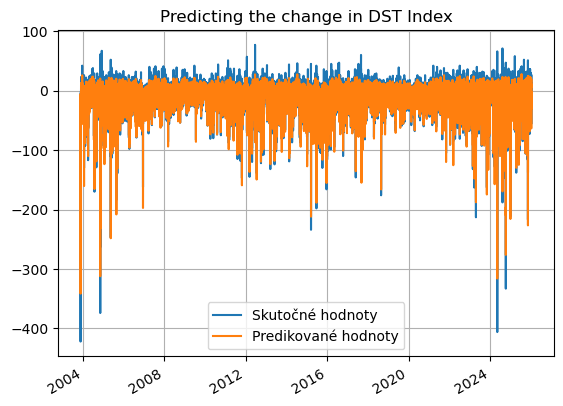

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9168177323665129
MCC=0.7458382514646841
Výkon NN:
MAE: 4.8668, MSE: 56.6978
Perzistentný model:
MAE: 5.2997, MSE: 68.9626
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 8.17%
MSE Improvement: 17.78%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 84ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 43s 48ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

690/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 43s 48ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

 19/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:08 747ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 39s 48ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 38s 48ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 37s 48ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

691/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

 19/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 34s 47ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 34s 48ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 33s 48ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 32s 48ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 31s 48ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 30s 48ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 29s 48ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 28s 48ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 27s 48ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 24s 48ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 22s 48ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 21s 48ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 20s 48ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 19s 48ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 18s 48ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 17s 48ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 16s 48ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 14s 48ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step 

552/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 48ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 36s 48ms/step


Shapes LSTM:
train: (229332,) (229332,)
val:   (57315,) (57315,)
test:  (194176,) (194176,)
Global sigma (LSTM errors, scaled): 0.40784144
Shapes GP:
X_gp_train: (286647, 24)
y_gp_train: (286647,)
X_test_gp: (194176, 24)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.57**2 * RBF(length_scale=0.36) + WhiteKernel(noise_level=0.585)


Global sigma (LSTM errors): 8.974107
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194176

In [21]:
len(y_pred_persistence)

194171

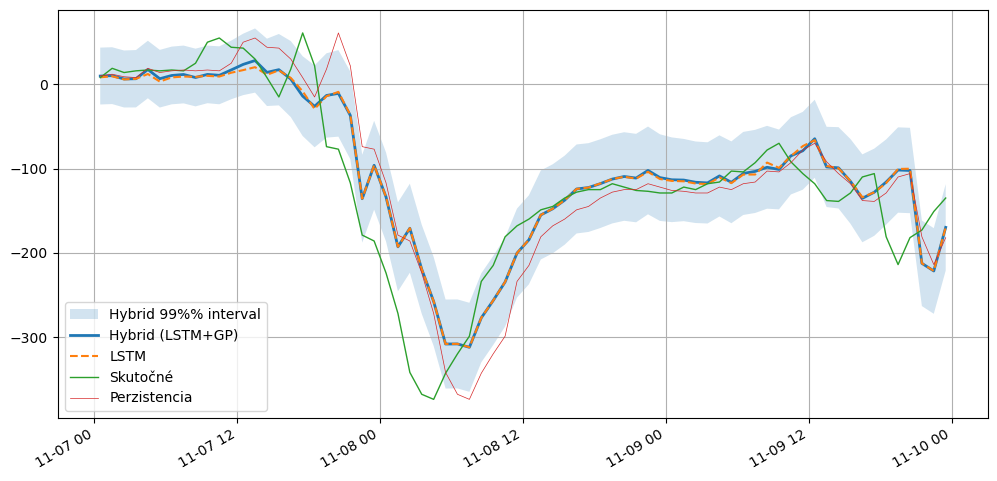

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 62.8281
MAE: 5.1870

--- Klasifikačné metriky (Prah: -20.3 nT) ---
Matthews Correlation Coefficient (MCC): 0.7237

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145866 |        6174
Skutočná 1 |       11396 |       30735

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.96      0.94    152040
   Trieda 1 (Búrka)       0.83      0.73      0.78     42131

           accuracy                           0.91    194171
          macro avg       0.88      0.84      0.86    194171
       weighted avg       0.91      0.91      0.91    194171



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9168155903816739
MCC=0.7458366116984256
Výkon NN:
MAE: 4.8668, MSE: 56.6978
Perzistentný model:
MAE: 5.2997, MSE: 68.9626
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 8.17%
MSE Improvement: 17.78%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9311    0.9652    0.9478    152040
           1     0.8554    0.7421    0.7947     42131

    accuracy                         0.9168    194171
   macro avg     0.8932    0.8537    0.8713    194171
weighted avg     0.9146    0.9168    0.9146    194171


===== LSTM+GP =====
ACC=0.9095127490716945
MCC=0.7237017163926711
Výkon NN:
MAE: 5.1870, MSE: 62.8281
Perzistentný model:
MAE: 5.2997, MSE: 68.9626
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 2.13%
MSE Improvement: 8.90%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9275    0.9594    0.9432    152040
           1     0.8327    0.7295    0.7777     42131

   

/tmp/ipykernel_207285/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_207285/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
12,2026-04-25T23:46:05,LSTM,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.932045,0.794614,"{""text"": "" precision recall f...",4.032173,38.034446,4.211590,43.257647,4.260069,12.074629
13,2026-04-25T23:46:05,LSTM+GP,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.924748,0.768567,"{""text"": "" precision recall f...",4.108914,40.169558,4.211590,43.257647,2.437937,7.138828
14,2026-04-26T00:26:45,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.931603,0.794943,"{""text"": "" precision recall f...",4.013647,37.395781,4.211529,43.255398,4.698564,13.546558
15,2026-04-26T00:26:45,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.929441,0.789653,"{""text"": "" precision recall f...",4.134388,40.878004,4.211529,43.255398,1.831650,5.496179
16,2026-04-26T01:24:36,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.915605,0.742928,"{""text"": "" precision recall f...",4.926662,57.962115,5.299650,68.960383,7.037980,15.948676
17,2026-04-26T01:24:36,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.908854,0.720692,"{""text"": "" precision recall f...",5.300624,65.438560,5.299650,68.960383,-0.018367,5.107023
18,2026-04-26T02:41:23,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.8,0.915804,0.744475,"{""text"": "" precision recall f...",4.898152,58.346062,5.299618,68.961051,7.575386,15.392732
19,2026-04-26T02:41:23,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.8,0.912878,0.737819,"{""text"": "" precision recall f...",5.083607,62.097885,5.299618,68.961051,4.075971,9.952235
20,2026-04-26T04:04:34,LSTM,24.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.916816,0.745837,"{""text"": "" precision recall f...",4.866843,56.697818,5.299679,68.962605,8.167217,17.784692
21,2026-04-26T04:04:34,LSTM+GP,24.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.909513,0.723702,"{""text"": "" precision recall f...",5.186965,62.828067,5.299679,68.962605,2.126813,8.895455
